# MICROSOFT COGNITIVE SERVICES

Here, we will look at calling out to Microsoft's cognitive services from our Jupyter Notebook and having our cloud based AI solutions provide us results.


## Computer Vision Example

Let's give the service a URL to an image we find online and ask it to give us a description of it.

In [30]:
from PIL import Image
import numpy as np
import requests
from json import JSONEncoder
from io import BytesIO

In [31]:
imageURL = "https://pbs.twimg.com/media/DNV_ZH4X0AAZIPv.jpg"

In [32]:
imageResponse = requests.get(imageURL)

In [4]:
imageResponse

<Response [200]>

In [33]:
image = Image.open(BytesIO(imageResponse.content))

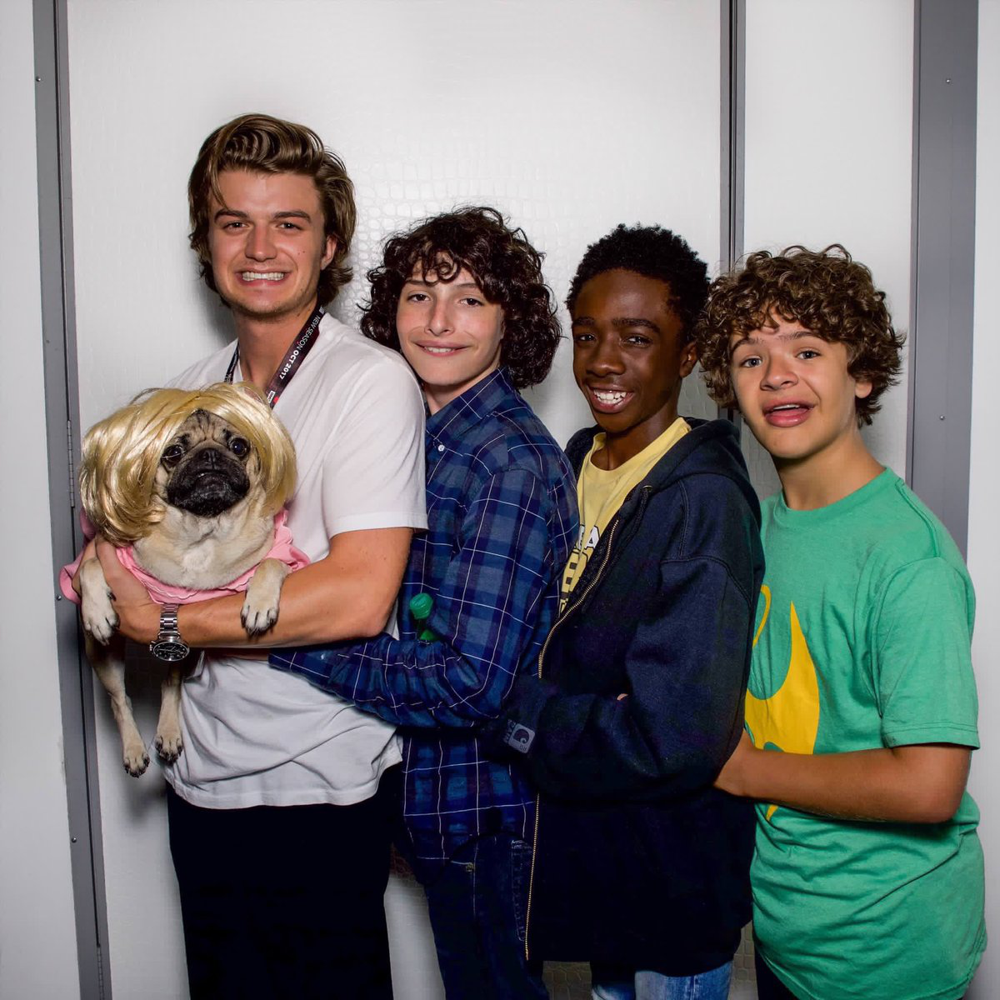

In [6]:
image

In [8]:
imageResponse

<Response [200]>

In [20]:
serviceURL = 'https://westcentralus.api.cognitive.microsoft.com/vision/v1.0/analyze'

In [15]:
mySuperSecretKey = 'a141d2b6ad804e43b069e6eb8182695d'

In [12]:
# SETUP OUR REQUEST HEADER
headers = dict()
headers['Ocp-Apim-Subscription-Key'] = mySuperSecretKey
params = { 'visualFeatures' : 'Color, Description, Tags'}

In [13]:
def GetDescriptionFromURL():
    json = { 'url': imageURL }
    headers['Content-Type'] = 'application/json'
    response = requests.request( 'post', serviceURL, json = json, data = None, headers = headers, params = params)
    if response.status_code == 200:
        return response.json()
    else:
        return "! ERROR: Something went wrong"

In [21]:
result = GetDescriptionFromURL()

In [22]:
result

{'color': {'accentColor': '309175',
  'dominantColorBackground': 'White',
  'dominantColorForeground': 'White',
  'dominantColors': ['White', 'Black', 'Grey'],
  'isBwImg': False},
 'description': {'captions': [{'confidence': 0.9897970442472345,
    'text': 'a group of people posing for the camera'}],
  'tags': ['person',
   'standing',
   'posing',
   'indoor',
   'woman',
   'photo',
   'man',
   'holding',
   'people',
   'young',
   'front',
   'brown',
   'smiling',
   'group',
   'room',
   'food',
   'dog',
   'white']},
 'metadata': {'format': 'Jpeg', 'height': 1200, 'width': 1200},
 'requestId': '1e244f2c-437f-48a5-9d85-9f77683a3266',
 'tags': [{'confidence': 0.9995315074920654, 'name': 'person'},
  {'confidence': 0.960118293762207, 'name': 'wall'},
  {'confidence': 0.9593806862831116, 'name': 'standing'},
  {'confidence': 0.9363083839416504, 'name': 'posing'},
  {'confidence': 0.9028338193893433, 'name': 'indoor'}]}

In [23]:
print("DESCRIPTION: ", result['description']['captions'][0])

DESCRIPTION:  {'text': 'a group of people posing for the camera', 'confidence': 0.9897970442472345}


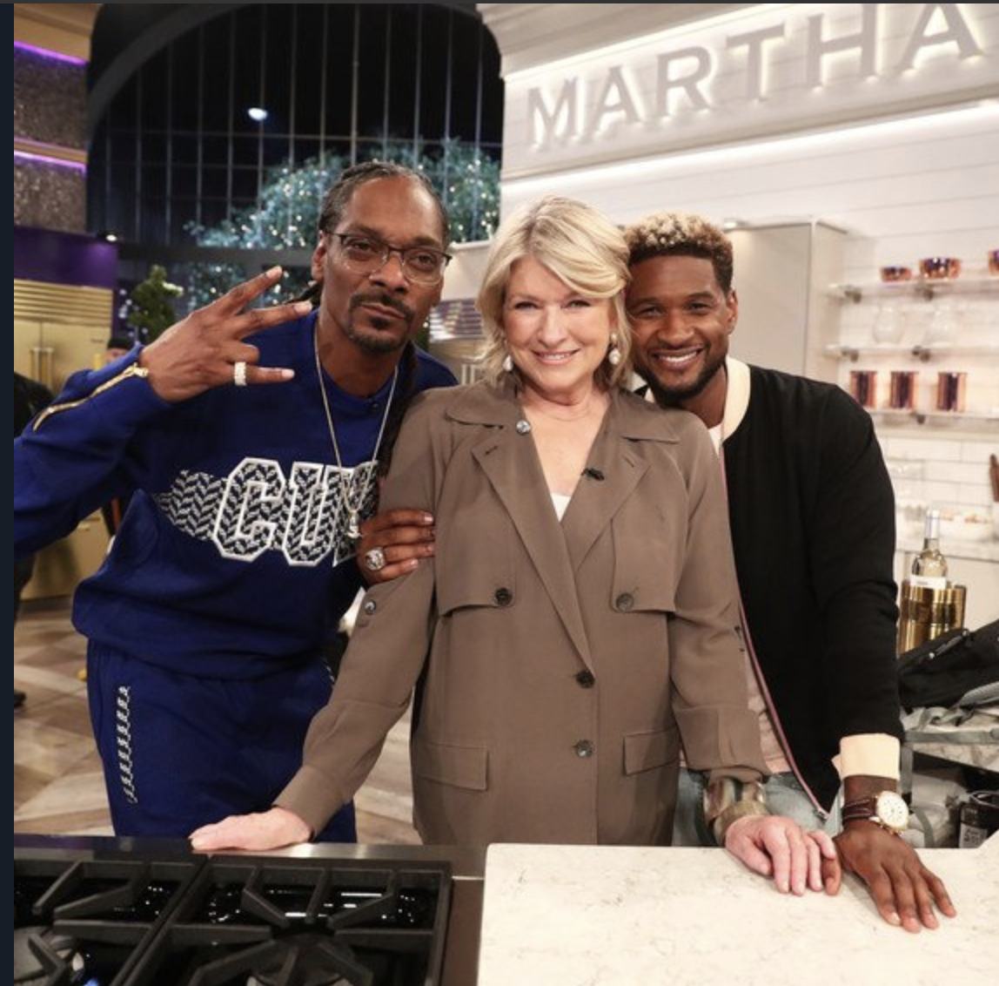

In [24]:
sendBytes = BytesIO()

localImage = Image.open('images/martha.png')
localImage.save(sendBytes, "PNG")
sendBytes.seek(0)

localImage

In [25]:
def DescriptionFromLocalFile(file_data):
    headers['Content-Type'] = 'application/octet-stream'
    response = requests.request('post', serviceURL, json = None, data = file_data, headers = headers, params = params)
    if response.status_code == 200:
        return response.json()
    else:
        return "! ERROR: Something went wrong"

In [26]:
result = DescriptionFromLocalFile(sendBytes)
print("DESCRIPTION: ", result['description']['captions'][0])  

DESCRIPTION:  {'text': 'Snoop Dogg, Martha Stewart, Usher posing for the camera', 'confidence': 0.9662953916555828}


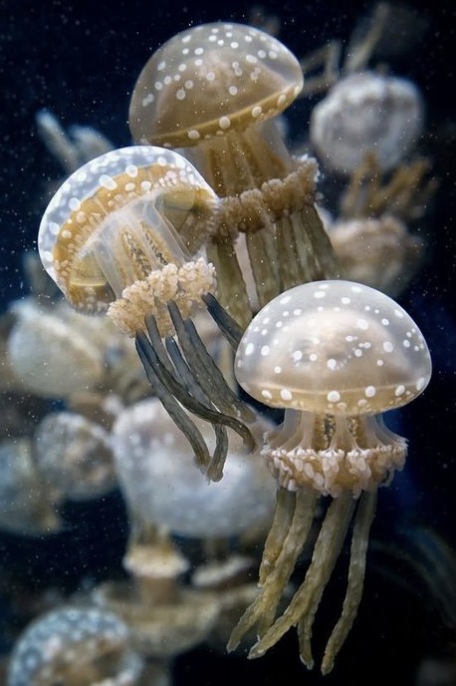

In [28]:
localJFImage = Image.open('images/jellyfish.png')
localJFImage.save(sendBytes, "PNG")
sendBytes.seek(0)

localJFImage

In [29]:
result = DescriptionFromLocalFile(sendBytes)
print("DESCRIPTION: ", result['description']['captions'][0])  

DESCRIPTION:  {'text': 'a close up of a coral', 'confidence': 0.6857599784584003}


# FACE ANALYSIS

In [13]:
!pip install cognitive_face

grpcio 1.11.0 has requirement protobuf>=3.5.0.post1, but you'll have protobuf 3.4.1 which is incompatible.
pyasn1-modules 0.2.1 has requirement pyasn1<0.5.0,>=0.4.1, but you'll have pyasn1 0.1.9 which is incompatible.


In [4]:
imageURL

'https://pbs.twimg.com/media/DNV_ZH4X0AAZIPv.jpg'

In [5]:
import cognitive_face as CF

In [6]:
CF.Key.set('a141d2b6ad804e43b069e6eb8182695d')

In [17]:
CF.BaseUrl.set('https://westcentralus.api.cognitive.microsoft.com/face/v1.0/detect?returnFaceLandmarks=true')

In [19]:
faces = CF.face.detect(imageURL, False, False, 'age,gender')

/home/nbuser/anaconda3_420/lib/python3.5/site-packages/requests/packages/urllib3/connectionpool.py:852: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)


In [21]:
faces

[{'faceAttributes': {'age': 8.5, 'gender': 'male'},
  'faceRectangle': {'height': 142, 'left': 868, 'top': 385, 'width': 142}},
 {'faceAttributes': {'age': 29.2, 'gender': 'male'},
  'faceRectangle': {'height': 140, 'left': 660, 'top': 366, 'width': 140}},
 {'faceAttributes': {'age': 28.6, 'gender': 'male'},
  'faceRectangle': {'height': 133, 'left': 248, 'top': 231, 'width': 133}},
 {'faceAttributes': {'age': 22.9, 'gender': 'male'},
  'faceRectangle': {'height': 133, 'left': 465, 'top': 320, 'width': 133}}]

In [25]:
from PIL import ImageDraw
from PIL import ImageFont

In [26]:
font = ImageFont.truetype("Roboto-Thin.ttf", 18)

In [34]:
draw = ImageDraw.Draw(image)

In [35]:
txtOutput = str(len(faces)) + " faces found."

In [40]:
for f in faces:
    upperX = f['faceRectangle']['left']
    upperY = f['faceRectangle']['top']
    lowerX = f['faceRectangle']['left'] + f['faceRectangle']['width']
    lowerY = f['faceRectangle']['top'] + f['faceRectangle']['height']
    draw.rectangle(((upperX, upperY), (lowerX, lowerY)), fill=None, outline="yellow")
    draw.rectangle((( upperX, lowerY ), (lowerX, lowerY + 56)), fill="yellow")
    draw.text( (upperX + 5, lowerY), f['faceAttributes']['gender'], (0,0,0), font=font)
    draw.text( (upperX + 5, lowerY + 22), "age:" + str(f['faceAttributes']['age']), (0,0,0), font=font)

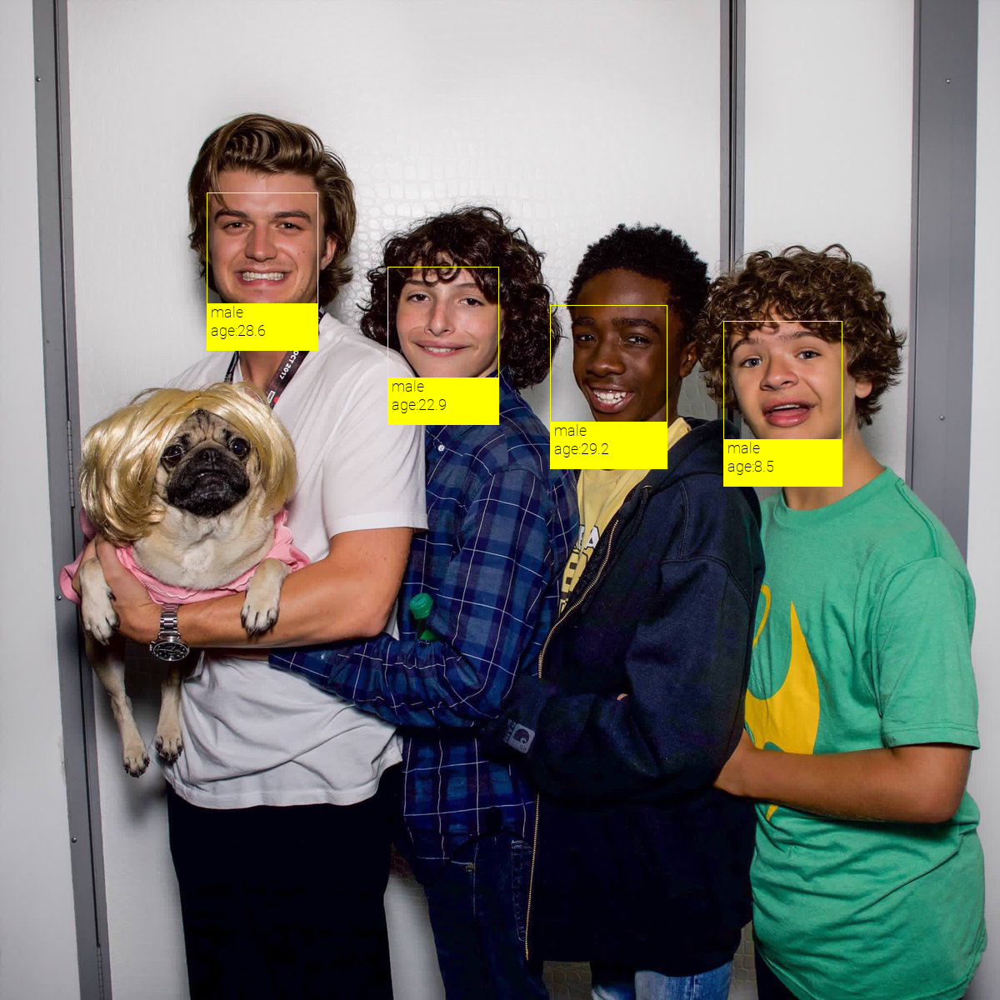

In [39]:
image

In [41]:
!ls -lsa

total 8
0 drwxr-xr-x 2 nbuser nbuser        0 Jan  1  1970 .
8 drwxr-xr-x 1 nbuser nbuser     4096 May  8 10:47 ..
0 -rw-r--r-- 1 nbuser nbuser  1312709 May  8 12:14 01 An Introduction to Jupyter Notebooks.ipynb
0 -rw-r--r-- 1 nbuser nbuser  6294096 May  8 13:23 02 Calling Cognitive Services.ipynb
0 -rw-r--r-- 1 nbuser nbuser      917 May  8 09:55 03 Your First Neural Network.ipynb
0 -rw-r--r-- 1 nbuser nbuser      555 May  8 09:55 04 Using Keras to Recognize Digits.ipynb
0 -rw-r--r-- 1 nbuser nbuser      593 May  8 09:55 05 Your first Convolutional Neural Network.ipynb
0 -rw-r--r-- 1 nbuser nbuser     4579 May  8 09:55 06 Transfer Learning.ipynb
0 -rw-r--r-- 1 nbuser nbuser     4696 May  8 09:55 07 Style Transfer.ipynb
0 -rw-r--r-- 1 nbuser nbuser     1535 May  8 09:55 08 Your First GAN.ipynb
0 -rw-r--r-- 1 nbuser nbuser    11464 May  8 09:55 A1 Exquisite Corpse - Preparing the Data.ipynb
0 -rw-r--r-- 1 nbuser nbuser     1558 May  8 09:55 A2 Exquisite Corpse.ipynb
0 -rw-r--r-- 1 nbuse

In [43]:
!head -2000 '02 Calling Cognitive Services.ipynb'

{
 "cells": [
  {
   "cell_type": "markdown",
   "metadata": {},
   "source": [
    "# MICROSOFT COGNITIVE SERVICES\n",
    "\n",
    "Here, we will look at calling out to Microsoft's cognitive services from our Jupyter Notebook and having our cloud based AI solutions provide us results.\n"
   ]
  },
  {
   "cell_type": "markdown",
   "metadata": {},
   "source": [
    "## Computer Vision Example\n",
    "\n",
    "Let's give the service a URL to an image we find online and ask it to give us a description of it."
   ]
  },
  {
   "cell_type": "code",
   "execution_count": 30,
   "metadata": {},
   "outputs": [],
   "source": [
    "from PIL import Image\n",
    "import numpy as np\n",
    "import requests\n",
    "from json import JSONEncoder\n",
    "from io import BytesIO"
   ]
  },
  {
   "cell_type": "code",
   "execution_count": 31,
   "metadata": {},
   "outputs": [],
   "source": [
    "imageURL = \"https://pbs.twimg.com/media/DNV_ZH4X0AAZIPv.jpg\""
   ]
  },
  {
   "cell_type":

      "image/png": "iVBORw0KGgoAAAANSUhEUgAABLAAAASwCAIAAABkQySYAAEAAElEQVR4nOz9abMsObIYiLkDEZlnvWvdW9Vd3a+7rZ/6PY5GejYa8QNpJsloNJOo0Qf+U0lmNEpGjc3I7JloHI5IcZlpNl+vVdW1193PlpkRgOsDIpAe2AKxZJ489x63W6cyIwGHA/AdCAD/u//2vwcARASA4AcL5gkR2c9+Gb+uEEJrrbUWQiilpJQvXrz4V//qX71582axWJRliYhEhIhCCERUpIM4lVKIqJRaLBYAYHC+ePHi3/3bf/PmzZuf/8Vf/K//y//V9cXler3+yc/+QgtJCIBoSgqCAhCUVpX+y1/94u/9l//LzWazWCxQCkIkIg0kpUREpLZrRKazApqekgVsvmo2DogIAgEAK8XHwXQKETU0CM0A2lFSRBxJg6pbkpfXWhu0QghTTGttSpq27HMDprwBS4wdcz6n6Xk0VcwHrbVSyrRomgNnKFh5W8u2G2zL4nGA2vFxHnKczvNgLwzBnG85q9vPdtg5n/MPdniDJDmF+WcHYVVV4E16TKDsT5a83iq8vw4eyzMGieF8vyOxmfIR8lGSUhIDnx6nv3y0+Qdn3OwHw88+quD4J8YzwfOWJN6Loihi1YOfe2WKumCF14q5nSNe0X6NzW+MkljJmNxxIoNIfCFK4MmnJw35tXx+aPQAaQDA9kfTeSSoqgoRBQEiCtjy1Vr08InTirFTEBmfhExNKUDdUemU0a5AmQ9CCDuz1oIQkcPnvHW/6aDatMYoTI9oadXEh4iIwozY0s/7qAG01qauNaxN6wjA5td8sMi3894+rwvXzkKIRS1+1IFpReqMgNYadUuPYLoOXeTK86Y01YHh9SSRl7FUmk4h+920qLEpSQCyHWbdLdOOLBlXTSIqpeq6/nf/w7/78us/nz18cFNtRCHBOFSAJQqqK631P/t//PP//Nu/Ozo5OXlw9k/+

5k7XWKM8aPQWiuldLWaBuiqUZwTaqS4irwvsMf1aMBxYl5FJxfVY5MTTwVVgbOml8cHTTonInTa1iJjjLsLyZehXq01Lc/yAB7tY+PydE95Gogq2QGgQQatgqvJ7LVlXWq3Y9i2jsWd+WSMVaX3skBdRCMiQ1bib63Fo/wpm87kejpvcQgfN0uUUCaoKDMKrul6lUCkpa1WFlsl4sFRD4JT2w7cplDttuhWBGqKcxWea3TGKmgaBNBGiGdmuapddbYWTmy8ChcsGiwxwRGx0IoQg25nfDh66513RgeH0/GkSFKrFNgFP1gLHudaW0QIBQBatMA4ylBEncD5wGEYTufxfD53056maZ4r4QkkIDBEBoCs1pGQyIgzi0bnSWIC7Pci2R0maSGEEEIEgc85E4KnaaqUkmLhahZFAWB63SBQPI5jX/geQyn9wveEEGEYbPUipVQgBXY7hdEWaGdrmOd5odWgA1ZzJrjkSETu9vmiKAyQJ/2FumVgLSCZJJ7m6Xw2XnwE6E5sbvUHkvHLO7t5npsoNMYURTGfz2ezWZ7nAJCpggN4nnQq2V35YLXuRZ5jBM4XEg0ADBiOjHMeSglk83ReFAXjot/1HR8RkQVCANIqNzpN5xyM1caCMUYjWWRCICNml3leES1Z0kDG6KIg8/GPv+gHcjQ+KIoiSwsAsNpklFgLbo/RubW+7zspD5xZo7UqUEoozOTwQGVpt9v/1V/7lZ/5mZ/5whe+8N/+t//47/7d/2OWzn/33/3O5z73uSTOStPEgZM5TmGUCYor3/5R1Zosydt5j05clBK5mtP4tPR/TjZZY2hWZWA5iqZhvd64vFi4EKOkCs2BNH/U+trQ4KsK3jPjWfUGYe14q/iwyrXgFwWt491koU+LRtPXhTYtdoHwmDSag1IpP9ZeHjdUR3FiSTheshQdTmDiMrSxyMJ1PHzm7rwt1736yrVWHomvci5jDFZcpH6x8JiczPNAzcNprtEzguczD

2W0AFhrkTR7GywbSqG0iRhCcry18hJFrEAohD10qei9Z+z8VRhgNBop1SiFKJBpPckKKRwdzJZZVpdVEMGL8ch69/zi7ODkuCFBQC2IqKS7vRfkZwz542GdiV5EUBSDKNhQrhAUtM6Trf7G0HoHKqNFBBmFGUNQQ9WNj3jwDKAEhcEJoQCSyokItUadkVKkFEKIuysiHsELKmFGVB7XiSh6I49I0FrMFaJCkXC5GXEd5g8Rw2XcqKuAQNQJgQUhuJW2NtJORmjLQvtfa0Nw7F1QIAVBhIK8rhSRJwIBzDLTxVwJ2i8rhUopZo9EWmvn/Wg0Wq0WeZ6zuOl0mufGufzBgwcXF2dVVWWFYXGT6WixWNzP7h0cTk9PTxGRUB8cTs8uLz/99NPz81OTTxw7UsDsnLMptd1FFiSJ0hlv4qVCPycRLOLDoKqt/RLTS9QdD0vzucdNEYWnqHikglrQ1rCzSQZCiomZsbe/wlsxOGfUMGXzklvMF4+JBVJEAAxhiFujg6NzJ7Izd/HA2EM4lhFe673W2qurq2fPngXV9+Tk5PDw8OTkBBHDWUBo9OzsoqoqZs7zfDQaBcSurq5CA0VRhIg41tqqqrz3lJGIWO/CBd7G2cZ6rX1ZVdETtQsynWdZVpelUirUEG8Pdmt07eoZTZ3r1Z4MY/owsq10taRLZRfpTiWMdKJhPy/YxKTHvoc47GkarkfkezVsJdQ9NFIX2V1M/JrQ24Mp2nvKX1892PrTS7nt3cqF12Syw7XxmtCIq0I2NMCNwh2H3Qi15b0HBXHLt3GvpJOyOmKicE3TwN+NQri1I19F+Eoj//pgOCxxp8dz/6gQdjS5bxV8dRH61nRsd41b7ph039K4Mi0km+vOOpXCW7tDGOiISiKA7yHiw9Yjm8GgWLfZ0QQAQkJujRSk+dxk0qmCiAjRZbT7sL3pwXDfYh3ceukMxThIuny7Om+Nxv5eDNdG5BCpICXdwcae2lJha10bkClyU

/Dg/s9+9tO33nrrrbe+rJQwxkhZ1ZVJ01T64B4XzpFSIiDlNhUpV7j/obW7tI3kb8Mjn8dN1hS/S+W2LmFvPZBdYs7Mn3z00c9//nPn3Le++WtPnz49fHZQOFeWdVUVDRfGJmkZAIggOOvKsvTgFarApquqCike1BStWUHCACIiMUmQvHIYhpi9tm8NnVy17s4JsxEcjJ49O+6yxbWZWZvMViC5VAYlIgZuy0vASsFun99mMK696OKKrDFWGekYYiICoH6vh0J450tXpFkW/ORVVd2+fbs/HEmppdTWu7DWWikib2tjHceJJqKzon6rUgONQfSFjc+35wk87Qbozr8Qgp2XK6X67JQ5J6UULMPyJau4DCLy1iZJpGJNJBEDHa4WC6OEYPZVUVdVZUyFiFGktVanx0choDeSIok0KsmMQkB/2Fsul/1+v9/vL4t8Op2iFAiyqqokSRoEb+ayzCUKckYJWZYFeZdoVRTFJ3c++uH3f/DJJ5/MKrtcLl+5cfNb3/rWO++8s7OzHQwWo9Ho+pWrSilra63UcPjqa7dvPX78+Mb+3rXdnX/zb/7Ng/t3f+/3fm86nfzoL/5ifHAgAdN+b2/3qqnqsqqTJKuLsizLNO0lWRZFkeopZnbGKoGbmyNTl6aytXeuKienJw/v3//k448Pnj5Z5vlsNrt+/eb1V27+1m9+9ytf+2pd18Y4QAECWYgyrybzmWCI4viNL31pZ3MDvTuZnKoknc5njx8+urP3kRDi2o3rRGRtCYRaa+MsEPd6A2P8xcVdk9/Wjsmll116+8Wd8+I/X9wuCooAsKo9eW6Xdjt2Zg1sChJe8DG+XB8+U+ZfG/UXInt3H9K8a83CgwgQuvHFiPqqOy9rH37VDbEB9mioqhQhGsQxOCFZ6VabD0Q3XHv2JwB2rIMAwNzWBmhQ451zwfjUndnGoOW8c04KgaucgYvGUVjzSXZklM8xb5decPGbL2T+L57kz3djy+Euanp4X

Vkul02y/omqbTsNtNIiMcuyyEEpsNaKRKVUbvVqtRJmq81isXj29CxGGAxMUZREvQ+cAG2MwXvfK0JEQrm+vkaUjaxi2E65YVkqY5f10rmQ5+KcS+zE6QDGteKabKpGv9xL/KLxU/3tV49/AQ3+/wv8S2MLUr7otz+fs/3aodNzW9/K9d0E2vTT7yZkAABZgH7Ge71TO/nybyAipQAaAyAS2kwjSoyeOYhYZiYkIoypaHt9VyIACK4Dn4ksITV+yE6WzwVHz4tPUAJBVLmpKCoAYAQB8ADIgAAEDBEwsAEiRcuusbnxEAJFDSQbyQrZEHxv2hFfHohIcfdHgI3Hu42dvCz/t5NI3P6//eVLNkNeadjbwlrZOdXL93mn/QC+2AJ9+dj9iJ1rf/6JL02Vlz7l1S/16vmTo5N8l7TFbBkRthAupQRToN05l4LuWuuDg4M1/XGk8WB0eXmZZ9lgOokxZtXQtd1gUNV1myY1bMjxFFHTSu/AGvIeGU0AtXJhb1B512kDijIlBrxIH0GzQnRF6Dh4ICTbRRUZIuUBnQOvCgNM3kXISJe5A4h9PylUCG6M0M7bpvn87Hwejs+H00k5Hh5UmZ3Fs89Pz549O6dPlUbXdurZOQBYa4dFuT8eE6BC1KQ4iACVk/GgqqKxTdOAEiJ61DTtBx9+/4c/SQocDXwUY2zqrhoOlDX9Z48fTyad80+ePLm+uWHm4w4mVu2XIxaGZlXlphxoMyAzNKYwZC1DdE5UVEZpjQjUKmIWjjEAsDFKkHvPSmPsvDGmHOcheNd1a/uRT33bMDoRE1wosmxaFkTgmWNwAUhnueVyeT276mOwoJMfywgAKLAhglhzbRMQCCfOPmMltyRIIFEYldZFnjvndIzj0bhz/XzehND7EBBVH0Lfw2hkM6UHI8uC2pjbd+89ePCWIhNddOCKQlzX9z6ISFt3xpjpdBpiB8KlzWyeWWsvLy/ruh4Nhm+89fbf/wf/8A//7f/yf

1fXXrl988bVul5du3K0vJwbZbIy9+J1lovSl3ULpojGEEjngrVWGJObR4AEaJTWpDjEKBvMOQJqlUB0aRBabWxZlXnhvVcEB/szZp7uzX7vt//6wXSyOD/70//tX509fHhxevH27/8eM08mk+VyOZ1Oz04vvvf9v/y933n7t7717Vdv37z30d3Tp4+dd6W1beeUUhzjeDzOjY06mBB4qBdCQkqVShFAkATBxaiVaYOjtkGxVnCW54u6RiEAo5QK0aPSRZEJOAJPmQkQbW4jYi9MQMBiCCwBoiBy0lqgPGOQyFzqTESid5ByNFrzTuYh9VvgaLQCAK00+ghIYMuOQxdx7eq2bURpy1FTqDDu56pUQhAp071EFShVGhkW4BA51X1hlKCQGOJAjSYqpXRKSyGVBG2msAuRtnXdIXrvDTMRZMhW60cuRGE3X4Ki09NzAfDeTybjGCNNytl0PB1XKAyRCUFE7LS5PZkCS4we5Egj2MwYpbcSppRYUmNUBspRlhdIOkfn14mRVxlCgyxVVRK7UQa9ExGx2rbBK8pyEMRUkhYVqKqsAKB1PRE1fVvmJWq1Xq+11taYtm0NGWYmSOATREAGVsKIFICJINlACtHYjJkzk5dlOZ/Pz9rT2WyGWrdte+3atel0/OMfv3Pv7kdvvfFatjd9/PgxSESFTZCivG2MevT4oRcOKLXvb7z2yqiaPHz4cH+9Wi6XZ09Pl/PLZrk6HE97ktlsOj+/sFp3jtvO4YGtxiNrbVkVwOJ9XykSEb9aWoSoMKLywpqEwAsEYdEACMAbXwWIERgwCGAAhYBqSAgCACMPkVtMONKtnYnEwkYsIRISAAkprXWmtAYSJq0NAsaAAKABDWgS6kU0WtIqBuhDH0IARYnDgrRSSrNI63sAiFECR+tNjN4YY21Geqj87PveUpJ+hcT/OkA8hCIGIFZGQQQOzBuIRAhsjNlyxiCiCIcQjNJEpERxEGXIGsXMfoMUtdaS0W3Te

O5DZJJY+8KQa6G3pu6blRPLy8YnaL3tQmfQGGOcsz1zH/hgenD7lZflo49ijMv10lvfpkAAyAIABzu7J/MzjzbFeHF+7r3PIkOTySSEYK2LwqpCaNZ9Z7zXwFFFQCxZY20MnTLs7O7u7+8/fPgQ12sK1IRGQR25/Cpfri5DqETxfLEoiuo3/svfeuWVV3Yms/ViNX1h0q+bWVXvVGVzcR7nq9u3XjnfOWrbFp0VZ04vFi9MR2qoD8GbAVEL4XRv11SFTT2lkDqVQGRNSJJErakCJ0RjrCWyESMzV340mU2mvsiNVYYQAN6/835V+mvX9hWhrkZpGdtmSRZEU2IwNiiXCGJREUGEFTJ3zjty1paFnwyAEDjbEnepirEzxhiSPjZoXFlXTbcmR30b0UBhHQAIECdtu75yZS6EigAaCn0KIQGhiKKh8Xi8XC184Qdim+rF6ZiI6rqeTqfGYN8HISvGcghgSJOqMmX6mSRv7cgsCoLIKSY1IBZNbyBllyogzMIyiIoqCAhitYft4p6F6whBTRRFIkYrTByVE2syqAapy7YpBiBXOwUAEhKSBGHm7KmJiNPpuO/bNrW1QeNJWaJyUrEECsAivnSusKNJ/eDBarGYIyIia+vI+3JU+MLE0IRujaR17UK3tmReevk6AgHQ5eVyUuw0vjufr0sC4412AACu8GSrovTSrlO7dlYkAjDMStmdWpG+8M5ZQuKmXYS4urzEi4tiZ2enLEY3X9w3xty9d7RuQ1WUEiEkLvbg7rlqeXrthRdHo1Hp3biwtTEOaVKPQggWPPmia4OYyhSWRCs7QkSESehTLpI5IQVUtElSFIiKIUTVIKpYVuPxJLsyTqfTPJ8gkCksIqq1wqlZdSn0VVXVdf3g6GwymcyXq7KqjS+PTh4p0mx396OHjxbLGM+6O3cfffnL36iqarVeN02zio6oWCzmXdfNJpNyVEiz8o5SxJ1RkThKTMDAjYaYLLi1rHLSU2JYLM77x

nEoqANlVCFQAhTsAlGdqgIOwqgGsAuPDlXNRKQsHdvKuSElvZBa1H4aEgASslKKE/W2V1eoz8ye43w0ns1mKui9B0rrdjxfKHpnOB1vTMclMzxpChj5lgfq4NQVqQbSECmwIVSloKwcQRhEuwy8avJjErgoEcGnEjhE6ude1xFbyy8kXbduMzrfoACgQ3JYgwbBghICAYqCSGRWYIjJuTYgkReLs8KapN6u5AjQABIBGgtoRGQ0GjlLqNFaytISm2XG4N7u3vXr13d3d4+Oju68/0HTNCZzTdOenp4CmTzPQgitFyJbliVHaX0NAIBCADs7s9lsR1Vb7+u6NcaM27H3vvUBFBxB4h0t82xU5GXmEKRtWwuMAKSE1C/USkoAZEAUuQUVUkACgyhIAMoCBtEiMkIKMIiIgiCBGkJBR0YAjZBQEl9AYy0RtRJijD6EXk7WKEUismpBLUKGBpKOoqikN9jNiL44thFBUXGk3qZ3RjYo4c7ubvQcANC6aE0V4/FytVyvPjncPHr0mLI8m+47ttY4h3T24OGiiYd3HzKzIBhjRtOJMeaT4+Xq5NAiZc7MJpO9+Xg2Hl072CuKIrLkAKIkgEEBVToVYRiQLGoT9JoMpHJqIMPKvaufVntSAGUCQ8aAahRJx85ms9W6MUh5UZJzYKxKp0KcVq3JaFyWYIyxJttsNpumFobNZtM03mbOkFMg6XmAkqpq0zRtE6AAFsaIzHJ2tpjNpqK6XG12dnZEsa1rjZyCvABAZAFENdXYc9M0qcQmZa1DCNkoz8tif38frT09PR6Npwcv3CiKwjqn2AnIQW/D13W9NxptG+Spzms78jWUkl3wDp7TPp/Zmdplq/Wya/CZ7+H8h4PVsW0zn5//DzVDuO0DXLCo4BImfvu2tn/+1LM99ULbZxBRso6ZnXMJ25mIj1Ip+bN+u+3pQf8C0jhIwD/qKYlTcjlVrw5mnHOOQxxyiUmONumSDy74U92ebe9/AEkbg

1uu7OfdMsrI0MUqO8GBVlnmUJ0e54PB4V4F1bVyQ8G092d2eJUbFgOs4m6J7PI4QAsTyJJfS9d0HgUvxl81kEQWkVQgg2ENFkNvHsT05O58tFBiOttTFN2KpljTECjF0IoS/QBolu58XLldiq5PlDRGJrmahERDhqb6EL3IFAgOiIx0grG2QxoPM0N4jemuA6H7ogYfM4xEqgh3fRWE2BiTkYkzRenp6enZ6foaayHAWiqqm9cOCgFAFwCGB9KAuTJvl4PB6NRnlZTCbT6e7O06dP9/cODw4OYqE1KhMFabAcos66QOs9Z1xfGrBJ/AxLODqE2HOIfMLJ/ujxKX2QYbZhs1SfdyRexv0NCqffTC+bB59Gh/8xx6W2E8N45i9/HONCTLdiojIwgm6aB8aU+qaKD+DT+fuylXO44vfG4PFgzPW2DFFkaEKiaCY+E9h55eaH8/+Rk7Z9Gxcm3eavV7rWPmMDAIBIJr35YXvfggulcXEGIgriGRij4QYQq+8Fwnq5QuCudidPHq9Wq9moLI8Ou67LVDg+Pl4t58BeQljMF0VRfPbNN+pqVddrYac17+9Mk1QDCEK3V2rvgRQABOLgbAvMIYQBqKBJEWlmdsGJ9zrpb48jysdVTSvMsF6kiclOH32UZHmalFlWTCazVE3A1W3bdms0RjMyIgZ2Xdesl/OmqRVBonTTVF3TZqnZnWSzg73Tpx8CwM3DSaKJpE21+HZ9uDd2rukcl3k+GmW2q6rVYr1YlMW0rVchBCLojAGANDM701milYc+RqCUKdIsEvEf7d05PTs+Ozur67ptu9WqznM7mswePHi0f3A0nc6sk65zrus8Q5Io3pSYaq3ZJAjUNnY+X5dJYpS5d+/l9XJxeno8nY5v7t88Pj4us5GzQRiTKPnWhhA5AIIxSSomgMTGjXXTeR9u7t8SpU5XVeXssrWvvfW5tmne/va3F4vF/s5uOZ0en5ycV9V0dw+AgmAEpp6cnGRZ9nM

RYuc4YYdxkylIkQNhSNO+7x000tAJKYb4iQtDBlXdcAYIzx0QOAMdx2q/W6/sIXfuZX/sZfPT6YM0bRELpBNTLR0K9ZcVLsfeq1u7/xa3+968Pb7z0I/frs0cOuj2SyLMuiwKpZFa4IGNO7SAjQEGKMG1GWZVlVFYgYQvA+AKBz7tGDx1mWLZfrJ0/OLZu2bevlqm17RBxi8N77hI1PEY2tn7+zHpJEgvPLS7u2WZZN53uzvX1FOjt/0g59N/RkGJPxTYzbNgMCgEyArAKJN0BA63Vry4IIKUofqfPSDEOR2V7E+UDAyKRAAgQQo6gGwSgRFYAUgayxuXOFtyFI3wmFqOrBKygiO6NI0IXIAIJkmTgzVOVuWrmidC7LsgyZeBiCRGQmYSI9sLkAOeeKomDjRETRkDFXV1cCev/0QYzxcnFxfnnuQ4gaOukDSyQN0kYR63g2K/cPZwAKBECqDJqYbxP4JuXGn2OBjjEyb0xKQoNbAY5bKHKS7gAqoIqghCl1BKqKoKK6bUoRQVEBQJEQ8SnX6FNlQYpIjAnJDoaxcBmS8V0jfWoywcmKiCo+ht4PeZ57P3Ftv1wNbKHruiAymUwXi8VHH31069btDdkVbsrycZOzYf0YapzdYNazZsBI5PF0whvIz4v8jr7vt3FG1G2UKmn53TwNbLU8/QTVcLuXGONf46XT/5OBkRpOjLFjVY0/Lon3vEnzcYftjmuxv7+48UwN4bXX88njP9En/ISHMiqwhEoaHULdOGxbW3PLtvTCkzxvdyawaJ7nh4eHt27d6pqmXq0BoO/7whpETC2tARR1U9yQEGW7CLQYt82g45btfecqiEiiCMhsVGPom3q9uLp80qwXMTbt6rLrlgTBWUCKDEpMzuVN06jG+bRCiH1bO2cODvYmZZWkxua2dbMsXOq+jSwihKxIMaRpE5GJosPg27aLg98g9Iity/b2j0IIbdMD2sl0vr+/33VDlika7Ps+AsagiujyU

3cFxG/iF/8wlvrDJEBR8ZbV5TOe18gGqMFQ2+tMaBETSuguAhVBnbnXAAkogqIIjKICFgiIGIAAEFGIAJAA0Yj20yD2oxo3z4I0YA7AUDndb/u2kSEs4gAoQE0PLpCQgBgEYbh9lkYknQggMOc+iFmBwCViNs32iVHw4mBmVSpJiMIAynKjlkgA2QgYQIUkce3mMmsQTZN1xbFxliezOrDo5psVbqaYduFqfcHkxoEN10zh5kjp2rnOWcUQSRGzMjGECNDTg7goChfbLYzNMvd+eacNePfdV1ZVbCrbyNi3imuj5K5I1YZsykv+Wj4sbb9EGIMGH5SeCY7kqMADBJHY4IDIYRkjOMkBl1KyZkCc/iJ4O1Pejx/ogrhn/Nm9mZ0KidE77S+u4+Yx1UBe7mx4d1dRiol0MRhURRlmZS+4r2fz6aTyjerEGMEyYXhy8tL59yDBw+I6IsvvphMJs6Z1XJZFd45l0IXc16v1zH2wmxqO5lMDg4Obi6vrLUIBhGGNB5iTsPM7rGKNZ/PCdCibdu2bfvZ1IEZRoRzCptmSwQo0LZNjNEg9inE2KeUCIdd6foOMTjnnPOEaIwpiuLo6Ojhw7eu23RzcyOZ23Z7eXn5Mz/zLRD59PsfHx4eFkV1fn7uvW/b7Xa7/fTTT+fz+XtvP/6DP/j28uZKJOvhbTarrusYaHGwYOa6rr94cvbOO+8cHR4+eHCvTV3TNMzw1ttpvV6fn5/fLtfL5XK+vDo4nNeTcnl7W0/Kn/3Zn91sVh999NFP//RX33vvvefPzw4O5iEkACiKIobc9/3FxYUxZrlcfv/TT87OzmazWQjBey8cNXWaZFjhzFwURV1PM7OqTSCi3srVaqUGenxaQgjr9XoymehTkXcinGNpN4Qwn8+J6MXTZwovvfe7AiYsFovDgwNjTNd1ACASyVo0Bo2JOW+ahojI2tVy+dN/6S81TXN5eTmZTFxR9CGElKpJTUTHx6cWIcdOJ/Mm1X

YhotVqsVotbx0d2GHJ68vT5+Xa7vbq66mKqgkspZwUEcIbCUWXEu7dvb7fbpqoY8Wi5/MH3v8+I9+/eUdXVanV+dpZTlFJUYei6unJV8Ch4fHz8Ez/5zmLW5Jze+eTbfeqfPXu2vr68feukKtL3fUpD0zT37t8NIfR9n2PcbDaW5lkDVkS6fuu9V4D5fM5IIrmqA4EqlJSGruuyZABo5rN9/DSfz7kKfMDjUiaOchEB1KZp6soPfefr5uLsGSKy97tuqOr5bL5IEVTRuYrIE3DcdkLYrdePfvDh7qrLXdICAvH4+OTZ9sy7arVc3r11++nZc2aWmADAOVe0sHehrguCMbIiIpp0AYKqWuYx+oPJWpkpUxWkm4FvPPjr/gHcP6f2ykExW5BHgQRmNmZRKFJUUUeqBibayzDAgZvZ41R1pOeifZiCB905ESkTEds+bMUDzPw+fLW/7X3eS/8eus4xqNontwATAYCFDpOd3Fu1w5kKAN3z8bxouPYpnTGdCWiWYqZMRjCWjBGViA1SdH3XdR1h8HXlPVu6aHzlpZSqqoYULc5mZuZ0fX39yU++/ZUH32QKu93u8ZOHTVspwnK5JKLFYnF5dQEAIQTNxVUu1P56s7NX7K41bYXAm90OVaWMqyXnXKQwc8XeOcLUDv2uzxmJCB0pgJZS4PLqctbMibFkUcSqrotIjHG5PGLmGGPf74rCwvu2nQFA0zTeOZRScmZQYAAQR6BaiLHruuVq/uDBvT/4g8/P53MAXB6dlIwxCbJ3fR/zoCpVVQ1pAIRU8swRhSrtescESDlHInJ0UyMXGVF2iKiEDDhOYgICCAOVUooUUigAFoVrKYqwmC0uL89ns9l2u/2P/9p/9Pjxkw8++PD4+Nj7EGP84P2HTx4/u3v37s/8zGd++qd/+q1PffIP//APv/jFL2+32+OTW8283e12fRwohJQSovbD0JCrmnZ9eVmzlyAh+L4vJmC12WxU9fz8jBiqqnKEz

bWFpJpFj0meYcgrpYRpdK3v+yqUVssYo4h0TRNS64ogtaqI1Fy8KNM0cZytEB2GzX6/19Ibs/s4ormDQJ7vHOYSZoakXdctFgtE3O/3Zua+SbT4afT9zi3DbjcAQNu2VYyIJuVGI3Y9wzROVb0Iv8exT3r4GxwROqPewBgXqZM6IhpYFQkyPQWMHAykjjQ2Y5lVAUy14zaEUMBgL1KUFBlDjKhaicCJTGEa/sQDyUHXXIQDylA6aAbO3rzWPDuR6xTiGjEEMKW4ejD55mHGHPM4YhmmdsXcjFJUDnT4UOa7NE/3eRgwI0LhoLA+OzI9mEJ87hFwDLVWNRsVkqYkeQyimHSiFVVTIHSzNn/IfGLDMDDSqItIjBPIqxJlqSbVVXkoBg4hNKmYVNXquEo66A8T+hydTipU5KCU671wzb5mZhTZAKqOiRxNQvaJGMAZWK7DMDNz1//c/XTvObp3c8c53p/D+M2fXVERU2Qqag5ShanbVIZsYWynZ6lVxUWnClSwUMGUEBFVTRGFFNRIzU/o8H6O/UMEQ2Ca0CFoCpaWqCJQalUNWtUT4wnOpGZOdenRJ6i9EEf8Uz5+/yaEhwt9riXMP+JUZcHpmN52/foffogycy0l56wAHIOWMu/tQFxyJrCah0BdIjperI7bRYi4NSPU41V7enKcUiBUM0MKIUTvkiOiETJGw77rFn3OZlikHq+Odrt1G7BNjYdlPnPsRCNSqic2E4uBIXKM3LaLus9tai6vLvrdfnV8sn58nkIIFNOi4xj2Ne/6/fLmTUA4u3Or1vrk04dPLs5DkxpaQYSmaUR1v98xB5eIXa1W2/1uuVxSDOv1+uRoiaaqGpuGwErJTZPgoNXuxF8AMGo2TOXVKmXeTl5uU1Xv0nhBFJG7rnvWZpnPeatZKcXMXA4bEcXMtFYxUfFZqdi0RITAMTQO1wwHh//dGILhSBc2l3vNLMaYc3Y3sN3v/eRFihnkrO6kZ1CrHQwVqKpjS

rbVVFBJHIJ3bd+UlLUwgfPeu/H2akAimoVA3vjTGACA6MbsRETatvWrtfe+aRos0sRNk/pFPZvFarlcLhaL9XpZudBlvnV4fPnidOHrwzfe3FxctmeX61BT4tuvnTgfctPnq53rSjRMF/N8vZLCEBeE2O2ag9XhbrNdzua7rl2v16uDdVVV5F1d1/PlsprV1qtkkSHtCX4+ny8WixOOz1++ePTo0ZPnz56/ePH8/OW22TFnCr7rus3l+Qc//MHF8+c/fP/37t29W9f1y92T7/7++2dnF6/deeP2nbsKPuXdcjV79uzJV/Ebi/XK0DiqgCACIoqEBOQUQKztM1bXrq3z3ikgBbFS1p4Ft56wjghPgvEnXBaLuQclB8IsKl7BWGzNIY2lewQZhAYIBuF4HHM2ADJrDZb4KQIhjWMSqFbDwCGpI1R0QG6ahSBTOYeJxftVxAuAwVSNrmCv2Dnchb6ii/hq8QWHuEQBgIfRxWtXv3c5RFH9TLfQ2ovmwy0nRNGhmz5aG5oSzVev/TP+yi1Ndz9eBuVSAaMyzVLUyIBYFahLpU25IHUpbZo2KRAZDQBaPQeUEMk5B+RGkJOCwUOVVdlUM5RFgZWQSUAhlXTv9bst5qvcqKMECRQgAig6rEvXlEIAwbuYkxKIw6oONXo3qzFxylw2u62BdmsypVPx5AySPInC7ZkdHEDyjrSwFgGWsQdNVmhnZu9JNO82l+++906M8fnz56UwAoRQmVEdI1qfEwMYAyiAYmJWZkEg766utlPLbuoKOudiNZvApVZtJ0IEEi4AQIiePHoPhR0QKsYYtbBKsS64DkDskkt/dHRkEADrqDCzEEUKVp0x3QtDQDskzoJouCbkVIqKKnsihyCcVQqIKrNDB8GLSNclE/guJfngAFSB799/p0/N5vIUtSgnzi0qAzARQvHjKAIJEqIzNDUiEnoisJ5/32XvIwEFH9suPXj4eFGV4zXdub2Y1cd1Xbd9Pr/Y/d77n

Ha7v/HLf/NrX/vauL3qzs9FCAECk0wYxalD9+mnnwJA3/eAJLUCQApdrRXIJqTSIvbg5C33l5thQaqKVZBNwXsWfn968SAEFlKQUhFUq0gpWcrN1XXNQ677Eyl/8X/4F97+7nt//a//9d1ux9QA4Mn6PNdSigARJ07KueTL6xchNM5Ox7mzfuu7gwqo4gKgoP4xPedeNhRgn+WRIpApzBGG3JKdCEBdANh3qTmwC3NkZKZIwKDqMxazqeO3rGuYSkqAI0c+ZvbgwJEAjYgmWzsGYAACAwPPIt2aAxkAFFRMjIyInfNpoopAIADsLkLVXFwepmyQ0Ay8B+W5rAKl2KQUdPEzRAILSAGIkULbrIioWHEKGXGMDnpHXPiQUzSe9+7jemCBg8YY/YeUEs3anj5AdgCnC/37pBTmIZhnxu4RNyXKmBBRquUycfwAKIRkitPZmeCwyBSJSBdmxFFBCPPEw1snONeo0wXiaeR+m2/4DWCmPk91srqoAHAksgmrQog8KTIAUUghrk82TdeiCgayWkQkADYg57R//bRs9LKh8aDN871c7EhonQeMkbo2MViIJAS26H/cshXuGDN4UMeZLMPo118UpKq4VBSJk2SwWAW9OQ/N4zZe7PNhHKHbuPaSEiiYmmapuYgAslkp1eZTMeGJ1BRBZwT1chsvd7jNU7Kc8ziOjUYIRgEd/rDsiUzUte29e/fMkOhiu91DVSBCBSu59EMfODAyYaBEFInmSe6EmJvbnXNnLXHyWK1mUmpFEJGuaRhxv9+raiAq4zh3fhFg8uTwmy2XwhRTahFZIY/j2Pc9h0AxUGBxi0/v/zKNYy8zathzD1Kf4qmqErN5L09VYdIfWoIAES20EZyBxz6r90DvW6c48mDOWJYURWc8MyLqzDmfF8JURHllLiImt31GAHDfm+OespopIBF5D8/olhzoGAedp1CoE3aKiMCrWUSe4NygLpVIxAxAqsQLWtjbN4EDVjRRUI0cE

t8lK6gy8zCOMqSj1RI5SMreHmE0KwpSAKCoNF2nWi4uz9vFIkQcNtuz04ekopChRqUEhsRtaBabTKFZMKCqIFhkICpk2LQRte+32y6Gj7z08umjR+vF0Q/T+6XUbh4SkCEYqwJBUFAEQOR5+5wWDSNEA9fNMiRAQPCwpu5JhoiuEAveB6O6JpmiZEcksvfHYgwEKGpNiMysoi6JqXvtU0SEKUOYE8K6xSDmvQDdXyemGQOmk07DLiBAc4CiGYhkIuJAuucibXvLipmFtvV9nOo5UVSRSETathWRkpPkwsyLthWRfnOpqibCCIEwhJhzzmCMsL28IKK2bUHFYXIljaN4/S6FEJbLTrI7mxta1zWtiKSxR3RSfwNVx6uW8XhyHlLV1WrlZL95MfdlNgTyLSyl5HTu+d56cJxz9f/wFxeLhd9z7zv56t33fc1zPM9kBoDZ5p5CNURR1b7vES2EEOLKNFXcGhGYAhoie7PCDEspCBSC+50CAIqUYRCcFGLNjIN3YwwAiRGmEhwzX24uYtsYADN3XVdUqrS1NZEakVJsDBGH3K+vPKXNtfcfDf3qUBY3tkzn4wgdL3Bd+j6EQCGUUgQsElMIeey3261XnEVECzZNw8ySCy8eg9vsBh6i2WNxucNbYoxkllIqhQ5WXSmJI9EEVgRTT/6nycVgZETIIZuEVofiolqJdHPz6vKN97ZyeardMYRFGouqLrsOtG6mqupoMEIUkb7vQwgiOvZ1I04pdV0nufhzdyEqT6IAK1KCat7ChpBFVPWAloBYELKpe8+7RkKz7IaL7TPPP3fy8NHm9t3mpRcghCxlbEIpJRJPpH1HHk1Q5IpsL8QQGy6SGGlU9daZh8tuOu83M6fkXBhUI4M8jD31h4eHZ2dnKaWrN64vFm3apMvNZQZ33rKOeN10HXWuIROIBckmZYz9cpJM4pG7dMvMO+oiApOTiqmVUsZxXCwWjnPwlrjHPCpaizXsJ1fG4PxJb3Hy1

GpMTE6u7szTSAagaAqugW7AhICoKCLOe1xV1dnJ+W/+xm/8xq/9Zl0v01AihetH1z+4/1EWaxeHiJZ4QIbvff/337z9g3a5UFXnyF20y/V6XTdswE27ELVYLKU0lB6jGdKu73DoVTVUMUrIQlrIUBXEpziYUaSY6nihAJAiceBYh9gYV0iMgSmwEYa6QYJsUMC4XVTYZoPQ1Mp4dnGRVCAn6IcgamZcL5CZTQsUMmaLIgJ9B0PRkhUDSOKcDAMqhiKT1QbPNMwJq6xUFVVV9fnPf/7VV1/lUKlMPL2SWm65rvtcnLTNBZcvNxsM/M//2ddfe/3NX/zFX3z2rz//27/926+//jpZv4g1mF5eXICVVXtIpBcX5xiMY/XMs099dOeDnLZ1U4GASgYzMDFjnWIXVANENUUM4BtfLSAhkhjwYlk2m/X6qIGDVVU2cPHDN2//Z//6nzz/3JOnJxfvvvtuFQ/JqsucQZADg5SJAh0QfTjzgaAcRnoCVRu51x/yC2NNVACA5vwbkfYduYcXakSjjZodgYM5RqiCmY1Y0el9ZrNmJsWMJuM2uwMBp4FBmhjzpszVcEKMIuJD3nry7zgFrwAPFkBdz1PEwDn5bBS/Hr81oaoy7lfWpwnDMOJ93EfyRFE+DMMM35idHc4KCqIyBQYqIwzM35ADeVqiqkNK7XrpZn++R+5xJrJQKiV758dDf7wSNJtoJzylmTIox54AAAdEMhH1sk4IHpYQMeQyJcCoM0OM+UwWeoPrqv4LABzIxyXm0/SUjIgI2Rm/YMoNPKWcHdl8RjSZxwdcm46kHKr70N+rrElEuAoaGCQPOW37Li6qxXJ5ttsgYhlS5qFids9YtU1AKjlLLgEpEscYicmglNwjEwbGwAAw5LTZbZe7XVoYZWXAGENAZDM0MZG6isWg74r5lW/XFFiIYj6tYXu8iIs4SEnBDAkB1dOTqyAHneHkgZh5/9hft/tPWGA5qEIkCBVbHXopKAoZV

1x/+CvLcPnBn/4m7/yE486t/PHvE5Ff4LSBOelWXK/XruEDWjm73evVhQN9t2cvPeC77AKaGoC1bWsTo9dms3GBBKgF3xo0et6OPb+qU8ZiUfx58FTdaTAEhwWr6lgyofqefXFx8eyD929vbzeb1cnJSRubIsn3jxCCSAFAICaCcRwZ6TjsT9qmbeNuf2xjs173McaiOubcTbqdvrS81cQmpPWsJTdf5FySquEQkWNc5khjwibeaXiUUmLDMcbNaiXi/RppguJQQHQYNCMGohi5ZiuLjMOQUmrbtu9OuvWqiSsR2e/3j83AzKmcSspN03gcdX5+DgD7/d6BASreAV+xGe7ryG63fOBzO98c58wjVSnF/TlMjC/zQOOUNvYHNceEM3x8GeHgnG+7Xw02s6xltVr5b3nHo0OP/I5yzn55C8UOCiF43td/NzY8OQee6EBPE9fNZvJrl2OHiyrlclb7oQsdDv+WR8U4BYc2pT90AsPMa2ROOdMkyuxsy/OqAb1T7Jgvo/aR3q9G+oOaWWE9PaaAKqJWFLCUkkpRMEQqqjnnkjOZBqDby2sGRDE2Q7HxuL+9ujkchmG/T8fjcBSzPSETBWv609PTNazMFNSy5tfffG232zHSxePzt7/3PTE7Ozm5uLh48623Pvf5z8v2UEoZSxrH/XE8jGkw1BDo6dOnXdeVnI+HMQ3j7c3l4fbm0aNHDZ1ub4fbq8sXL16UlLMJAT569MixrN/97nffeeedGKOYNk0QEUZOw34VGlXgENKQG27f/t4P3nrrox/72Ce+/f2/XHcbEGNggFhyOe36cTwqqruGBsKMZqAiTWxKSdkkWgwBVRUImKGUrLkQUt30rADAer0hbI7HVEQCY4grKQ5BFERkZB/dkkZmZuR8PPRdN+y3bdPmNB6Pioh9u0q6Nc2HQwJQCg1bLvlIGEsevJpC2ARuCDkwdyuwvDazNKYItSOLkbfb7WrVffj+u7/927/1j//xP/k//

33+dkKkKYTwYGP+xjmMdMfRz0CLBv3JZCAiAiHCMY51YL9NytcYkBgCNgqCCDnLYUzdKnRtwxyZ2XMhUoo6JSnOe5kXo01UwHVkEAIBB2ooDkO63ZUohRlVSabSToyNmTkY6fT0vO/3Tu4/9vvrt1ci+RP4iIgspyZ2bdupGCKbYohshLFdYeEQwqvXb5umadebn/70p7GFGNZ934vYzc2dma23p4joFA4AoLnc3t7udrvVaoMGaCqSERt/7AR0fn5+cXFxdXV1fXfbtu2q7dabE0fdlFKub968fn0aY6xRn5piHYVan8woIejMCwwAU/pnGQ0y38MNLuebVxfnkH0ZUDUhLt9Zz6/30cI+sqp5EjGziQd1LnmJ3JPceOC6zVPLf3U5MppqgzgdsMiCz76IiCDx8j3znP+hyHBe6/N94fsCQnznlWVew6OjYRj8SrzlyV/8/e9/7+7yq1evvv76691ut16vP/zww08++eTp06ebzabvew/+ETHnHKbHvjw/LOzDg7+ayoM7fRA6vnvxy1vA+1ne5TuXp12+7l/tmIJxHBHAw4BhGJqmefXq9V/95X978eLFxx9//OlHH59ut+5dNSH6M+lis9lsQqAQSBUVLHKIDG3TMJKZQ+wY1UmnYil4cfHkN7/5TeDGTDxCMzOY6TRtvmCbAaHefG6LCmp9z/SbgbLL7aC3i2ATuo8++uTrr38HNR6oPXgIaIaTjz9NEp/8Rj4ktswUwDQpMPhE8iIrmHlQZFDxoi6qQUSBm9CQDppSfvLkOVjgEIlCYMpKUzqwzsvldy36fx5GKWaG6PQENXxSBFVTLYd+55e03W5HSU0TYkOmknMeOXjMdXp66im5nDMHXK03n37+2fnjR7eH3uG1IYRhf3jz5s1f/uVfmuoHz54/f/4cRBWRma+urq6urtwzq0HLvWO+VJ279aa5rXMFabYD7uTNNcC5hLg0CAghMAGkB/vXYtIKIpVSsSrERxtCE0/rF

EE1Bfu+PTk5MZbW6/VsNgGomqZpQ6hHM8D26OiIiG5vboytzs8uVm13fXX7+Zdf/+V/+989fvZ03fvv37z59ttvL569E0Xqup7NZtfX1wZxPGmO/fFqk8o8sAgjODLGOkRsXKXwiXoCMXNd16PpJIIcHR2dnJ4DwHK5VH9RjJGc0cgvtSdrgOJkMrn79tvb21tXV8wMhkpS33Dph7xA16i8VETUDqSmUw3LMcasV9S2rfe+9R763vZ97b3KDX0IvfebrgvMxjmy1oRgjAEi45zv+6ZpVJXSTqr0sMNE7qPM4Ychm967Ge47AGCXd+98yM+k8mQBQIgxkkERCX2vlmNFi1lc3yktMfOrV6+++OKLr7766ubmRkTquv6TP/mTP/7jP/7www9Ho9FisVgsFr/427+5u7v7m1/8/Hh2dHFxcXp6OhtPrq+vR6MRAfZ9r0i2oa5HCCLSLpc4SLUtg00C0O7uO9h0v0PbmQp8iCMxohlWwijS0jBMtDxtyBPuOQgRdSZF5KuvvvrlL395c3PzwYcvfvazn7148aKZjDebjQ9B442bpjk6Orq6unr9+nUM4ez01BgTfG8IQKTdbNSsY8zIkQHkxo27rtusVssYmfnq6uo3H/36o48++pu//tuu9eu+J6jH9SRG6GMfN/Hx08chhMvL75kDUY0InEVJBgA0SChoDVkxFtCKqRi04HZljCUtCgWQ9EEiACEhVglVK3MQqb9BhBVQarFeIOLryzcA0PvIDCFwr6XhoQYCZun7IJHBWHKVQevbFgwZZxAtUK7VjtxcnBOIRBbf+65l7kWYDIQukOZrsUiIADEGiYEAYj2aOGdPz46fPn38L//lv3znnafj8fjH7/5kvV6/efPmzc317e315eXl1fV137fz+Xy9Wa7XS+aI1lbgUmHrrYtZCUbtCIRb6TNlZwAASgQgRGJhAhJBQiQwylUAGMEI7LiyH2p7B81WvNgl2wPJQJ1ixEX92D4nZoW2V

W2+q0ZQ+rX2grB8Qu8uN3/dKuckqSe7ZXhcisaWMXLhUosb+5ozuRmnvRoRRcn4cRgIOOz33KGz9tGhbTmaJbVO9UmX+uPmXYRta80laKrSUG3cc87BvIvdRMTdj8fjX/313/7n//yf//Iv/zLnZZo2RHQ8Ht3t26YRivQ+Xu4GVdei67a7T9NERdasFijNALJm55Q2k9xc09W1bTaZRN3IuYSzjIORgzWqWAOekJzBSIOATTVbrmYjd3eQu4+0UXWAh2GIBH3BwMQOERKYj+NERHle5qPOrizieUo5R14ed9G8kWs7DWP2xSzDncyXnPO8uNm4LKZqWcmcSogWO5Bh7FAnBk/bq3HYTNN2HMf7+0bbT7EZwhZGdX2hFjWjHw4G92EA2EUZRDQQHX3OUEDhGvFHxXlncnQFjNQ5gRDY4hZyM3mEgK7hMAzSwH/xrr4iIj8rcsEukimIaOBBVQG+vX364fsf/PIXv7I1lwxM/W/sNB8viiwyUfh8DJCILyV22BvY5LvpYO/WHhUD1pyO/8GtI8Ir0DHeaMKGd2Q8nGYEUJVQO1MzoUIr9U/g85l8XCg6cW+WtEB0U9TrgWeSVfMEnrXzyKnHPKgMFLWJCI/g/dQahEApfXl+A8CmWN10UIeDDTwKm2ZH3gN59t2r/Vd7Sym9GvZXV1ebzUYSjWnYbEZmds3McPWsvHgKlg1zwMgPRJSSDINMYxrNpyGqwFMqJLporlETFVxyVMyMyBE4VRSIjmXGorZiLFE2RYvkXc3uppVfoXoa4zfFTuoIV1pzuRb2R9Vl757dHM79Xrowj7aLjTlakCY3J4AkyoSSsLq5xQoaEUkQHzcmVjcCkakQzE3dHJ5zuBMom2YrVlERiRS1cI65NZgYmBkhJrZ40otI4KgA8iuSQkPau5B8yKEOLZGSnd+sRV25xzGJ+2XRDABMhlLDtj6Q277qmbhV6CCpk5bDx92ySbtfoZOiWz+jXlGTAGObUxPI1

uQONpipDe4+UCR/EAEpS4YAmBAgEbvVWo0cUTWLIoki9Lai6l/9yh/OhN/75m8JcxY2U69wgjg7cQSrsJgTEXcgUkitiSQxIlYp9/seWjfbzeW6qd3xsN+zWQIdyyd9PRZ0DiUWp1jGMKg5kCQfhwJk9yxhFKfNIhbCKRL2iHKESJmamaMSKKWUcz7sry+2D37nG78bnarFCDm45m6GI9JoYZUMIjWlZKstD3p4/OTJn/ov/auffPLxf/H/+cdQoyTr1erq4okQP3r0aCVtrfXZ8+998vR7Q+mNhmNVyUk1yliJWnUf1rkV4b7bP/mK/Tv/zv/0ux89/fee/s3f+dbHJEhrPRxfMwQQMyJAIsjKrNZzsy8ttoHzkXY31vnM6XnbMfUmVBZ9e3a7yUp5t/JPBOaoBwg3ngLP5vqES29tVKcLy2k4Znm67NI7cSIE8jFQ2KezJKyRzGxWzYzImZkldkNLoypvkeI+siqd2UJxsrqKYKrs524eRUFvKhvhJvfR6TXxl95Wk+Zk11O/AaARAND0Bc5Vo6koJhGARDxqt+5RI9FH6v2FR3TmjHEHnwwNI69G/DvGGcUbOvUpfDkeTlxHBKIgyR2zv9hGAqupriMCrZwuGI1H1M6OWDYHkpmjrcROg7sSIXEFpeI49NsBl4VS9dW6rXBjF/RqViLfOImpW63mvN+uyx/+2vWmOXz3E7y8plIfPt1vV+truGWppt0wgAmZE4j6PhuLWiZ24Y71ObRm5jbLpx6p1QKyqoNWbvPFdq1tqpkPq2tqM6/b1GRzL6ZNldygkaaQuiPnnBID68zSrprE0P2+DEMibtrcaAORMnTMfLFdX2gbb5YlDftjIWpSYmY11VqJKDeN1T7QZtd1qto0TULy4py5HkuttUnZ3aiOKBrszMF8KSNXCkDgIFCcx+qUWEjrnkLNY26YmYyIyNkB6MkxGW4MBkA84cEkzDyGjpBVEQVIGgKZsBMhc7PKaX/tXs2cW

NK+zKozj+l/8Jd//cuH3Z988Zl/+nb67nd/9Hb3MODVxx9xKciWyHKa1NwaB8m42WbVuRR33Hz0ERHt9/syDkNcvJQxpajHUDyXxQbWabNJaXSylIQTKRuEh2EMQ9gwyDzPnhXjkJzCwZJScnVU31IlwORQ8hizl9x4Waqe427u2a2oe1RaFzHzUspYqMAlEUHYvZg6g1kchsTVOOUe7MYzjFSYB2MpmotbiyEzMiwabKhCIoX8IS/7vGfjpWSokZqrIRdasuRiudwC5BDTCElZliXn1/7RR29290LEqLUcoSYgVh9ZGOS5lP1suUSh9II8MiHQF4U7k2EZk2MwmcYkAh4ciGRLHmNMsCxZJAhHmVw3aZpGmqbE3DxmVIBE2zHDzEyTu4ua52J5zlwZRznnXIrB3J0Vg4sX97AaECVwlNqAk0Q8Jq8ACDO7Fo1NcxiSVD9tTV13i8TEFHkIRQEsnAQ8JWEiN8+LOoNBVkyIkJLX+iIws6wLJSYBiYGDGU2NDIJSlsTCDoMRTIgBkLpRyaYAk0RxSyQwjDg7m5f9jFKSJCSJSot3D46RdZQ9O0YaCZRd54WLeV4K7I3tt7ey86VYJihIzTX8rqgK+Rp5CRxEjGasObVQHmGJ41bV+rNvrh3/qLjxa392E8hJZ746CLzYjX7RnlLcg5XryF3ZZc6ttvVPQkppGobUaoAK1YBdg0vMuwaGRSRCRrtR5Dya+QROr2/aiShOQNf6Ch9mpE6e8dFv+vfr19dbtYFFXdGWcu3updS6Q+M4Elc9zPxJ2n8zDK9zmS4ddbmdJ+tHe3o8aj8ez4Urz25PjtU5IUZsraH3U1P6Bb3u0Wd5D6XnOeNz1Tr+M9I8rIPWFyYAVX14eIhVv6aQoRaXQkRMlX27LeeVanZsMlsvdl+xnPcrr2xuNfekB4vG6czs4tyWcDgJRaTYWvweGexw0ErDgIJ22MXo63M7YM0YOeMjfdfcIHO0pMI2LrHkTwTji

uPZ1S5JlzTUi+0gODCgei8blU4LcnPXFrYakyGC1a8BpGt6zOnUXfM9Vsm3Clv1xjhC1FLy15O/ujq5P/21oIPDMr/w41OckCftOA3suMZDy/ttU6J+60ennFz8Edz4PEj5yOuIPHJM0/Tll69L0agEBVQbsBMxo+1osRaVZBOQLbxVIUzrPnNM5VJXLsjJwE3iU109TgALHKbmxGBxMnV1fwAAYbZJjVlHdwXZyCjzm2HQ735888NPvzQtlG60SELxKMPnAIQoEbnVAsIGuCGKxES6zTExTB3JoKgRd3frWZQSz6y4b49ztKbMianGMJFDmIlJVRkGIrgBGWQESRCAi7tbAglICCAyouIwsdaHGu/ToxTUAaJ8ynVizVV4+Ogec8zIneFMSHAWMJHkZZ6m25y1WElOt7e3POgP/+KP/ps//K88Fxq/RKG7dLeHepGF0nsTPp0IZDo24D4de3/YRjUoqcWzAAAcBVU4gxAxWlL1dSJA4Y0yBOyHYJC4xFFMLR3+b/2A7x+kcKYJHLbX9Te9PXFgPxQOfCewJHTWg7Wx/njzDTa10Dud13Kww+vDwd7P6te3/kOjkjKrWw+DFCCQVGOUJrCMSeblYZ7nT7774pd++RMeimJJk6k/jOlmt3tD5CKi8ORKCiclUkkuDCEV2I3Q5LTf3UeM1Xh7sywzRvkCgBfAkwwkA7tDgawE9+KqTgNkMyYSJ5iZLnswU5LAhJE3Fowt7qY5u3vwzyRmJsnlbXnzdh7SsJmEaDBVN2IekzBzXMRbK0BSL0WbFGE3z0SIAnUe7DpMxMIpFJ4SIJBFeEjjOI7jMAwiFN1AwzBEZEE2Qu6aHVACmJjZmJ1pn/cptmNy4qAPATsGGsEwgjtFPcQo0D4TAgETuREJefEMzRzx0qa80wBCUffCzVBKWrLnrKqiNoXVHpndBxAoMbEWt6WoW36zd3eCCch4jJp+qk48gRguRYHBQabiTrYQGLRN4zhsJmEyp

e2EEIfzzIjZKGg4jRnuSpSEwXAzq1ZqmaqncRzvP36qpl0ehmHo+7HWamgq7+HwwMw3N3cGm+s81sLGJC19i0HkTBXjdPikKIfT93/+7vvvf5xPJ82DlvJNuotot9T1uR9QtWidHh6cpZSya67QBKcy19mLVqHM4YdNIAOZOaoSIMS9pGIO9wQmc53LjHkcx2maYN7lnBMPXSfC5F5LMZ1zQhYhcjf1Csqx74OIhHNw7ohkkcTMTMkRRE4h7jilFEk2aNo8U7BRTiYixZSZh2EPfFxMJF8pJXTZmMwjylrgAuqZ1aAfDwd8a167X7+77flIrA4QR4xlBDFGrmOBHcfx+O00u4Lo9v3bdzd3Pad7+SlNUxmn8LrBtJoyKBGbeS3F3MGkc5mAm92+SAuzhKm511rDIKVwNzVCFKicayNWcWuUv1GQIBTRQObMBF6qPLm7GwGzwJlNkim5sbvrU9VNNzMjikzeWE0Kkpyo61KXPbETGTwYhJgY5laVyLDQVxq01qUMoDsW9biW4uEEFnamCKGkxcQQuJG9CSxgE6auLSWypVARn2nOtPhXiIg3sQ7h1o46besSDvQc50aUqbs/JQAASIwknIRTK0nqbV9AacnnpoSkrTw9hJ2IfdkZmcmxxJTHcFLqO17IpUw8JLILSSdw09ibHHDPOd8Ouz53iaGq0/H0w7effvr0qTw+grl/+2bfDW/6XWLJDj2NGOc3eRiydF0HIpM1hbr5A5s3d9n8qKnAzkSNQAjnSsU6XJeAwlcPIa7p4lfbz0aDZ5fd/rnt3DPLwRfca3vMS/2/vP5la1M2gq0XPNZ1HS1O9rOeb/WwbVsdgOvVtmhna5PwyO5wC0CInM1snuc4PULItsDPQxBcGMlex4T2Qg7hl4zt9kbrdc7ufnYdv1Cttj89e5zn7sHtEK1KKsIZC+z3+67rTnPxdq6de6JenLRbB84Xtmca/Nec+B+lXfLKvIwSP4cGm9uE8CoavLz4v

      "image/png": "iVBORw0KGgoAAAANSUhEUgAABHwAAARsCAYAAADsXoG0AAAMJGlDQ1BJQ0MgUHJvZmlsZQAAeJyVVwdUk8kWnr8kISGhBUKREnoTpUiXGlroUgUbIQkklBgDQcWOLCqwFlREsKKrIoquBRCxYQHLotj7goqKsi7qYkPlTRJA133lvJsz/3znzr13vjstMwCoRnPE4ixUDYBsUa4kJtifOTEpmUnqAhSgDTTgT4XDzRH7RUeHAyjD9d/l3U2AyOprdrJY/2z/r6LO4+dwAUCiIU7l5XCzIT4EAO7CFUtyASD0Qr3pzFwxxETIEmhKIEGIzWQ4XYHdZDhVgcPlNnExLIhTAFCicjiSdABUZLyYedx0GEelFGJ7EU8ogrgZYm+ugMOD+DPEo7Ozp0OsagWxVep3cdL/FjN1JCaHkz6CFbnIRSlAmCPO4sz+P4fjf0t2lnS4D1NYqAJJSIwsZ9m4ZU4Pk2EqxG2i1MgoiDUgvi7kye1l+KlAGhI/ZP+Bm8OCYwYYAKBUHicgDGJ9iE2kmfF+Q9ibI5H7Qns0OV8Ql6iIj4ok02OG4qP5oqzI8KE4pQI+exhX83MCY4dt0oRBbIjhHKKNwlx23FDMtjxhQiTEKhDfz8mMDRvyfZEvYEWO9CWNkXGGc46B7JzhXDCzNElQjMIecxEI2ZFD+vBcQVyIwhebyuXIOehAnMHPmRg+zIfHDwhU8MEK+KL4IZ5YmTjXP2bIfrs4K3rIHmvmZwXL9CYQt+fkxQ779uXCxabIBQcZnNBoRb+4pjg3Ok7BDWeCcMACAYAJpLCkgukgAwjbext6wXBLEOAACUgHfGA3pBn2SJS3iOA3FuSDPyDig5wRP395Kx/kQf2XEa3iawfS5K15co9M8BTibFwP98Y98XD49YXFEXfD3Yf9mKrDvRIDiQHEEGIQ0XqasEDyQ1wm4MIMsmCRgDBY82FWMg6iYe7f4hCeEjoIjwg3CJ2E

C0qS6ix7nOrhcsbE6lHkS85mLLROAJl460muYKykVmwCCCodsYb1GAgwuC2Fdi+wyWoYR6cBcSCEMhMeeHUf65e+irzW9TKmbMdjPK/0OyN9v6bwjfhJ48P5CbjzNh2fQilgVuEgZoPcm3ob9ZLvDJh8QIGkCE2aPmrYzLTLdLkpesVJV7keR6cz9s/8eOdLjIZnRqWXmHRZeUB9JqcEKGp6f58VMZnwviPvj8sd4sKQlnPy/n1JO4hv186pMx052OtXY7pae05VH34e5OcQOQrqKkiIbsiDXpVdmhdWUWyRefC/5XCFGdE6VzobeoLL0qwaSxFEk6sTGUSnteQ3MDubcbjcHdcTjJ8WhSLFnLN7huq7gGjv+S4or6CaGkRlww7t5YNuqXjVJbtn16rm83yVY877vqBqXxdqtVn/cC4AoH+kKQz3k8/vKSKtDDWr4G49YCADRW9S4bX3K4sYCuJR1xbpdsF4uWFYFeyykQCF12iABh7YV67pCTIIAnMwiNk+o+12Ov132Ha2unhq64309gl+WonGilJ8Ky2dWs6MzCKQKd946I1gDxk04J1WSVT67ShyVuX76hE9/+4zrp0+4XF8U7Nn0aJrN//CqyLiExOZhOQ62Sbat+8tN4vK0inaXHXQ5dhhtyZ7crTZ8+/bNnwcCLlRQNlI9t2AhoDGJt9LBIBUeaeoJkwOcntHiDJjI/Df+3W+OYpBNwwZCeo59Jhg4neVa4pFkRpgt1AWsN0CC07Xcj33W1cfgrv3n1LcQBQlIsPaLPCxEEQst0y0TzY/HHGmbadjbazEuWU9Y19W9ey6Xi2SBXtcIUJ/GuHVH+E7WrpNiAEF4N80Ahd6YPugJZvM9WbI9ZnXm38bn9GvsUTmVny3lEHd8anbw2f3x7IF/h9/7VOydep6qDcXA29AhDXD5mfnHQCsZi74R/snSng/BjM1mJbMn0loxPFqeTpnnAOYCG3dwZGjLfwd4eDxu1fxoeabjCJ4

/DRszXu93vN5uuN3u6HYmms0AKCDLNasKLbHE8xl6/oDM96MycPR3Xa74/hLryfplrvo0r9MsMPDL1ZubkIwsex0F4N83fT4z/fMuflDII6Ppl7rG8o7Gloa/5zHK5YSS/6iNQoFjJqv3tzcMhjw+Nl9R/tllw838eK186hU0VA7na1S+3zBkHtWTxsqUVMkEpYZ/Vh7H5ePtxMESO50CHaijfjCzs3yJLUZYSpH0rL7zqUbxuuByveL5wzM6d7x8fJGAlwTNOgXxJtk2bPc77nc9Ol+ER4AZ3Bru9w33+z0MG5iedcH1+oTL5Yp1MQ+fHOcFcO8P76zqP2pE78fpLWBbGHRPAIMdv83zH/pM6HWlFNhxYUCPcxG54l1rlZhEGouIauJJSufLUiVoZoorKW/Sp1IItRQsS0VZVgEb1Cv9fr8LuHbf0NvIA4jskJuCbH6M7o5tWyWWZe8a8NPGa+9RcuiRMet+hwbdrO+pKakG3dabZxDbtg1LayhLAXHZlYVEAbZejI9Z0FQu7PXMUz3rw0xA1Zm3uVoWyUyTAR8/ymHpiLPhDsvYIwZf6RWLtfERj88L+oAkzfi1cY7xizse8UYf86Oqk53APLVzZxRmGUDjO6uRMXVx7vO4ybG/z+f3TXlzXL51xMCQs/veKvsM8Dmrf6Z/i8xlekC8H7xUcPHBfVHH/B28f3taOOlT+tf+PKYa4xJWnNaT2hc/sYM4GMbJuITq0B4zBwF46BwznGV4GT2NZdY/ZkBo7h0gcc2WZfVM2FRCH/Ugy3pk18ASA3TmI1miE+XfRn4y2Og+Lqzerpz6xy4PA5PSdhmQsyxYFMQptfjGiP+2LFiW1UGfUkvIQzLnC4pyS9ZZCihPeFr0eRiZGXY0XvrqjfVeHuliNPw+kM35lWzhz0/LDpnYdVlEMA7nr8mBDmaWHai2OQJYahkYrE0aVIEoFjCQzXVUznBvG3YK866PvAeGdvfT/v753rPdYkJeOB2

6ixmeTuMHBlln89ACSq2iOGr9zBoPp1Y8Pz97zKXe5UhJ00AzrW0eg80ATZsbu8d3PJkT/Wv8sN7BamBabKIw2AUM7swgqilzWR14sbuoU6zj5X4f0trKkUKTR8pb2Pi4ZVkRTx8JthwxRswwf3p6xvXpCaVUrJcrnp4/4Pn5A9brBdenJzw/fwAA/P4Pf8DL6ws6Om6vH3G5rLheV1yfLrhcVlwuiweWBt8wB1nOfOGIxyPxK+mUjZmK2BQ0fwhGzAxolq3sWSE6htUX6yOTv9HVCJ4Ir5gNkQCojwH4+XLe43Lc7Ad1Nzew5VAZ9UIkCLbzhsnIy8aPr4tpzfu63weBBUVbDfBpzKBOeoywOK9k8NBG0y8IspYl+40CmBb02151AVWNrcFdlFGrM3kkyTGufNwqGTM2RmpY5SNlsxENb+PeQFVGghnske6QA/j23c7T6+wy5CwDgZoBLujh8TXf8x75f/Z5R1dvXI80EpM1RgPgAHvsuHJ4+Ehdu5hdqS3z60g2nemBRzIq65Zm8DomN903l3nUrvzdI1k4x9yRe+S+1sPoe6S/WrsyjR3pBALWjDJiD/KkrFcO1BDMY3EEjeDy1daxvTu/7QDQQVyGjMj6sMqdEXyiYhtLF0+KQOpJWi3jlX+fPHWcB+dyU3zRvP7ynNi/jAR+JL5hfbOPqn+9pYH7MWR/Pto3A0Ozh5Z496ge58DKzAdMBx7bzKlclweB7ozdy+Q08EqOkTEdPt2XaXWOzZgK1N/3POX48wjGDHLs9Jnj7wmINOY+ROzzyzAeruvL9HLWNvDew2eUD4/547xeZamcbzzt5AIRaszaKc96RIQz3/kUAEjk3qfJm88/0nX9UrN+SMaeS7liu9zh56YhO5b3TeISyFGMO27bDVQIT1fx8Fm6AD7oEoixlgpCQdsY3DeJFVC6GHSsChaJSy+xpIklwINHu8DvkvI8M09nXLX4Tnibd4XOBk31O7L0sHmhyI1me8L

dZJpqN2DK6hRXsX4PaGmthK5tiL49iQUW5WUMZfekOZ+foT7ft9ajVZxp08/XYE8L+qx2ZZq2fhwC2wGB8oPpWJCxa+ufhly3zsGxuJFQ5zAeDugPI1znMAwS+el4GDGMI6x1SiYs88XiPRbv0YUAkEWKCdPiMc0L5sXDpIRjL66kz8/POB6PADNeX1/xl3/9C/72t1/x6dNnMFk8/3CEdQNmeNASFLwW6SvGhOl8QXBWwo2PPQ7HI/pOOUQYiN7DB3Fj8dMCf74g+AjAgpNYCi3LgkWtfjwIyfsCjhgjPGKGjM6bXKJLSTQtC0u28OcchgEcA87Lgul8xny5ICwzrBFiYdP1sBqZaBx6HI8HjOMA55wQ+YaAZVkACBiVMicOqcsp1chWzhr0StQsgA/BWSqKts1jiFGsMtEAP4UXBFkRrGMv99l2Ps79t+jhO4Bw21Fp0+fLcdofC5sca7Z5Dm1cHit40ADr1hY3rzEDPl0H41xxGepAWHxAYrEa7TTiVT8MCCHi4/MzYojIDsXjMMCRxaQV6zqHriNda0itxxL6vitgiLUOfdeh6xxc5qghEis4tZ5zXYdhHPH84QM+fPyIEBZ8/vIJDEIIEUsI8EHCxqOAOQCV6JZiEROT8PXZEGCMA5FEp0wKBEVdG0NMMDZJW1Az9yVG4Ih5mkAIcM7AuQbUIIKzFn3XI4bMVSRE1cJLtIgFbkhwxkno9ssERwadsRhdhyUTja/Se+bUaulSb91a4+RzawCIr461vzljPUXAygBN+8kpglPQgq3yBuo6zEnAnlit5ur4yLLXVjqQc9tWaAwxmzz0R61oPcRZXritrObjvGkXunPvbpvt5Hkr7Qnx95TuW9d/r8R5+d3MTzevx0buw7dLAP+7p28Fe6421O6Uc8sS4C0F8R7oc6tee79v9u2dw+8Bblbr3DsU6rwBuc3nW0DRbR63xmde7wu280gZNy75Zouev/Mg3Otz/56+f7o3xt9zf/v

yUH+YTZU3wF7HFrGGYWcDhm6QucYlsvef7/H48IDD4YDpNLG+z7ryOlRKfeZEhGHosd/vMY4jrq+u4bxlDTPR0OHOXA7WBAajqOm0lSJ3SwVhWWbsdjvsdszqbAWWCco+Pi977/se+92uBvHWOSzzJAATn1/KGZiXasfWdUXf9+j7Hl1KDK55L0KsFsb5WpLFyyfr221JGEgiRdg8AtgUImFzMBDCgIVoe5DOISmnNwz+WsOJjk1oHJseWftTGJAxJOxV6/i8akBnanLnzBK0tpW2tWJbq/mcjJHEIRToEUZPEb0qa0DEDB+CaM1a07Aief0wjtc8KgL0NfaChX1RNU5SSjgcDzhNJ0zTjK4LuLq+Qtf10MSrda6ydo3ZynfXNWIV2x1jwrwsNeE5zSw+7l1ANzCjVUWHIc+NGStWjVddk5yxIMPJimAdxnHE0A/oPK9nlLlbXfAeq3WI6wExZsRlZQafXO46ryhkEDPB+IBuBEJnYByD8CRsrRqsN/fp/Nmz8FioJc/CYg6h+kA6KEkAkyQlsmtca0c6Tsik2rkXgCSOPAMRQcAd7xE862pxV8UAcuov2XOw6mxt0HNo4gNdJNWPba7pxTHeAju6HW3PreqQCcBaj6VAUVFbpwkq6Qz2KuCDJp5pVs6LJZQkIQjDbMJ+GLDf71kQPngQcfe54/GI+/vPeHx6YrkAsHZPCF6YxtzJsQusUdh1HUIX+HlaV/X/rLXc/KRsNt/JOrHZkYt7KpfCj0X9lOZ5fAHw+blgwUtgz793AOKXeP0/5Tr/0tcG9kF+P2eYtdu13/vZgM80LShk4PwRRAYpscFYl8QGO0qAIYGPBoLIJJkMORlAspMb6MNoLGAlG6ylDSQrMCdNmUoKx46DBjVtt63W6VddHgV+WlHn2kq96lQ8R1VbwELFohUQ2kQQJcAyFs4qGKI3HSAU5AIUGAbEVECxeZDaLeB12psQlBUcIAUDNkRa93V+D5pyhRcnVhP

XTRbPrZUNjj6U2p7GJquladIFL10dD4cjyElXQfm7JFtsvTVR8qrl5+QcqHiQZ+RasWXtlKcMn/auVorWnM9hrPd/m9tg/tKrnbpsXKr3YH+72mt/fbZ8aQBfXmUB9Q2ht/Hqbw3ksPjkpkylbff6IdtxP3t+jOsADgPnrcUZ3HzC7s/1K2h/t1iRx2szLsf182i/3dxQaheg9oo6a4PHbYZo4xV865XrHK3gtV/cDvnil2HdGyKs28/sU7o6wddO6vZibyst7McKWOc/vvnaEBPZFY2gkcS/BuFwu3dyTW44v+E+6P+52Rf1iQ30GU/d3g0tNVCc1a/P4Crdekvx0tVyTaiZdW2RjqACKsnamVvMgjbeCFWZ55Cut1w15GEQF2Eeersfdbgk156J+f7jmL4aL+0G6zb2LBloUY3Rt6gnzNpDUf/XOwCeUD1pJ25GQQFzguMMjwJPou3oiUS6Q8vMl8v6W4g294fw0jy9Zq5utmW5Vbe25VVT87nd/YrX51Dna6fkxiwOhouHh8VXxobxOloghscWKN2hOkr66/A/sgnZjsEQFFUmRQuQuDanqZKJPLq2vayh1G6xBVetmxYMoDHWj3wPV6DQAPIMV2OdHrgZbpk8eoOGi0L7uY33G0tJTSCmt+EVJ2WcIVff6IAFAczK1hie2YictrliAYRehcw7bjXiY4eK2+O+OOfBIHfmjY4NQ25tF0Tt+3Q1NyzrLQOoi7HK8USkEP2+CF9a20G3DRuwARJNjhA9unip1OQLaCHXXdEdR2jQOC7u7b7J5g1pN7FUM1jCfIEwbXAtJEuvPjpdnNsB+98BteHUr8s6k7EHSKUdBRhxzZm4ZQvZOAcZ5d2QfSmB4JqvhIu98wjB2iZDmVYVKAxoZxw4gDy1YJSUym2tq6tmXNvCpveaCZoJGJ6XPXfLOug5OyddnhjiQJeS4UpFDAEPxyPu51lKe6oIE/spYHI7UElYzics6wJK0jnsq2++wZd

wVYaOAYUxRkzjiGmSDmQliyCxdOWSFuzShn1r3eCYVcjXyn5U30WyYQLelNy1AJq9IwF7ghMtnw76UCtrE1AGbfF0WrbuLs4EhW8DG6K+dl6Pr2tj6FokXdq6BixfYV9kLVsFYRdAVJhJETFuyuwU8LKwiDl/Oj+glILT8QRHhPuvvpIOcCHgeDyiElBQ8fLygpeXF9G4WVbUdcPpcGjj0btAEVyo7TRMH8fbtVWb4IjAnhWFdYACRl1XjNscfO1/MSAMP1afMkhXvRCDsndE48eYX171f5z34sQ7ybPWUlC2DTVt4iQ7AbWlpGfE8XjA9XTEcpEWuFaaa4eSckHZMkLIYJZAQLr8RYCS+JREYJU9AOkWrtfP9GP28YD8uyd4ALO/3IAeTz2OMCcfO/+g2f7mn/TyMI1V279tjfY5uU9F3N72z9+qSt68of/23gt95ZfWYgeiv20+vwlWG+ijHXBsnXwWhGuAOo4D5nnCNI2I64Ylif+Za0WRidjBQc9wVqpqsQQLB0mAd8IwjJimGUMcdh31+p7YmHf4HPCx/bX/fTuOe9D8S3//6Vu/Vv/P3G5//9ae9RilnX+fiH1d7/eCPxU3NXAFP33KOzvKwL4nzOfz1PYe6vMMLWz4HOzZAz7tMHYx6ZdBnD8BIP3sefck3b5Uvs953W/Ig1wUVmccEcKA4COKj+KP54LiA9hlFBJbWk3OwjuRUihVOoiWDFh5Pg0NKB+iti0vVeKLIHFTLtJEXCnVyi710qY8eFTH0kW5JuSatUuXNS4RIX8mj1IdLNFYiLDkjLoA3m0oKcEPAw7395iOBwCSsCNnnSMZYRbpBGhTkegDpKRLS/cBDPOEN+/e4v7tG5ze3IEcYbleBVBaVnAu8OTgycORQ2VIV1Zy8MOIOM+IpxPcKGypwp2c0YphDIncXdI277qGCowA0tcENYvbVgo79NSwzGU5X4J1yDGT6b34tOS6Nh5aNY6xf/ivB3z+w//6L0X

q6TRJ4poT63Lj8vJZBDbTRl5Xlma978MuzocwGrwXh6h5GHmcZ0YfabVyia9cX66cHx94en5immbezQ88/u7ED+8/siVhq5VSOsBpjkqvlwvXZWVNiVQzyXmqrt8teJo/ggCVWjLZNTbvoWTSuhKQJOo8z/36TYOI9FaLtnogYXvjAcmm/8kB9JH719mLTdbCaRw5n8+cn56p3hFPJyoI2DPNhDBQKizrRsqlByXWXhXjoEK1XvQFqcqATFxvN0or+Jsjkyktk1uBAHGMDMPAuiyMITLihfnQAUIVmi0mJizsSOcEL2+libCsirDm5AiuartOpCDsS2McGHU6pQROWjslSC6Yc+K3E5DDte5grl5xXRej1zUsBHUCPEQsug9b3JJSxlE7iL+l1N09JZmViu80Tkxqv2vsKtm/99k2DOLY4oD1dmMcBn74/iOncaSsC9eXL3zyjrQu1JRZr1eu0UNODF5tq1thmibie21rURBhmk6cTg+czmfiNIImpLaXm/ZTS1lbJ4XlUEZp2Uo5c7vdsDaEbRMB5tbEDtcER/FeGD4PZ8Z5ZiRQcXw8P/A8TH3ONqRtclkf8CHw+PgojoXjiPeWgIs7kozrQddMMTOQpEXakmL0KpAqwt+tiYV21RYxaxOr2lZWc6W6IvslTQoxRdYqZ6BAQFqL08a6rOQkMekwDsK6bEmKPS6SMzgvtsHDODGOkwAECnp2Foy2/PeCGSizJ3awZ5pkTwDXWYOg8lJV9PWy6v2UWlmTOHcuy8K6rqzbRqt1dxEsWa6hF20RsTcTHSNqVbtxT96SjHvktadxlDZXZGJ4K+IMA+ZmVLV1TGzepRBWZSFiDJ4lZz6/XNhyIURhrvow0GrmttwoFYbTSQDLYeS2bvzx5z/SWmYeRsZxYJqitNjFjegdD7O0c52nE9F7qjJ/xCK9UXPh+uWVTefPPMo+PzhhsY2DaOeNo9lfS3JbcqZ5ycl88xRXcM7x+PhAdDCHwHK

RuAu3uRiilqdVRAGmNCOEBIkTCiJuu+A5V3y8ZTytGc+3jHWvyAWoohTKylrKpdikB1MGbAZCZPR5BmcS6Vzw7F4rwbLfW8Dgt6QtV6eUynC/bKM9rMdmKvqNNQM96gGhbZQyHAOWwVDnFOi2y4tb2qYNvafKRNTr9LLSQJ7hR3NkaQBM9O/cgrd2tXY60v+J3pVQr92ztDy8D8AgvCcgbrcCYZhK3vJYTQup1pUwuGbtcmSDk3NpJT7FgBVdv13XYyIybR0gsICrIKMiWsb8tmuXIgW8AqYEFell04kBtHveviGV/5e8f+2S48ixRNENe7h7RGaSFEmppHpMV1V3zzn//w/dD/dOz0xXSWRmxsPd7YH7AYCZRZBSVXep5667TmiFkpkR4eFubgYDNjY2Msh7xCjlkp2J5xC86J70/UjXkrKPmsYY0BYRo+tYVZiOlEMBIRUWwNKSDhrMu1pRXZUW1OZA6chViJCs7EnC8pHsPQEszozz/burBm61VHg4sPcNHfJe2i0fDwcclgVTCGKfS0VNCcUnJFbh2lLABMQi4yOOhspOEwtAU1JjctScUbYd+bohXS7YLhdczhdcLtIN6Hy94HK94rpvSFrmue0CBFudv+xXpQE+9+HIzf4vs62tPYPGnKPG3Am6Z4jOk3R1m2IALxOiOuQ+eFRl7TDL55fDjFq1zfO24nTq7dmtVXUtBZsmP9brFbUU+U5SAFJaSHXnDRaEC7hUnENxpgsjoA+RKI3Z+iRrra1C+2Y7c5Egfd12pCztusm5Vg0hezarn1PB2OFy764kgLAcsxRh3dXmMzC4SC9DFcvBmKWWOyJ+D2vJFmpp+13OO/K2ouwbckr63FvXMK+liz46LIcDhDlakEpCTZDxKEXLIYVp4b1HyAUxduDHkhOtXbwmtcxH6v4z3QBCaHdE9K24fV5KUm0Nmq1lNgbtjvV6xZ4y9m3Dtl5xeX2VDoIx6BySBIL5fw109qIllWuF8wH

y9PjYRxoP0SZ3Ba8ijVnXs/rtPrXXKEVbW4sBJaONSV/XxLIuPD89G3Pnieu88PT8wvk6s+bCMEycLzNPz2e+Pjzy9eGB5+dnRIRxHNTXp0SWqiyqqhX91SaURW/TJu18K6MkUmugFI+IJsHjEGnVTOOtGZjgiaOO/Q7WEpxS0t3VkhJpFXPXteaa5kpL1NqZxTVwSPV3mkAub3xdA3d+9ee7LLYBP66zivatG9u+bu/9LdjT2LUb+1UZJqVWiqzkCstSeHp+4aefP/HjTz/x9eGR8+WqBYg4dDDKO9+wD0oV1qxiwe1KSq0GzgTGIXKYpj6a3LltbL33xlpLuj9SWo2FdmWeF4DeEucbIGfjnJ0vhDUThsw4TRwqVBcpzjPnTJbcbX7T9vNVNcBqKSo87irirVQjQhaQIsxrAZeZUFAw4sFHi3/EdJDqK6BOPPjgoHob9qAaIg1Y1tC47TYDnIvuYekWs1tORJT5KoDPSV+L1ro2EkNgHEyOYAivBid4O/tSUcFYa4Ws7S459ZFrZ/esLKuyf0rV6Xa5VNaUdUKr1xH2xfaSoPEHQdkR0zBwPEzcnE7c3txwc6MMGBW9zvqYaeT+7obL9Uwumfmi01lzSoxy3FnULV7r56WtjGisHoLvrRV9IhXtvKCT1WpljAOTrVVrn9LpgTpAwtWNVdn+vgG6iGiSbsXyBla06bAhbIwZ7z2Hw8Td3S03TQj6cOBwPPD+3Tuef3Pm3f090zQyjiPDEBVsbLmOsRS8MWb2Plv95caik32szeajW+L/C8ylh+GNANAS/fb47f2LFWrb9KfGlvbmX7otan+3D2hb3u52LV090rDXMlChAdfNlvrm1I0G1ACMrW1bY+NlPnM9n7m+vJAvC6wZL47gIy4EnbbnVcdLmbuNwaxtVNOkw2m8b7GADvGJzjN4axEzAEI81OggBvwwMB6OHG9uGQ8HA0xDZ1y2a9T3Lf1nmI9K68JyvXI9X8kpdQ0xZ3p

3hjPsb+HvswMZOoxABNWnClo9ZsHWFPCpDGiFVEUPhQvSNOPm9h7zIeGynLXdwvzAT7/cMGgQRZZNk3twEVunLibsALJXsgx0IP+raTrJLgG2j3FdCfEACehigNjfj57NewDswKO+kciuSkmW+hjopkwHQswqwqlCwWLHknE83AAI+O77V2Bu+OzTFzgdErhsYGtJ0Ip/NLIp9+P1QMfB8auqU2tdr4BgFeCbGxzmGSla9doC7VIKHh8eUUoBEZk+i2raaKsDgSga8KO+VacSE6ZpVr0WuiiYlHLXlvDPYfEWjgH4COuYXSrKtggW42QDo7ZNByts2woiHeM+zwdkYwQ1riPQt+BtVFr1OpRa8fj4pONjb0+odcJWtG2jloqSIuYpI8WEx8czSKAAr40Sh3jlW7rdi4bZKpNMwWxN1KTT20Gk+9M2JhFA9j77aXQ90SH0++Z6RWtZDfQynY9tw7qqbs/lcunMHu7MHpiP8s0eEE28FRYvMDkwGDpby9kGMOapV0rFkyAxncOqvp+CruFaqo6YPp4wTzMI6BMeW22dVbZti2qw2Tmq6Lfq1sQYtZV3Wc1uEEotiDkjpojGqjUSJZpYse8xncqUk7JJUs7W1mTsuSnh+bN7/PaLL1BLwSeffIzvv/8B337/g7LIrJXCBeFDJEwxmdlhlFYhTdACYc4RVaCjhtcND+cLmBsOOWKKyj0Pu7U3Rsq7qLXemRhH+zIJEEI0Fl4yH6DM1VIqqlRwVHs0zzPSNCEEBXvWqv5y3QoqM5wlyqFhrQ1Py4qH8wWPlwVP5lMva8FaKraqwraNpfsbZ1CLCCIy5lPC7emoArbzhGOOmKKNiwcjBZ30GSwpV2mCoLoiIijbZlqHKg0xmaaO20NdmmGAZewtTcamJx2igjZ8gRaizB5zBYRMNJ56POgZ3mi9J7PNbO0spoVq6wc07NAAIMxmm1QBGYCpMM+AM9zfqI8NCBYTttawbiuEoGPqAyFP0/B

VCSBzrbFLMoNz0r5hsAKtsqEoETwCPJkVW/nZrHfQ2KXBSST4Zuix6TsMvUPoqAA+JqeK/s21HTkryGMvqj6uBW3A5fYh7UkXNthiXrbM+zCIlPVhqMgkatdK2YQzsEcoR34DwMdMxNY4bjyx1tI0RWJOmk5b8oS+70V+O3GC51nYtjlH2TWgANtJNOPKjF8mYOKEnGdwTBJuFgL6PuCwHTB0AQ4j4nhGjrHkTe77gN0woOsGOAL6ocP+sMX93QGvXt1h2ARkzAidw3a/FaBnN6AfOqkQ5oUzYr874O3br/Bw/wq77R1ydnh+vuDdL4/48PFnvH//iO++e8bPPz/j4+OI8yUhZYc5EqaZkLTkQ2YtI54Yc9J8+852w0YxunIqBpcjJ0aaRkRZNZHFKqqzSsapIN6fGdcVNxAvrnUN+iwNBBTjp36Wm+lgcQOmrNs5cqMp1CgaQ1vKwm+NQhSHxwz4yFxK8bqSE05lnoFImfAF7TYuIMntXyscRaWNt4EknLlwmrApv9b5r44xYCGIqxxQVRBY/QYmWwiyodbs9FTqjbqw6wXaMVr366cH/lO7JzeVObVXfMmkWJ/fzJvm2mtF3B5cJ1jTHr3AjXaZoUqUYaCPefPNFa6bt5BXQAHnakubd2ouZnN9+bBEFqnIWHBPlV+1bqjdU+d1aZDKvaJ87TOrpCXzKcaEx6cnPD4+Y44RzjtstgP6TYfT8YKUGF2/KZEjVeFpRAUI7HQntxAro/QZlS5pnkMVWpmaxQEGjEeiTOLmnSHpM0IeKMYJgdEFB+eDpqIlpChpKDlFEAHD0GO/3+HV69fYbDbIDFzGEY+PjxgvF6Q4q/NGIHaQyokR43hG3zm8fv2AN29ew3uP4/EZl/MJl/NJSWdzCdW2/m5UMIxkWnrfFyemnf9GTGpROtWRp0pmak6+RvUMXaNPvK9OkL5a7p/KESSyyKpgFO4R62du5iu1+hlqFNddrma2lp8s5mhxGCxcuhr

lbKSydCp/LnErPO2oMWfGnXkXZc5q9E0IIWC32+HFJy/w+Ref4zSO2F1fY9hs8JOf/gRf/uQn+OLLL/HTn/4Mv/j5n+PF51+gv30mRtDhAB5H5HlCHkeA1bNJvai8Dg+Tm2AASdK7zxYpKCBnwmmc8f33r/H3f/+P+Lu/+wd89/J7nE4nTcMuzxpAWdaV0iCUzkpGNF6fuVYyfpg+8SFXAf6cIfkUyPuhYM65nv4f8/KG84+6/MStyVfyN8l7G5/MGZSguhcXnpBTxgw58mwp1zMzuk6ygqZI4NQGbjbAx4x96VsubSQQAnlP2+zsWwVs9T6vT9Z1X+NbhdjVZxnNmiKgBHI3PaqY3aEe/7THSWMNyWfTb4CaIl0u22zhHEBB+GFO6oGoukfRW4r0UluUqtdTyZhqeozxseD/6CIds+kCXGtYvjcdzM146a///oynk61Hz/653s3+VcbIYvUUz0WuvxuY9qMBn67vJZ3rLMpJ0k4EIpAOatcNqoi/wM31c2yGKzB3GGfGPLMEVYo9Im8QuwGh60Gxx8P+hO9ffYOvf/cbfP96jyn3GPrnINxgnHvMmZC4q2nVqBIqA0hsezw1SLMJWDu6V8+9yd9TOydF8db38lzQM94GbiwZNNW3vFb6OSgAT0Si6Z392fcLtrI+SYbgOm3MhMnZDrApjQQ9I27BD+sQMKjs7Ne2eh5nfZKyJDi1H+PSrItXa/R6RSzUReO+vSgL2fivV4QF/Fprg0ylK3kl5oGV4+mmutM1pV3u4NlFi7+nr1X58X/D6/2UDaXZ8t6DcB8iyN9v7F3r3N9TZa582xj9Vlaj5pf3RrvngI8q6VR3Pdp6LX0j47AfsX+UALHmJbHZbLB/HOvOr69ZpDWACNu1DbZ2yYEZziY2/X697ws+Q23fW0DBP+JBdDPWNDMgs3o0qadPiLi6usLtrRyZYQBv37zF61evMU/icaIaRAtYmVwgC1AofxaYF5B6zLtn6Dr0UY9

VD8lg3d8OzWN/L/Rjq/Ha0ZEixEHFrbVo6hqVtWjKEmVZoix3GI0KzOdzFKORcxGSEaDVAginwD6rlDHeDaBJG9cO7ftgHKjHLtiskPHaYQCFA7B+SJEZUuI5pg/va24ft1VK6YOr832d8fVyQkzHemBEp94gV8seQEvls7VjeGYQvIIFDNCCrAB1SxnejDGUicaB1bDAcrnEygKFyjBOC8yyCZRSaOsWptUQ7p8dandfyRxYgb6de6Pf/X1ffvyQbvBxl1e7e/P/IZ7UV7SHFPIPX/v3fcyzQ6DIXQDZh1rQITsfWUa/3x/Lw329Yh/gGwQx+2so2st3jVX8jLV27/5YB6LyiLZXVYnVaoWbmxusVivg0UOyhDUabdMAVkEIziarO3wmlMV7M7hDs2RH2z0KQWDZYpH4Of/1AZ9+wOr+1bekYToU8/QwP6ILRkX8Yp8Hxq/788vt7Ncf2k4rLB7/eO5j97Y4kP0euNN7jr8zA2Ny1xrmjJBk6aph2tZnnSVLaAXdUlbTcrvFdr3GbrtFWzewWv94gI9lCJAvEQabwZs9wMdljInRNA8+7Cn8EeOWJKiS4Olbgi580GUwHQW4856FNI57A4RAw/Fzcfnhj3zWY+ugUG5oN5dLih6h4rb3e1dhZ4YOD6TEli2i8z+/ht7a6P+wSYZa5z936kaYszj9nrW9blKbRWdceD7JXD6MnWOg/LkTrwcdWTT000aUrb95h4hl3Lj/Eleszv4Y9Yre+6GZEXuEw/9mGayInu2M1UCNDkzoC9V/1mXh5tgAVsNKwBiBPEtwNLuHn/z0S/z+97/Db3/7FT599hSz6QRNU0KbltIJC9q/QggI5cwlWzp5rFuy5NGtIeJVVdhst1ivNthud9jtKuy2JTbrHVbLFW5vl9hsNqjryoFDa5R1BaONcxUrXWwIBa2BumrQNBpaWwBkeQB287I8hiwM0OfACOD2hnYxXwyUAqzRaOotMawk8SzSWs5GJiK

fkyQxSZqw3qy5vr6m3+9zfn7OZDLm5OSE4VA9e1lJEh1TKQhUVrEoivB9X6VD1AJ7OBzwzbu3bDYb7u/veXi45+eff6IoSl6+fM3s5JQoipTFiZSMRkNevnyB77uEYaiDjS5YLhf8+OOf+OXnn8jznDiOWa/WXFxcaKurCQLIs4yqquj1Il69fIVwHV69esnZ6SlRFNapNn3fpxdFuK66D0gdGHytrHnmC27vbrm/veXu/o4k3uF5LmHg8+233zIc9BkOVZa2Xi+it4rq3emHh3tOz855PpnQ70WkyY403jGZThkNh8pdTEpGwyHj0Yjl4hHHdtERDlEUcX52jh/6XF5eqqDU0ymu5/Gos0hsN1uyLAO0xVavj+e6VEWJLAqyLEeUJYEQSN9XM9dVwbkd1yEvchAC13FVAF6auDFIExdDy9RaizCrRPM6AO0amdaViV8Ac91zW585rjAck6ut363yJNJQ+jXhYyx8ui5dT93PlrntNeiJuh1o4yGCqEt0HFJG2/VQuEGgg+B6Hq5bILVV2263I/CVxYinCcC6JGEURYussQit1vonUTijVR+lUNrPyIDtL/VBty/sz814aa9Th8Bn3X7RjExZSdIkZRfHxElMnmU4YVjv9qlhoaIp10GiHdMH2gpKjZKmI8y8AKTJjlLjIYH5se4HHSy3qiSFrJBlRZKk7LYxSZwgK1mvfUZBMBteQghF1LiOlQTLajcqJg+Og+/5mAW/qlSsGEUkKWXF9xXJUOR57fpZjzNd9a/FaDY2a55bIw+k7geFxdTc6wJ4G78Yy0tlfalSrrtOO8tKl/yzx0FTnbY138G6H/i9qzh0j/2xdrhcg5Rr9zVHxQf0fB+pSS1DAHavrWR7x7+Wo/IQGuwojhiLO+t3PSb30OQBAs6cUFVNlj/hiTpVtHl2puuNflJJ2SSZteqFlNgZoo4dx8i1/9HIn7auYo59d6ovkYlNMV/X/kMK/aFrv0T2GLl5rPxjiv3

96oTjwz1Gg5Q0BluvKY0hjSN07MquRhFJ1kMnisKV6767jSRijEVbGRTWWExVC/Diqr4o5bQLQrUu1xh5h1Fao7WjrrnKCBpNHCUkUULk1NdLV33BizV78GhDsFspFJ0otPWdtfsZ7Zwg5UG5ZyepFsZAWVpX0k9y9yOXy1hVNYQXRfZJ04S9yR5ZkqCUsHzGe6LTUhQ5VVVzfX1Nf9CjPxgwGo15+/Zb8nyNUoqbmxuurq5YrVbiMKYp/X6fOI5D2XQRIFNBaMw7sHEkwr8//fRTSM96+fIlR0eHoUT7arUiSzNMY5nNHlguFqzWS4SRlLG/f8CLF894+/Ytf/3Xf81gMOD6+pqff/mJf/rHf+Ty8ieurq6YTqe8ePGMF89f0u8P6Gd9FCqUzo7iiNPTU54/v+X8/JzFYkXj0qGWyyVKwcmJlBdXynLnBIGVUpyennJ2dsrh4ZTT0xOeP3/Ot99+y3R66ITUNEVZcHl5wc+//Mzd7T37+/v8wz/8NUdHxxRFwcPDjDwvuLi42FgE8lxKkwuzo6EoCk5PTwH44YcfWC6X2KYhX69ZLhcsFqJhZBpDEichBWo8HvPs2TNevHjBmzdvGDhWjlKSNjYaDVkul1xeXoqo82JOU8v1Pn36xP39He/f/8Lz58/5wx/+QFVJ9bXpdCpO0XrtBKtvAzDSNE0QXj57dsbvf/9tC/I4zaS6rnn37h3D4YA3r1+jlOjwpGnK22/fUtWi/XRzcwMQjgMnNN3v0x8MnIhyQZok/O3f/i3fffcdpmmCSHSWZgwHA1arVXBookgcvru7O66urpjP5441VoTUMGMMSZJgrAkVxXxVOYDFYkYSQZJoRsM+g0FKWRYsFwuytEdZCjABjWMKNUyPjniWl1ze3lGUFSqKiZIEraTUcVnV1FVNU1egEM0Q0zDo9ZhO9hj0emAMq8WC1XxBUZZo0zDoJyTaxdhdpRicILzy8621UoI6MHzaGTvCEikETIoj0lg

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3+XSWbDFpSUI8XPhhZo2r1LCy0o6VP0hkDxdeHSmcijOq87q4Hd/Q8hgoqL3wPbgMT2bo6Z+5suUlQ1l5NBZWb2uhGeZlQxLPWUmYtQ/YUhIyAAl/IFSviFlTqwOSmvAf/eM/xzd/9A3arsXj0xP++m//RvhZ2kYzbKSVGusni/3PnDSUxZGPEpUwLh/KJX1elcvMrOS4SduK0IRYPBHsQVsF13tS+KOI241g2CK/9t7+CmBAFaQCC4dR3+/xk5/8BK9evQIDeH5+xnfffYdpmsr9iUi5qUZdWELp82161E8Be+ph5+r6qgqAeEtYFrw6p9gGsLavrlPIxZAWzhIjJbcMXm9ev8H+sMfh7gDOXHh9UhKlfh3qoe0Uhbsl6xjxhl2AKj9Up4Rf4OU+VxSpax+ICihhRlhNx66cKNZG1VyScaNl77pOyOfbCmqlZVElRUBdZiGL42xekbIApSTt1bQNDrsDYtNgmE2WyG5S0zQFWCYSYIKIhKyPuYSUWjpVIkLbihxmAIt+LztWnQKM3YqUuYZTSMjksiw4zjOWnADOCOqOa/c3QN/mkY1p1vK0jWTiMk+blBPmacTpOCvZd1plv8jOG8lIkw0km6ZKXE7qUeR3SYoS6PoohiipXmEp2yupIUjT384LKAT0fQdAyLfneSlGiIA7rc0s1deNWJ+d/qxhplrXomDD3K5tHhFIvRmj4ycRJbACWo3bDZL2rcBf2f23Oe4GtcIeMA+kmnXOW5P146WRcWOqXDtUga4AZJ1PKKAPFa64mrGywFPlQZaq+kXbka6Vid3rBugpc9UryfTiM7by/pYx+NI1166/uNb6hGs5y9elCuoDtFVK/W18Vdl3nu46moD0xnkR9k6BJbW/7Pn2T9d8G1OcJQg9wHlhMIBc0x2ytYnJa1dG6/ugHi22NsYmIsSA3DbIysE4GwfCojoe2PG3KYjcNsjKIcFZZBSB0HUt+t68DQXoaZq1VyJ07l7rvRdBCne

nATXO0FuuN+CVuJEa62xvMloHAAk/MaeElFYsy02WXKrZP0sp2l7biKO6hhxvyH8JdU6IACSR3C6TsoTXSMcT8vmM6eGMw+fP+PLpEy4vz1ivN8EaSHLMe71JLEsGyu2G623BbS1YGSiQo+IrASsRCulnljAXCSQp1XMWT38wiFdQWYBV1zivmBPhfDzUsBc54/zwgMPphBWML58+47IWfHp5wfnpCZQnPBwBHASzE5L8U4NpIUJhszMojykLSlkUM4tdIbMZRNSgoiFkoMkruLDsNHBgd+aYgCIGB8MmSnketLmRCQBz3ShqaaSGLok0RDXAq7evnmoKJ4q0NVXuVBxlGKOGIAAi9iZ8Bw8fy96DALajwuUBtYi6P/GKmdSVjZv7QgXcxlYxwi6FNT4BXMgC8ECUrnCm4nI4JcK6LHh6ekLOGS8vz/6oKbM+pN2OdDX4sOKsdkfAmdnGSGNgwF5GTIQqgDGG1L/qe727PmeIewD+xDMpBIbuAHAURC1grQpKY9FXgSzDIL9NOaM07hdmmGuZu4kZy+4UgzpbLI8oDKMiYMa1UlbcbgtutysulwsWZiTIcRhTrOxZM0Z5tp0kWdmOx6Ombq/ps0un9JrbdUrJ40fEc7bVoNQeiTEFUYbT5pIqnoXRt+yOcGH3uABq7BgLLsuo6bNj26KwplQ9c9wTJJ6RJmp243XyXAm1ODRm9KleVDW4ts8/dJqdgbCeE0ZlVqgWZV+D+rmK80rLzissEDmHeEedkcAENwAHhtE7x+q2uXfvGA2gC7rBjQMETHnC4XjEYT4gT+zxfja7RTZe0YhlYxCZRmxph6h62o50em+XbmQo6Q048R6j1UpHLc1uAP+gXV6Pz3nwblsWFyhCQ/X3vr2jdsd6R/fYFdfka5cblAfXaC7jk2aoEMVCv2sKaBUoVhTLvpRkrut6D7wryg9pzKZNjaG8bai8EHmMh/53hsYAsrifVNer0XEMdmxcaHtskh04RjF

vgLrRZYOtY2N/bhQbKGxx/fQKbX90olYTjKrW9gGIpHCvlbm5woZFLFNrAjoPsdEY+WtXuRsctSjYpxJkZQdm71HG1mhZ21DHioMnSqrzgS0QNj5KVOM/xD5hQxd17W0bV3/aA8vN0G7KHc1PC87cu8vbSt3nO9ceDbPIfwrjlYwXs4RDsKNyDHjQcyuz4p9X8E7fljvtHWHQuHZGvwHCT31tYLume/kk19bgoze3be37dkfOvv2y+cOb+MzG6APaDmPoRzSK9DzHjgz2+KqX3fFoYV82dePymvGn52Hfcu3RnPPE2BbeGtSoDvo319/zd63A+TIRAd2mmL2Peu9w/Agb+ezt79t0pzfD7w2r++cWA25ujZ9f4TevYaq33fjmUho8c0+my6025tsQEHHdxPde+qjfG1pu+bZ93vCWrgzjARsZvlevP8qbfvTt7fthOquof9tN2j16/C4Gn/YiWJwTKmwaof3iQpMsbbsxJTJjwYRpnjzt+VJsp1qCLIvQlPdcGCsW3FSpMm8FBgOJcKSDu4dHTw5L1b6uKz5fr7gtCwoYz88veDid8Pj4iB/OJ5xOJ+ScxdDz5QlPT0/4y18+4Kc//xl//vOf8fHTZ1wWltTIOhmnw4z37x7xq1/9Er/8xS/w+PCAw+EAIkIpjKenZ4AYT1+ecbneNPX7hPP5hP/pn/wT/G//2/8dDMK//Jf/Ev/vf//v8fHjB6zrDYfjLEfAFvF4WpYlML39q1f0+++bmYv3qDBoDQZRWBh8UlCoBJY0jXoMtmxCujf2LOsKlOr1E4+B2bPR88OetwxNa5G03Hbkb7RomoXiGH5k8PGRgatwQ6HW3rvnwt7c44qhjVsdx7jz6xiQAE//VZuu7a+MxY4iU1hDBpYioKn9D0CPgrXb4ggpgLY4GtE4ElOnu7GAWm+9HnQ5EOHW2OPGHVMeA1jZCN8BiVeFPwzMK5e1Nzd9McDVzncPsmqsk9p/Zvb4WikBKyUwCIu

SPxeqvTRbIKScsxkhaLdyMQoDZQ07BAcauYCvIX/acyh7zTiOp11/EJr06C0FXgw89nrCjmG8vWaNuT3dDwAogVKuV80XQ4CcYub0tsoIK0sL1m8KIBB04dIBGc5g9waj1a1uD9p+t4Xdom23TaDP6b0MfFXBlZG/m9xLmbba6Myewfn+ZmEIgJcvdcryMj9H1IqnuDUGsx7C97W/vEzLz8gpVaGKIWn5upGrPDNUnLkgIJQ7U3MTt1Ol1PtxcAsQ46JvCoHN83sAQdEXIben58SNnqo1FDgM7pa6sEMkKhbfFCamY20IC3mh/Hbr7Dyh7MfPwSqGmyE4yuvdXxLeDhtnQRwT1EM8l1PKKdfuztZRXmffUfblLpDqvzfn2X4LubWE+1Nzzrjy98Z0E+yRb8HzMm0D/Z7511cDPvM8c4NMnLkKmxA6dB0XHIN48gwDhnFkw/fEHjt912MYRztZa5quWBc+sWQYBzw+POB0GtH1vWyDyQZ/WhektS+GrCq78ySnQs28Aq2MOxFhWXlbwvU64XW6cjBhjTPkjVoAKVAV1iD/WNYVr6+vCDFi6Acs3YLr84zn51e8vD5jniYEaPBlIHZA7DloLc3AkggIPYgi1okwjD0e3/0eP/zNP+If/vG/4f2HH4DQY5pWDJ8+4zq9Yk0LXl8/Ab9EpDRjXZ4Rlg4h8BYsBXzITm+KiLJtK4CQoJOPELseDw8PePfuCY9PDzifR/ARzivWdeYTmFww19fXV1yvV6xrshNVzpcLLpeLnKwixkZiw/I6TZiuV/4UoGeVFXkd88wrGkaGClrKYF0tiLLhd8+U21OM70u6algAPZlawEybLHhDkDhPcjLXMAzou968Fry7oAJAeftUHrOlC2n+RgREP1iVATSMC31TA6LbCgmtYpTn/emt4+H3lI6NQJdrymsSSDx+epxOJzxeLnh8eOBtQuNg8gAgdDHgfB7x/sM7/P7ld+KhB/zy5488p15e0MUe43j

      "image/png": "iVBORw0KGgoAAAANSUhEUgAAAcgAAAKuCAYAAAAl5IwwAAAMJGlDQ1BJQ0MgUHJvZmlsZQAAeJyVVwdUk8kWnr8kISGhBUKREnoTpUiXGlroUgUbIQkklBgDQcWOLCqwFlREsKKrIoquBRCxYQHLotj7goqKsi7qYkPlTRJA133lvJsz/3znzr13vjstMwCoRnPE4ixUDYBsUa4kJtifOTEpmUnqAhSgDTTgT4XDzRH7RUeHAyjD9d/l3U2AyOprdrJY/2z/r6LO4+dwAUCiIU7l5XCzIT4EAO7CFUtyASD0Qr3pzFwxxETIEmhKIEGIzWQ4XYHdZDhVgcPlNnExLIhTAFCicjiSdABUZLyYedx0GEelFGJ7EU8ogrgZYm+ugMOD+DPEo7Ozp0OsagWxVep3cdL/FjN1JCaHkz6CFbnIRSlAmCPO4sz+P4fjf0t2lnS4D1NYqAJJSIwsZ9m4ZU4Pk2EqxG2i1MgoiDUgvi7kye1l+KlAGhI/ZP+Bm8OCYwYYAKBUHicgDGJ9iE2kmfF+Q9ibI5H7Qns0OV8Ql6iIj4ok02OG4qP5oqzI8KE4pQI+exhX83MCY4dt0oRBbIjhHKKNwlx23FDMtjxhQiTEKhDfz8mMDRvyfZEvYEWO9CWNkXGGc46B7JzhXDCzNElQjMIecxEI2ZFD+vBcQVyIwhebyuXIOehAnMHPmRg+zIfHDwhU8MEK+KL4IZ5YmTjXP2bIfrs4K3rIHmvmZwXL9CYQt+fkxQ779uXCxabIBQcZnNBoRb+4pjg3Ok7BDWeCcMACAYAJpLCkgukgAwjbext6wXBLEOAACUgHfGA3pBn2SJS3iOA3FuSDPyDig5wRP395Kx/kQf2XEa3iawfS5K15co9M8BTibFwP98Y98XD49YXFEXfD3Yf9mKrDvRIDiQHEEGIQ0XqasEDyQ1wm4MIMsmCRgDBY82FWMg6iYe7f4hCeEjoIjwg3CJ2E

fHA4PzvDm7dv8PbNNc52HZBHxJmQkyLROCVIWgE9s9OSWA5scIAeyJEl0MdVaKtRozNdcHUTaAV165CYTRtkEwKIxGTmXYcudPA+IMaEzXaDEDpBSOkVdBoZfeiBbJqbNsmLL8sTEDHDLATii43I7OD1ueQ84DSwS6OfzSRewKtdTR+SKHIxbQn8YUatsJER5xkjiyDQaaL5NE3YPz1hmg+IaQbzjDknbDYDQpBApaRYrAkSTLLbSWDPxcU5Pn78iA8fe9x/uMPj4z3ifMBuf4/tIILC+DTi4f4BH9+/x37/hHmeAM7ouvcgivCeEOcecZ5AxDiMBzw8PODx8UE0+hQVMk2IWHAOTE5hGhmcRxA8yGWQ75DnJ/SecXO1wZ/86Y/wX3/4p3h4GvGzv/wrzNOoVpBJNK4uoO+4BOBIoIyYRD15hABstx22mx5c0tiUyNOS+ouSxOAEkGPAyVgFFuaZGIi68JkVhIAVmUhRiQyDeC6QaBIY5SBlqfquw2bosOkHnG136INojr7xpelm0/WQZd6truMsuY3jNGOcJtUWI8Z5wjhN5buYouSwWmRe3cTFmGS7pDAxQM3B3KTz0ZKHcL2u0KhWISin1kLwLTN8LoYD1MRRmNm1nL9krFQIJGvpLtkzho5zyoz6ybiZxeGad6EtoeaL1ErWJVhA1eBSZgTKW1s99pmjqOSN/5FcLfWywP5cd6ZyCo2CqgNXnMhyokgcTVvEV0KQ2n7qE8h88lnPDeof6/ghjuIqXX3ePc33EXoxEYn/Tn2TZgZZMcjjgKflBzP/1R9lXmhxopWLEi3sbDfg1e0Vvnh7i9evrrHdBMR5RGxwEAVw2WnCeg+iACAAzqukqJUBOJecPhCw226Rc8bD0xNybHPidH0SKVMhiNgvErnTSEBPASF0Gl7fFQbZ970wUfWjOu+w2+6QpqTjJhG0DqRJ44DYgdWclghMCUxSPUMK3QYwZbDuK4MslBZqMI21O2dkspxH

IljL09NHao5cXl95efqEN4XlvLAsM8vlmcvLZ9brmRIXIbnILk7NhXVexXYqCBkq5hVjPDkXDsdH7h/uGKeJNYk7u1MJr+PxkWEa8IOXqofcVQ7RPl5DOYZhYJpG1lm0TktOUB2eiq2ZGhfEC1gsnIzS2tssrux/G6O2VYKNxWxLxRe9kUY2gYJT9qhYMYlVk8BpzhlxlbdQvRyjVbjZOYG7Talk0pbI2apyX5F1nfnTn/475+uFlNQkuiESWcTH1rqIYHUF7LbOZc4P2eQRxrbX/mUtMgpgcunjPFJNqrYpYrjsrWzAssIF5gvNGqpqPWEdxsKcIphC8EacWpz0Vp0xjN6zDgPWGoLOKJoC1EKRYSVFnnTP0E8suRC1NdBueSliZFxLZQgTwxCY54UlrZo8edSkCGPBW4EOD4cD03RgOhyZpiPDMArzPjSzZG3naH9VZB4d1Fu3lRYUWnLec9v+cxbrdQ/QANkKCAmSTeRD0oACav1VSVRRz3HiDpJUQaaENv4l6lXVQUWusdHer0CzQQIktsO5a6qMqwjFr1FIV7lKYrrMlmX0DOpJOQdh9XZOSYXFOFb19y1245VA6tti318b4agVQbJB7je8f5cg+XcC5Nepr5hbJmvbyN82Pm9eGjhulHv2c3xfBFh5h7SuXIxRk1G3qclkedg3mKEFgP2x7rIRbqvLTlbJ9cvzo1V09e9e8y8Tg93X5NmnN/vaF/eJQfsZ3s5pvjmN9mDp91gr6jeNFNN/ZLfBd0+2fm3aA9Q+W7+v9wIEDvPecTxMvHv3yMPDCUPm8vqMzMhFqQCMoYkE55TxYdDBaSALnIMRyTPnYBwH7u7ucM4LZJkzQxg4Hk/kFClx5np+4vLywo9pYXl5pmgvMK4XLpcXlvmVWqK4VCjkVVSiy1rDEAaFWkWAeZ5XjqcHDtOIsbBcL8SUmexBiQySlTd7rKqVqDMyI9dIC1TTk7SUIkX7aiWtQgwhs15fSevSr8n1

8Wpr1RVINJiU0hma/RLULeAUZQtvWrxbAGuBsPUgG3mlQbXtvrSf77CQkffvcHnZgtqttFYRmn8INxBSO/d95r5/Vvp7ITrFMUcsIsYwjCJwPc9XhmHo7+mwAn2GicENrLJ65PnoiIx6CHY0oeCcIQTPODqOx4m7uyPH44FxNDw8DFgnSWnKhXleKdXz7bfv+P0f/sB4uAdjBCaPBu8PnI7vmQ4PYAdSsRit1mrJrDpbGoJnmCZhxhrhHazzAliZMRwnjHOsa+w9+oRlWTIv18gff/jE9z+/8OcfnriullQC1XpqMeRqibFwPl+5Xq+UkvHOi0anEsT6tc6ZrD0pIXV5gvcMQ1CXn8TpdODD+3se7k7c3x05HEYe70883AuD93gUBalxHMWlxFkRjXctMa7dRqoJSeSUyFo15pTVMmqrIquiRt1lSNWMGkEONmWk2jwdqbvRhRZUpdWyR6X6Oq63xK1Np1R5FS3gadVqrZH1VvVcStMOlv6o3R4ZqlbnDRyU9969p9UCAkM1KsreEhcA8sa9MGBsqw41OFrfSWTWFrb5Udt3vJtxr37DuSka9jtcxWz7zb/Ryxjz9yvIfgBVT5iyZSF6sxvcahRHsNaKhUwI+ALFbqXwhhAawG5VnDFgHcYFjB+wLmDcAHZgmA4cHh85Pr5jPEzYdWFOlSELMSfFVcr1MFFzosRVAqxS7yU7qtsF7vABUI0q/MnxyG4gC6Lh+NumTofejJXzbQtNzkjFu7uOrWSctVbyGmWe6jCI9ZOOdjTq8u629JvT4AiBgEu/B8aYrRvef+Yr1X271D3gbtWmnK1lCIFhGPQcN4UVkcnaXCe2TPZmCbHdvq1iaw9/n3lsn9yDuvar1eqMXjmK9Q9aWW5+kNK/lEb/dn0a/NoEjGVJNl3L7WD3D5msQ/m3lhTknNgHfpAAPwwDtVaRoWODkdooU6so99Bt+z4RDrA4ZaE6Z5nnmXVdGcdBvy/rOIjOz6VCXCI1

OCAcXBy+t+2IVx22vdFqJddiUGsprpG9EcSEra91O2dGQLj3bDEaI7uzbXMFNPj8Cu+HdUi00tdhT4i2OvmeFfw/9bHf5/06iIixWEcKK50t2o2FR8/VcOpeRB0w6W5RRK8BDAy+f8YG/z5/dMiUni5vJ9Mx4RHd+mf2XjRj+IXhIPs8u9oqefV96BJJ/VxsvpvZgTGSZ1dED+IyX7lSMKoxyiAtqS/MPtqqeN3WFCv6DfFZhA7XxeiKGyFymBJTmkAtK69aKZ5B397c8vrNW776+iu+/OorXr56xTQlsBiN6/WJKSnzdON1L194MZCkT31IzAdzkoqSc+P8tLhIcT9NyyptccbdvbRa01qAkKlqQ4Ot7tOVNKpvOkGjQY8fP1QuFzNY03wgxkQIs6mbIN52UWhFWX3UUSlXgqg1vt/eM88nDEw6c10X1lJQmm8yiBKJkihRKbnRqk1WORwmtJoQBGL3/u5m5h/88d/j/vaWly9u+Hd//hd8+NhQzpTa3GEJrQYIOzivKR162ga0irMEe2a4rSuPp/3+sAVtfV3JBr/FNBG8DFGKTTNI8yaw0Zu57fW7PaCMkUmmW2xkl2eQkArnxwuXy5W7u1u+/eFbXr56gdVzPxK8cd/aoYqzpGWwz5Fs0H70EWgDrgljP4YBz9koo9CJamrEseZqNT0gDDijW4WgJqLer2i/xmb3C60ZUSgG4TAnbm5uePv6BfcvX9Ek8O7jA+/fP6LA6ebGVFok8OLFK77+5hu++dnPubm553g88v7Dg6GMEpnmAylZv+VyPXO5RC5PwnKprLmYJjM9JhK/lwGJ1UbUeY+nDXJoXkbKiOCKOx4IN6PhDBuzyzxGG0Xr9ux5siCDLLNljyMgG2vA7G0nwlhzfxuOsXmAZmUenzEbI0EVidMGtrljVGQErk2tZa8PUW+t50eWOMQQmGKyevVOLahJG+c/Zij2cX+93liN0W3H5GiiqgfytraSTxoZsK6vg+TT

1gfQjmGlD9PE2qtotJC1ItSt6mmabcWlTOgtP/jB9/jTH/8Jv/M7v8Vuf5DRP0VazXR9T+gc3ssbnZJ0XSVLTFWromM8nSZSzHjn6Hpxg0kpMy+JJSWmeSHFTMqNJSbO1kLL5DwLay83jJHoH+97nPVY5zFOOvCcxVm/5kQ2gAVXFnqT8Z3c0Lc3O/a7gMlH0tnQmx3OQGcrvYPqnBT7MDKEQV1sxMfW6vskWX9CHvDGgq1kI877wTmGYAkukM1AXSYxyzbX60eMIWRXIYJvrw2LIaYKttIPI/v9az757Pvsbj8hdAOlNUKMxHnG+4F+2HN6eE/MM5RKH0YO+wO7cY93npQKxkkjFUJgWSaen5+lcamJaZo4ny7c37/i8fmZbhzphp7a4Fd+9Zf5sx//m/yT/8d/yunhHRlD8D3GLoqJyqIhZ4GoBT63CmsGMJlWsiRKeM/HH7/ls88/55/9z/+cn/z0Z9QC93d3OuV41nsw1wql0JCdmvdhizkCASqu3plyzwx9r1OXFMG+GwnBczqdgEroFH53bptU13vRWiH9dF2H926Dm4W5qNpVpXZB3RCcTWv+Yi1yNfBo+jVrSog0cNWAs17MLaxInbwPlGa1kW10oef29o67u9eMQ09aFqb5LOdLKZs0IOdIzYmyhrUvs7oS1c34QiRgDj3WqWr0YayjH3aM+1s+Oy/85V/8FcfjBKZhnLhRFZWIrM2JtbJmkng72d9C032u+IuCTD3W6qoKkbU9PjxyOV84n07klIizIVIl4qsTK8sUM95kbBGyzWZSvtY4vV9SKVtRjLESs8aYFTnLNjarQQ5+IyStXLPwBqyhmUBua7GtpIRAmGtUlXqslphwxuCDhBh7U/FOXHOEsSoh8JaGMw1nqiC9xkpBNE1Y0EYaPtlTbCVuW39VvXaKoi4pyQqiVshVggdykWZPV41yRisE27RhEyh/tcf8a+PXNkG+3D/e399TS+F4PAoUrddySmnT/Pst

c3Shw+I4ny/UkhhCx/2r15T8v5L2p02ybcd5JvisaQ8RkcMZ7gCAgCRSUhVLKllLRbX6Q1X/+rZuqzL1YFYyUZREkQRwAdzhnBwiYk9r6g/ua0feS1FSdSfs4NwzZUbu2Hu5++vvkHh6+syyrjSTWO8DZHH9l+or016DU0u7yNwmx1u8iNk7f+v0DUpqIG4sJLVAcobedfzzf/HP+NM//ZO9W0pZYJvX85nLdWFZNi7TwnVaWBaxOstFyB7iOi9GvK2bs1YMI7yTAd+YTI4T82Xi6p+gN2zOSaRVTqRtZj6/cHl9phpDF0biViSF3jZ5gsNZgT5v+sCIs54+9PjgMDZjjCMVef0uyI1VauQ6XQk+MIxHUjG8XBfWrWCsmDMb58EGfOjp+gOH0zuG8QEbBnwYCN1IMY5qpDButeIx8u9q1uvsbjZhpmXH2TcPs6MocScXpZcbKbZO3fZrEcaZvIdWC6kUJWmYEKuxmPHO8/j4Dmvgen7GGbHIytohk4UBbJ3oFfvOq4m5gj1GpQHW4LWI19x2M0oGqc3c2oqcQ7GkXGQnvCwzl/OZ6+VCjJG+7/ZiB5pCjyVlWLeq/DVPZ0REXaroM0suhAC5rNR6pWDBBLohMHQ9lQ5solRH3jLbuorhfpowplDrhsVCTLIbtdKsbfPCnBecqaTNgEJq8pCLiUEpCUPHMHTkJJ876nMnWYw6pRSB15ZpppHgQpDdU9w2np6eGPoDL68vrGvkF7/4FZfzzPfffUdMkcNxJISOddmQQGnP5XLdtXHWed255d1dZ4ccAaqhhSD70DEeTtydHvE+sG0JYzpiMsxzJpuG8LSJQtYlTg/CZdmYyiLkjyx7/mbgkbLsh4dxZJnnPRzdUHCmMg492+uFH77/lm//8A3v379nPN5jVTvYdwBev76lCz1j3xNCYJpmzDzv35UPnlSCTl7q3lJvsqWcCskmYlXfA9S/1hll2rd7uSF3gihJ3270Pk6Kf75hxr41

AriN0RSowlmbrbf5osICTvs6pRF9/mtSEMl9bGPdDTUyihy258HXKhCocW9wen3U5JRq0MFtZ8h+8f727781hhVii3wTKef9gaj752Bf2grpS5Q9fRd49/49xqA5eoMkbBTRnDnnsF6cWYy49dJITAINC3wZfI93K6/PF9KyEUh45CH85re/4fn5iePdA8uyidg4JVg9nkLZZpb1qr6ZVSCm0BNzJU4TEHBe9o4VS0yVsok2bBgBJCPT+oFuOOLCQEVMzAtGD97bze283x2HchFXH1sK3ne4XHcdWoNBDJIxJ1Z0KrnxRm96cWGxOUFJeGfou0Auieky0R0O9IeR5+vK5TJzPD1w//DAOl1YLi+4IlBSLbLr22EaY4XGUaqEsaYoxtTWMYwnPn+e+eHzK+PhQDec8LNc9yYzqXmTDtsqfRyPtzD0At9NRsgJAnvIPRJTxGdpitYtsm6Ru/sTz+cj18uFlCtrTFRjxVDbGLYURSPqJdw2px6o5Chwp3UiRUpZbKjef3jPeDjw6998w8v5lcMQ6PpOZBjqNpNzZF42Xl6vwv68f2DdElvMDMMIBqbrlZwF4pvnlWLlOfGa8xm8FDopjlldbYquFwzr+czxOOy7ndY9h05eC1j6ruf+/p7Hx/fc3z9KpNrWrNaEzON9YBhGmUxi4v7ugXEcOBxG/vpvfk1KTdIiz14uGZNuompxElroukGmUptxvmDeaJWbXtl7jx0GfvmrX/Czr77mr//qL/l3/+6FbVs5HA8si5WQ6pKx26awbofTFQzGCNmiyPpli1ENCdy+OxYmb5um23QEVmOp2mHY9pfrulLrups8tCagmT1IETU/Orv25s3IRFtyYp6v/PDpB053Rw5jwPuTElMMOVtpuKtQ6aqyVNHzrRWqVhwbfLulbSfjyPsTd4JOzk2+oQ2pNhbjMDIMvci/5nk/A+EGO+/wtJ590gSoD7ITS8qKXPOEalqt7iBNUdhUTn4dg2iG4aij

sQSPCvvB+1C5e1ScbHupKQiWqelxVGAxGUKy27eNE8isZY5UwMMgG7Emnm/Vz+jSFGjyIXhrMqQe3C1PVLQJdgamMtzKy5l8M4SIaqPifLpxgJStE4YQJXjkXOWaQrQXS7VkuBDl5yNZumEZJhSoSlyL6MwLNaa9puI59fmPUpKwylgFonU67S8mw4J82HVsXIu8pwuNjVnZmgWlWdohSRINinIFPGYtEsfin3U0GcCjxgrCk+zjUSTXZw0mzY8p6UKMMCrYYoO3mJz0qM81LQBdEt1oQaayVYIMW8GiTUyDJVdN4xRkKq2ZVlB5nL/jQWUhSyEzwT0MSE4Jy3Wbb35ZmpDWltJGoBvvw4/3kq7329B/I6UFy6DtlLM91aIEuJlQFd67ViX/bCIUVOw8Avfv4LYoplAV9VP+J2EbyXKXTNTDP4wpyUPGaJhjHFQef8s1SVlnTQNXrHWUtjLYsP/It/8T/z5fd+yN//r/9rUEbe+GBYYsRaR9f3+OOAazZcXd3KbuMh0baBm9srbm5eiK0Vhu3umrbb8e7da/yyMA4T2oiziGTOnd/geW7QekagTXEhEdxeILEQZBFubYGflLBQtdIryyymhE3S2/mQCF4YsLnc6NM88vBwj7HiEuNjKMSAzOKX9SJTJ8VyosqSvRGkh4hToNKGFGSnO4wjKIVxDVkZcd8oGiSUyHO0UmgtOy6rt4Qwcng6kNFsd6II7vuGu+evuLq+Zp5HHu4/8Je/NAzLzG6/xdiGTdfzox/9kE+++B2sa0g+FH1jcf9Qma4X4g850lixZfPLjEZE2tNwwDlL37coEsPhoUCAmn6zKfsMkbp0rSSl+GUU4pJf6FphIftpRCvYbbZsUISNYr/dlmlADuFlnkjBl0zMa3abDSmLUboqkE8MqbDqEn6JbLYNp2Fgmha0ygzDyNPhiW9+8w23d3e8+vQlX735DeN4XBGAKpdaZl8OJkXdRSal1z1ZtUarD3mlxmtT1g

E5pRlNRkQRuUnNl1r5tXBjFInlEQ3+N1lysf6zrGaHKFznM4o56cYVLn3EcJLfXXZeH7bdPjx38mr8kK2cWuS+MK1eScV7u5s8C8dmSK6kspDhWFSZQiD/cPjKeRaRxRtrjrF5hFXNkFbhnHieEknfyyjCxLotUGj4IYikOPJUWBOHKShHFyIhVsWzz0hJFVF8UoIYMI/CqKwJg1OQX+yT/9F1xtrvgv/vP/PQ8f7sHK6zHaoHRLwhS/QOkOrbNMk5cCnsAHMRy3rpWHNiuWGNaiFKMnFN2Q9ws+FJG/2oqNXMpCZW8EJhIIRJNjLmG8EnUTY0CQOnGbCMHLfixr6SCNpW0bjodHXn/7Ddc7sbfyYcY5JzrRLKzCafYMw0zOic8+/Zwf//hHfO/Lz2lbR/AzSqsSUgzOZDRi2+WMsAeDD8Itjp6YxRy7cY0YBTw88nT/iLGGvu/xk8cZyGEh+InN9hkPx4b7hwMhKjYbOaSbm54UJd+y6zop/EEYfPM8l2WGWr0odYEkyw6/dLea1rbcPzxwOB7WLn2eJg5PDwQ/0jfw7HpP37X0ncOrjDWwzAsxRMZhZLfdCStv8WWCgnkRpqqwXXds+x2naeEwzMx+IqDoty1+Tny4PxKT4dntc5pmRwgKpxxq9iyzp/qwGuMKpBqIKV6kT0gjUye1SmnTRrajuujfSIje0NkC+SU55BQF/hPt3bws2HlhCSXa7KI7z2VXI2CXTIsxSrGdppm2beTgCQmVhYgi7N2Z6BdhrWZhQoYQJIi7CMcpGktlapCw7DubpuM0TAzjgnWBnDXzLKuaEOD27jlffPE9vv+DH/D8xUs22y3OyB4txnIAl+qhPjrsVNl5ridcaaRL5iRlGiyEHVVrWuFCqHJI67k6GslaCQStuhwSvsuKvITsftvkIX8p5xQIzM8FLCgyD0/wEyFatNVr85dLwddKYRqD0U5Y9jmS4lLY8LLaUsoWxE9gzP56x9XfuuEnP/4p

SldcXF7RrVb0hwPDoccYzXrdiXjBPIuR8DiSEjS1CK9rY6TPTiorAUkhEmMiqJh5bDJ5EMCGiEdrbahtQ1VVDOPIPIdMdhellXl0GC07laQMT558RFCa9faMTdvQtSuenW1575138XMnkn3aorRojWptBcmnDB9+9Ak/8kNv89pn3mA83DKPAy9ePMe5CVsLFy1MjmmeMI2gjAWXVh5ECX62qmQHqxLnF1d4P2bOmPCmCqeybSzf/Omf5uMnz7nrJzabNeN0yzQOJKWpiNzd3dB1DSoJ/WizumS33zP2A5957SEX5xd8/+On7Ieet3/gdc7WK9Lg0FqmHd5N2FQALCzPxcIHzpB+pfyCklQq0wGUobaVCDaESPATfprwLkEyQMBH8WbUWhN8xNY1P/lTP8VP/8wfzYAHxWZzhjGGeXl9QSF7J+Mz8XE1+Dkx5WlPlTu1EP1LHVDpiE4T1h+2gzTGsFp1XF1dZfWZGmtl93x7s6MoTVlVlY1S7g5LEa8pVDhrzfF8xQhIp61UyjxQ6XhVXtMYXTo1tSQqSMJ/zgmy4Cli9NIYJHPcnUp1sFhsmUqmWLIWk/GqdJuGylbLOZDCMizUjagTKatXxZQW7WXvHHd3d4zDlCc3QXbkGS2rlCCLz87OeO21V7m6d4ELkfc/+IgPP/yQaZqzdZ0o4cSQJI2UnVzOOkqJLZ6xMlFxzrHebji/2LCdHbd3e/b9nCkbCoXlmz/1Rcy/8z/lf/O//Yv83u99G1wC5cRFp7bCaXaJFFSmdaijqg1FPjRPJUIGmiGC56fiMTK0zckup82Y8iQDwdNI41sQw2LUHrxYpS2uI+QkqY0UWeq0kBOnGKuSVDJKrFqpqpqm69isV3RNTQqeFBS1VZytWmprmOdBqlMrRHKVZI+o0RiMiOliBXqbuSlotQCHkirQYoG5W70m1D7fJFPmw0SCNayahureAw79nqdPn9L3fb4JY3aoTnRmlQOccB6NFSSWVuVm

WTFRhgGriOqRoiXpmiBSgpXJWnIU0kAS9N3PSUoL2ff6F/Azou579rscZQfmO1kJGu7u7o+97cZEJidPTB0IYMomqgtcvvuVP/viP+eTjj9jtOm5ursWrVh7s3EMsS+j7ikgDZbwuiqI7xivpzpjJai3ZuTI97E9nkHhmHb72jpCAKNVdaTpb76mamrpZUFXtvQyxqmsWC1HSWSxarC03SNmDWcY6ZOzAUyi/cwaimG8WBQ9rdIbHWWIIxJimDRhD0IdXckcB2a2W0PPQvtKrSaRkCUHmbyo/4lS7VQTWZ/FxYLIwKsSAUmWKHJlUs5P+6ZRMzFqEKSWcy+RchmuzYP8K7cgOLYtcq0gNgqXKKSMDovFpyQqLyOyRbFSrjeOCupVEuqhuZAXjQ4gMY7j3wJtGbIuKnFxdV7RNTRgGxpjAelwFbYI3tzIPV9U1VbNisT7n+uqG223PcrnCZJEFizGQbMWQ4W9/9SvaoxOefPhDfvDZgn/3N78mxCRCEUjyYrwD61itTwj9FmM9t5stm82e2km1FbSSXPgV69MH9KEjW9h2AzfbN6w2O9arY16+fE3VtPz85z/nww8/5De//Q1937NYLJRGn6aeZMqZtqrohpGkeqHb3Z6h70X/03v6ruPk5BRyYrHsGPYd/9O/+Jf8X/6L/xhXW/b9nrEf8Loe+2FP5aqJtj8Oo4jFZ9lsY0iEOOBdw27Yq46lE/shYLFYUDU1WEPMibZ15LwixIG+27FeLfjg6RNevb6egli7aFnUIp+VohgCpAi+qri8vqFtj/jTP/sLCj3/9PRCFov1QIFVA9bXOGMIKUuvJmd5/kqoCDERtnuG8Irm+maaeRyGYUpCpPorohqydr33tMpDSCkwDIHKH9ollaTvAK3S9S96w1lhcmGNl0T9PkGuoGqHiJf61yaLmCEXOy0hBVaV0/2tLjmlJRKjWMNpMm1zwhmDtwd+kk6S/5zywTyjgqIpTf/tjJFKTSFWbQi

hGwSQqJeLDi/eMDm7op3V9ccrVqePrrg9GQtwgQlCzcW47wgNDZjbQQGgsKXvY5UtE09edWV9oGsKFn3IagxsBWoMBvZ9EUSLpFwCnBakyWYWENU4QXrLSkaQjCToHuBVFNKuifQGVD1QY2BMEj15OtGZ3gF1RiGjmEvYz9k0by1WYNQClpAybmRYiQZqSxwYJwTWDFbUpJZtWyVdzvtR12xViqbTJ6E2QtSUzgFck4L07wcsMX6S/JD1R1FECnBpsWOahy25JwY9lthbA974tiT4qjJjQQFgzJ/U9TPp+xhfQ7SYir+saW4mM+s96tZOWcUYUA34ve0hb770gKmJOn3AqOKqOS52iOm6dQ3BYIvz13PNWsyFicknDBTnIx1JB8xSlK7dwlJD46CUmEnwoVAqrqGLZPpRDJiVn2vOjoosbPGgJxlPRsLKZRnaMlBxuGqWvZpv9/p93lS1+G80/upbP6i1U2aW14JyBE/qkRXyVBmEok8mCLFFXPCREdVR1wOsqhSjVWRWypwRvuBOTMx2lRBpgRieZjyZSnSdJFkdOD/AOKzVm6u/L7cJs1QijqIg+yzNutFjHhyWtdspxRP8vOZA0C+n3WVRVn+SD63/JzaewkQOp94CJ/KYiuLABUkF/ZoVIdwjJn68VmzF2GFzjBw2SRZH9xcSWrPJovKhYYthZVlMcvcJHpvowZFQ0p2riAPnm3OSdRHjJsOkRn2lfuRsh4qCGoQtUeRdGP1/Y7j4xMePXzMu8tfy30qBziZfd+RY+L4+Fh8+LodvvITg9Q5S1XXNE1D1+0xGR3Et8QwsNvt+Wb3DTnLwH4I4oSxWi3puo4xyKjR0yfPePvuHTHIzGz+/9H23922bdd1H/ibYaUdzjn33PQCAkGQBCWIMikzuFGSJVMiVbItiZYqtPo+rq9Srarsqmq0S1ZZEimHEkBSpEyBAAECDw8vvxvOPWGnFWaqP8aca+9z3wNlU/ZGu7jvnrDDWnPO

H1NieXbGru+lgjeKH3z3+3z5J3+KB2cP2O33iL+nJBFtu2S33eG8iBwoPfEv/+XvEgP8J/+736DVHqujjHd4RwZ3CGHETQqvoG4qnPcYU6OBw77nYbPmi1/6Gb78la+BqQWOHHv2+y031y95/umnbPYHqmx6XBtJwJJ3WINIGI4TSifWy8e89cUv8uDxW4RY0U9g6w6zWNKYBVWz5MZ7djefEsYNjXK0tcZNg2iB6qIhLAeWUZHGyt5C6Sx1qakr6V9756QPrioSGpeb4kZZCY4kdCVmvVLdFBNzi1IxX3eDSobJQGgyxNksWKzOOLt4iM28Cu8cm9trNjev2Nxd4cY9tVVUmfiiFIxJ9nwMwiiOMRC8p1AgEkmMgI0Rdq0Xn9c4RoiayQUCI7oyknBaQ9UYmqYlBNhtB6ZJApkLkiAGFMSI6wem4SBGCD7gw0SllJwHRgnSghxqIQaiz56RKlG3ln4aBVW0LXXTsjp7wPn5A4KDcZrY7fds7jbEGLEa7q6fc3P9KUY7Hj18yBtPH6GVYXO35dnzl9xd3whcr6DvJ+q2wbmRTz7+ABclIeoWax5dPubZp8/4//5//glj7/FTwGgR/B+GfT5DDYVIQ/6889jgPXz1x+Gs5es/JoBmpxHrgkfOG6Hri3kO+JBwk8e5AYHtNEwwjOJPlyisLKkkpFdZWK1QZu5IAhkqF4BphjVjMpJR6KP4rdby2i4HkhRiHiSWjEgZgyosTZPQUc3wgVGi+FICpTFZwMDmSJTITL5Mn06O4vwRo5mhGcG1FSaZbBMktaXO/bYZYD0R51UZpgVD0kmo76VSNoYQZagXUqaWFykk+VohKM0uCUmez+Q/Sontp0VBNhXdbvfSc9CWomARg2z4MtMqwbLMHJ5KajHDPmW2r2iOln8bYzA53dPl+pWllZB+mq6YJs/hMM2MQedFsi4mMAFSdnzwUUhebbegTdJfMtbMeqAKJVlsEPHkuqpICc7OLrJ0W89i

KU+evmCcZrwfGCaJlDKwTA11Xct0lzNxDhynIIf8YqotUqk4HeRjrSBAznjq2tGGrDpM2QVlglioOUtIEjsVJpkwt6uOf/arX3Dz9BpiJAw9tTf0/aAZkbrWIFGMmZ1BdJJxxGnodopByUJKestJVQgiTk8mAlEOOavGBXkkE5nCSD+PzCnhq1rMRZxhGiayPbLeXmBdTcZD9sRomKPFBFl1fPzZJ9xcXpJiYBp7dg8DP7x+Q9e2XG6e4I0jhInKW6zLZPWXzZp+U1COfhyYQxC9dlVjnTgF/fDDe8ZRMkFTSAvJMGaV3riKnCBMAetrGUCiMBcqW0GUhsSpNA8gSDeN7yxdiORhFNtEnwnzEeNqtquafl0zT3vmMCFkLvW8NolslXxnMhAoDiG2IIxnXBJByoRdX+DupfotaKhBJlXtjrOQg2TiLgjWKQHpb3v9TRrG05/Ld2nK19E/P62Cit4xf3C+6Q39wddZSDo/tpSTSUF2dn3fU9hCYBfG3GnRfvqEPzYPSCGQYySkk/2QQIqn+KPyAzjnFmJJXVfUTcV2s5VcwlUrbNXaL9ZUWe3KvHekJN6KAnGddI0Ys/wsIBOANUaTwY2wRHPSzxFJqV2KjzERa6OSVWRXZFUHCVH+Hkkpt4LYUxI8nMZtpcrprgCM8zgvIcgpZao6UDet7D6mkWkcmKZRpugQCSGTbKauPNttw3q9xVXioDNNEgC95Dhq2HFVNyI9OCPnlBvox4bz+ezPi/1ciCcJxnLPKFwiYceyWzl5qqaFlVp2AEmhNpuNxCcpHJwp+ilBKEoDIM1muYlOewzhjOUPdvwGSFGmnV//U0nqeDwcqapa3msyx2MvkFVVqwm7PBxzmEWI7x1V1ZDizP3DA9tVx+N+x/XlBSUhIWeDr2vSPGGMkWJlZE9cDLIPB8mqJPd0qxX//E/+G/7Nv/k3bLYbxnnGVC3NZoUJ8s3X3nLYH9g93NGsNzRtzd3trcADKWIrSX6Y

JhZKkRjER3GeRrXBUuKJGrgXNicA80TCLDqr2c9Y6/FeHFwK5D3XFSk2FAPncjkLM7XcVPF8+tJiZp0lJimUUo9O76MwUYsGluVm8xpsDWAne6YvU9GxFwedArEWiHAhNimLz6kDEGW/ppi7TMZ2aSqKXKpcX2fzQkiQ9xtxDeKkhcyorhSU3Zc++BwxJipf8dlnn/Hu3Tvu7+/pupau6zgcDnRdR+UdxxS5u30v+6m2hRSonOwJf/+73/L5518wTzPOy84aRBZT1Z4//Xd/Rd8fpYmrxDpM9mxhkVYUCYjcH0iSSBJ7sTSOzHNYSFvWOvHwDTPTLCYTMassKGkwtuaACmdJiqQxgZAlW9C7msY3tN0Kr1NHVVW0XYd1nmkSrWGdM/0gJuu+qqi9JcXA/uGeeZxYdxv1aEX9QSNzyMRk+OjFS7YXN+RsmaeZt9+9px8D2VjA0rVrpmlgf3gkzJGmbbHOc+x7TE48efKMzz77kqdPPma/O/D27S1Pnj3j6dMrrDVMc2Rzccnj9zs5H1LCWE+3umC1aqlrj8FxeXlDSnA8Hjj2PeCY48w0Cxoxp8xmU5GGgLFQV57dYWY/vMU4x/MXn/LJZ1/x6Rdf4XzL48OeetVCDjzc39OPI1NIrDZbuvWaROY4DoQYpHiRsbYiE0X2pfdimuXUqIaZMSS2dcN2fSkmElPkOASunjzjn202XN885fUPr3nYPQLyXpd1wXa7FmOPLE5f282a1ovEaL/viRl+8uVXXG0vOfqam8sr4sUlX3z1FUk5EDEEsYHMsN/taFt5BnKaqGvJwnTWcqM+xD+8/p5utcE/t8zjQNNuSBhiDljveXd7T9/3eqY2GGtkwleHnFJAFjLlj4h1WjE/qBGF0fwPkYecJEb62Zez52+eRv+Gz4AxGV+3Lc6LuL+QKeSAtKeCpz+YMQaKM8ZS6f+YxVj+0hhhnwl7amIeZyY7Kv1fWH0xKt13ISTorkmnQGtV1W5ZihXG

e4UZ25axbsXmRSpDOc2TlnBCAuKEUoEvXy5ACHj/XtELAoAQwSCcrxuu102TGdJJTnfQaSPSia++cSWa73Rb6933/3XOsb8aVqWIoNk2NkRUVdhGzWd+87dAiiEoW9EIIcHrP0GNSAoauXhNQqz/0AviJe9tFh5sTp/YqCXVdwTQJIbYRu8IQuyQl1r7Cq0vmNpJEQA+7UMzn2o3qlaF+oTZBHX1/jN1OorSsaENteIagAwOiovHYHBF8IdmToWBlrWYjQ1BWqbZVSE8M6J27eYywNXYfRBznIxAjBgFUyJMU1RNyhSMgZhUrzV+rc8aI9SZBK096D2ybFu0btRqjpaZaqjI+hEaqb8h/41lapGv/mp3kD62C4ND80hOF1ttmVqMAcyx3UPNzPT3UoBN33AlGGrED7uDdj5OFvIATNdBvCe9NkWcNtTZMh53jp5ZiinFuAC8uW5zEuYkoT2yFPVzZu0NowQs8wGnY4BUwfF0AJ91osE0Hwxo0ODttm3IZUcIQJqiQbYa+AhEP08z1k3HNM2zwoGFGf/63/wbLIcT/vzjL4jTEbAZogLSQcV5t+BM16my1IyswoArHYkoVOYtASIBbGxE4YrKZH2jQz2I7A4059vrkGBdX2C95lbrb8+98w6Y61ejyxw1Ymaslx1SBHEO2G4rPr3+jE+//Ij/vBxNXL7gdDzgdEx4eHynI51++YScFTYmYlxeP+P8eMC8qDPOe8LttuHLl58QaMI0aQM7WY+ZovTByGF6/2OaUVgb4mtVIRAWhoQd0xxwvTH2/BnvfvoFx+U9iBIutzNulzOu11fs+00lLwOBa8G+VUQKOBxmTFPCvm24Xs+oeVe0SipitQQgafCYoTqnzMByOOF4egQQsK2qSauyf+qYa6lYrzds102VvHJBjDNKFax7xm1dEYLOchRoDfTdh+/w0y8/Y12zPlJW0lEt2faqDw4ggEl7H5khElAp4po3XNcdyyEgniKmSQO+Ugty

z4hjBMCIKdrUEEGICTEtiHFCKYQQGDHabEUaiIHGroxRtWbJyFjKUjY9aRYIhwbR9/0LbUWJAaFqX2Unu+gPG0zO9vxIpxzt29729TxPiGYvQwym66vn0te/tA8xO+mDChSWjeDsNsvuK6z/0RbHfV1fnbjWOjXb1/VvwWxLGMPdnu/GDGgIj2eNo+8aU0T7OTW775cytjb5748o1ZBoeD8DwY3G2zf6ak0LrJbbptz8qtdtr9SHolq9wesgDu0Yi27ftruF4KOFYnjLLOxGrT1D9Mbv4nqjNqGjZqVR65ip2hxyMqiRS7EJAX5B7aDt39Do3mJtDqqDqDBrH0ETSB1iAiFME4gCtm3H9XpFzdmer9YDoxXKY4gN5sBwnW/u/F2E5K0Wb5lld3/SMmH9c4dEc85Nko6ZmyKH/3zMUIio3f/xe+3rO08sHi/qt5hN9Yjso9qUj2AOUiDSIV99/wizbOYwqdVH7NLh9aROzvFotl9DXyNWn2nPVT9vhnBY5H5t96w9bkbI6+Jy9yzspOzkyOYptWP4v3Z8Ue/YoumWTdmLubYWDGZdS+Oz/HpZvHkevg7cOXG9c5gsuvaD9COo87vPdO9aQlrQA7SsXP/0br207FqAsV1Gk50wXKca0UAqrC2tV9aGHptjFFaNZObaeprJoE/himAarDUrQtAHMptkWgqoTEONzO6V6UKfHh6wHBa7770WretR7HzQzz94SxIZzKlj+EJM5pAnTPMBgtSCcu1bZXMuxcbsZQAVy7xgOUwGszOmqZeMNBBVR9BEHyAqaqIX28Y4tXXX1rFuDc9qqxELc85w0tkyT4ghonI1pvwYrHakYgyMusBKgaND254toQktCFQIXVGcvr98z/a1LCa80H9udsea/O85rgJQtHUmw57zv227rGeQ/j1z9t22+7dHR3efQfafEQh18Ahvg737fem2LFlvfi9v3O/zcT8nl7MiYZTMyPvWsotaC8izDTdq0rOQu9eY

e/lYdyNz9k/f5gdLNi/mO+c43cCAZXXWWYKr1QCDkSdqSi0pwUfAhJgQ0oIlrViWC2nvcSUBAgatuuqFKhxi7Jmrh2sBCMpn12yEE3+PzyJZk3ufZAIwUleH2gURHP/k9cdamc2kEIGQDGpKbIYWmNgA0BBRW7YaEmudrKJFxLCiNgHCgVoFsEGo+SSbWSuQc6VaSuVswx55i7d3CEotEFXEZC1GkF53J4vVBBRC7GPE5n1IJvUg3szQuv/cs8DL5YLr9Ybr9Wps4hVpCbhcr7iuT8yCTbSBwU4Y8CIEIplBhApiVKRUoVEgmb1yaVmAcvZ95rMWJVKqTPz7onh+vuHjxxecOeP6/ITb8wtUI86jApKgSMil4W3b8e3tjhQjLtcLPv30Gb/9wz/hp48/4+u3Nxz7gSMXOpizYNvvyPXsPZ8UBrcudcB0i2FcgYBS6ND3/UTJBWdukKCdYejyctUco9hoJOmTTxreXr/1XsSnlxes68Kew1JYZ40RUqwkcWzY97uRngj15VIYWNVqI7aM0Ad5cJBB4gjovSQ0xfZE5ni2GLTGXnq6Xi+mNBSRc8N5ZkKAgRM9qjTLGgVYgw2Y9sZ2D/5pHLpt0P5/PzAzQ1hiJiUafDKbmvmP7CXfOUl/c/usqt782FHBEANS9LNltnViHzNDlN7LGkDBD7+cAU9P4wmh0BaIKFl5A7CZsWFkz/w96ZrenGpka2UWPXSUTuBjyUyCbZB0PGscF+zZwPv0bTgQTH8zreNYXhmX4hHIeeaeqVZnmPr6vnuIHT/+7vv47nv9Wi17o0hxRLBaUS0sGoTo5JzvX+f9h1p028McwZQqa/82/49T39VglmpknvCwfv+Djx9hIb7Rv8t2pWf+vhnnjeTN4awLLghC4XGHGUSc/JIQgjsYMQU4MUfrKvhztu0pPL8fAoCgCC32jGuM9gr2XmEwYsXXbiIXqaIUTloohVPo12WBhIVkqhC6gxSDuvz9CXkGLBrQ

9XymABMCnLNid2QIL8UZe30Kye9CbYd5vcIGJDawrSRfjyMzV2JSbtJ07HHu2AnQtWgdJpPF7HRVxJ/DptXG7DvDkQ28INxv0YPcT1iDoyv4Gx1EWwTL6wEZvlgbIbmRJuvW17QIFNExW6wNrZ92ZdkjVkADPZMVLAupLlHhLwO51u43Azs72dU2Zv63+6/vA9WFh0JxLF96MelMlDG4IQOxZYTRptYBhGjAMI+IwAkFMrUYQ4sAPCTgcB6C6aD0/T9OIaUy4XL7HcUgoecU0DmQug6o6Oa+WRdj1kUlGAszCVg2tXtejAtIoCTFNUGEWBYmQoJBKlCQImewpUhe3DRVlWRHQ8PzZHY6HEdf5Aa2tePHyGceupcSgMgS0qljmlepLuXbyzppXXJeFYugAhiHhMB0hYcS6LohpQETCuha8e/eAUhVB4lZz3AXpDgH+Noka+xW5DqZxwul46nYO4LxMJ21xZBih8OK17GkCHWRhm00utp9+u/f/QxwfuUhPHG439u7TLquU3defeu19MtIsqHcbpk7G87fQG3sQ+td8j9/GN+79zaY69mOBjmxScwpTI3CSDqLpmQKwMUTOAguh9AthM7Cpj6h2FiC0MaMBboqpvf7id9B9GIwlaJlPDGKxIe+vO0I3Foz6zLhEV//fUmux024AqlLNP4RgKB1nG/rAWn9I7vR4ngbLhUD9v+h1G7YIXC5nRrnCJnq2qQi1Mlsh2cCubRxH9qOlhNEIE8uyIMaI44Gw1TREjIlNr1BTxqmsa7mMVbNpEc3UfwTK0M3IPvA6HQD0Ps6NLu5IhghM4qr1e+1jZGKg4W42kaAFQBFNPozTPG6IPIG9noHeG028h/YWKfgh5/h08XuU6H/fPIN0ty/S91sIMKKQ9s0VxUePUULPv+7v5z1kgSpKUQIkRr6WR7BODweYRds5iHpDsXFb2YcB9qRu70EptdbJJcVIKdqs1uGGYbemCAuH7iBjZDbf2592DnR

KfYaI50YIdRxPGIYR4yHiTWjuOlaSkyIw2iZGmG8EMMtBBtTr0HGIfVRV6MZxLBrVWmNDjEN446kM5CNWL0thU4npYTDSAdO48q5kMHgFWZeZKvKGrCf9bj1eUbEUNBagCLRQQJ0QlAO5pVsMGHtT6lpQ7DM0GHY7gztEaoToWCRuUOLMXZBBKhCqxqMuj1DNUfujnD/+j6WSUQphWd10O64uhjBDi2w5/y0Bhl7z+T2/Rsn+KT3SXdrCYC1XXysvNLnOD45h9tpMo5q+DDryGHXMWAYWSOWSPIH7zmYNWtDKc2QBssUzTlutUd+ri4/9wkH2RV3bjasC8Pz8/XKJvLj8WAZ6YrDYcLLly9xd3egU5SKVnkuaAUrGnCueDyQHfri2TNM44T5/dXOt6K1GfP1ihgSJ3SYbioVeAY0k4g7z9nk3ght51I55FcbYkxoTfD4+IBxHFDB4OQf/dnP8S/+xT9HqwW/+vUvoK3is9cvcZgGLJcLlpl117v7I6ZpQqnZjFxEadUYscC8zHh8vOJ6vWCer5jnha0nCF2cgSpCA3JRpDRinmf86le/xuVytSxRnnjBp7buh4/OrXjyu601TNOEr776Cm/ffoFSFiwLob19z3GzHu5hmDBNRwAR6+qqScDW++gbdn9++2PLfP5Pd/jaty/3rRy+P27Z6OgoDFRtFCB2NoYvpjace/+zW0cr8Dm2N0IBv80Jq1oPnwLSBK1WYwI1f+mbN/KjmeFUU82P4KBVOnm58d5dCBsCsaHDDpvGyM/jMNFJThOmw4TDgY4ypXEzwjEgxhHeBLzh1okwWIiEa1Mi5DqOdJAD2waCNclHo6mXQk1EBQWeay5oCYjNMifAFr7SKR5GTBOVMqZpwjBMrAmCjrShEQaMZHnmXf3VWTnaElRNbQdqDGI6p1YSakmo1gbQauuQqyoMXoT1zpmElXjLxsYE7iQiC7j8507F92hq+7tqDtK/ZvbbRdJ3WY473xDslge5

JKwmpJks5CalsqRSjdMxnIpyG0Z9C+loBohpxoRh9+vKJnnRFtbEBRVlJken96LJxQnndEbQ+A1rorBBbEL+3gpcajfkwp3E/F+taMDOVe0UfDy5S1evrzBu+++i5S2GDeC3dUG0+mIGAdM04xPP3uOVy9vrGXhzLuA2miW3FrDbrfDO+++i812i+MHB7ZIoHjr2RMMKeJ3v/8A1y+/wPWr53j2+BHG3YiQFY+fXGG7e4RaMja7ESkGtNrw8uVLjCPw8afP8Y//+C/43e8+wqubgs1mBHWVG07HA9zfk4Pz607bd1vOXBbYbHGkxmmpBYN6V9+QCKuYpYH+pJFGDNwX0H/Pk0uHIcUSTgBIKWK324BM84o0RJxOEw7HA0rORhCiwlC0MbfaAubTCXeHCcfjREnDP9gReLPWwes7oRJyfk68CLl8LhZOnPtNDqtePq0C3X8wmpZoSlSxGSLHGIjZL/0VtWFdhVVSpaIVWsLMZnSa52Iq98ZqVLBHVW0YvZEg4/6G3sNIMUKbVXiIPTCqQV9NK6DFxiWyDd6zp8SqYer9pVpLHzVYqhg3fvZBau9/kcUnRSA1WIXnNxZ7EuIwbPMqSBjogP7YIo6He5W7chWwTTd0+6sFAqhNoVrOIFT3UvQAU01GjlR3H32wPqPFR4H1UFWsN2Z9PRHA+noCsREWQIz8pK0SunZGpp1nXfdxmmfv0p+7dnaFINqIhXSfSWAd7LtogAIkA/FzyU7SsaTEAmQpi+B511BtrVt6zbOPZaBXmkxK7KNkzj9mXiOtuBMLFkgGVNlxuysVMVh5wfvn04TWGrbbLZ48eQyRgNvbW5xOJxwPBwxDcjtJYyxzYxa3wYrsY1Uobm/vcHt7h/fe/wn2jx4jpYiPP/4It4dbxDggzzOef/EKx6lgt9lwPMiEFRSmZ5sSnjx9iidPn6K1hiENqKcjdrsN3nvnbYg0fPrph9Ay4/HjPWISzHnCkydX+Pd//UuScmrBk

PCEZc1OgUZFMtDyiIaBZYCN7s5S5ZxhWAAJYnByC0XebvbBWacrM16WWlURo5XNro6t6q9WECphJimmIUsrKPwPLvOS6elgIIh4YWU0vNwRHESxJsOAXxSZC7VhGuxhcGk8iMKaIwXqH+6un2D96C9vtHpvNaMLMEapArQ2nOWPO1VuokJAwjCMh1mFEShEpUpIPraJqQSuzaalOyPOEaWaAPM0zpmnGdDphOlAtZ5pPmOcZ8zyj1HIm37TWt/RMmu9rcRoJpg1LAfVzyagQlgDJYKj9Ig3Qfry/7ONPvf16yH4oUDqb+cew/D5/iCX4Zr1Zf5h13hNsFhSjkATqe0cPbmcx6TxAOqJ57xnUUAPV1f7NomrxoGWhpKaUltxxoV/wwbP85QFQzfOwsB5r2tAQSDAxJZ1SCprj8pbtBzTCmq1as7vZhAbth4L5OwatDI6ipse6ylotuvMby6zdAu+Es8ZtrYsVUrXgLWjIDo3631Z392iAVLP6cnisGZGIkO86U+nkHKythXAWMJfXs2K7WhCIMa485QISlplTCMhC3e+x3e2x2T7Cbv8Y290VNhv2FGNMaE0xzxkxZQy5WHAGAKFCTkyUmlOF1oKWgdwyACXhZjohzydKx80Tpkz3g1wqTqcJ83TEPE2YJwbTWmof/j9TD3pNBBAPlM6APtNUXP27M1op+ADluQ1dTekrPvCnrVHoh+rJ2IrR+CMMHrXWH+X7erP+RKv3cxfEz3dWInPGlrf9s1kTst/7QfC6CrI9UEEu1aFrMvv3F03tywAJmFDA8pqXjNizea/GamVWr6jsHxo5JueMWpVEmWZOINZMDUJTUnfmCKbJGQLJGVECokQEVASpCK3S500EAcX6fi7BtpZxW+CfpTRe3B5KKdSFrd4RKwvoYWLcbmnFNqsFRrHgCDUzYF3mBWFv64z4QQi36apiteqJ454KRUFKidZciRXekBJiSAgxAYKl+gxko+72e2x3Vxg2e2y2

      "image/png": "iVBORw0KGgoAAAANSUhEUgAABLAAAASwCAIAAABkQySYAAEAAElEQVR4nOz9abMsObIYiLkDEZlnvWvdW9Vd3a+7rZ/6PY5GejYa8QNpJsloNJOo0Qf+U0lmNEpGjc3I7JloHI5IcZlpNl+vVdW1193PlpkRgOsDIpAe2AKxZJ489x63W6cyIwGHA/AdCAD/u//2vwcARASA4AcL5gkR2c9+Gb+uEEJrrbUWQiilpJQvXrz4V//qX71582axWJRliYhEhIhCCERUpIM4lVKIqJRaLBYAYHC+ePHi3/3bf/PmzZuf/8Vf/K//y//V9cXler3+yc/+QgtJCIBoSgqCAhCUVpX+y1/94u/9l//LzWazWCxQCkIkIg0kpUREpLZrRKazApqekgVsvmo2DogIAgEAK8XHwXQKETU0CM0A2lFSRBxJg6pbkpfXWhu0QghTTGttSpq27HMDprwBS4wdcz6n6Xk0VcwHrbVSyrRomgNnKFh5W8u2G2zL4nGA2vFxHnKczvNgLwzBnG85q9vPdtg5n/MPdniDJDmF+WcHYVVV4E16TKDsT5a83iq8vw4eyzMGieF8vyOxmfIR8lGSUhIDnx6nv3y0+Qdn3OwHw88+quD4J8YzwfOWJN6Loihi1YOfe2WKumCF14q5nSNe0X6NzW+MkljJmNxxIoNIfCFK4MmnJw35tXx+aPQAaQDA9kfTeSSoqgoRBQEiCtjy1Vr08InTirFTEBmfhExNKUDdUemU0a5AmQ9CCDuz1oIQkcPnvHW/6aDatMYoTI9oadXEh4iIwozY0s/7qAG01qauNaxN6wjA5td8sMi3894+rwvXzkKIRS1+1IFpReqMgNYadUuPYLoOXeTK86Y01YHh9SSRl7FUmk4h+920qLEpSQCyHWbdLdOOLBlXTSIqpeq6/nf/w7/78us/nz18cFNtRCHBOFSAJQqqK631P/t//PP//Nu/Ozo5OXlw9k/+

LYDtvT1KqaIoHAzB1B14opU2LbZA2pDwgDbYo0QwHHw+wnEcZ2NycifpEDrdLj9lO9a630o+jEiL2Bmh5OpiGvO8cVc+klhJcz8YsvV/A36gmMbTS0mmQ8NF23fm+BQ4mP22MmEcL6UJSBAzOmHpfJiLzQ7cxczsSDAO4T69r04Tab6gXU6QgYhCRxKXXd1uP6i+UXeMAn93pauUArUAQJg9hJzy9E6WPDIgm2GcGQkaJgrdh4be7seEzukVPYeMdGTFyxvCHG3PS/q0dThNNuqU78UlAPK8EQAgSbVSIBCkAGVWJ0AAIIEgKBfLN2/eNDcQ1iQKSYhHmo5I6LoWQohCrklRKTUQgBYaqFYlCABQSuGiWGNdgnvfbK9CJpYNt5Aozx2drgsVqzEArLykJdd53gujHf3RLSY8h95fg4fzA4KCzpbvXsw5ytCBhUYyZ0kCbeoNIgohAaAmrYAKgQpIEWiBBKgFmMImgjBCZ+8kz4FgLNDx6uXWPwwSbQfEBCP8VCf7sOm7hwARiwKVJkASgEJIJNSaAMxAoXmxl8w7wAiAUAApcBmyIS90V6EbEI72qwaBwWZuMrVTPtpFyOGbTKqCbvRQ33pK4V1DDjGOWN4KHNSgcQgrxNvLxB/sQL1nsLsUwO6A665BLtROSYLDG6i9gZO7Cfq+zkxNnKa0Yz0Coc9Fd3o2h8rF7qTmMEcyU2CNf0xEQJ2EXfPw9oyUczjEvbGcC26XXRNuuZ9bCUazI0KGHCnIxzYOeP6oE4gizpLg2GZPEp2ZcdHATpUzedDnVef8ZFYVOP4ckm4FfCcg8XVHjc5SK0j57pwYXsZvemiSeFzTHJws8q0DlyaHsEMjNRMOsCNpTtsFbaMFilfMF5Bdw4GQMREGjadT2LdTzmfnwyw0ONY2s1YvjCD7oGC0XMwyhj5X3Ao4TrN1N2MBoZOz4B4ddpdS2w/zHIw/xe7fw/sBfLp1aObdFA9tl6BmZBVfBIIUTkHu

QCnagDDAH743MwX8IHMcEpYa6ShWH/lEyl2lH/kwvaF76AWuy2AOznQkOoYw5n/sDazwBhV3pv7JIfveCXifIKhpRzjNs3OF71LMiNaHnMWlnGK28AiEBxIGx3JbdwjSkzWvu9JPSXc5wrZuX9Ay887fMoU2eoR96duhCcTDSWfcA4fYrAkhEJtVa+sY13UdrGJ9CR4cZjYdU2i7YOMgztZhE5qIgMxJnPG6I5m2SMR4fhAYe5IGozuIvUM4JRq0X7mnaLWPPUQUGH/4FZVSSilzp32wLSd482OwoTAj32B8RWvEwCZayfn1FleQZgScNdOzO+Bh4Sykjl4q3LWZdJSMHxMe+EzFYLTj/p5BzlrTewwHEiNZ6FWAvUlS30A7FeeFTDmKtX5Qg5+AoLoLJoVt+d2wlgDoXCjKnQxEBJTbokLY3LrWGlHGuGXPgj+iubvCJx8I+L4uGXGA8AqhLUkRvzSfJXyvO8jVIxKOg2QWEUlrguaFSbDBrbcdZlxMuA2H8lXnoPA6jcqBzOnx2cI5/NNvy36tW+BMk0657Q7mjRLnQpgIKXvx3zkFykWoK07vJ/jCGxRnvsAOBzCtflpnNB4H5qDuHqJgBhk94CO/h+TCrUu0T8PtUjWRnkTJcUlJn0Omj89djAYzA/Jb4hyx/UDbz3yyHO824ezeukj2wiHzyYcMXDP4joEfHdiv41YIObb8r0PRBrVxQhsEFfh0ekSi1Z2CM0+z4IytVnGw0SD/qfcs+CCqW4HgZMWMxHSmh4jrEKx7IEN0D/dwD4cP+1lkPny/832Fwxn/cXZw9gA1v+kRBXY52sL/iogsJgQA4F8zd7Lskzcy2zoEdr2HIASnxsntjktF7ajwjmCnm6SK5lW6dr8lvzTPKZpQQ71PtFKCoJBSaa2UWpSFaVRKKVBUVU1EQkhV11gIRDTLd1VVSSmXy+Vms4k1hIha69PTU631arWqqmqxWBDbuY6ddwuFlPLk5EQIUdf1

Om50npBfwGdSFhBuP3gBoWgrUjc160aSABBZ1MqOTwAAkMCcXMx1H3WKtUzVtaA58RX/ipFFJFss6FAmlGMQv59USxOZSX9aR2fiwdAA5tiJWLvzegw5Y+XHzNxeTg/s03UTJnxiW4lW9qlU05QcCCSoGuRkBwe2N8CLaZV0+USip5ceP+Li+MHTyfynXg8vQVWC2y1VjlINUjJavThPNpuNuW7eFkAhpBBUK0sVte8f8icWzKNgW0II99qZncFhipWF4BAltNB93DgCJvLALMY3TUPsV9u0RrCyxmPdiVRZKII8l2jASQIFI+lOATaAGoEQEAEBShBlTWVNSxIbXctlIYpis9lI7x65NAgha6VqrRRprfXJ2fn19TUiCkStFCKCJkTEotBKC0SNuFF6eX5+tdlUmk6krLUC2J6231wsgGhCTXvLI9fIDpCn8rjZsLq7KAoiMsHqYrFARHONj1/LeWhSdEaB+sVipst8CDrcaUXj2+DRbl8iHsuHIP2xfs3btA+CeA5Fo8WPGgB08y7vNtbCTXObk+UflIWQwnw1JwgDCd0KtoB1a0EFmAU93NpaMEfYIFK7YUCgbIJGS5AdAUZoQwPCglR0cGirYmx9BG0Z2P5IRAJFW7JlfgJErLuxruVbfqBczFHjvGdzN1ufg1PQhZhs2vLEomuuQ305dYjMdHYt/nzV7HiNvgubqNhLid9rv26+XIyr5dflDzW79Mxx4p0myAtHnQ8+V8Qc0EH0J2YEu/fpORo4p5UgZ3J+iOEZOhex2Q+WoXYlhwN/kla5/nNHfCgSJvnxTC9+7ng4Y8gL9A6R5GNiUKG5ZbZbvS2mt2X7HTtk96ZyOh0ieU9jfXe4hfNPr8h0CGMfsBvoytbTkFJSe7u3AKl1S7TWpSQssN5sCkBVVWW7LavEJZCQIDUAIZrLwMzVcFprFMLeTCjLsgYCKaCQFW2NS5Bh0Aut8xWsAc67nZGMYFMHEzbO67ekIdPMATSr

zKaqdlfRNnIzeGwQaApYJDH8mZmXYPmEXmKKP5wk8htxrNJ221QrpM5+0XFWrLNldJ9iqZRaLBZOQOgnwHrlx8b6Zo3RKC8TbQKL96y24u8+2Ua3PwsBuFWIQohE8yxobNmx3TrlZ/jsZ251blc7OB7VIAa6K2m84ETwD83OTyAgqkELFKZj62q1jXMEFoU5lAWu6iu11u/evP7yi8+//OxPL7//5uLtm8311fXVO9D18fGxqjebm1VVXWmtV6vVs0dPnjz56KOPn5fF8rvvfvj8889ev35NGh4+fmKYtjAgBIEioGpTSykvLi6u6GKxLAohJVBZlu/evTNB409+9ONiuagqdXl5uamq77998dHTHwmCy8t3V1dXmpSq6s1m9fLlDxcXb7GQi8XRyemplIUCEkI8fHgmBGitUQABVPX61YsfXr9++fbi6uTs/NHjJ8+effz8kx8/ffq0KJZKqWpdiWKpSGtEqhUiFkVRlqVSVCwXRVGQkTkQpOuNrspi61q1gRy1AtcmvMBImQAA9KJBR3Kp3bjLNbiFXu08lEWDOakExPAfoOH3dY7VhLODncQcBZ5+6GcK7POgFhpnCKeHlD6qfULM4szbhB+qxbaCxz2hKHLo87oSUxNLEMSeOGnc/BHzyw+a7pyY0A/hpkxobGTQW0nG9qQxq3uNhbJbM4SUum5cJtJkNlDZ9ymgu84Prfjnj8/huxP3sDfw+dbxtxG3rwhavtXMWxBCaNgKuPXPOYcH2woSk0m27uq9Xgsba1oC6raeb+aseNrPRLYAAgBB7jXRDhQx1blrh8aqG2fPCYxq12oi7oIYbcVfhUJErXVRFAKgbnWZnTNzU5sm3eWYMQ4Nn2bOx45BvUUN6JBNfSuEQQOfcPhuXbn7HQx+EEZ+EDUqAiDSGrUSulgstdZASoFCRVVdm50AFzdvXr74/vM//unPX3z25tXLar2iaqPqTSmkJo0ECoTWoDVKuTg5Xrx8e1ken5Xv

zW96knejDgPUupCce55wKaBgGT8qyebEe0GbwrGkuvKkKB7PUFoS2yp6O1Gw1gi+9rC1wdau8biVXBarMc7m+DQfVv9dj+QmHW0INYetNpzWH7UCrdKjfFVl97OZINXW1jw5Ud+febqa/Z6zwTPAaTs6s+lTfetmuNUueWLDX69PV+G25skTW7ILh/ahcbZqNhZ/EsFytxBpIWCdOVe7Z2KTmTn/7D3j83+iXfQBlLDhUpakVdUaa7zBJo+ftsda+VqDJ+K5YeHak5oygo0//TiVvHrsDmHt6+HqJqGTFwIZLgNRm9gotYcLs59zxpjzLY+uQK2E26ERyqKKQ3gehjyDADqnzNpEWbbaN+fpdBPYsItNiPi8mDAktIasUvnDvUffeP21b3zjG6+88sVvfetbusgCz1dpkkxnjKy11ve87e1ev9u7tL3jeZ7neZLzg4ODOE6MIcZQW8gzxZjY2toSIjKWG43aMmCcM2AMfN8fDoc7Ozu7u7vbg2E3DDwXVwXwmJCChX4gOMvS+XQyUlnKEXaGg24vkgCcu7vpARwZA6Xp/N6dW1KwF557zvM8jouv7IwxYKnIczCWI8tz5ft+UWTGqKtXLzMGWZ70+30EEEIQkECmDc0zZQksQBwnB4fTfr/v7l/pdTqeB0mSzudza03oSwDLEKWUnicYWAIjpQBjOSAYAGMH3X6e53me93o9zxOHh+PpNPb9kIiPDidxnAoe5Hl+8+bN6XRqjHn+xRfyPL9///4P//AP/+W/+lfffPPNf/Wv/tWP/uiP/tiP/dnpeJKm6e/+7u/euXmLgY2iyPmBSKS1RjryBqsEc6JPCA3qwsqmR1NztFY/rYY+M6O1yuUqa59TLq3io1MN8HEYWK2rUHWEqiXPMCEXIECOe6o1Rf44bLim/3mx7a+Bs5lBrQ83tI02bPyZNe7XI/bMon0itAoNJ3VtY0xHFrZ1WR2XTIpoynyhDJveYDPz6oXM2IlG0QfwfoQT

0xMRR2asdXeDCM6BiDfupq/6ddUnte5UUYggAEs6L8IwdOfGpBDGGIEsL3IZ+GQMAGRkLJIkEkKgtqitz0SaZ+gJQ6TJWrAMkSFwtx62uq7HdBgtsy0DgLvBourBbz51rYXZMgnqejV85oU7Tq8Ex52rppBdxQy1BWquV7XHKgWv564SGSMMWkQAJMbcvwSIyEDkNvf9aJ6l3BfKGAvWWltM9Gtffe3V3/v9eJaMR1PJrB/41hZcgNVa55lAa60dP3hARDvd7iCUly/tGp1OJtPhVrS/vzdJp7IDVLik+RaI+tFQJaaYKVEwQtv1/DjL+4Gf57kxIDiAASJgDAXjo9Fo0O0VShEAMRCF5pzrOIl4OIiGN+KbUTh47727WabmcTocetu7W8BMcZB2PYjj/XsjfDgZgyfDflSQuXP75tb27iOjmQHJeK/TkdLfOzwcDocKBXqi19fTeCKEF0/GeWY7kfSFNx2NL1++TKoIUJK1qTbd0PckT5K4E1zSWk+n06vXLjPAIPCAg+9LzxN5zhgDBqzf7aSzmeSck8YApWRSckDb7XbHkwn3g15vywuGOuAcbutMAzDOpTVEYHCI00ztBAKs8rnnedHDuw9tim9/89svf/Sjt2/e/8z3DT/20U/Ek8lo//58+nCukuc+9Hz0++H+4d5oOvquT30SkPX7w0Kpw8n49rff6w8H169f9zwBnBFZsIwxxpexMbNkEM/zXIBJW4OInHPkDBFcfpqaGEVEd51jNaOVo0nnWJYU6AqXvmWNkleRes1BqjFpKzSdPQeGKvIQl8UQkC/z6yAgczfzggsBNJFcCBALjDEnkcsuFg0SkMsFSAuRTcZWq9easkSuSnkstSxfG3gthFlKCbYU9Zt43dWJLeVhdRTV6mscSCJiuMxoDcf0CFbKVJ+0yt41enpDOCp/Wgu4zSUqMcSqfiSAyomYVUiukdhVaC5WTRGvqV6dvVV8saq6qc1zo27lHQEAstPNZ6ON

3/ddaKDIrUt9KQRDsMYYo21/OEjTPEkSl/EFgBGB0hoRZdcbDAY3b97knB8ejh492ut2RJbpMBBRBIP+1ng81Vq985W3JpNpvx/OZvMbN251O/0bN274vp8kyXQ62T948ODBve2drSuXLhtj5/M5EQ0HA8bYwcFBcjd97rnnBoPB66+//vDhw60taYyJoogJFg4jz/MQUUgZhqG1Vnhye3u7KDI3M+PxOJ5PPS5cMWttkmTj2Zhz3ulE+/v7WZb1Bl3OeZYVWa6RJUJ6SinGQAhxOJmlaRFFnpAiL7IsgzA0SZrluWEopZSOhYgsARCBLSUyZzovHBsGURjHcZIWea56PcEA0jQVHC3HLCsYA86l41nPl4holI6iiIiuX7/e7w/ffffd177+zXv3Hnzuc5/7kR/5kZdffvm/+W/+m1/6pV86ODj4mZ/5me///u9njL3++usf/uhHdnd33RillItUQJ7XatOUVLchyVXdoSr9O8esLFZ19lrbadU9rW5M01Stel/u2p7S8HLhDMaYU4NlU7UBVl2sqtStPm9yYqsPWfU2q7nLq6Og5amN6pzUykBD4eFxn3NDOJtEKnFbVb2mI84Ppxd0J0MN/2fNKCyhSY1P0aB/ZmfpGQfE+jnnqm1aypOScYQQQkoXpiciu3QXP5j/C4TN+ehxyJ+nCM7xO2bDl85V43lVTjbt/7Mj8JQoueS1C1xN4b6yg+Oa7wwdNK8KWTRVdd/d3o77DUBEQgi7DDVprYUQ1QXbsF+Xsspa6wU+92TY7RRFwYWwREVR+FHo8o4EUVhoZRkCAeMsz3NDFgDm8znn3LqbDBgSmSUOyADVMklDlbaqCJwYeyh/lEKwyZPNwZ52Caotr0Jgfa1TSYrabDTDFc1L29zzMncLHCflKv1UR6GQkIARSUIGiMgMgkJKSMd5bIAezSdvffvd/b2Hdp49vHUzTdNCOZwI0RBajsxjnGnNLGzJ8PrgUqfj5zq/efvOeKKu

odDWaK2pyAurPMkAgACttdoqR7ScMck4ADDgRITIkQk0xiICAGecMXTJT3zBGVkwloGVjEdRBABSyjwv3HZ9Ms8454hzpYwDxhhnMowC2+sBmTzPAGy/3+9GHS7Fo0cPhJSdO7dfePH5t9566+rV64iYZcmxA/fLK2qYEO6jl6p8bw3BlOZg9fuE0qapGu41pjhR629I/60lm7bvEdqVAiU0S7bivCFK54RVKJVvN2mkFPWrypczcDYkL9wsK6mr6mOUKuZIwbfh0CTOM8D7SKeUcOIqvL905YXAaSfkVPNTc5yq82+tReuCaVhDoazlJKQT4OWZL3ehEQeOiJYW5UspVEPuD9tqtsIHPuFpoUY2VclPRMsgxlHJmk9Yq9va/iZRuVXVzwOt+rrKQQDEGiy5qqkT0RPNqYQzsWWraD6xndLGgvIQwgqE1yj+asypnCZa5tCnMqkgQ3S7yCXCjLnDeDVvc/kEiQiOq/ATx0VUj1JvorSaq3AesV5rqtrI5ig9I6C1dh5LlmXue9P9w4ObN2/meY6WJOcMQFtrCRgDS0BEQggLxlqLHIIgIKORUaFyNArBPnjwYDIZuangnAdBZAxZY4IgCqTwBfcFdMJIcOxFQSfyOr4XCMGAwFqjtLAgOZeCl+cMBUfOuc2yKIqiwGeMCSGCIEAkpVQQRE4pbg+G/W4vCgMw2mMoOIZ+sN0bCE/O4ykEvhcGaZp2Aj/wpVIqtxqskQytJ6SwAUkn2JQ1SpmiKIqiMMYYBHS764Du3I7nedLjb77xultlKWUv6kRRxDn3hSRtmBQSARHDMOz1eu7VeDx285znee5J6nbcp5K5Nh5n7jBnNk+LogBCXwpDFgAsgjLENRAsr6dYGLjgoyRERMYQYbHhaY0m4DyQotfvXNrZ7fV60/lhoTKeIBMeABij43ie53mWFs5HDcMQANxgrbVxPPV9//Lly3maFUVhjdKmYBw6nc7eowcAsHP5ymQyefXV3xPC

gFjnUyYUlcmgaIUXERGhzUcBIr3ME23rtL1zW7eYiChUKB12sYhnAYRO0b26HBZicaUjDV+j4iSdhgydttzrWKrVxEp68Tl3DSQ2vfXrHr6bSAOSRrmIa9ez18Xn+4nYcN5kcEr4UgE67f+woajg9aLCbp3P3pN9SlxKJff1L76wt9g14a2zp7+xcAM9fCsi9SiSiAxv5aW/yiAuw1bdIKEqX6zDgl0Y+9WhxtuFrRogIsKm00FK6pO/cmPp/dr9SXpyi83F+rXS3nsUjizJe8/eZ9ntqHI7a9l5VrRD1U5Fpas0HO71NU1zdPfO5eVlWEXvvaI2718oNvT67XFKFlFKhfiHKJDnedM0eZ5rrS8uLg4ODk5PT0eTcajcOmeMAURjTNM0WqnxKK/rGqLL4jYRJJVpYMcBdiqL9GoYShLDsbx06uJbw4jnPYFmT3MpxIipu8SUq8NwQjDR0mFTUBtiVHii1Hrd0y4VRbFcLler1WwyvXPn6OnjR8vlHFlYRAc3Fc8iIXKLePYheiQiFEXRNA07X1q+Oy0Wi2oykqaqtSEAOD8//+iD91+8ePFHf/Sd1XwxnY1Xl4v5fH40O/B1zcxKZc45QTZaaaQYG0Y8MyIRIBIAonQ3eQScczEXBXTHpUGzaqXSkNCpG53WGigEYVNhtFqpxgtbr4wuihGQtt4hKGDJRqPRaBSSQSEJsBilETHznb4BGCK5hcknovZ2ZRIOUUQ8AYMAIUjQE9qVcOyV0aRD4dBbFBESQEBC4tD7zjSUkfIJKjKz8d57X6OMRqPG2YZF2OWKppPxYrW8c3RU1s3Z5byshaFxHgRBKRALRCgM3jmdYV5oRRmCbmpf16tVVda1dc6BUJZlmclcTk+ePKnruizFGGcd1HWd5/nJ6V8zg9Lw8ccfvPvuO0fHh1/78OPLy0tg+dbv/PYvfvmr//yDv6jr5vj47m9/83dbwcX7rCicc0SklC7LcjKZsF9b9jCBqPdCkmUh

va9ac42ss+pJb4GG3HpzQbg964UkF2GyQGtK11bS/kRaeW+dd56FiIBIKaURD2cHQMoKNCx14zSSF8+es0xXVWVr771XnBMRKa21JgzLlE9nM6M0ADvnqqpyHkNIobIsiSgzplwtVqsFIk4mE2Y3nU6bprp79/DRo0fHx7PZbPaf//OP3nnnnbt37z5+/Hh6cDA7OGbmo6MDa51zblyMSuustUVRMEurdw8gWkqjD0IYvmMPCUkZInMPUv+FVA/Zyn4QMYST3fJ8h6idSs/ph13i3S4YctB2xQenNuF5evcyZcDXpQbx3a2OHnFE+5PH7qq5N65h3+SaGl3KDuJ4ZaBY3iK/GK4v7tb8hx1Yc8PkQ7pSt8WGtvYqcOpe53sd69UTXa2uhVFvXR/48kJco/g1XaMey8B1REeB1k1gI49reFFCsLHOQghXRrZrrXivwtchpH2JoCfQvq3ZGC7xzfjCLooqya8pY+o1t+ZWLwsYuZ3rbZKpPSCbouCtz3xKCSMfvMUG3nLaCYH21g10w4ss9opTKZ0dI1gqIhmKwWY2qFJ6IMoSJJjg8t6XEl4mMP1Gwp4h9+jLnkpuxonT+tPlCJ6HTdMUWumiyHMDANZaIkIWBSJdTqRgpIp52xBRKEjTIOKVwlrEWqsRlFLTyWQJPJ/PQ0nveblcToo8z7Py8vLXnz28f3y8XFzW1mcZIJHzFtlng9CO6f6ETdtgKnWFPRvNdUnISgJBQAEA7s4sePMeSXQqDv6FiOK9J0APAgB5NoJ24VKhX4XILu3FLQEMd2R3L81QLow7MVTqk1dbShdyQLZDR0QkIs+uu2XHQXtSSiFL5fxkMtF5cXjkLlfli/Pzk7PzxWrlvPXeO9cQGC+CqJCcMUaZLOi6q9VCk5pMJpPJJM/zxkpZliKSZdnhwcF4PH72rHjx4sVisQhDPj46KMsyy7V1zrO9c3zvydNHjx8/nkzGRVEsl6XJRsfHd8eTycVlCQBFPq7c

AJ1xb794usH1uobWzlpEqKgfZTRQIQBIlHZIqP1WoU1EUG1nH1vZVvwpVhj5CG/eAo2vcG8mN3V7AIjJhMLTXeorDfof/q53VM/+NpjVXappKjn0PA7SseyBodwyhHCkFeZNEYUcs0TkSts0djzJLLADRoVOXKaN8si2IfYh3ywR1Z4dkQbw4kmTF+89Z1nmhSFcedAalbF2IUgmLxwLA4LoNL5gr1O9Ibx0jOmMtc9lZ7GtEI9e9k/sEGHi154EOOznsGbZjHK8v4e7etLrz3Xr2T8z163txpX0yux5BTsXp5jBSClVVVW4pKC1ZoamaRS1fDYEu+buNlmM/Rb9XK7Y7q6VDUBJxrtkTQchlyNe8qZeg20YP0RK8B+xMyR4wto2QCSEXpgIxbXkrqsSg3y3H9F34clbyUMIkOSNRUTpzn17vezxiZfVuFYkRAS5i6bQMbngZdSzZ+1SbG4X9u+EN9CBG8D1Jv+1ASJmWfbgwbvl5emL1ZxBvPcHBwfGmGrZCDVERIoBwHuvO0sCdLNKIZEDAIC31jaKSKNKzGJhA2tD4/F4Uozmy1XTNKfPX9y7e3c2GfvGTovce//o0ecP7t03xmRGJ5ZAlDbPAiAQAoVgnsICGELEqNiMEHpEVIREqBUp1bm2CgsCc8j2KyqxbDBRZ0S03rI47714Ts+RdchXCACoCJGBNAYziG7nITjSBpMpImwy3x4f7UkYIu0dV+nsiwBd/gkBxk5aWveHsYus0/W8vTcS5GBCjeRaOklE3Q0xAOecs9Za66z1jCQQyXTbY+/9qirHI1OWZaYxZKW/f//+fD6/e/cu84mzvmmasiyrVZm/8+DOnTvn56er1erBgwfBxISI1lqt1WKxeP78eVmWKhtX1coL1XWtVHvFLhVY4zykQlW0IgJASEcRPQ8jHYuoRcmdvTQDBA6CzYTKoylJOuUw0jROAqKkraSrmSJ/i0SbEVmiwZOSUMyxwg1ZKpmE9WdFrdMy

ROREGsd146y1iMJZmRulkDxpEqiFEVC1dkcAYSWtf3/IUgjCAsjOhdsmimA8ymsSz6y1UsoZowopnOeg4iJCcCkSEUYFzACIWiHiYrE4PpoqZYpiHO4Mk5Axua2by/N5UKe9Y+ecznOl1Pn5qq4ttAZnOj8/B8CyrH3jSODi4sKBmh0cNZ5jcoigITRNE+ZBREKyxKj1hXWJedWlw0yt9Wg0CjpkROzhLhhqa72tHXW2nmYIiWUyvsJJfJf09fiEkiimYRe0JyyI0SIaA5aGcUU/Z+zuBYmIMkHro6A5j8djEWmaJvzabivEcD88XPxj5tPT03/7b//t5w8/G41G3/jGN4os++Uvf/m9/8+//frXv/6tb33rD7/z3YODg+fPn//Zn/3Zz3/2Y6VUVVUffvjhN37n63/6p3/6n3/wF03TPLh/99NPPz07fZHn+c9/9pOgYf43/+BPHrz74Ne//vXjzz4DgE8+/HC5XH79408ODg6UUo8ePSqK4nvf+165xG/8zu/+8Ic/XFxclmX9+OmTj3/rt54+f/b+1z747W984+OPP16slsvlUpOqmwZFRnkBAiGzp23q1PALmxQ41a7TG6c9Rf2ldC9FiVQQ3/PKUOPqCR9XqeSlH26szqW6xJ5iV6xtD/RHven8Apvzkz6HzSnaqs2+tIe914dNvHV4xZ4kOLk+EGm/7JCzw6wys1I60JP2lZjK5S1qgZuwVbB8K3DdZXrrHe7BzeTV/aPe9evwecSxl2r4W6nire/WXitXr39IhRBDUIotnupRP7xFeBMWwvVgks73GEa4mJGS11QG2sPkBAG76PdBMySioP45aRNzhT4wCOF2H5IvDvl+KezaYPsPIXrYmUoe+6u9MQylgf2HJbvkBmZWXd8ypYXZ2goFqqphZk1ARK6xluEgzw+PZuXCNs62N8EIsyxDhLJaAth4BwyxcydGdIxGERAyYO35fLF8+vzZxXzhvWfAscmFzLKsfN3k2kyn

bx+RRVl6fpcIrLOWiFGgEERCa+kAy9KGUiRLi61WazAYUJ6n6ZitC8LQOVeWNgrQOieFABZTxH2oIWbnmBzJSOkwctaX18NxnhORA+aKsWYAgcqndiQiYJBSS0m+9gAqD2wYBEGaUhyDT1xcFIaIBoNBHMce5PI8L41rt7s7ewco9MLCwmQyUUqVpvQmaC+6BEHgc8P4/c/z3CsjfJYUD4pBENSw6mW2oigGg4FSypfv8+6azaBB37+uV+ZNgl7Yy/M8z3MAaLVaYRgOh8M8z32eFQCQUiZJIhoZ0kSVflNUlTM8N5aXhTFmOBxORuODg4MPP/ywFhrjMFxeXmbm5eXloiiuXr364x//WEr5T//pP/UzF4jg6N69e3dv37l7+87B7p4tSitkzlyWJTuSSjlj4zgOw5CdI2YphBAChPSxl7Ys8zzVWvr8PcYYIVQQS2ttUZSIHASBFMI5trYMVdjv9/M8D7Rut9txHOd5Ph6lzjKClFJ2k7gsy8Fg8Nprr6VpOplMVldX/dFEUZQXqdKCQTKzNWY8HidhxAKVc6U1D+/fY+aFpeWDg4PNraff/f7333zz9bIsN57uvvfeuwrF3s7W7Vs3u91Or9frdlrpZGRLg1LcuXtrde1ct9t98803F1dWcsP7+/v37t1bWVnxRURarZbXd4xGI65S19Zo02dS9adTY7AZZIhHmz+d2pPFs9fzljHfZmSYJu7FhmCJlelPKDkzgn/pjDfgDOmpv6+lgsP4jmohJ/E3MwRlRu56Jm2a6aC1Ho/HXkfjHbn9ZvmffAix0OowAxNNswd77Y8n/cYYRIzjeDQaRVGEiEVR+OIiviynj0dlZn/pai/rOI6zLAOAJEnyPFdKlaUJw5CIJpOJVzP5cfwJ1nvrD7EsS59TtyllHbtLx7ZjD6X5E1ai53yHJumd2dJjKH6jZ7MzVmHPrvIC9TvjF+hDr2sniKIowjCsoQWr2jZaa2PMVJlbIUNR1aiAM0vC

hRD9g6EOZKfTBiDkqSAdBMjMtjBSaimlYKhhYzwanj9//smTJxcuXJhMJvv7+wuLi0mSPH662R+O1s5fvHz58t27d2/fvfeDH/w35y9eGA77YRguLy97ccIfird413oHn5HIYyF/lN6E2NQIzKC7msDVrk11wBudLfvijEIBq7AI73yLVaNT/fGadPZ0Xqruc3ZGZF7DeMYHm2SaGYkYAJzl3JW3Pr9z/frNhYWlzc1tY8zefj+d5EmSLCwvjUfpoD9aX172h2KtTdO0LMsoirrdbpqmeZ5HUTQcDh8+fJjn+Z07d4wxrdavLiws+HQyROSLu+zs7ExrloZhv99HxKIo/KFnqekfDCfjbDScIEgmvH/voVKq0+71uouBjgDAlI7JkIM4jk2ZnnHVv5jteK735P5Nfqz5bFMPe3Tw/yoQntaei4/6WmbyNbYmhsHjHTh/Hu0sWPEFlH3zI0AjgFAIHzjBApiY4WXFEBLRtGJ7Rbpqi+SxbT6WzLfmqTSplHfigqryRN0kIBEJJXUYGGsLdqwlhhpBCRRKKiEEHJ4vCiEBwVsWmwQDfQJJ66blg5Rky0ESW+B2pz2YjAmh1e2MsxQRveuOzyGmpPJlczwXVRRFq9Wy1oIvkuPc1IGkotMnETaug5cqCwCczXOyZvWaGtMabmr+YGZv6/LWzbc0rRPNi1FfmBmNbP2K5nn5YWu3mZlXn76WmTajVWrOrflNzTd7B5uam/fkXAgRRZEd7lE5BJeC0EKFo4kVwULUiRAxFOHgoL87GYxt4RwEIRTGgpIAgP4/BgAW7PzsI8mRlN12RwAEUYKIjoUqrQ5CDQpzJ7SIdQTCmdKxCErr8tKOR5OD3f29g5Fj6ERhS9Ha2tr58+cXu+12kSlnLoBzod7Yz5eUKDTkJSz24iAI0jRdW+muChFqyQ/uPdzfFJJNmTJYpcRwI13ohK3zC52Fjo6DIIozFKYohREd1YqFbkPQA92xKsgdkZMoAMkh

7+///b+/vLLy5PGTje2tlZWVIk973e5kMFxfX79///6dz2+Fi72lpSW58fTp0yfe7Hnp0qXl5eXza2sYaHDknCuZA6m01IhoqrqpDAw4yw4zADL4moDorXzimPNqHtbMT+IE8s0N3Xd9XlglfmNmPFrC5PAQiRFRQq2bO2IhrGG7FghrC+HpLEpjkkdXdMozzxjnjA+cONDp3b9S+faZq3gBmacCs+drpwuop0/jjHzpERQH05IMR9jghkw4hSWBwIcC4Tx6ga/4gL5ka96+s7TptfoKVnSk7MRJ2r75Nn+0z7vdHjtgo5aXZ56OnUzNZMBxokXzz/obKaXPE+2xfz3asUbClyXOvXSx8KS3zFDxY9sLH+Uz2wvIhHCSAnKOv+HKLc1/1lobABRC6zAIFFlrjNvd2R+NRtvb21lWeGnf25qYGQmEAOHVQ3jENyYMwziOlVIIJKUEZqqqEdSw4ZzTnhAiK4mRFgIipUSghJKQ5yWSY6aiAGAnpZQoSKCzZSsMxuMRE42YIx2EYViWRVkULJC4FAKiKFRK6UAGQaC0jqIIpLCW8rxI07wsSwAhpWa2vmgmMyH6kB7HjkARsxMgHLJABBASUQA5JpSH+Sq9jxwzp2nqhRYf/FaWpVYCEe2kZOayKJxzpCjQoSCnwPnsggIEMyv25juLQCUZcA6Vks6yKVDIIAhQy8IapUSodKBlFOhWFAdaAgArwQDOsSJXkgMrnGOnnCUAR8iAVVGryqWTAWgqUmmhlFLClcgKERiFENInCmLWWgRR2ImiPM/BD16piYjIJ14l8qXYIAyVFwiFBBSc5RMhwecwTNO0t7C0du7ChQsXfNScCEIicsBQ5oYMVs63NZR6Jsb7l3oE4jOdWGsRZdOxipm9NYyZpZRBEPjPosop6uVJr6iaTCaDwcCXE5wmRSTytbOXlpZ6vd7Dhw+1DlutVq/X63a7Dx/ev3HjRrvdvnbtmo8nbCfJ+XPnRqOREOLBvXvv

Wq3W2tralbde9dkLu93uztb2wcHB7u6uLctvfOMbO1vb3upIRDs7O7/zO7+zs7MTxeo73/nO22+//bu/+7tAfO3ata3NjfPnzzPQk0cPr3/yaZHlUiECpZPJYDCKk6gsy9IQAijpLZZoAdgXxtQ6CsOlpaWlpaUoikajUaXXAK5cNBGnRmAA8BlHmafu/djIa0JMAoSPRZTGVC7HU+TQxBtTQBISEQSz46lTX83TTG89AMER9Zucqrx9pQmIQBmwo9GoFUcSRVFkzrm1cxecc0UxGQxGnr/vtDtBEPZ6vTzPkyTxhEZKWZhCojS2FCAEYl6kBgABYpkAMIBgBq8EQJhW15MoEAmIgyBwxqZpunbxQqfT2dzcfO+999K8IBC/9ut/vbe0tLm5+Tf/9t/6nf/lX/vCCVLKtbW10Wj0/e9///bt248fP378+PG5c+fCMAQ4pLNTFNFgo2tMMoMG+ahH/Twmn8GlNV4Sc5Un5kee5yBPIhkzVOZY9s538HBVO1sGQVCW5d7enjFue3v7nXfeWV9fL7J8e3tbKfVbv/VbH3300Qfvv5/n+YMHDyRgHMfTJQgsstyWxpYGGqhbCGGcIyYk9ODkyBETAjvnk+UCETGCT+BsrdVax9HU9OeNxkQUBSEz53nuzYA+Ibk/QX8cXo3i7bo+Ywozs0BjbRxFGhhAZHm2u7srpSTrCEiACDFEBsM2LXMLNonahJDnhQoDY4vxeJyOxkWeu6IkEHub25HUb7755rdefwuVi+O41WmzI49zKtXblMxAg2Q36fVXx7fUt5gbQjJ68a/itSQKD8n11eZKp+YddJuQVn8+nX+Y+fXYNc5cluYkX3i9p7BSx16Bk/jGebZqflHNhZw+pZnO83hg+jo65kr+HNrzvmv+cGHOGHf6mM0QOm6ETHu8YYkYYd6/+rkm+RW1LzmN+j5CQ4x6WU3NA/rPRy7yK0I4XBh6daYFOMyhdISr8I/5xw/JDxyJHK1dmPwH

AcAbmFXIDdW69YWGiOW6qpyjsAeUVCruNxgwIFeQBD6UUOXVFBF7RAxp/N61EyIQgVk0taNWe0BiSASRDB4AFAMbU3vjvWdPy7I4OTk5PT394Q9/uFgsFouFtY4RpJRp0kvT9Gu/8xtvvfXW7du3lW5iXiRiwHDiVve+sKRrm/wl98wv0z7zORep0OXXXGas6V4QvhcdnIUXv+7iyX3B5xf/2VKDtQva4wMAIabxM0fabdgJoHjxlZ+jfcEho6G9jErQ0vHuLgxDbel1WO/VNc/VoFoSzCvjSiszXdQGL22dJzzDVmlV+uKLat2ZuThLF79Z6/bLTOwv1Lrj/SW31y/Tt4tyRvulQHbOByyQvFhMp9OzszNbV1sbG7PJZDabMRGzHw6SwbC3sTk8Od4HwChSQW8Uq5pp3beE/eC8C7w5RClDIN0oGkNmpw8rOUi0ZEWEPaaUVEoohVIws1aRUJKZyXnynkGgUMyNtiCljFXMCLUvQjQprSDdBGCg1AIaITvkC7UdxnUjkECkkEMIK1PoStqDlcfDItZRlCQJgBQuRDHJc+VHCIEM5HzInhIMiMieEL0IlppQVYIsCiGxDcFHJofYkjnJ7AHAwznvZ2akxhqJdC6otCMNPWz+5VB+QwJzFCehWIIcDpIkAU8IEEc61lormUZ6kKWaQSVZzuidAwAhJHn2nqWMCFlLoZWIlWRyha3Juqoia3y/3xdCjEaj6XSuo0wopaIkzGhbUT38GxKTYIUeLKVM0zSKoqB6FUWhtc6yLFSpDhAXSqnBYNAK3MFlcePGjbIsT05Oer1eSKb6+OOPAUBKef369evXr+8/fRrqX29vb3tntre3l8slIhrTZLoKIYh8lqRp0pSsCLFAWmspZSRV+7oAU9EgjjS7F9ssx3y5nEwmwN45F0diNBqNBpmSGMe6l6Ra6+l0vv/0sLaOGEb90Xi6PDk5Vlq7ILsIIQCCtRxBoFTMLEXrXbEAWikIPV8ul3UI

sRoO+3GsS1N7JuMpzVIiOj46DTUhiqIYGMMgMqW990qpOE6VEsvl0nuf5zmUhViVJQxBTWFbBMk1LF8rbVdVFSltrZVShrhBZt7a2ppMJlrrk5OTUAMwTdMbN25Ya/f39/PFMpjMs34/GLadc1ppFDCfzz/66KONra2Tk5OTs9Mg2Xtjp+U4YFGscszsfD4/OT523gVIjFYmq+sa7DLLMikMeOeNncxn08l8a2fbGJPn+XI5z/NFkkRlVZydne3t7RBAXhbT+ayyVmkllGDDUmKWZUWes6dYKy2hrnIgK8iArwSbRHMUaSljpQUIYb0zzhIIHcUIfnd7S0r5yZ07AhqLGyEgs2PiFYH2QUZE4VeVyEJBcCbKl0sAiKIoieMAuIqI43G+XC6vX79+dnaW5/np6elisdBaV6YO6KbWWsesAIbMK59ATWEOgS1wURRCSWFJKy2EMM568ggYQjEjrZkZLLIAqVQsUdQmiqKyrrZ3d1HKn3/4YUCLFTKaTBdSiiiKorjH7GtjietAN6x1ztMHH3706cNH//V/9Xd+77/4L/7Dn/zJ9evXHz9+HJgREJuqGp+epr1eEsU6iR58eu/f//s/IaKd7atSagChdeQ9I0pEUlIPhxtE7uxscni4v729jR2fTDeIMZCX4FcJftE25e/FrSu+XCrMYSewv/0ypGbZ2iDD4f7BRx999OThozzP0zRFYgHCOZfneVCu4jhOe1nKQukGVxYZWx7twaNHgoBdhIjYYgvUdR2UQyLy7Jtoi+q8hkSreLRuwy63CrmCzXCAW8SBLtVtn9NqL8EZJVbZkt1ZarlEeGAHA2EF3dxRCLGjfHanru3DxWkPSq+xxhRGqajf7zvva+elEK/cuOmInj59ure3F3IBCMB72+v12BjnXJqmSZYaY8rKRFryyhsomjc+K/5ekA742TF2HbawAlvCTiRtuwPb9BwhBLMVArUUUgmphNJSCrRMQqAAkFJEkY4iLRGMreu6

kERxJlRpFlo0WHmWPCrpnFtURZ1GPpRsBjBgAICcZ2uME/PlsjJ1NkzjOA5BnHEcO/KCpSMvgFtpCQBUHKX9niVPy2UIkiEirSVxGWQFQvTGAgB7InbnR7XZiCSRGcMcrRvVPHHrFnDOA0oAaJOIQrRRPBxev3rl1RtXhXeaGNl5Z6WUKoryupwuC83MAKfjMyFEksQg2JNDJZVSOo6cM47dsD9M0t58mRPRxmhTSpkOB5vb26Phpox00EzSrGcdRVEihIpj9EQNqoqHumyqUDS1nlcV0kUnuyl4hALkSRRFxrtYyaAQBidekJOWyyUzZ1kGO9uj0cgYE34Nfj9eIf10z13YHrGOvPfzsgCAQZJab5VSzNaRkxKzXq+qqnxee6BIqlCbQQsUQoTqfGVVlVVVVRUCEFGvl71x+7WrV6/WtVkU+b27D8bjMQqpV1IgIjrrIiGSJNEIATFFqSh4hELEYxRFWdbrD/sqis4mU4fIQp6cjYu87Pf7/cEwL8rNzc29nd2z09M3Xr89Hk/L/FMAqvNlPRgFf0u9rKMo6vezXq938+YtU5fAYnx2VlmXohIS63KZLzwwJUoOd7adc1VRpiqanJ188iFng/7m5ua7cfLw8aOTk5OgHiutD8enWuvd3d1+vz8ejz1AqpR3bIwxxuSm7CEmScJC5kVh2SKus7xAWDz5c0UR2LFztYMaADiLsn6/770N7qOg3gCAbGs/AsgVaSKAoLcjsjVmOc/LMjfG9Pv9R58+/IM/+IO/+3f/7jvvvPPpp5/u7Gy//fbbH77/o+VyefPmTev56cEBA3z961//P/29//OPf/b+YrE4Pj7+V//qXyVJEsBsrl69mmVZSyqxg5XSHQusMiDadIk2lPRSMnvxzzWlBRGVUvPptN/v7+3tvfnmm01C1Hy+NRiFmmZtHqOUUqEKIeXhUS3zrevaceOF1ko/S2sbl2bIHsRVSUCUHa69imsERIHCGS+VGm1ueO+XyyUB

iPj4yQmDmC8WdVNqqZQSwBgocKDeXlVKZSaNE1uiGI/HeZI2TdM2DRE65+pyNZ3smDy7u7s7Go1a211cXOSD9LXXX3HIa9eJt1KAUgowIaIsBObAwQPT1fmZAH9xcnh89ATzYjwej8djpbRzgZkTkxV5joJNqgHAOufbBnFjUYe1y/4ad/qnBU5f/fMXHtkvaDH6FsOE/XrGwICCmYGfqafyJefn52IYfzX2/E/bcIubsLn7LwOEP237pYrKPLsnxc0s3ts6OBPzRV8Usew9bT0tpD8mHh9d7ABARFuy1/hFojzRc68j/YbXFeoBvpCd+/x0+asBYM9vWi/89av055ph8bNj2q/49S+/0DWrRWxk4sQmz2QNtDavsaMQXEAp8ryYTncX56dHJyfW2uCcs6EqGyFElqYAMFusEORgMEjzPGkbDtSbGihF1CnpGzPHXGRi76zrCYRCC/YcQghMNvi1Xa+kUDIEphA8cdhoqYQQpEpd8N57lNoYJQCcc13TsqEsTwSgrZqmaZTRQggMHgMMh8M0nd7Y2717+9bV1VXT1pEcFY0lKeXu7vTWrVvRIBtxhohNCOxZGa1MopTovNNSyVjjzntQ0VaTzvvgSBodI2PRaNNBa5JCiEAUZUCl99ErPxgM6rLqa2lgkvLaxpWbShnICMBMCIQUazZCn52FSsrATJ5C6As+ynWkIm78wVuJqRRA5NvOVl3nAqAQO6OJEMr5sKiqTx4+/vjzB7PaF7lB4hgHS5IJk1gsZnVjjVGjYjguhqPxeJDlzGytB6E0BgJ2zgmt4ioTQui6TqOYzWaAuFzKJMp+K5VlWay6LqXMsgwAdnd3hRAR6kdt/dVqtVqt6rp+OieFGGRZ27bOOZ0mSZIURTGfzz/55JMPPvjgV7/5zZ2dSSw+UVZlmqa2qvup3tP84oIWf5AgACBWN3799dcnk0lksaZpGke+bevOWy0UES0WC+AwGRZSxhJq1NYNctAKd6bTu7du

eyfXmw6sF+P+uzFcLKWUUklAazul1Xg8nk6na34HQ893ha1JkqZplDNp29a5rm5KCpAkiVJqTSkHBg6eApG3wUWb6uLigjgURWGdIyJELssK22YxXyV5JoSwtkMOMb44Gg5c254eHT05fORD0DqJiMK5IKQUYq1Po42UKFBIqTDLMkSuqpW1UQy1W1alEAJFzLYIJpFJqovBIDWmXNVd6wbF4Pz8HFG+/PKr1trVqsqzQZ7nUuq6a4vBOsvD+3XxqjhuB/uT+Xze1ER+VRSD1BgU3NlGKRVD3ARBCM3M1rXOuSTP0jRN06eULmOMVkmSJLEYYITNccW21qZJnqYmhNC2TVWtQiCB4L2PaeFd56rKBQ9MVAyQiFYrQsQ8X2bG7N84IPanR2WaNJPJBABQyUylSifCOhcYQCSZsatV23aemAIISU3ThRCYkcgDcZ+noKXK83xeVsF5F3yWZbu7u8PhUCqjta6T9vLiYrFY3Lp16+bN21VVPTp8IqVc/OhHAFC8Mbi6uhoMBqPhpCiKpum2t/se23yJKdtb+Nc++aIjf+KHvNXgOXz45T35uVvd22btT3X8L739ZQDh82P3FUfzJx7Gsf51X4enn2T92tefhHvciC98nMwcfZlxDU3TNM/z3nW6WWeZiNbbQZSsjAK14WkKwfYJt+/iGsB7aul+QXnA7ahg/BUg6v6/YGb/fGfntR5u48PnMeHPcnLYMkq2gf32n/hZ9/b2X3GreOj2Cfve4gaVCSGSJKnrum3buL3FpIX+4QLAqlxEca2nu/jW/xEEtm0L46J3lvfKQ2JT87Dvw9rPLaUAFIBCCKmQwpY8KUFgJgoEzM47cs511rVdGzyFaAcQcHBeMjgRwIciJY3Se6+MNknCAl3XaUGHR4+PTo7zPN/d3c/zXEmTZRkQrQsqEJO3RFTXZVVVdraKyHZ9+7juT9d1EXIQQNvantNFCpRSIBUxcSDPMjKXAEgphYKdczHYiECIWCRK

Bn4S7twR6dNgijHmZdk0TbItkyaTIbtviu9+2LeHvx7afM2d775Oe4W14RuEYTZ2+2v3IyQ7teK9t5fSU8U73PKziCi+rb7ur9D+yusQ/rIN6a0vjvb+B9jFo4UA3+6D2B9JOyBKlI5Poe1XUNCOg7E7MwIIY6rv+Mu6E3inSf3yv69r+wjwVw7ifQ2e/7fWvsm4/ybtm0wha20q5matPTw8bJpmPp9rpCov2nVd5Ob4+DhFeKy1AG3i5+64OgnoC5IgBGEXQ+ecBrHKIInnGESxiCAwQgSJsFFJgShMjIxEZJQmJGMUkhoNShdQK4whQORMG86LLK+8D2DVcDi89/AdUYTaeN83rh9wYJaAYowSRY6jEPphLkdTOj1StiCGLMuOjg4PJ4f2+vquhMlkenJyYq09Ojpq1vV6vc5UQ2WBRT45PjbDQdM0vfc9YXV4qK2NxgQRGlTD05PD4+O2bVvU09vZIC/QxctnF/PLS2PM6XhsRDCG6LAyJi+LQVmU2uRat3Enqo5KKa0saoVEoelFRIAEILIIb+QNjckCCIgCoRAlrcKQcpYABBA4OXnAee9iiAQiW6c6EKKobYodokrud07O41YTUYT+/uTe2dmZiPRtd35+2bZ9lrmNW9e5pms//vhjUDQcDkej0Wo+m06nVTUUwr5zqDQAf/nF4+nk8OTsbHpo8zwnZazpI+DsZlZYy8xPnz5NbvLr6+v79+9/+71v/cs/+3Mi6rruwcN7/90f/fMvnzweVoPRsPq//J/+z+v1ulnXRVFcnV/81//sv/rJT36yXq1ubq7qutakknM6mYOZManOWJII8t57ZgWgiHY+FFSEcRO/SpY6EfV9771XiIPBQJN68eI5AlgEY1RmDQr3rWvaZfQVsAY2HNj1LCJZXlRFVg3y4Hk8GHDwJDyqVAjeh3h8dJBnmSJaLGZd0/ZtjQLj6VQpFVh6z3lR6Swvy/zy6oacKwfDo4NpCO78+bNPP/rs4KAo

tvWe396eho4LhaLL7744rvf/a46MPslB9KgShHCZBTuL2u8Kfciu9Iary2zO7+DiPR9n06yWq3W6/Wf//mfpyj6er0eDofT6fTq5roqyhijVhqSg1UAAL33mdJElBtrjVbECjnXmFmF3BmFWoEG1AqNEgIWSEuoAhAQFIkAhEjaUGKdE9GWspN2Q0Upq0wUAdJm7UURRtjkgxCmNVkhCApzApxbq4kFAZIGTAKPEDwEDwigSIEIuxpTzppSmVakjQu66x1kEqIAizAJKTDAUXvvW9wwRYU43TwRAVKBWWAIHH2UtFlssA2+jM3uO0NRfoFn/03DY9e5O/sEEa21UTaF3VlY0psF9EnlCzAVTCelZvOli5EwrhbLLz766Oc/H19dXGbmPx18672yLLuuqzK7XC7/+I//eDm7RYCbq+vHjx9f3CwLAxy8832m1XhYoLCPvl6t8zw/GE9kJN779XKNAoiYJCubpmnbtixLImKG3rm667s+uJDyPTUACRFsi1jKy/Qz2jgEWQDI2jz0nXdRERUlWmPaxq9ivV43k+nQGFzXS4J4cDC5e+9u17bT6dR7X5b51dXNcDhEgocPH0yn0+D948ePlc5Hg2GWZQ8fPhwOBy9ePJ8eTKqqury8PH/2HBFXq8aagXPO+xZRGWMRoe98B83J5CTxXAAAQVllN/akgiQPBgBaa2Ns33dN0zCD1rD1/mxSea21jC6p9XSdQ8RUqBYA1oslEShdxMh93/d971yHiNNpYa0ZTUYuhN6F4bBcrBpjjNKm750IEJAwxhgVIGrK8zSPYlFmG20FqxHR9+7w+MgYs1qtlstV34O1oBT2LqR93gWvrUnPaG1ujGrbOkRvrUU0bdtqrbXJfLfMy7L3Ii4kWux6udxZX18/qH9Zc3QHhL7mVG+uePA2a/PfRzT41vaadf1rf66/doDwrW2zmW2Spl9THH172+VtR95IBSRv6GuIbgeyd05WeBs38q0I8LU7fO2Tf

Ii+yLDcAggKaQAOa3PYuAnLKnV6tVpySMLWuqoq0zmyR0HhRFHXjHj9+3K0WT59++f3vD05Pj09Oj7PMiERtqG+7n/34J1eXl3dOzx7cfaCUUkhVVYkP8/l8Np8TKDWo8sykaNWwqjgEpdRoMBwOR5PR+P79+/fv3L336FHKzyyrKiuKGKO11mSWmRWAUspzDDGm+dv3PUdsa9d1TQhBG0UE+WBYliUu5mf37l7c3Fxcz8OyNrQpdPX06dP333//+Pj08PD4088+/9nPPkTEVdMyc4w8X61ubm5OT88Go8GXT588fvz49O6D1WqVBtt6vU47wuHhNFUpTKZDUt1kkCIvnOsAIO0CAhhC+PLLL9958PC73/3uH/3RH4Hg4eHh+9/69ocffti2rbW2qqqyLF9cvlCgeoi2i9/5zndms/zx4y8zq+7cuWOMKct8MBjUdU1EXesykwcXq2pY5oW1tqwGWZa9//77f/njn65Wq7perVYrY+3i6nI2m08mEyJKSbPGmC+//NIYMxgM+r4XeZlGuHOcKaVfHVqbiZakts7OznzfXV5e/ot/8S+E+e7du7PZDBFDjJEjIkaOnr0CJZDUPpGILKE1qrDGWltoRwREYBQqRYSRSIGgQlCY4v1peNOWL7PdfTab4yvVht+6G765jYqIcBT1SgbaboNIq/rLeYSIqJmD1nqXFLC7JUW8s67SyRKkVUrvsv5o25IJgYhKEYASUUQEQJEBANJyRxQR40YgGSgiaI02yyMY9hyid8lxSLIpN7G58o7w+fatc+Pwf/WYN3fbnckoUZhZoQKAvt+Uummaxl9fhRCePX78n/z9/1ghXt9c1av1hz/7yc9/TIv57c9//jPiCAhd133++edEVOWF6xrXNUQAkRe3s/ntdVEUJycnyfWQtuOyLJPlpiFWVWVtfj27vbqeXd/Ol8u10tZ70JbSrp0cUsnd6UQ7YIWgjYoIHL1SpPQmQVSQtkhi69ZHdA5YOM+Y

hcvbSq7O83ZsQaSEuIVIIRIZ1ZSd8Nz8UxHt7++lFIuiCCFs1ksQSAp97zdd55wh4JhSN3hnbFlYx2QInZIiAPOmG8xqg4brujSWDZWqGoc0bjaIPHIeYPaKfAwACECiCaIgMiAgctRICRBRQFEwV5ZEJGf084WOpKO2KIwFIEYyxjEz6KgWSESGKKWICpYZCDSJSkwgjEigqglVAUUSZARplzwDEwAkSRI1RUQEHqHL+X6iIQAAQiJGJlWNKfkQBu9TSlkR72q5eP7izBZussdobIiy3GyWqzUA28I6VwKAKCSRmEQAN5uNj7jpYtv3MSUAsIXhgBqFDVoyRJzGHkIwJidosp8kAExEbFAjGqOKEKP2fV9VxU6TwDgLxrIpoyAA9X4gtgpkS4uEMfph6KqqKqqSiJAos+RZa9u23XRDZh9hZpedYMO5DXCz2TjniqryMfZti4hsjaouN2sR6bru+ODw7/29v6eq/+bf/pumalC0GzqE0fzkBykKmpRIEZHhRk+UatKUazY3p/rNfUYTlLW9dXp86/aJ1ZjCgAwqgWisM0vu3xIMIBgjxN6HoIoYjWJUwVzVTVGVUBVy51Peg0QVURAhxQAAKVHoO2Nc1FRYq0qGOEnIVTFiFE2ZKyX77BmVpwF3u+t2pPzwFRJlNJcAq1hGsZxxciEEBGVCJmYmZjJMhECUNc2BnWVwNPZzYdd1lvBof2+2v6eqIQz3upNus1h88mzZhcuzczAcQhKAAMAYMmlJiH7wPaDeunUrcwAba1JKzlk2JsTYtxvY4nzado04PT4+fv/993Oq4Jtf/8bDi/Oc0WfmfugRsOCiHBkXU5amSKAIYMZ1bxAxilRVVVgHohlNqqpxVCQnRRbNCneqwAqgkFRJQXKURIRt75uyTCldL5aFK6aTyZNHj//Z/+n/LLaI0b/77rvf+973zs7O/t2/+3fvvffe/v6+cy6zOObaSE5Iee8R+fMCwvPz86ePH//zf/7P

iCKqSgp+iCkYhLpwZB2TXa5X636dQgSFGEJZlmVZIExgtU5JRaIxVV1OyXDfty2IagqS2o0oXhVF6ZwL3i8Wy+jDctF+9uAJItWT2Xq9bttWkcuiUKAQhY3pOo9jSQoQMQaRUpHMcnl5enpqLS8Wi35omTkXP89eXDhbTiYT1aHv++h9VRT26ODi/ApzrywZRYIRMTcWTjIVeUooosMQYhRbZB7d3ABCudUWAIg5SEJiNEZjEEhRQH0CEMtsClcVZVmXSTX13vuhcOXierlardbrdVVV09n8+Pi4LOuLyyfX19cyDvDBX11dGePatp1OZpPJJCTJek6D7wBnKaWY/Gbjh7U/uX985+7t+d5eSgmyx6KQrSoBILAKKP1qLPevz/y8fhVki99WACUEwgxv+IIvfpXIzld92i8+/92fEDM4bPvv1z+jrx3zV9wVvtT4NSGjX2FM+NY3xyvXz/3Y5x/wZRijN3oId43mu4Orys17ugs5cNsMk+Gkuyv9aoPAN8drx3/z537VCO3N8BL+kvUQvhaevXXcnA84RgU8xu0iI4Rya7+JaEc9qiw7yCig7H76tYBQRXe9PdvMMUQR42xRFavVsFh1AmRcQUpDUk+w7rwXccY4A9aQM+gJDUnBDEBBWoNkGEs2SUFEBRBSlJhANDkugQzRGDiMvLgvO1qzBpYSRhFFMsZEAZ9iaUtEBNp11o3Xo0Kay4ESARg5ExdoxhYCkaoqASIKJFHJ4eUITQAUBZ9Bf4AJ1IfUDcHHqAg6KhhiBCyYkqiP0YeQAH1IPklKygzENknIjnSKEnOnjGrSGKNPEizrpKpLS5OytmW12vgM8skaiqhZ0zkBMIBA1qcfE/bjPxk0kJlXJtPZweFRVVWIpixLti6lBDACXXKXIMH4lDODWa4EWmuBxsYea4iZvfeygdxclBP8ReEbMwqC//CHP7y8vJzOZ0dHR3Vdz+fz9XpdFMXV1RURlWU5mUyGoSvLsuu67Fb2

pEgRxfss1+eiW2R8MkJEQ9iw3+4UZVlWs5ldLmPXeO+HwyEkFEScLVlC8NY6qzGLfhZij4BEyiitkBSgRopqlgowAACyJuXJK0TbQgJCAWAB5raaTkMQYGj5JtvIWJI0o/HJw6NXPvpxb1232+t3e2VdKZN84qVr/+pf6HI2yRVm3Y7nUFVNv9PZ6fWWwkU+vHr1Sq/fuXdw98btG8v54s23Ficn44vnzp7Z3+kUSSdPUoUaYdBJYbuvvC+MWZZNVTVVE5xwrhARg6BnaEKrNqFR0jxbLCsWjmqJURTeWpuZxDo7mU0BQAAykwBhAGeE+PFVtF1kQOKeErXUqbVFkEUIUSmS6HGJiYXBi3ONtYtby6IoLp6/YIMfj8dN04hIVVUvvfyRl1566StvfGXSuKtEnU6n2OmdjE6M0m+9+eY777zz8sc+Pp3PIttNURRZliVJNhqNLl++HBFLvKsof/L1N77GIVy7cnk4HKLIF/7Vr3nv+73+YrFYLOZpmnrf6jcSCIIwA5OQhJazgTbc9q2lEnXpJYKqmIJFbWEHryoHI3XmY720+sgAwjHFK35HSAoIFShSqACgqpdZlimdRPOIiETAs0dSwTmLSKTz1BBqZvZNDarlGSaBtSEYTWe1onpaS1AAwCqnoN191uuGUuqp1iCuXNUtkMX250mSYPARLhpjhNA553klVMgSJDgbAguiMmC894y8NlcQURCFnukzfVZDRAAVJcsfGUsiAuCDFQBFoBTVdQ2cDAaDfrcHwHfv3r5//76trVJKa1rOZlpT0zR17fPcCMNyOQ9h1xizXC739/e3trbyPN/d3X377beZodtNQ5AYdEqTLDHpaDSqa6cUiHcc/KDXHwx6iSGToFaYJCY1Kq5geZJ2Op0Q5OTo+ODgYPyVCRF9/OMfv3zx0s7WLoJKkmQ2WxhlxuWscdDpFJTnlXXMbBSisG2WRZZqY1ztjYYi1YNu3u90J9MRscsz7erq7vjk7p07

VMaobrc73Nq+f/9+jPu5xbxaVjs7OxcvXrhz914ILkrJA/q6KZ23vV4v2GYymWiVXHvxWlnWJycn1j8EgC9/+cuxFgAVDYdbZ87s7587e/78eVMnN26+c/3Gm9YtmroeDHt51kmS5OKFC97heLocT8e2qppQNbXrdnySJIlSIQREg4hkdKfbm5b1ZDKZTqdaYZZlRab6vbTfL7IiB6USHzg49haCxNGYZdlkORURkybHx8c6KxAlz1Im7SvJewUraHxT1tW9g/v9utze3XEPHojIYrE0JtneGnofynkZlVqWyyUqikG5sq7SBJRSdV0XRb63s3Xx/Ln9/f179+59/vP/8qWXLu3uD8bj8clk3DgbVwfnQpA2PAgAaZoqpcqq6eTp+fNndvq7RDSfz23wy+UyRApcbay1QioI28Z74TVzXtU0VbVM0zRLDbN/9/o7B4f3YzUsS2gaSyYkSUaoPYdlORcCYYmSIYhI1OKlSD8TN5wQeDZbRLrshw+PlsulbXyUuWFm52zTxL0V6lCHAAgmyzqKDEho6noOyxBCWdZZUXjv33777d0zZ/Oia61lFq0pSXRk7VBKiXjZaOsJ+xy7cX3Y5jGbpbybpuCzDO73C2RO3dLz7flvAiXxM7DcqvZi9VAfNoLQm7v4e7HX4WmP9yHCQmZeG0OwIvXCdRjxibYeN+0SL63srPcu5ovGnSAulLE34XGAsfnz9TCKCzQ8oyQCNmDPJnyFZ4zOUzvi7wAcuG7yeGLnuhM2BxVsvKbnt3V/rruXV6r0m69m85gYIVw3WeWLrot2nkxC/r327dBEpFN0Pvkdn/ziF7+4vb390Y9+fHxyXM5LZjh+eHTmzJmi2wGA2vpYkRVjwnmWcGiT0NZjgFaE8tbaaJbFZSTionWkPYTQNE2s/trb2zs8PIz03LPZbDqdXr169c/+2T/7xd/44i/90i997Wtf+83f/M3feu03X3jhhcPDw16vt1wu792755x7++23

DQAA0tONZ1yJwZ76Eh8vAYM1vPzwbPD3ZdI/2x5+5hkkuk5W6wBseNPWy52IYLs6vZ9bf3bTpyD4+gnXT7v5zXvvgke/egLInbriZum2957W9ScrZ15EdEbpJ9/6epl+8sxK6ZgzE7cQZl4ulzFKsKYri+ECZUzcQrIsa5rGe687OQAwAxGFJxJNYRWnhg3w86xuhGfD5vWRm0P2yQ588lenLrdGRPAElIL3D8yedfVnnedZLpzN97Iu4KFn1PKtT7V2dm4+49r7sp7e9DjpKGx0cvy+9dQqZYyJw+D9PP3T21/4C6A1/Ff/Fbz4IuzsAOIzU0b/2T+DP/yHP/gFf4c30oqYfJDf/PXfCM5evnrlK1/5ysn45E//6f/rZ7/v1SxLjDH7+/uIeOPGDXZepZkPvH7Fa5bRyO3OzEQ6Rt7yPI9JAZ1OJ6aSRr9a1I6fz+e3b98eDAbOuW63e+3atel0Oh6Poxv7ypUr3vuT42MA+PKXv9Q0zb/8lV/9rd/6revvvr1YLIJ11tX3JxOj9CAvyqrUGq21QYJ4QcQkzyK2mZfLyGKlExOHaNTXjkORAZi52+kqpZZ1BQBpolW/7+uy3+2c2dsXZ3Xe0ZFhkQVRQCEhUiw8cmKhIUCtE62JIjvLilALVpNlNekYQQmR1rqu6xBClhrvfVOXWqFXgCFONFaR1JEFQszga72PcQeKz6W1YYp65oSIAoEDMoI2hpklahQDMEskQ0cQAIbA4kMIQSvB+GOlRCJlZQsIiTQzs4RHS42IUkqBBG+z1KCwa2pm1hRTCJmIUtXGh5vGBudJgaHI88EKkCPlbNxHotYuYpQqQFREQdyj7YYR8jyvmtl8PvfCRFRbK5JIqyiFANCwgwo6nY4xJlPGBddUdZqmWZoREkPrmSKHHkARycqZFSt84nBFRLPyIxDR/v7+wcFBhAYBoAlur7+XpunBwX1E7A365WJJnowxHGAymWRZenh4uL29DQA3brx78/aN

ZlDPgEhRkERFxOXVaDS21nGRZL7TG4CIsGaIizUROTJVkRVZXlhngLTmGMM8OwkhJHLdvCzyPHd7F4oD5ein3LrO9wrrCAhjTkSGqOjFGCWKiYLoQSMYMsYChg03Um4C8zJ2QQI4xGrgsuzGdFlVFWI+nbRVRXXdIVCv6p1OF6enN6qqPxrtGRuaplEDh+fOZVmxXC4F3f7+YZZl67pxgRrfqWrHHqwVkqqqTk5OpGkHg0FRFCGEpm0R0ToyKEtgS7HMddQvXe6CNoGDCBO3xhIhe++5VWesdUSASXYEFXkT/VRWTRSNJFxYo2hYlAk8apBoLapRYdEohsgAOQSOTKFxCIJgAMiBEQgKAiAIKfGWCCnxqzJ0bQCwypICmRI5c9S0WteTLHPTyRunp6fOmcuXLzus63aeQbWXXXpxse4b51d1XhRtCIKwamogbW9EZ2h4eN7mi1eu3ez3ytWqu3XzuG6bD3zwQx/+2Ec/+clP/sarbyLCzcmqcEW9YgRBYGVFhOEQRqP8sKCLF6u66VZ5N/dqFOqVZLm8+uprg0FZluWg3zt//nAw7B3duvnCCy9XkMf17MphP8s4cjMaUa83NpmLYlYNih01HK4fL05X3VUO/X5fB/shhEvnLziikxufK9r55ezcOYoFkq3c7XWnfs3RR0YWUIz//J/+o9/xO37HY08+MWlbGu6vl66Ndv/Rw/Wr14a5G6h6iqOL5dAeXMvXp7Opb03AGADkmINyT4AIrIPBoEJkALryyNUrly/funUrn5241cJCX0zhj2aMpjcaW801tqCOEKJ04AU4ZhYqYwehyddAvWw03OsXgSBc2DPzI14uoSyALIkigA4K56MgZYuFX638cGhvL5d20Dt/9XIxz9t29cj5K3kGMayPj26UZQ7GXr76xGTuV81UkIwtVuu6dMYZIVEEf+Xc+NFHLrdtfXKyLDOMIm3rvQ9NGwDI2RyMIQOqulws6yYWBezvU5FlsQFgiT66

ul9VzBy8R0SX51tjwPhuI4MElFxKiIisisxlWabxfOdWxgehlfsN3bdu99j579i23F7JXThiZzBvHUtoyIiqyB1eDERUFWNM13W5c3IG/py9r3d2VV93OoSqmip8NjjwLcsFEXGTor+JnD4gYRK3OuZpWIQz+fd3QEsal2U3MSmzKALRjrHpy+O0dwB47t/mgQc5u+89v/HLxU6/7HkfdtKvqL0z/8o72OssvKSt1pzeHTjaBQwTurgf9G7PDn/n78D//D/Dq6/CxYvwx/84fP/3gz3zQfyrfwV//s/Dr/86XLwIf/pPw3/4H8KnPw3/yX+yWftrvwbf+73wyU/CeAx/6k/BD/wA3HOSf+/f26DBXfvEJ+D11zeAcH//DhpM7Ru+4a6z79onPwnf+I3/rqFBALj15nUOwbOmiqMd8zUzd123o2TcAbw0rFtzFxrcrQ3ewzahVM7QkCZ0d7a6b5dtNZ1uxN9u3769WCyqqnrppZd4qyC3t7dXDfp7+6Nrr7xKRKu2gbq+9vrrQPQd3/Edn/hdv/Pnf/6ffPZznxOZpaP1eomzXquqQsThcNh13dWrV0fL5e2jIwkxz/OyLLuEvrx3QElgl1VEgQxFjg6g7vyqbg+rggVYhRSStD2qMpLbMDOCEqZgqIgooRVhFWZumjaEEIIPnJSjbK/XM5kLISAYmzlmiTFOJ3NyNssMt3JwcGAWi3Xblv2eIkznC9rbdy431gJi3TYQOnQWDfkYQgxd183Xq0WzTuEdViXEyJJlmc2zpEiR5zkpROZ2Udd1bZztW5tjgQrKIqAoiqIKSohAlGopDKDnyJvkH9GkeI2QHlRM4FEkkffIhoTGqmLS7xJi2UQdAQiVEMEgcgoPppRV5hCYo3BgZdjQmifm1ePVkpnzPM8yOxwOJ7P5fD4XRUTMnNvNusYYMHdGHjiTjEBE6+UKFXzbXbly5fz58ycnJ0VeGGPaurZAhJTKFvb391M3sNamMaswxW48

l2Uvy7LxeDydzkMI0ulytcoG/aysgOj9739/WfZeeOFLL7/6ytXLVw4P9mKMXdcoShf8er0+euO6tfbJxx4/f/7i3misirnL9kdjQ1TXNYfOkmFjTien8/nMOXfhwrnR3l6e5zHG1vuUW4mJBz8EAKjKsuoVZe6csU3TTBaTRBUQQnBZtusAzlrRmOoF033JNiNggxaEJUpSBUTEGHlTP8kaeFM1uoszb3oOAdBmDGGVrMj7/X6WZfP5fD6furxazRcaZaN1tE1dMZkja67s7c1Xy9V63bZtIptJA0668kHZq5v69u3bVVUNBoMLFy4YY65fv16VZec7QkLECDIs+4vFIkDIMIOkM7HNT9mxyXXehxg0ZRQbk2V57evXX3uzrHIAuH79Oog8+eSTjzzyyMH5cyISOI5Go7pp1uu1iLz66qvPPvvsb3z+CylIm2VZ5316GulbYI4So1ipqiqEoAZT7M6oQRRVAI4sIX0yCJFBQ2BAY21Ml5fniGg4apmXRb80RCFwWfYASLsOSAGEkAGZ0AJ4EfDKiGjJ7D7GxPOZ/t1NZ8wMeZ6+8QQIu65L8ZaEbwFkp3sAmwoRTrwCm1oQJQKDaMqiqqXbJiAURVEYY1R5/2BU5YVIBGVLErxnZmswz2wSFEFUC6QZWlcURbYMBJBbawvJfAidb0LgRN2RIoSYKnoILNBuhkNEAU0wbDPxbScvUYmKzMKsQZgZIsBO5CUAAQAASURBVAdVjQq8qR3cuMjTAJgQQLrlCJAjEiHHKKJkXQgBhHu2hG3B4ZbTlULg6XSuVjerHKG1qASizJp43du2FZFer0cE66aezxvXemVWhdEIAXQ2q2N4nQRD4BA5pCIyA9aSc85aa5BDCF3X+tbNZhBCN94bvuf8ey5cuHTt9Tdf/NIr6zbkRZ5Z7bporV3MfZWt84Px4Xg0GvbH/f6gVxXWOJQYWiPkcpdbA4IZFVDkfR2mhOrg22Toc/Rt22ZZkT4938XA

tK7QD9f2OfEhM9F6iKP69hmjtgT+/98oNTnB7HP+hKe+vDc/X929P4F2i/4jE8NrU/paU/hwC+MCV94Af7L/xL+4/8Y/uW/hOEQ/oP/AP6L/+KLHelX7fnNOGersttMc9sxntOxmDlLb+dhK3FTOiDG7C3aTvr5c13X2UzPNQy384Zu6gFsnUG6U6dUn2m7NUszxstUKFX9vd/7vTfffPPq6uo73/nO5eXl5eXlgwcPhtaa0pydnbUpFoCFKyJo67vCFZqCICQABcWU2pScyGK1BIAIQkqiAoCZM5n5sYioBJqUAM4vLhfr+sZsAkKa899UVDEhUM+kQEQEIkKTkJKogKgIAKgCAQJAyqRRRWabgw79TlETxBgjQ58QCEpKaC2BkoDaoiyqQVEUAJQL96EtZsPxYl6nlFAhlzHI0zQRed/uFkuIMXpJqoKUMSFkXq9A775XFAXMMUIBoM178Vmy0jgynFKK0UPnuxRM4QAg0/5jjLRJviKElHXxAURVQCRHnphAMIEmhZBSUlEkIEBhQUXY+gT7HML1YnVxMb+cXz+4f1LXDSJ6TWgN7cSWc8/M3Sz3sYzZcmp6LqBydfduZqDlPvY4c9VwjoFvVW0QkYGqquq67uDgIISwqBdbO340GuWxkFLKqkUffvjhcrnM+U5t9AYIQBf1alwNAeD999/f29u7mi9BevWauq7ruvYnJ9/61rfG47Ep3GQ6Oz4+vnHjBhtz7+7dP//zPz87Ozvc3zeE8/ncGLp1+7arBkocY0TkDbFGDBqNoaqK2d5ktjdBpsl0NChdSuHq/ExUXnv5lYuTkxN/52AycYaHZeFIDfHD+/fMrReqqphfCTKbghkpF+vTZxURFFPSGLumqX3oQuhi7GO/KokYYtSMfKqiOjg8bHyI4WHXdQA0GIyIKIYQWn81X7ZdOL5x8+XXXt/b2x9P9vZm+9fL1cXldav48OKKlMmauoudFzSFb3wToZCo2NQhkAqCoKQYo

iDQhAhCRT3B9fd107VRHSCgCUaKqRUImbtsWQGaz2dRZUY2SWHE4HDZN23VLYvO1r33t5o2XPnj/w/t37t25e3+1Wl1fX4+H1XA4nIxGo/GgLMvT80dElEsRIDIBZlhIiJAkpZRCTCmhQtYtKO1wMBi4shSRLvjsm2NGay1n5JRyEg5krdBG/fbBtr7z3ocUo0pQYGPUkCIIddhSUk0pdeE6xggS8zHLwg7KshTHZZXVRzWlnIYHANbaKB1ssrN2pyNEFFWRbU4pAaTtxCgiElPTtKvFEgAmw5FuJGcx/0RiiCFozEskASFihBhjnM/n59fn+5P9LM3inMsdI6ezWmMx9vcrIM44Y0yIMYdT9vb2ROTy8jJfYRd8WzdMPCgGMcazs7MQwqAahBBiiiQEm4B2RqGgsO2ZApDpZyKiiPld5dj1aDR69OiRtfb4+DgrSeSDdDFBdj1stMvzc0sqUUVVfIqIKEmjiiHDtnA2RG1RkveeDaoSIwOpqsSsBGshQJQEMSgyEZqcaUVK7CBG8T72MbSkhGywF/VhBCIyRMzIjExOFURANELa0i9RVZg5q7NkSljddOfn58B0eHg4mUzqetWu26oquk6Z2ccUQ2Q0zBw6n1KytkjRd5o+/ODixRdfXK/XR0cHhjD67uryzBSFK0eFRXTFsBoYxouLi/3ZNFeoCiEASOnssCozByHXqepTkfFxnevd7redbXY9lQC7CqSPfRZPtS0fqvdqiRjDZHlYVdPJaDCsIPnVal6v5utV2zQQIEQfx9Pxsl6nlIrCdd6z7YuUsDU5zGiMYUBnbBeavdnImHVWee06nx+7MbBYpps3S2Zuu8Y5qyqrlVhnFR5L3YpIFrbNcpREJsYIpq9IsVqtTk9P5/N5jOAcjMfD/dnsxo0bx/uzvcl0MhoOBwVEH3ynkqzB0pSR9kMIXfA+Rk5kHG8HKTMzAiKmFBwxWYo+EJFsokAhBE2Ry9IZG0LIgT5VBZAtyrJs

sbl4ox+qQzJUGBv18lNNTs5cNv4w9u2iP2DkyNpU48Z76jXqbcCN15QR9MKMcrogNm1IOJNHJKMa+rwBed6C2Ixnbl75Akvp0s9/2HapBbj50M0LXrCRftj+bOrlm/9evM9HdOc8r0ubM37R2JYhqBtD71l0zjnnCDV/2gMAEJkBoaSSznvPKJaIEPSk0oK8SeTg4OCb3/zmwAmhR3xvMBARIvUBLWEAZcLSEmzq6AQBARYA5RdjABr+BUawiGSM/qdwCNTSQ31543EkEWDg3gTV8DY81gAAKKkvkwJkxGQpUd3FOoTD+cq6SWI0ZAVw/8q1+w8f5WX1+sfeenZy9NWvf/2b3/zmV7/61Z/57GeSD85Y9j6GkFtnTYZIBJjneRe7Z8vDL/zsFz738597/fXXnx0cIUmMsaqqdFr8WiSmGGNMIQaelLlag2oMh4EGpCcDESEtxDt4+whOWUM1Nxiesz4vOiDGTarHyeZXY2iI4Qy+YLxMFegx7UHdQMyc56X2Vr8lwODTIi5ExFizs7OjefAi4mNMKaEmeNheLin6tGzaoihOTk4W87m19pVXXtnf379x9dof/MEfiEhM8vTZYWyaG1f2CrvnBFsftqpcNXBB0JrvIQRmA5YAWBeGrnIAZIwglOW2bXzwPq+KPWfquhaRHaTlcslIM2MxiG0jphSbo2WbGMA4w8wmcymF9vg4CafiUONdqsdnWbZn7P7uta5ukg+CLuWTpq6XHz5WUBAW0BsKnFDEOCJnszwXiy63NicWzR5iMoaQcKg1AoCEBCyIoAlgiFrCoUhRvK+1CiIzK+vEGIERQAFq27bruhCUPh0FAaKCR2S9Xi9XCxGpqqooKp3orvO6OPrTB0gr4K3aloAU8Xt4eDgeT1mWLdf1pJpYa5umqapqf38fALIs8967zql/xFpbFMWNGzfeeeednZ2d5XJZFdVrr72mT9ewxtXdq6vVSlfUYrGYTqfz1dyRs9ZiwKIo6qZe

Y8mQUM9c1oe/VCTKZoYIQF8v9OyhBsOmViIi3WrWZpRlLAZdJogpJR9S14XZbGuyNTs+nq/rZrFYAVCK0FEgtCzAghxiSMBAkgQF1Lu06U/vD1wwxuWa/S3C63XTtm0UyHKT51bxU5PJpKoq5vTee+9xTCrBtre3yzLXoa5mNjKwUGRi5pOTk6zayvLShyDQ7u/vV1WVUmi7GpbMwdvRv4kIfQoGI/TCHIaA6qWK8fPG7cexYsZD/0fQ6jfbGfVGNv79Y2723ON/zPZjjoL2RIbDSVM+ZKM2ww984jldDQbXoCpbPBBwwxA/ROw5jnXLwWABwhhfemFo66Jl9byOPe+y511/8eJegbvM1XHO5Lv0ueO/p0rYZf3BC3bs5s8v+Ori67z4HV+8Oc+p+xc7eenFsBEVHG250aIbDUK1BvtQVEJCMuqJHaQbjIiLc6bgxtNFT10077333ne+8x3sM7x5Op3GGPMsz/M8zyx3c9aTsLd8iBEFkoGBrxL6mADRmTcVQtoQAWQ1yGIQUZTiUo3TdPY80HNjY0njaJkjIWIX/LSacl7OO//o2QET7V27vlr7ddtN8pk1mYYXvv3td//g93/37vsffOa1N65euf799z44ePbMGGMF27q+sr+fmmZxfFIU2bperbrmpz716f/xX/2rOzs73717d2dnZzqdLhYr51zk1DY9gZgg5C5TVrEQAoczWxt76g5Ui70v12E0c61vRKSKFWysdriwts/8e3bZbOrEF1eXiHSdh8EK7Ud+CB1fXKUwsI/2hqwW8wAen652rLU0vIuZVCUATKsKRYbyviwi1tqRCQMA6rYhotn21puvvX7v3j2I6e233+6a9T/9rd/83nvfn03KyfStoqpCs2qDrygPkWNKmTMSektKS2AToiAKKmMuMJ6eWKj/KSeBQBJGXYOGEIXyIUEfAJVYkRmYM0ZE7LrOGANKxZG5lBIQstZOdhYImTmBMupC7+RGEkQgJACt7SHc

IgKX9Xbz8IMLSMvx2IDLXlmrHaumMVx8eudzCs3F9uJXu6gPndvnH335Pm+yxpv8RO527ho4+4LPu/7SR597xA9cZuMd6EKtOZ3LUacfiwryRvXIXlsdFAq1GzcSuk7Tw1RFGB9xeloMVFqbBwwi2ryIMXZtKCbTo+OnX/vqO3VdpxRv3rhhEL713vcODg5u3771qU++LcDRB+ecRQIAi+SMZWTqdIJGmzNp3MYY1H4NI5R6gaBOo8uEAiIikLJyoA4wazBHUNJY9h5RiEBI1NF9slw+fXY4297pujSdbaWINssWq6XBhgU/fPr4ux/e/d6DD/7D/8V/9L277//eV76yM5uVRTE/OiZrXGZIYBnjyclJCN3nP//5P/Nn/kzru7wqs7ys6zovC+99XdcKAsnzfCykplM2GlqDxkaj7qXkoiEEvX6Yjss9BePP49q4dFFtLolNITvOLwBkWaYGIQzJhGkod3EOmIoXDM4NQXHm6XS22vV4pRpUYxaTACiLt4j0qf/c96ofKJEQfZ4V0+nUe1/X7c7Ozqc+9aknjx58/Q//v99495tX97f3ppMgkFiczdSJwCmRCBiDAAisTgUShWps9FKIzu3oC0M4foBalofO29hEpCwyje9SSlmW2cydis6eJaSfNYJR6UENFDLCiHpGZZwBEZEYI4FSOqakdcwAmTmyJo+JRgg9dyGlwCFyYEmpZ4iR0IbM5m3rl4tVEqjXrfe8d2Xnyt52UWTOUBIhFN1d0+l0uVpLEAA01jJYCJ5l4DeRiIiolnBIMpby2Bi3cRloXTuBDWkpAAAGnTHGBvv6a6875549e6Yq49bWljHm0cGjw8NDrU/45ptvRomLxWLV1DHGxWLRNk2WZTdv3vzww3tFUQSWPM9jSgDrl156aWdnZ6TDNcb0dtvGwYcDZPfiEh0p+DTHfrVaRR8GMCkiIrAAMXDPmKlgGQEC7u21oQw5sdLxCAMgIViyFo0lRwDOWmMcMibm

ITjT+80395fEaIgQQInCERVSKghAOBDqqMkTOWrkZKhCThtkff0ERRYRhUDJACJVGsC+bkRMWq+AqV/2KfVhK4aBC0ESAMjAq6B5liZzHIIARIEQQoisbiJGjJEEC0D2XbNcr5u6C95z5MQh+rS1Pdm/sn3j5pWr13bQYojrpot7+9cXq/bpwQm5fNl4AFiuW5tVq3U3255kOYnJBWA6na5WdTWbffDw/o2r13f3946OjgwRklhrG98QyKSYrNpVmeWz2ezo6GgymQSfal8joBbe1KlXPne9ZrVaXb9+fTKZPHz4cHc2XS+WuipOlgsGdsZ13idhw9z4NgNTZAWnpBwMISRjjABUVbW1tQVwMJvNQgjbuztCuLOzo5kOzLxcLrMsy/Pc+zBAHE/rDG/G7ZumsZbq9bosS13SbdsaxCzPfOiIxRjjuyalVBRFijFGJusSJO+9s5lIJMoFQasdWuNUqCIKJWhDS0YQ2ToCk0TQ+2YymSyXJyLRWjv/8GR+cjyfz0MI1lJVFVdvXs2Madu2blYhhLQ4Sn26aMpsMMY0TdP6SMYix0RiOGLiyIGzhENkXrmp9B29ZgYyO2cQsQu+C56IknASrpzpaZxFmGNKKbHq8YiCRGCt1Q0go0uutwY1ykciwn1aKQ7JlbJ5/PU6jGAaq3JiL518iCKQ544QY4wCTIDOEFqDlANAWebOOebEhqJw07aN90jkXA5k8jLu3759+9VXs2oSOfnkAejo6MivG1QXo7N12y3XdVnmTdN5z0VeZlkWY1QnaUyhKPMQvQ6XsyZzFhGdswDgvY+JQ4Cr17avXt0H+P633/3W8Xyxs72tXJFlnokIEZRlnmU2y4ppkUHsAAhIrDGFJW9ge1JuT0rpUXyAsZXUdaHpVidHR4+DT734TMmRnZR2b393d2t7e2uaxRYaThy76AkkJwBjZlvb3XqVfAccgYXIdqENiZvOR+ZKCwhpjFAAB9IgROQEpJVDiZyxIfU1

4+nGNLM2xoaC5GXp2GOnrJ4EvlEpBQYnlAhlmVBrrVEoxuh9qFctMzRNcG7lbJ2Kuo0x7EkZnUJ2HCWE6FxoG48ISlGCZ1trM9sJzBrcDIGttb513kfmOnioqsooXZbl/o29W7cOptMpB+ecq6rKAMUYI4gWwi7bHyBxjUoYZ/w6Z44ZURIUFLvQDPfxGo7cVxn0sNthYgJcMvhwwI+qJCR5Yavg9fh9KtYd6U+kxco5VzeIxlqkRFIdkUyWgcCq9Uz6yaeeev6jL0+3dldNvajayWzq6rpj1dY2LQjIQoRZlp2eHWtSWpPWGhCZqapXShVElBmd6iSZWWtdFEVZlmcnx1VVFVmeZ0XbOACYz+dFUTRtDUAbG3OAOnhGrbKMylJXVVW1rixzInLO9QtFtzwSiDAjoVLKJLF4TUZrpVOfdGWuWiFAAlIiEYHq3GoYCbaOe88Yk9zw3pqTpHtpjNF0wR+mtdZIBOhRU1q4lCJUoEhEOEZBBQSoou54cRDEC4AtckBkBJYUsyAt1nBs6rW41ofWx7C1s23zHEWCc1o6sJIIICqUOAwMIkJUmMLfkMhskUklHjsaj4pU8YidTch8QZx21X4bWZvDdnYF7pSOVEopgVTiHkJI2o95nm9sQB4Elqt121prY3SpV4vMaq2hq0YOMURjdTmfE6A1KtOGAENZLrmz35JVhsKpwF4ps66rpmlI67IsQZF0FG4AID4GSOwJPeL6S1/60sdfeQUAiqL4ru/6ntPT09dfe7Nq6tVq9elPf/Zjn3g5z3MXfJ7n0415nufL5TLPyrIs04OYJNITAuHVDM3YARvzgUsnMvxtSRXCtxpWOTKoYLBVUk7++rUec90rng5ctiWuNz0auw8HAV5vD/3r+HryoVzK8XnSv0MZ2KU1t2/f8AWM3a2RrXPpPoc4N6leGBQRoKtYS7vypXPKVdAu9qqm3YPD1W4c9zD1NU5DqmG8f195x1fM2W/qea/cwPhOrlvJ

0EPv2hEkVlJJvk1SBRovWePUwvBLSfFyBABARYoVd1S6GCUSoNXGGMMhAPJsWpZlnhXl2dmZPjurqpX3FEHyzJRFllCafc2U2pxNJ3nmnIs2q6qqqVtmZlBexRg8e0ZEnzZMBGBGRdghhS8oMxJBQ0oLLxaL6XR67969d999//7h0ft371trQ4iIeLB/a//WzTzPBSHLssl8NpvNJpOJIiOXeXRijBnZwXSHDiqPMCDS+4xi+qLW+ttRQ/itanithnBYn7FXo7nmr3UHf8OTf0Cb5AIyOky5x5/9+nll5KD/7tvoUS9IIxKsq7fDrmQIP+gJhx8vYCTjiFTvpsnIfGS+QIYIXHWWkk84Pv9gKV73rAaH8MoEfpQjff22x5v3Y5501FEwHlLjA660wUH9IG1sTACADKh2xl5fSgCGToZUf+R9SInBRFZoe9oP51xaLLa3tyVy0jwVEedcSvsgS1pksc81DeMt4aYGbQAiyvO8jTV023Z6/KT2zp1bEh0JKUg4fkbEyL6TYkPEJMwlggB1XU0mE0DQShYnx2dH9zcmOc3KZz5yJzNmtTy/c+fOz/xPfxcAcmNvHdxWShGgIYOIGkGhCpFjCCy1dzFQjNycrU5y8AzGh3Yyn2mTiZCrPENEJRlqpbOLOuykwmQUAESJzBxBkuMUYwwheu9b77xXjQtZVihAjrCu6/W6ns83yRaLdbWqWy+was89R0YJVTObze7dffCX/tJfOlmc39jcXa1WCCCRy6Jg72L03vvN7a0f/X0/8nt+8AeDsMnLoii894OKQ5bnMhqT3LvcfV7uUmBiPN0GPFuaBYn9hT1LTy8EAAn5OZQKcGJU7sfnlYHKPRpkGB7jkTlcFB62qmRZlgyplMbBhDgqimFSDNvYMOquBCOHCTueYsPtffAJ9S/a/+qNmREUgRDR0cnpO19/b29v7727784m80RPzxxLW9YcfWhWqxVLFmOMwgAwybPtza2dnR1r8xTqqqpq

LrNMAXrn2IlzjsgoRSZTIhGRRXyIPlM2QHAcSBQChVSkCSn0BQwYGLwPzoW2jW0bY1QmV0FgvV4T6r29gyyf3L9/2LZeoTaGmhCs0nlZgFZ125wen8cYjcIYg1JY5hYAnffbk+1PfvKTr7zyyu7ejappAooy2nlflmOCikvhhgskhlythk0TLXl6F2bZiDYmOX5pMibu2cR9N5TgXow9vOSJJbxT8gbTj2kwp0l9bTDLYG2Mkf3DIjCUIA5PF0cNLlt+Y3tlcDv5YWxvj2kPPewv/AX4yZ+Ef//fh//wP4T79+FTn4K/8lfgM5+Bn/95+Kmfgt/6Ldjfhx/7MfhTf2p4NPhP/hP4q38V3nwTDg7g3/g34Cd+AvQjNGV/8zfhT/9p+If/EDY34d/8N+EnfxL+Ka7l/7/RlDKI3IZAqABIKbNYrN577+4TTzzxwgsf/Z3f+e2ymITYLhdn2xsbLI6IAgB3Y1NFjhGEOWLA2OudOOda7+bT2c7OTopE3Lt3b7VaHRwcbGxsHB8ft207m80Obu7leX7v/n0RefrpJ5l5vrkxmU539m7s7t0oy3Ld1KKgKHJjtPfeZuWwQ0E/LIdwxhgRndpAoSASoSPTutoGRCMiEugsK+rGFZPJxz/xyfv33mtc67ROM4mIlAKLwFaBUhRjiIKeAQgMaG2NQWOU1SY32mgypBSS0ZpQcwjOuRAYCYhIEAU6UVpEDIGRDADl2aSYbChlhMkYc350ltZ/jRRzn3RrhTmEwBxijIFj4CAxphQTiwAM4SEUESEEASSQOKKa0Aq8995H4fRskMicQRg7RUIREUyRYsUpCwoIEC8YywYEKQLCUE4P8VpWh0cEM9L7EAwywEe77QyEDOrM5oWNEAXFWus5ggJQKaXGmJC4mJwHwZQiBpW6hRGEkYiURhRgCYLCAqRsWSpSWdO47d0bEnm5bLRGra1zq9OT842NjaZpEDPg2DS1iCxX58VhZmmSivPPzs4AYF1V

RMdRbRsiEkIBQSEMraOJACAv8/39/SeeeOLW7TfruvYsiSERX9qqsRwnkzt3729vzsbj6eHhfpZlm/ONzc35lSuXDLUkCpPpKIoiZM/sifR8Pq9sc3KynIznw4nRz/nw5znj73EWIZyF3gy3n9Owj3QOhzswixASoSA760wS3bx583f/3t+z9+De/sHR1nwWZyk3pVLaszRNw7C6sruzu7u9tzm/v3/svEWE2tnau3Ipk3FkmyYlsHFi8yqJdVSMQuI9QP0RMbJR4RoA8kqVZTmdTtnWi4PFaDSK43gTUxHRSltryzx3TSMiVVEao5qmaWzF7NpSKO8UIqPy3rETDESK7JC01kbHrX/FHdtEEB0kHh5l/DzuQVHrxgEAdI0kCAERHQgCICAJgJDqYKROKeLQzhBOg1A9pDO8zdAUw4MYYyaTSRBWQeZEUcQIcKEJ1vA6vfehnBIJjTF8ttAUuhJr1Go+n29ubhLgxmy+H+2tV8vN2Xw6niwWiyiKqgYAqvE4DXZQkiRV1VhrnWNhCy0eChExjtKqKZn7mn9CRmBer/JVkc+nEw1gRTBGQCISz+CJtZwaVAiCXeNECooGuc25UovaZW9BBFistcCSxgk7t/dg7+joqCrWO5euzOebcZLNZ5MkSaaTyZb1VePW63z/8ODo8CTP8/zEk2MjyFHkrQPPLMJa53UxzbIoSYh9lReWcDYdT7LRKCDmCFEpZbRSKsC2W9815HtQRFgQCFoiCQz1QwitIdaBjcPbLMuyqirnbFnmIEYpZYzhriNXeH1Kqb6VNYh0/3LLlCvS0Reh4GMVMeI5ziNCZLwwvQeuhQAjgYqUGSUjEgZXo7D17EFQfLgfRhJNiEiICaZRlEgDCCQIVV2XtYUQ1iL0zBa4aZqqqhyDCBhyRe0FYJREly9fzsajUFI4zze3trbmG1taa+99bb2OxHtPOm4N3K7N1dCAvzh6Z6G/R8SW7xfOrOKv07u5eN5zp7v47TfE

t0sjRHPjOE1T6ttRQKvMhsscgoNK57N8zBxFUZ7nTdO0ATaAsOQBILim52CifY5RRIqiKMsykN+EaxhmYM49md75hMc4io8TCL8zftMHIooE/mcPCAQqSuI6jkLcMMuyOMkgAXaelLGeiVReVHJwoDSaeLReLa5cvX7lyrVPf/pTP/dz/+JP/Ik/MZ7O9vb2EXgymUjdMIhtalKBXlIrpXyHE2nKxhhTVRUAiEhVVVpr6mZyr8WgE/i9MRcmbT8nZcAdMoxu9EGToQmLj4qgQ6dbA6gkfEVKWe8XeR4RHS0XqdEf+/bvvHvn7cXhwcbGBgPO5tN8tVyv1/VsTkJNU2nUKLbMV3ffeOupm09e3t0Rz88+8/zB0eG9B/evXb761FNPEWnv/WKxePDgQfn227sbs83Nza3NnYAcC8SD+/v79+/fZ2zyPN9Mkueee+7GEzdnG/Pn+f23bt3KZhMgePLJJy/tbFd1kef5fD4v8urB3Xvf//3fb1nevPXW1qVdBrm/t5eOx1s7m9a7olivy7W1bIxBgrquSSDUAoSFH1Jz51bxuadEpFnYsfPBJSLwAszgAARQUAUDj4OnAxDIHpkFEJRChSTMSimFZK0FojhOc7usa5uOxjqOiqIwCFEUhZxqW+08AEf0JgcRAaOzThkKMrxxlogmk8lisQhAUyISAPDQWEtE63VxcnJS5mVT1b6xVVUtT44ibeq6Zhf8VWeMGU+oqW0I2wWMTJg7N25cW61Wd+/tj8fZyWIxHmVJFK/XyyiKCLGxNlztcrnc3pzlZbnKo6uXNsVbBnZefMvppdp+4sGmCn54OzVD4krYuqZpbNOwswHZG2YysxNmal+OV0TMUlc5oQJ2yIBEpAgBBJnAoTJKaeec95aUSdJE68BPwUphKOJ07C37dh2x00qRppAVDCojYFYVEiICt61oSU5DKtA6aW3pASIWRaEM9VZlwEPWdU2GLl26JCKr1SoYokHHtXXpIEJeAymF

4EGA0ErTFpIAsgNwqMGA9cLeA3vEhqWxlkGUMl5EWzACiWAiZMBrBmR0yojrgBvKia7DwtFa0yn2SoKHT4jeRoaoLEtjTNk0o9G4qqrSu5ZDiFAQLLDz3gkDITkWBO/Ze6u1i9LEGC2o67pBTaiAFACAILOAc37NdZqmedN4772TSJs0TSeTlkzIsrcCGonb0AAo7yC4OQAiwOCBhABcMBl9a2QiiwJCRAbVZckUMGMbfAAC8N4iKq1JkAWYSRx40mvGpYeSARC0Zd1UolXSiA3AXQcePKMQEkSiuCkQvDT1KI6vXr1iIlVVVcuGpaP5fJ6MRqPxmDyy5cs3LsexQVSEpKgjPQ6yCLhLZTK0/aIAQCw4jRoVUefiYhCCInQW6QAAAuAaG4j3fdWMp5O6rj0zalSAmtqYSHjLHoSIwJ/puNMLxnf2Uy4O7pAXpxfTu7HdOI3FnP1t/yvqwIX9Dj1KNmyibpnHREZpdh4FeogRdwiAnvSlPw51/sZFSOMj/+zHV2EZ/c1ypoO1F8qIYdAUSB6FEX3cvbUu2aOAMXIWA0YDfrlzRzg3Bb/q6GfD8AjvPNcQMTBQt/jLAVKlvTbBPiGiED2DiGMkpQwpE1CRy+WJIhglsXf1/v7Rwf79k8PDuq63d7Y2Njbms43pdBrFmlAiTQCaBHRiYqayWq8Wx+vlorEVs4PVcRRFxoT1K0qRUYTETVVCG3H0zAziew7YKIqcc+v1Oo7jjY0NDF1Zlaqbpi7K0HM55IuIiH0IrrJA6EREHEJYGhiFmRWiigxBAJo6YHn4YO/hw73VauWayhijNTVNs7W1xcxCirQSRifBWNe2oTYwJigcOiC2yHNklBbgoPuJzQBGaa11pDR1MF1xHlEpIOfYWp9lozhNi7z64pde2T5olFK7O5du3oyB0FpfFAUi5mUZXoS31lq21udlhUrP5/Oqqpqqmk6nLkmWJ8fO+4cPH5ZVNZ7OZhtbk+nMpFkURSTMHjY2

V86OP4C/+RfiLf/HmAX/9r7/sUvDf//fwxS/C3bvfy6d//s/Dn/kz8J/9Z/D5z8OjR/A//U/wpS/BH/pDL73WPy+jXa8ziwsgJhUARM7cVDB4aSKYqb1AVUT74K21fQxEtqjKrl0xuxi9irLlEOLZ5QUoHx2djBrXBe3C6uJ8DgxF6Zw1jAYQgCRTjOSBiLCxbVi3bAo4tCLc5gmHATuAwKHwdTfmsvtid7/AzhV39dTum5sjN30odr+1Kb7N8LnCur4PR8e37r722off/GZd2ciwaLvRKFjVyriMg7NsCBBEVhcXBWJjTWNNRFDfr5crAc0NJ9aX4pwr6wpiCMsltt357Kwm8/Yrr73x1ltkbJD0y7/4S0nCs9PTrm8Xq9VyNVdNprSh75PGVbsEgMzRjapImFF/xnBSwY0LNOTwbzBVUK7NuJIVihlAl60EBcid6FRVaafLH6QYFTEBgGEoi7ppmsI5zS7Zphd5TBJJcxoQckRLRRm5LOuyrBE4psh0Te7ls+cX8lyTm4zE2/6EawbGy4yWmyY1ASCqYopCAEhsXMG2UKQo2odkDPV92KBdAJIikyVjFov11n/Y5JIQyRhMosAIEUQkI4B8jD6ktg9M2nnjQ+oNmAjeqlFICqgQRXJ7F4BNDeGGSydz7CkpbirDO8GYxEcJUUiU1UQUTcAisEG9QMLY+Y39tuj72WK+Xq8VAdkKqAAhU0CG0khRKYIryvH+3ng6Kcvysz/yI7fu3Ekq773/niLk0sEYo6QUet8tl6HtMErq/dmz09Onz05Xj1NKiEpJAEikR2yZuSpKY6goc2LQWBtz3LBfXtZ1PRqNRqMJM1JGEUsc2HRQc5/LDVwQ6MoW3dWAmOkGs++MV9pKVIfGEkDb5mxDRAABAdK1Vh2bxGBeYIqqkDY2KYDiJmELqKQCSoYxZwiPj4/v3LlVl6UxZjKZAFHXdVG0qMrXX3tzvLf30ccff+lLv3wxnzXN+PDw8OjoaEi

LHKNMbvpjp3Sx6vmJfmh53UxJAadc957kO0kaGepKCAiIwrRttM9IRICbRqEE8nGjBGAXD9aimICUMUYJUYBI1HS0dHt7BB2fWjbtg8+xD4FnwByfUFvyQdrGLn3aLgjBABDzBaUkQVUEg7F5IiKkkBFAAiZeVRXBHjpLruu872QtTFI79fWFgrYdV3XeSIaFY6s05Ta07PY+6jCuRwJsEbOKscQV65wxuYgSlWUdV2P6oYAjDF1WTVlUbmCmVE0E0ko5G6S1Pd953vulZJoiBCiIlbW7o1HxtkL1PXl6eu3T8Z74+OTAyIQjdNxeXKyH/0FKVnGqnQKEaRPAYwlHzZKNkhgtgqKCLt4lc123lZUIW1IZW5saFXN601VU14niKCkeZ2H3CnziiXYGIME1m4kDBtDjCJSVAWSqiYQDUFRPNvCGMOEiArAqiqaGNCwQcN935dF0YzGxpU+htGofP3NNz7zmc/s37ozHo+HcFWe5AYToTe7p6rqbsmGbgPWtFNOOZgr+YX3Pm/A/C0Rge0OvcoQ0qbAErfYgd/RodfDwfgdgDJe6LPsur7f1u/4Hib5wnfM7h//DK/32xlEFESQDSFE1SEpLLhTNQEAL7S3XvILdvXlEBoZ9KsOPWdVcQPx3xwG26U5mImIm5YmL7zQkH5BxIHCepPF1qsmFrvuJQCKaApxAKypqiWKoe+7drWe+26VYhf9OgTvqAcATRFEIEbUBIQMYKlQA0RkiY0xucJBRJRwPB4zW7bFcrn65je/yWTffPPNW7duXVyexb4HQiarkAiNYSdpk0DdkFoBWFNUdaGqEmKSlFLqOr9YLBaLRd/31trRaDSdTnOELJN55EeWM35sTLbI1+v1YrFo113nIxBXzRRAQCIBCmGIqXBVVZaurKy1yLZyjSmni4uLqJKUxpO9lPT88tKVo1sn98AUyOWH9x//g3/8T6eHx9/6+OHphe4fVD66t956K0pRle6ThxerZWJjnjw9

vJytVqvcCKFt277vQ5AkobCltbY0brVaMdJn3n7nc5/9gUePHn3lK1+5ODv/jS//2no+e+3VVyaTkUhczBZgRKOIJEhbVisUSRLjJpJaoIkxdN1qdgmG8dZB2a/m7Xo53dvbG48/+/ab9x8+/Phb3zh98hgV3njjrf3ppO+D77vClVVRrtuVIgBiCGG1bK2djSYT6xyQPXvwAEQPj/ZT9M+ePVvNFyml4KjruvWqk+BPbt0aj6bvf/DBfHHp+6iAruDlcumTrNdry6SqzAUACgki5u4lAABIQ9h+wGzkeh4Z2Fy2aM+8iQZ3buOYbdsS5o9oay3tOnv5GNp20HpeScCOJ/YpYhQHXSiSUUnZBR0KZnyGxMiGLWbXgM67HnZSlIMogI2jePXO4AriDlfqIFU2Y7e/8+8D+fn98b0MpBiiRI+IF6dnv3D688aYW7duvf7qG/u3D1JKX/nKVy5nZ+PRnjH24vL8/PTpeO+Ai9JUpbEFGKts2DhjTMprRyMAMAIjGUZEIMJxXcduLTGNm4KxmslZ33euLJfLdWGsCKzX/cMHTy2bN19/xVlGAoNgDW38yuv7JVsnW0N/w6g0bNW8+3LuAK6HdTa/eOfFrg4VvXLMXhby2LVRbC5Aj5hxbiFISoqGX3/7nQ+/+d752dP9vVFV2hD6nKi3meY4yxVI21w/VI5gx8hD3CYSsxeDQABESKAIhACGURBVCCinZjEBCKJo0hzjzDQPSJmRw8cMFk0xoSimTUcrDlR0ihgkJY0JNKWYUhIoC6MxMVJRFONm1FRVVdZlUVhnRSSFoEQIRMhAmziXbmG6UVLGZAIKAEhMqJneA0EJDRtjbGF8DEhJU1gtL2/dPv7CF3/87bfffvPktboa3X/89G//nf/t7/+Df/q108tiNJ2tels0q3UbYiCk3B78a/QeM771zpvHx8cZ4UJk8hOx1sYYrWFrCtp2zcnSOwNnOMtD1S0KEfIjREREBjLWFNYUTNxM

97OfOz6+Jcm3q6VzLoVAAMYQM6qmEHyuXK0KBzGs1+v1clVVVeWK5IrxeCwiSSS2bfbTMrR9Oh3HePHw4f2Tk5OL87MYgoh4P1dINYxyMYOkkAtdnt8+W0GsuVQ6Pdc8cBDfAxMdbdk+hx03ZDOe/zp8B2LneWWQxTptyUWH2ebSwV0fL++djOx3zuXMYSYxMsb0fT9cN5u5252+IaEZjGDEa1C9mzfqZe9/qg77/vh9NZCNqCAZzZ3OmdjYqhkVpWu7bn9/fzQanZ+f/+Iv/uIP//APf/7zn//617/+/ocfrRbzZjwhtuv1Gtnsj6eUUufXRGSYjaEMmSNQJiACQwgbUhBKKDH5vu/PT08zgbArjDMWQHrf+phOT89/6Re/9JNf/INV1agmW9jVelmWbjPhlxsc134XIkDaLrnMUpiPl92EVt6sABssDOxs/90h256c+c8NAVvmf4TsIgJkMifQvltNxtWrb33myZMnz+5/NFutjsaT4Ds0nKLGJAyIpEAoql5S1qSQndVcFwLIgBojIjJuMGa7OAXYSC6R3Ho0IzYBJDcjJAbkhCSqyEYku3QigCkKYooqKiBRVUATEINz7GpTF64qyqauK1c4Q4y7DBnKRAgbisYd9/hqUwuAZOYbopyE6TsPAMaYkAIAGMNtt1guV1/4wo/81B/9w8cHU8YkGmPnVRMT+X7JiqNq7503X/lTf/KPdH38+rcexn55+vhR1ycyRVEUSWCxXlSuipjys8gI0BhTShtRVhRF01TZVw8hAqBz7vHDJ0VRzOfLZ8/OLJu2bVfzRdv2iOhTDCGEjI3PEY2tn78TSsjhbzi7uLBLWxTFeLo32dtXpNOzZ63vO9+TYczGNzFu2wwIADIBsgpk3gABXS1bW1dESEn6RF2QtfdVYXsRFyIBI5MCCRBASqIaBZMkVABSBLLGls5VwcYofScUk2qAoKCI7IwiQRcTAwiSZeLCUFO6ceOq2rmiKApkYu+jJGQm

21E8xm5qhKSU0khhq8dR6d2mKcFz0zTMnKUFKLIm01pPk4QDHB3Vk8nk8Mrx8fHx9RvPn5ydx6kSakbZuR1BRI/hWSTcm1jimG0kmxzRmEL6RC0fvDsS2bUudqVhlPNPg6intfIlJbv7+e5XLl1311TYPebdBPLTf939+T0A6u7Yza76PR16nOIuJvx9uPC7jUuAEDedxI08NeJk4V1mOzqldlM647LmeV6W5eL8PH5ujOm9Y2FS0c3GIxpExMjVi4oAn8gRHQ3WaJA1TbNYLKqqGhYnfdOE0KEBDIzgrIbEptaaJLUSBMApUNamRDo4CFwnSUIeEClJkv39fWC/WFzE5t0mTctimpcTBCUCoAiZY30wojLGJFazl5jcyAH6vo8tywFgNps9//zzHZez2Wx//6CqGmMSrW03OBFUyjiuKGjnXN/3Wuuu7x88fPhd3/bD3/Ht39V5Xy3bxBYqLe48vO/E29R4DvcePjh/eFtztzcvy0wzD103JMZ67+t1lSbZwd7RbDpPk+La9Rvn63XbtXkxS4p8CL5uejf44yvPJUk2Pzhsuk6bJARZrJavvvZa0zSuH7TWhGo6nUrg09PTqqpsapLEeB+ca4y2dV2fPjrxnpumKYqiKEtEdM51XdMPHaCsVitmvn79+r0HDAAH872HDx8meVFVdd+3WZJmebI3nTRtZdX1aZmfrZr1et33feQOLsvy0aNHBwcHxiTFpARUASRJM9BqWCzrpjk9OVcaiyKfTqd5nhIGo/YnZZol9mJx+s6tO89dc0dHh9amIbhhGNwwVFWlNWVZlmbW9916vXbuPM/L+cGRturk9KG2iSJdTnKl1MXFWZraQiagaHAhOt1cCM55EOHg2laMMQAYSa6aprHWpmmqyESEEwm1m7o7Xy6sTaM3pOubF1988dVXX80nBoBcgKEfmqZJ0tYwBUalU0R+MpHyMURRm07KelOYThQJrMfiwBErxv9HuAVb0XlJoo1CJr5N

AAHFBe8cDMoNwachOBJCjGcAiEVNbESRAhYGFFKxN9T2vhjzNHs884hPNtKVScWuELFl/AYv2RjHJyJSmzljTJPZwBoiRAkMBMAoAIQxxTGuhQqIiAIoIkAxegkc3VnMAoJMCBKjDbytG8CdfrwjMowfsGzQYHwyQTBIcEECg2dxQYKAZxGMpOmiebM4g3OwCZ8CgITgEIAQjX7csUkpBRz7TWgmZa2dTCYOkGyGWkeLSCkjFJt/kwCOBI27wUAAiEUll5T+mJ4zrn9Eu+/xsuCO6+FpzDy6IUa1Pjqp4x8jFBwB4a634pKL9tJ4N0zxr2qMuyKEMFK4v/fS/a6MrzlAOA7ZpozSTv/HjUsAnoH4Ly3W7uMfN+XG2ZMYAEEEIkwSK9vQh0jY1ng+NltdYAYJICgIgMzg2877oW9aJEEI1eL09OFt5F4rKFKVhdRaa9MszSez6f7e/CDJCkByrLQxbX8CZJ977roiqFZrAwRpTkRpmgtS0/V979K82JsfFeUsyUu0qQyBCSUSEAMp6733SifOua7ru955xwiyXK8AIEkSozUaMYmuh64d2olNpkk6m8+TLGvblrTGgN55L2S1vnX31qKqPvJN3/T+lz/QDj7Jy8zoql4o1dsElquL00e31+szVIPWZjbZZ4+JLa3K+74vi+nF4nx5vizSIkkSzyHP0jQvHZIoZZNcSCzmj84WDx+dPXfjxksf/FDfdau2894PXd+3Q9/37J2IJyVtV/vQO9/1Q8fMeVokSQIAmJrpdGZIhSAe3Gw2Sayt6zq6CTYQjj0ADMOglJoU+Ys3b2iFHNzi4vzo8EBrCsFpgvlscvX40BjTo8TQ1ump0lodHR3u7c2MMcpobSwq6pyfTCa9C93g7j988MZbd72H52/689X6c6+90Xk4mO+RgkmeG00S+iw1BHIwnyQmBaT5wf5kMjm/OFtdnDsfYskZETGDCIuIon7o++iRZeaynMTWCMMwXJwtkiRL0zR4

DUPwJk36pj46OgL2ZZ41TX3rzS8iSJYYAEqSTJReNQ0oAsTUJkGEORABCIsLSiEjCu3wqSIgCHNAVsHHkKlYa1EhCLFnEfEuOO8B6LHWAEJkRATcNhwEAGAWISEJG6bPmPdJsc9tBMayqTXaLkXUidFB5xEBtSLEXbs0osENJkcIXpg50szEhBcXYvqoD8yBNwhwCOwCD56DAAs4DvGLuG3IlOdpPL8mtMYYirFQVIBaW601oQYADiw+AHsgwxxYAqKk1gjSEIImpSgwgEIhZUK8kCAixqLEqEY3LtqdLu1RoQ/DAACR5R62ToGNnbATRZRNls3GKzESyMH2VOPBUYBrrSU8prWLqSiRdC3yRyilmINzru973K52CEG2HYlFYkUnwJPlZqPS3/XePvNdHq2U0doZx2hv7CKR3yqk2pwKIeId3HJqRmxyyUa69MVnzhbg2fbMu42vuQjh5vE8mUYcLcsxx3qXeB2eutunP9xdxEjJVVetGzaVJLztqYqo4pscn0v8VvTsikjb1YiConwXFhcnfujY92mqsjRJEyoLy75fnF9kk6t7h4f5bBaEvXOJzZkhdjIAIhe8D5LPJvvTcn58bLOsvriISCZJkhAC4mYfdF2nTIKoBIJ4L8QAbDVV9do5pzUVNh369tH9e1VVKSRgH80jZe3gOQCarFA28wigyKosMLcXy9W6Wq/XMeJSFlMbWdRBgh/atq6q6sGDt/OCDg73Bm6NMcbm63VtUb/88oeQ7ZXjHKB78803A/f708KHFvEwTbNitmfTLABWXZ/kJVoLPty7d48951mWJMn+bE8QF4vF+p07P/uzP7tcLl955QPTvUlRZoioFNVtd+few/ncPzpdnJ2vHp0tPv/5L1y5ckVTpMoYAODqlSONUFXV4dHBw/vn3g95nmZZgihd1zFzkiSKTNwwbd9prff29oqiKMsyhDCbzRSg1oaIzs7Oum5ommZPpPfuMMmR9MVyEZsOvXXrredv

2SeXOXs2T2RHp+/6gscf1Nh3akcXyzbv95KCfnzaJ+Hib1WJj7P96r946chd22P85D1W6Xd9fM0BQtgsymbbybaGMFpFl1wOo4UETz0/3tbvjv/HU0VrtWma1WoVa1JD4LIsiTCmpSEiiiJEQkUYXD8QIIi/uFgo9IRhtpf3bbDGzGcTo7RVGsF4R8oUV45vdoq9D36ovfeJ6Rbr1aPb76wWq6wsLDIwFIlV1gxd3yoNQJNpUVVV3/fVat11bbRlrdZILOydH1gwhLBu2q7rlLZ5Vq7X7fLsnH1nCI0mP3TBDwfHh/PZXpZlTCbNSZscyApSEEZFqUq7buAgQ98apYG9iDjnump5evLw0YO7PPSTg7mCsFi7PJ9mxT4LDYMvyr2iKOpq1VQXv/Hqr66qhx96+aWjw8OT+32W7BPgZDbPytIkmUoykxcqSy5OT+7cudP3/Yc/+Ir0w+rhw9TYeycP33j9tbauElav3v3c/XsPZ/Oj2XRu7WRdtW+88ZZJyovFGim9/+A8SJjOJibNbrzwYhpwMpnM53tXjvfr9UJEhmE4OzvL81QrTOuNh9JaK4Kr1eridBlCCF7SzHZ1fffO/S+/+bZz7ujoxFq7v7/fNX3TdCKY2DRL867t3/zSl69fv56Xxb1794bASZI0TdMNq4uL5bpqEdXJ6fny4my5WC8uLrQp2rbLivzateeuP//cbL43m83atuneGe42D27deufenbt974h0YjPv/Y2rR4PDxaIJjML9wbx47rmXvOOuXbRNcOSsIaOVG7hnVkqyzJ7cu+sZvuEb8slklhfruuoByCbp2dmFUocAfHpxmudlmum+bxghhLBaJwfdwSQvRFTb9n03hBCMtmSUJuUJRAIRMw+uryW44INrWuUxLcrMpBTQkhIA74Zu6BpaDmVTFkEp6ZwDgAhOiGgkz9xt6De+cfCkEf/M3FF4CvyMP4wv8khLkyQJIo5o8BJuHK9F+LhKMGojvWHdfJxk

H43zRtswDJqNJv3hqKoqay05H34Uo0tEtNaWeY6Mlpe6sRJVVQWf3zodHOjJZLK1tXXt2jWvodVKpWz1er177rmnKIpTp051O+2p/zQdkDMd5Jokybvf/e4XX3zx+s0bpj+UMtLOAjGholarNWX8FzKO4/5gFPhIV5U6efLk+fPnV1ZW7r333k994vGnnvrs8vKSUOr4sXUg3NndXlpaGo/Hg1yv9zqDsUMXcAJ4BK31YDBgHDwRF0BEHIUQspUl29evxSoqqwqYECpKuC/LfDQaJUm7lXWllFVVFgUxhpIkMsu450w654jQGeec17ouy3JlbaPIKyFE1aBzxntk08FpTHClfem8dc4Jxp0z80geIkZR1O0s9wejPM+XV9caXTVVDbwi5xCRc5y3ic9rOGmWPwyco/O28oNn+dVidUefuPDT8FkdYNCGh2I9c6gZ6gZn+OGwcj+a0wvCFmiyb6tJFqHg/KgW62HgiNlY/PNO6u5QWHRx1zQjZgik7YuAeVE5h8OHWcg/JL1DpH9nZ2dra2t5dSWUmCqlADGMjgxPrlJK2Gn80ntvTOMcqFhKLhTH0jlvLRntrEmSxBqzfXMzztKimAgVXbx48fTJkw/cd7+rjXY2n/TbS6tSMGtN2mo3jeEspBp8gPFEjgNKzquqMhwFILdhBCKh8568scZwEHGUpWmWtATjCChlYKlg84omInKOvAfwLhR7S6UYO2DJd8ZZ69I4GQ+GWuuVlZV8MhFCqEgReOfcYDB44IH7vvnPfLPz9rnnXnju6c/FcXz8+AnnXJ7naZrGcaqtSZKEECyAJwTGiXHrPTmLQkgZee8ZofPIGEopORda68D1xzmXXM1T4lIy5yyZGa0iF1JgJLjz5uWXz73nPV999uzZT33yY8dP3jsej2vdqDSp6rq2LmplUkVCKgsA1jhygASAjIBzLjgTnDtkEeGVK1dkFJ04ceJOz9RX5EtKpIiHk7IqLcOorPKyqo6fPN5e

P3jzC9dDCEecmT8FcHjwLM7399px7RdVDh3GIZZRdivj32s/5kUXcOoZ6ybkx9i0ZHSmKKfBe9boSmsRdqpUFEVRUVXGaSIkcFrrfDRQsodInixjynmjtS3rMs9zyXkUS+913bTiRBoLQNY0hbV+3N+v8lGyFB4eAvAAHonIGSJYW1vZ3t4ejgbgyVun62YwGAghmOBJksg4EkJ4Qmd9lEilVJ7noRNAm7ppailYlnXjWHHOL1y44Jx711d/jVJqrz944xvfyIVotA4D68MDIxU3TXX9+vVib2t/b+u+++67//77i3zcypLllaWyLJ1zWtecc611VFV7e3uN1kY3vaVktywHgwHncnl59cLFyzdubhNwqbKlle7Ozt7nnn1xf69/6dKVMOMrinqDYe6c29jY+PqzZ5999tlrVzc77eQPP/zRM6dPPvLII3EcZ1mmuOCcT+zEe58kSRzHe3t7TVWrSOTjUVmWeztbRVEkreyhBx9cWlqa5HlZacbYZDx03uuqqqqKMcaV0mUZpykRAecOwBNpS7VxAE4RWmcBgACbpvHeK6WGw2FZVMHrqrXZ2Ngw1l++fHU0GiFi0ZiVpXS432+1WidOnPDeI6NWqzUY5QzV3/nb/7brap0AAQAASURBVB8H+M9+4RdHo1Gnu2wsRCmvKmPqynezJG1lWQYAjMNonGftCUcYDEZA9504dfrmtcvbW7sPnX1YShnFKLn3vhxOhstLLSG4tYbIIfFOO+v1ulXtJ+PSeIsyAAOTtNIA7I8dO6a1LooJEQYWERI0qy203qNScsY04xmzOBvhMNjvt9pd63Qax0VejYcDRG51Sd4KBpJxC4wIgCHMcuneg9aWEPgsJj1Pec2fuMX6z6MyW2faqTtnvcNZihhmucfw/zBUEwCUUgHNhtrROevmIbS2GCm/rYYJRzu3JThLJy4qw8Wo2aFd0O0Q4OKfi3vG2UCO+TaLu4ZAWSnlPE26CK3ZjAEivC6KIkxd

OM9z3dgwfg0R07SVZZmjKQhkVeW9Vyr2QFGsOZOMsfFkqPf6+aRQkUyTloxi5wjAA5tmbICYEAqRW+OXe6uTyWStqhCgrutepxulyXic7w0HDFQ5GdfOKIg5otYaZR0rQT5a63V7y93xoH/ulZc2r99ARGMa5yBNZStLhRBaVwiu1W1XVWmMabe7TTFuaqtkkpcFMh5FUtd11bhEScrEaFTXdal1FNSicwYcG09GrVYrVrKsG2NgbulxOoAeEyGs88a4UHwvpdB1ZUxTVYUQikkRhuGBYpJhFifoK2uaqizSjhOzx2rGAHlQ0nkogDzXYrgQi1nEUQELWWvnNCp4a8oOZzQq4chDKnLeITB/qOdTcedR8KNADhZg4SLWmqsItiCLcO4QjIRbMeHd9diiCl38bjj+cO7zhB4iLrboHEKqc3s5NfCeiEhKWVXV9vb2ZDI5ffqeNE211mmaMj79gRqjQ8slV4JzCcAWmy1DtTzMhh+GZAITkiuFMvZcmbpqiIhxxzkIsbW3/69/9/darex97/vWSxevEPCr127+/u//YVNrj6zO8/VjG5/45OOD/f6jb33zqRMnH330zcN+/4knnrh87qWk3YniuLa1zjHtdDMZV0UVRzHzhHQQ8UVER1YINa3NJXLGkLNG12We66YGxrIsaaqKASmlmrLqLrX/zLe872N//InPfe6ZtbVjkUpGw7zXW5mURV1bY2uhbZTEUaKiNIoiJYQIQUbnnAPCWSBAhB6YGZvx3B4LIYii973vmx955JHHPvLYc88/3253e0trWmti6CwSIUPOhETOtLZV2URKAQpExhA5Qy45gGeAEiFMBGvAm8ZZawVnyISQvKrGzz33wvu+4Ru/+l3v+ejjH12RPaudM9Yx52vGZcQjQvAsMAYjWCBOoQjwsNzd4Z5X7t1WXpcL/tu/DSsr8I3feMub7343/Hf/HfzYj8Ezz8D6OvzAD8Bv/Ab8/M+/7nW+zOTjn3r5I3/0

hNf1o4b83ly0bnTdQGfBSVq4SzjniFBWuZQyZJzyPHem0rpGoCRJdFNxNu3wJqK9vR1jmqapbt68WdWFYEm/v+ds0eukw8nQNGWapkmSWGudpSiKkEvvoKnqWMUXL1x47nPPLq+u7O32u8tdIVRZNEmSJUmatmjt+LrxTigxLieDybismyKv4ki0siSKW2fueyBKM0IERqPJSJuKcb832EsFDAeDYjJE8pxRVeaT0agqJlkaA/jRaNQUOQCsrCwPh8Pt7e2141G3251MJkis1+vVdSCoNEsra51Oh4iapimKqqyrXtZhTFTD5sUXX5lMCq3ttc1dDnjq1KkH33D/O97x1rwYv/LKy6dPn37j2bcwJiOVDYfjl85fuH79+o1r17WtlVBCsiiKFIl2lrSztN1uV1Xx9NNPK8nf/OY3G2PKomq1Wu1u51T33tFwQkRZp3vj+s2qqgL2DkkJmloyp/U0weKcy7JsZXmtaZrheFSWJQOW5/nW1lae5+FE9vf3o0gKIf7/7P150G1bVheIjjFms7rdfe1pb5d5b+bNJIEkRRKoKukCHhZajVjx1GdIGRXViEpoYKAhBigEVWpphY/ne1iUUSGEVvCMgip4QUkllEVJZ6J0mUBm3v6ec0/z9btdzWzGeH/MvdfZ5zvn3ryZgJh6Z5w4sb+91157NXONOX5j/MZvVEW1u7u7s7PTdR0iaoXz+bzPojRNEzrnnIvsQ6Vb1zRdPRgMEpQqigKIlFIXFxdZlo3Hozt37iwW80RXWIUWEdu2vZhOm6bJC7u3MxmOyszoqiq6mnZ2dvb29sbjcVEUHKK1djgcmtPzdHiIOJ8vc6uvH4wRFWwEKphZEHBdy82kAFFYgohGgqQsqrUeDAZN63rBGCISxsAhXR/Xdb4LbdsWRXF+cZponG3bphJarTWR7pq2KIo8z1MNKoMBiQmBQJ/+2nr4HmuIYZMPTLWIIpJEYnDTMSJltNIRPmrr4c2tYf9+v5ls

A4BEDiEkWdeUk9fa9sWcSikMIJF954QVoSbUSlGmKAJ2XSfeV3l+eny0Nzn4uq/+mp/6qf8DUYmEtu2C5zRzEJG0KnVu8zwrciHsvPPJXkPMrN6UjiTGSXotITgRQQSlUIRSNoM5ADAiAq7dXImsMlOWZWIUX1xckLEIwAy7u/ss+MJLn5r94/nv/wPf8Of/wrd+7//r/80c9/b3Y4wpQddfpfUtC1HWMYKki7Qhsmpb17W1a1pvupLJhmSmVICZMYoUApJWlBmTWUIgazA3gJhqEMqyLEdFp5tkNKxRIQQOvvM+PX3GGEMKU8uvDTB2zgX2RIRKASW1V0DE5XI5Ho/TkSiC5DkhIpMSwcgQ3kGEnyuDERAQiZmFk0IsIoLvfAfIEjJrWHTXNU2z0mKramBt3jauc81gMNJK150zyhBKX9MFIGtdRhQU2bRbYkTaEBdYNsxkkZQtTMaWEJFkK3+ycfCs0oyUfPJkUxCRN4yM35Xxgz8IP/7jsL+//vOP/lH44Afh+78f/uv/+vHbv4MGL43NupM4Bf0alDJgAACybk2Z3t+i2GzUXZglEefSxygEHAUYBQgktQKP7AEBUVk0TBJC45dcK6UwutEoz3OtdBRgiAyKBZkZSYOQwo1gR2qvAgA9jUjWx99P0fRiezAz0kMuQe919OPtX6j+dQ953gJbPhYNvsVXPtOHCLdyXf2JbE7tMRv/dsHgt6Vnuv1jD1zBN3/ntzgeu7c+t5DgUK+l8RY76Q9se4eJRrVYLO7cufPKK6+8/vrr9+7dOzk56UMLazcORTj0CclN02dwzi0Wi+VymSqdnHOtc2nPfQSXee3GdZ333gcfYxTnPIPkeamUqVfdbLparVpSmSCg0onEGILf2RnPFvPkDTz37veQUNe0VVFCDE1bL+ZTa/KsGKIybduu2ia5F11wPrrlaup865ybTqchsFLZ/KI+v5jlxeD6jZuj0WSxrFerxvtYVcP5fDkYjIpysFgs

cl+IBSl/iA8yfhtMBdDDpI26aZJWh60ex7gpSkzp0FQXl3be3xTYamG/PUQEH2Za9o/2djqxH9uo7NFo4rYpf/Rb/VnIY8NY/c63Xl/ChI8dlz7dPoZtM9VnULWhLDd5nidt3n4nPYM33dmu6+pVW6/a7exof302BYoPMooAkKyE62oEUkqF6AZGtY3znrPCuNCSwFf9vq944YUXXnnlleff+97FvPUuikgIIXDUxpSDQTmodGYFoUfO20dFRM2y6W8NPnwRUk6YmWGT9syyDAAUQXCenRcXuq5zoUlZX2ZOculqIxMNiE3bDgaDpmnSJZpN59///d//n/yR/yTG+JGPfGSxWFhrk0C1Auy6ThMgiiZkCXXdAYektVDXtVKUKpNBxHsffQAArXUIYbWoz2nqfcyNzfO86zoFmHLyMUaJLISaCLV+8skn8zxfrVaBY1YUmMix3mNEq/RgMIgxBmHo2sY751yhs7VxC4knGwGAQQRx1dSJUp5yvACAqFAkROe9MTG+xTR7Z/zrM1Ja3vsAKMm2ERGn1TuZRyFE0loZg7JpW4+IqcMEABBglJA0FAKz914R5dbEGAlT0CqK8IOS79Alw0JEiKLUFq0dt1U3NkQ1TASQZMzXh93bvT7I/uj4r/4r0Br+9t+Gd78b9vYA8SHK6GDwVpfln/5T+Kqv+jSX7od/GP6H/+HBn1/91fCVXwnf+Z3w3d/9ab4IAEUB169/+s3+LR+PLoL9O/BIPhARIyomYUAABBQVgSESIAiAACMwCyIiIAsIgMp0iAwhoGckCq27WK6OphdPvfd9XkEHPicNzHkwQ22qvPCOSRg3/QLXneW21m4GEMEgHGEtutsf5/Zy/1tkjf62j88YKG6+cCl4/TtwaA+NzxlAKBtpBN5Skug/3Z4KsKU1BI/ciR7HpworAGiaZj6f7+0fBufTdxNaQwCtdd1Mp9MpAOzu7t6+e6dt27IsV6vlYrViDkVuNchgMAiuLU1p

Mcao1BKwHA582zECiWIUTNZUOAHCVJQ7HI+UouOT+6jHANC27aAs27Yti6Ioiju3bz37zLu01q+//joHz4ig185BasGsNLZtC4wudN57XxaD0XA4HKbwU3KF5/OFURoAlZIQwmKxgqTXxyyE2ppUqLlchq7rAoqP3nlvjEGA6HyZ551Ai1Q39fnp2XK5LAeD0WRstFZKcYxExABOhJGiQPL4T84uSNu+36MxhiWqTaKYhYkIlVKkldaMEAAZSJBcyuoAotHa6OFkvJpN27qzpOq6tjbPbZbbTCvVdZ0ILpfLojRkKDW6iFGqYpxZHZw3JKrKrl7ZeeKJQyII3gcXsomejAZdG7RCrckY0lqRAhJJz433PrcmBJ7NLoj0aDTJsix4znNQGhgCIzMH6TwzhMA+emXBFpYDOidIAujbzjO7CF3kEAQValBgjCZtY4yJM0lKEaAIMIsxWpFJNata6+Q/MgODtM57HxnA2Cz1eRcAUgoBFTIiK+wAgCCxPW2Ipq7xJ3/yX37ik8d5cW3Z0rQJ5WSn5inz+soDYCpjAsIYOU1v2QAngSgiBOtS5HRNEhU8rSCJjS6yrvVL7q5SivkBCSWyJ6+AIIgmBEGI3nFAYObgffTKJup4hK3C3Z4Ug/jAzqz5BZuM4uZ/QURAScGpJAGNmFK+67C7PAj8XR7veQ985CMPvXOpz8SHPwwf/eiDP3/qp+DatQd/Pv88/K//62OMZN+HEBG+6Zvgm77pMdtsb5ZGWcL3fA98z/c8fuN/+8bj+Sz9O+sV7eG7ugZLvJUSfPAtRMQc0AmSYEQOiECJsgzMzMRAogCQhRJxJHIAChp9TnEygP29NlM1QsgU2VwrqwTERRdiIOlAFrEbdg0qletcoTZBFINBAgC1bnoAKZKRSg9oq8UAPJIe7P98cBaA8Mg0/izQ4KWvb7/4rexqexBR5IiPjHcoo+uRUBylIoUtB643nZe2fzPvUAIrRZmxIcvyPC+KoiyK

ggQKSSCEyKlNDqGbLeYXl80Q4fDkzte/+dE/+e2vnl3y3funA0PnYojBGM0cgmezp/AZox8nAozCwqnZNT15MUYOQYi27XZ6DBExxlGFFXYBJNKI1Q9hiDFqpLQeJVeEiACZFGS5iZGMMdparbWxFpUKIZRlPTqmDBEiAhORVjoIiwjCDaQq3QggLcwps5TeZxGOjGgEd/SkgAhEihDAewZAIpNlv0jFg18O+FGsJ+MaIbffTBHg7pmFvXyiQkTDQUYpQoiIojQrYm2aGNeIa6O21nRF1pV5l9mgleTVCG8RobRJRUjUeQcAAhwZPDMKCgsJBImEZAgjSy/c9q658hfN9q17D2qTScQYooDmyJ4j7rGJ7r/4OQSENwZqp7f044QkP9n28ZcVwh86cFchRHyBUfCHjP3YfXSLSSvCGONmsyGRIjPnV5ePPnl0fHoy915rip4lBg4OCe7euXN8MP/+979/fX2tSX3pi1/8tV/7td/4jd8AAIlsS8Peaa0VklGaBJbL5Waz8RyHoQOAxIIDwC54grEz2zmn1ehdGKt5pGHMlPKIiEBRmMBobSUCoR6GFgCqonDbDQBwhIPF0ZsP3nzy5Ml6eY07AFgInByp1WpVFEUIgSV2fSshOudQ6bZt67pcLBbf+s4H69UWAIqqbJrm6uoqxgigiUgrpa3xkQvEpuvLss6LCmhLpCLD1fXK9f74+E69WMyYfWQUiEEAGZhD4BiD1loib7fbi4uLRGjZdQ2hjgJu8GVZrtfb9Xqb53mWFXlWaL2NccyepvLIxcXZdrut68pa672zNgOgVOxKkaE2JhEPpuuZ4GoX11c/ePSJgJzODt+899A5d/b8+cnJCcfonTs+Ojo9PU29nSly/ta3vtV13V/7a3/taHHw4YcfbjabEMJn3vvMkydPElXj5eVlluewa0dODZMGdNv0VekBQCsrIggq6e+dntx9+vTp4cHxGw/efPTo0Xq9LvIq6S4AjCCc4Jwg

cFMh/DPGuK/bwWukIH+agXuQJ/gxDnXfsbsJ4nc9TsktS6nHxIgwInmUEeDg3Ug1+ew80Y3evXv3yZMnSilrzfn5+Z3Tu4eHh1fPz2Nwh4eHZVlenD2PI+kzpBw/7NgFPWFmlcZR/iv53NZYrfXpvbuImISSJlaJsiyt1kVRlGUJN1zSkOIQGNspx9JKcL7rOueccyFBJS8uLsqyVkpdXy8HHrSyMTIzbjabq8vlfH74hS98oe97f+mHYWAJ3ket9TAMWVYPQxcZskz63rd9FyMCQNd1i8XCDX61eXz+/NnF6UlZlm3bAkqVz2KMyujazCLB5fXVxdXV1dVVCOHg6PDzn/9iURRnZxfB82KxQFSrlpummfzgGKMLSXAshBCurq6GYTg6Omq77vnz52VZOjemUa21SWr54ODAD65t2zZuRUSRSv4EABQ2S99MJZSqquq6TqIU19fXSZgxSUHEGJMUoc2KBFFDAGttSspWVfX48eOTkxMB2G638/k8z/PL5bWIbLt2s14n2ph8V2TLy+J6tSzz4vDw8N69e9vt9uzsrOu62Wymtb66vm6aBpGS1lRRZGVZvv3wjeXy7Pxpc3l5eXl5eXw4VwTW2k3juu6y74e6rrMsa5rm4uJiuVyuViul1PX19dHRkVIqCdY7546Oq+Q8dV1nreVVyLIshXY2M5PbmmhvxkIK4cTDLnHSnSXYS/bDfgsfIdFOXkCp6cZ5P5JDImEKR2OMsGN0T/mX/erf9DDeisFujZvH9mdE3DWFiPs7fTnqe/nPn8gY3to+7MWc+3W5XS7/JhS8Mbxy++JMv5pqDrAzXM452YEOaK+3fjpZCTtCfx5rhpBoPxKr+Bi6cmnL5Wr92S98sa7nf/qnf2pt3re9rmpJkEXBwELMzJzoQ4eh10hEWkJ0vo9uvLkHi6yqKo3UbLZOfGEzQAzek9Wh73vviBThCNQXEQkRdTadmtakFIYwNsTGGDnKMHjnXfqCMUYHb4wh

nxIISRmdrvx4R4TpxZlMxMMwxCDMkLhPicUNwj7gDvQLyKggIUdSW5dWlgQS/1MCR6SSDgMoY7Ki8JF9DI3r57bqBx+Yow9iI4G4od8sr13bHM5neZYTcJln77z19r/zl39VGfvtP/3mR59+crG6zqry4PjI9YMbhjffeNht1tGzUcpaPZtV9+/f/973PkAF/8Gv/9rX/+ir8yongjce3lVatCKWqMZ8DAEQ7GDJOEKxgMdHFgVQBJglRCYBJCXjm4kfJ1kYAqDUrJRWMaKxvS0F3XsldAnC265NgAhr7dT5FsINnXJCkCqtSUGMWwGvNRGQD6B1gag6N9y9/97Xvv7R3/17/+DDHzTzg3u6WFBWrS/X3TAQEYosl0ut6f/8f/k//sf/619/8MZJjO5P/vTrjx9/WpTz4OVb3/nwO9/5cLXcCilINPGAnuOulTRmmbHWWmuBMOFNUu6GIwXvITIopY3ObGGtTRQDw+CVEgRyg0+Gd71pju/dT5YfAIh0YpVLSoYigjBKGoZd4pJ2xb39WI7GZq4xRNyfn0rZseFQjSRnuOOYyTK96xlhpYiZvXdp1/yjKBt+Of6iDZI0S1NAyCg0Ljk7WqcUEQoEAAABBAYEEoiCgUhM1gNexvDIxycxXBs1FLkUudMaiWgERUgSskBARaiQKY5dggQACoDE+10rCiLvQcRFBAnHcnTkGCNEFhEfBBW99dZbV8/PVa2eP332zltvpcZvQCzm9dFscTxb+G07DJ4NZfNi4OCgY8GIEIkjApAIwNRrgrsL8lPQIr289E9L8w93DH6SfbziycIdzHvCVaXOnZ+hasMrh953g/bz3D+y/nZr8Kt0vWB3M16+cK/bfmo5Bbh93rjr0Jgo9bTWSYt2f6f7O7rlj6YXfd8Zo2xm87IIvq/r2pBKHna6+t77vKi6duWcn89LqCpEXK/XxhhESHT/jx49Yh/m8/njx49/5Ve+/PFH39usG6VIGV1W1cXFVZ7n

0SDGaFxeVvmgKg3IcDDwJqaUtGqg5ymyUNE/Tbe0W7i+1T8znU6Vh2Y2u+QQDw4O9iaTPM+/evCFGCIDFomZnXOJQ5bnFr2IziQA7MTFzIxoCMUYS0TbAT412lq76lofQiiKqqqqjWNgkv5lwqicgdtkaRuU7Bae4Zswk9cv2B7XL1A8zG94vJBifcMJ/JofBc/3P1/hsDctkRdSwf5PO0+8MhvcfV623Zgd3J1u7eeSwM3b9bG1Vhi9j1pqIbpOV7z3MXIIweW5Jg8NPZns7f3g6Pvnl5eff/lgdXkGWTEYDA2QIRIfUwgSE5FxGvcRJWZlNs4ya63VUrhFm0RSktDFEJS5jgAwCbAAMhAZQ8agapMn731bd8lSkzfASswjbd2xEVfkxtoueAJLxiFashxjrNsmyzIBaLp2sViNBsOyLIfDYdd2CvNGQd5Q+yRma8gY8+abb17NZxcXF8e3btbLeSlDkWtJPe1zIiFv/C4zI3DPcCBobB98p5eY+rf3y+DOCseeMRUSIxm9+JZM9C0iOud89EoKcvfu3S+//FI3e+wiEYGPPVwNIAkjYgRJKfkUWcTmmckctWsCREnj4ejtd96JMT56+GW9Wrz3858tF2/943/834bEV0+fTPaOs4FrWg/rQGCIgECYWQmQyyJzmXMW2ScRMQaNpZRSSsxiq3L80Ye//MMfvZb8QiextxwkIr3YhuYDuynfC6t9GyTtNlJEhCBtt/aGZyJtl7S2gPSNCkjeQiX7XlPiet3OF3NmLjJblnmIrfdt4qAWl0NpTHawf/cX73/1P/6P/+tnX56JqVo2B8e3Wjk7unW79V3nG3LgnOu6ZnF1HrtYuAIAp5P9qijzPM+LwdVskbnBeDR+4803U5LHT562TUxCuSHLyIg911NMLCiCEFnRxFlROZcTkfcxJGbGGJWVoMdXpz63iLDBsyEiERiDxpAW2gAky5xCV46Ojh4+fEikmo4kIsboT31u1z9nDfRS

BGFHX1H69Wl626hgEw1CtLSxLdoCclmWbdt2XVcUmfpcERmNRm3bGmOYE6F1ztV1LSLGuI1MaYRN4K5MMNtkT3aYSLfP7+iuMCI2TeMyIyKr1RoRlDnMe2+MBbXQLCCaxgsAOOdiFBb9NJ0e77nK4Hnbqz8NemS1RZYuzzIfUowR4madmF37KSKwsXvr+erJkyd3793e35+2tT/YzIBFBgZkkUCQEIJwMsgGA5qImBDAEBNi9CgiGFMEMhYJMKUUghcJKHvjYTkeUubQ+6ar27aNkZNo97pHDCiflCVCFiEhFEZEYQZA4Qi9PhzuUOzwpoq0mxHq1JIDAkBBYTAMqV8lIAAiIMRMAEJCQAaQJBmuAEmYgCgSKkcokwiIEQZEREYERlA5TNNGNBicjUArkCXHFcEaYA44czhz5drYtsg75xqEDtIQEbQqYQ30uRMw9MRO2wWsiRMSSk8+H3v1CBYhsUiMTBswgtlJ/7ZO6joV3FmQJLAVr9/1ZYimX1TSc6Jba27duW2KbDZfPDh5dHh8VA2HNrcnV2eFdXeObkAXu85XrnQAklNSmtNElpwStSaW0AUnmj4wblTroQ8zdJlvHPHOybzyeGUC8s153Tcf/aftBBjb47f8xN/q+DuTEMKm0NW3s7YXS563IxvllusQFfs/6cu2/BZEsGmUxZSC8jggiSTREWr9nK7rmq5jhr29g6arLy4usiwbD6qTrjNI+/v7zrnT09OD44O33nrrw19+CIxXV1dlWXKIHRFDWi7XZe6IqGm64JMIGnJ5XhRFVVXD6QEcHh198tlXg1F2++7kx3/2Z599+sVwMF6uFojonLHWzmazoswO96dXKM1q5pzTxtTe3t5yuVRaFGut6uBpnKeZAyJqDCNyHW1rqOG912agQjFVCF6rWCklECqKoiwHxhhkRIt5nret/+KLLxbz1Tvy7Tu3b+d/P/t3f/7jLx48PL+8Go+nIvjo5AmiqQbj6f7hetUOBoO8

jEkhqRxjlHCmedvgYaxRNdJOwCEECGxMcYixRSVX50EsixbLC6R4O6t2++998GgGLTrBoBCs8iyzBKRASIQQY6cIgNgEvYx+BQA0ViyxhjnWu+7rqvbhoxhEJ9iSNE6J4wBEgA3PvimA+jJhCASCGlwbwyGKD403HVNOx4Ms6IoYvSh8957AALkEBnRCEkIoVnXnY8IRid5dcbv66o2/TMvbQpAfqlLT4gCgIKktBoMEhKXaNQms0RJiUPkEMlIbg0Rhs4joiVJAp1vODXj8XC9Xmf5wWh08PP3/n2M9u79+w+eXd29ezcmWdXN3sHh07NnRzdvGZvleY4hicJkhLcJ2Hy5SCHu7U2JqK7rpmvPLy8UH5FYdxOJZUcmK4rhcIgyUKwKbbBnMfF1t0NoZ46ub8Xvgjn1T9sZUXU6CofZ0P+iip5rlhjjNW24FnyVuSTG5JwTQeCwi/DEDTpXYVDPGwdWmVC9BS/cERFWRrr1qrHWjsfjosxExHsnojaKtjmLdstjYlZW3BRijN5HiTLOx2qFNLzGTXndWsvazQS8BrF7EiBRcp5NS1k3GTMSUfIhxgCOFovFxcXlaDxJeQaE4NCLtALJgnXIlqLBhKln5VUnoll5UpDmtY0FAGbYcKGhlom1q9nFFFOKrFr2lK5b3IhIqJIqBED9DeW+18qobSW8jlF7O6KeFmmzSxhFVLQPN45CRABJaPNyvRSbRJrJIxkDhIAEyQpYQCuiZG5MNiJ5Yz1ZT5gQv8ptw7zitEbyzvm8rA11YqIIMhpAQzrKKjGJJJbcagqHAKywVqRtnVFPWlM4XcnC0rc9BQygMUaYIzMJ9BJQOlm9AfTZbX0Tv9bDwm64vnFb20InWePI1m0rCALCnMqyHI/HPobLy0s7dW/ffx1r314siAjRhBBS1yVkMQREDOJjsiguJ5c7ChKEYxQGdgCIRIDcB070W2dcv/PgZBMG/A3nfy8df+MJ4W8cHn3NsY1yxuNxX

vTbGXFxcPH78+PDwkJlDCAfHR+Px+OrqipnbtkVE1WJSYk+Ua3QxAFiy2uBq2saEPjMEAGWZExGFVpoNIRsieu/X67WAbMtXhnqbRUSOTErJGCzyjFPnuza04Cw5Q85SVeTjYTkYlsNqcPPm0d0bN6YHx4rd3cTfeYwYfNs0DQpPx4PpdGqQry7P69WqKIrBsBRGQM6ybDIZjSb7xmbMcHV1RUQxxqvz88ePHy+Xy6qq9venLnkAiDGqOIpO+uV5LomBOwSyllLqq7OEFoy1TF3bes9dm5bLNZkBczpvLxkwJdHLpVT11XC8K0YP26hOvlYkcDeq2N2JuznMrpPAbbbD15MwLx78tcW6za7/2mP71S/Yq1/H1sPz1u+Fz3zli7dX6ZXn+fKT22uyXWy737t1ANvrthuxaaAJzyNIt6En0Yv8HyklASIiY4BItDjStCsWiTGOx8MQwmAwuJzN3nnnnaOjo5/85CfT6fT84mI4HEs/c2sz4JQ4cgoxJI4JhJAQBahXRmbuYyP9CdawiKwWC2PBGPPRRx8+Oz25ffvmoCpSzAWxXq1tVg2Hw64Ny+WKMpdSKqoBA3RdGE3Gk8me91EFxInAEhljrMm7pjWAyrAVIzhniGh/Mr28evb3/t4/Wi/rZ6dneweHCBQTgRjCzFqU5KMIx6ARRoFkrGUUlzkyKAiL1fI//af/9Bf/4T9MB6P9vb179+4cHh7eu3fve9/7HgBcXFw8eXRycXFxcnKyWCwUNWqI8jzPsyx436TEzMY8JxcpInW3/q+++w8ePnw4m82KYtjU8yIvr28QMgCqrLlWktEQWWfICVGKkjglFkHT92BTQoAkrC0SQmttZsju700vL87W62Zv76Cua0NWWaZkhzydmVXCrmma9aqBAQGSIWuIZJMYbM4cu67TNRZCCD4BABAysyBaaxHZWKUktC+v4VceiXvBPe9DTGAtOudUXCGl4L1niVlmqzIv85wIOEESFkiIQgaN

kb0NmNHSOI22992bqvNPAXnCS3BN1Vd/eFdl3xUvx8PeE6Ld/+LN55//q+hzIxCwV9HeO4z9+teLx/9yvXC/6MgiOA0m7bA6Oyf6whU2xvTDmLhMfaHcD0NVlbE2H6evj3s4OXlSFMXF5fpXf/VXv/GNb1hrW4mAxKBEBJSJ16MCoEHRrNskWXwACXHP86GlDNXaHZgxJsOVJUvaKQACET18eP/y/GLbrRfNUVHU1trf+I3f+OM//uPmaDVbLNQQM2+32+u2C+mmPK95GG4CnuVlWRSu73syxElv3759dHT0ja9/s2kaY1y+OSJj94uZCUhBNMugWWu9B+sMQBQG2Bt3g3EeEhF17I3AruOnCk0zDyF0/ZaEm6ZRa7tN+8n5p68f3/3www9F0ne/++315qquq2EY3nzzzaZpPvnkk5RSXVtnTRg4xlBVVZIbVg9HjqPm0BwlqaCIZOLSLDVeFIWNEoYhnz6HOHYLRS43F5bMbDbruy0izuvqMgxFUcQhAbMk5mniylprsOz7npALT9aSgAqMRFxlWabUhxBYhr7vO16fnp4yL5BIBEbZcYCUkojBqRi0OwXEHEDtlcyfr7Bk6i8iKorCezuiTC2RGOvQOyLglBLHyMwEio6cc95XMWnTVFebuFi9/i/+xR//4Ec/Pj+/QHcUw3UA7VMsZpW1VjUDDm964CnF/Nsxxr7vmVNGipR56NqXFxcXb7311maz6bphtVqlMPiyrutZVVXWWkRVvhF/H4ZBJKtKAGgujDGzGmOSptEOwEhpllGRGcWTmVR0wnniVJkqy9IYDKHPs46VM0RuvV7nK5bvu6qGkNq2zTP/TW2tdRnUZ6ww530qESGNyfnupoxgVEyqGGOqymKMsUe8lRGRlBgnXtDdIp82wOf/AYAwzTDvnsqpBUoAMjJh5Ok0GbXs6lmTw63dtGTu50NKqhqZM4fPrhm7/8iLJBEICIjYdV2MkSylPXSJiKjI7p+jljopq6Ch

A5EDAODN8z6uqF0kcOM6EfB5MfqdpR0fh+dlGHB8n3erUVSzH8kFx91v7dJCVTXGxhhB1TmHhjKuGBGrqjo+Ps50FV3Xvf/++wcHB74ors5On52f1a46aOa+8DFyHxksBRDEhMZRYQkqbw23NgwDbHd9Sck5IUx970zAyzrO6+aR1hfywRdig/3396OFm4r2nsHMbeG9h/E/SEK4dyd+7m7bv8dt+nUcE/K9Y9G9/E0nqWVVNYiyF3q+MkR75Q/lDxuLO0ihIhhjrPfDsE5xEBFLyJz6YZihWjSlLwZOzloVd3l+dXTr1rOzU01yfn4ZI8fA86Z4eP/BxcXFwaL03hdF1XXb7bZVVV9YAJgvVpv1lbX26uLyswcPnS+Pjw8vrq/nkC7PT8/OjlW1LFwMfejbW7eOwsPHztjc9Gvbtq57w+qcs1V1fHy82WzOz89VdTavP/roo367+Y3f+I2TZ08ePHiQFWzZpq7fAjhRePz4cVEUs9kMANq2tdYuFovr6+vsrpyxWbEwg2aLojw5eXZxcSGcZrPZrVu3VqvV0cHher2+ffv21dXVp59/BgBN0+S40zsLwgYzECEt54vVwa3l6qiLklJar9cuaTWfz2azJKCqoesRwJdVUbpsjauqWl9dE2BV+AcPHlhr5/M5ABVF0VSeyoUKE8JiNj8/P7+8vOyGHgD6vpeUVJGIvHPWOcRCpNpcXXvvOUQRsUickreOQ5zXjXNu0cyepWel86v54vLy0iJ1IpETAPTt9vQUJcWua1NiZ7Gqqnv3Xmtm1dCt50315jtv379/3xD2/UCAMcbZrH7zzTePjo6KwrXrjaQwTFClYYh93+XiYZ79mNWNtWSdKbwDSX3fZjmQyhdFUUiyWWdiYPG+JLI7a45ZQIJlegRECZ11BBo4Zf1xNJRp1BVIhFVxu21jEEKLaGOfri+36/N127YVlxGSMoioAyrROoGhH8hYj6awhg2SMcZa5xwaZ+0ozWytta4w

ElokssMwKCH5QgmIyHsf02DAGNi/eGotSWJlEQOwS1C9AXBy3aWUUoyoDCwpJVBF63ZTUjlPqpp6tlw4b5hjWfqyLMuyLErvjMtyncCsIIiqkizZpi5FUttuQhhE66qqZrPZ559/nkdlOglIN0sl43Fy86IoXFEU2cCmEICSFYlxAAVC9c6AM0RgcSxpb6SHBEKMCgYy04EyKCirEAvHGDkOkhhULCALF0UxDMNsNnv33Xe/8Y1veFP0fUiJNeejgMzCaewFkS+QtFwdeO//zde//sOPP/rFv/LVX/zlv/IP/+E//Kf/7J8+/OJ+5Wzftyaxc6br14AaY7y6uipLTwbn8/nFxdlsXlezJgwJiKxzKUlZFu128+jhyS/+4pd/9KMfHRyVzvmYYlWVMUZviTmyijB3QwCkqChkyDnLCCCKkFiZhUSB7Hq9TVFym95Mmg27x+SVbldECDMtYWq7ru97IirL0ju0lhxlNJ4oqkFlRFE1xgkTAxbVEgb86JOH/9//7vcfPhnQHW56BEOzZSU6WEKCeOf4VjcMsR9QSUTbto1xEJQdVCzHoKSCaBCpKkoRGYZokDLEpq5rALjqtlNXXHfPERnKZE4w5XhEgIZIzfQeA8DUhxnbI2NcpxNxE+fRvrQr9sMLc8L6nD1RkF34nqNnZk5jziVFWYaQRMQVPovrDsOAiMqp7/thiLsbkdUgmNl5Zy0hZkk+RXD7/MM3kL89ake4SfbEGJPbm9NhS+6xKzBI1gbIFnv8aUTM6so6FdtoYhBFxEwrms2ZGASEKJKEK1/lIyJEiSnELoQAhrwz3vvBWg5xSsgzjyhxTCEkU47oyNwbEmBS5b1SIcDYnMxQ5MpXXehijLmN430hYBAx60hqpv1EJWEEJEUVAAJVQB717xRBEICQp5UPAJwUxjFjmlyhQdW0uwKAIiBZ5dyiT1MFVfI1EWEWRWstAE4agwAAypITpBsnhaqqBnZXVQ3d1DrzTid4yM3S

3/29j997F9koNcJcFUbTJkIbGwrEDcn1WIZct9VA0TCaYAUCJKI91mg/NqkvV8/xELhkAWfc8lxMQ0QcyzbGpm3bWmtKSaSYqiMBb977rQvH/9THh3QI7QM1738ZDjwo/NPB2Mwh3PlbHa9cEd6k41PsdVhT2efmgAhMUL3gR1Pk58GfARHBrFErpQ7DQBhMlZnPzs7eeOON87PLd9555/j4+Itf/KJXQZqmubi4QOCPfexjFxcXZxcXYtaXbGdnX/jiO+M43j49/p7v/vRi0T58+HqteblaMOP4fGCko6MjM+vz+Pz50/v3756eHju7ZpvS0dFR2ya/nK7rXnvwcBzHvu8vLnePHr9oWzg+Xi8WC4fulJJFBAGclq3W6hrW5+fniNilJu7YFJ89ezYMebFYxZCOTk6Xy6WI7HY7J4HcbDZX1xtndQspVdV2uXDq11orECPQ0PdACTmoik3jClZKdanNMuY8jG3bxsgxxlKKt/L2QM1hHD1z8/dOnYqZYNZ1+Zq2bQFExNWZu647PT19/vz5G2+8sV6tXN85xhgbbwg0z54922w2XdcdHx+3bbtaHqlARWuahkzNrNa62WyGYVgsHrqMBwA4JpmZU0o+wlFzcUwpM8cmaV/HcSxSzcyLUnRAbF2sMKCalpydI8AXbYzRGWX2vUT/FnBOcDNEijFO7NwCpZSm6UTK+cV5lfLaa6/tdrvdbrder5umwcCJIwAEYCwyLJfehMSAHDBx06a0XK+amLrVsm3b09t3Tm6dVNPtdrsdh4IGACGE1HQpJQxMGLwHzjMn2L4ouLdff6DNe1gtPjReNDfr9p88lzCngjfCpBHuqBWKyog0OR2XDkcGIvN/sqKCEZIBqhkp3czD7MvJgNNjnU3BDVXq4aXdZIPf6roM2OYq4VyBCkAKhuKVYyR3rfvPBACbvw/Ns2j/YjPXyptiCDMwA6KJi0IBiAyRPbwsw2DO1OiXFCKLqpoXaxGnCjUicgwc

wAEvCAEiIwbuaPnDP/zDu2H4xV/6+du3bi+Mnnz53burY8GwOrn71d/43V/7za+sutUP/9B3vvlw/fZbd9FG8KY9CKAqoFowa776tce/8Auf+9Qnv/ve/U/020cEvF6d1LrJw9imxgDU1Dt7y2W7G+Bn/uHPf/GL5xTatr3Vl6LjUKFI6T/y4P7P/dzPvvXRN996661f/fVfv97sjtYnu1xikzhOE9eqChgAtYi1iy5yiDESsar6iJsZ9Hk8Xq2bpqlSHJpRq4QQDBXIiNBn3RVCmOOwqhPD7z6CpII4y7UdZjs4g/psZvjY921yP3huEJAEfTqjEFrTNFplj4okQgLQWvconv3nIGLbts5H78mkNyqdQWTPabi3GP6WubnEh3WtmwU/Az5vrDSwvRy27g8V8Q7QHCtNoZfOs5Q0gTXg8Is8kBIvpnjYrmainhAATVhHBVB0eQ//aOOJwIndBatq1y3LUPJuR00LhBRSSA1zBHQmI7Xq5d1sZjMmnBGIU/CAm4i8E15LoRwIAZXMLM6Crog0QzaQkbwBML9xzp3mZx2AjOZFUl8q6e4TQs//AcC1JPwHO0DZeJIss+DHPoF8ZVgOZvKz6dnNZEVe6WBmBlSe+3vMWsrMLHrjqOfutO3D++kkEb3ecei+J++mtl8PexJMAPBag+0zFgBEQwXw1uyeMHOPkfRUcOIXdY83uW1AJSADU1RQs8ndwitnYs4ayrS//zOTKQAA203ixzB7OJj5reDVAxGLimNqnGyMmZfLdc51GHKK4fzyYvn6w7KpEGNou+vdsFi0Tu5XDIyAibIXcQ1CJO4aMqqA0uc8FqQEh6Cpl4/9fX5F5upDX3y4GYn+xXUI/+U8ZJ7l0BnAPZm/eXfBy3jlV+7yofl7JXU8NO7Th+DUG1QEJvRpD8JANIVVNmEXkIA9M0wQVNXUtts+pRaRCWyoueuWV9trEXv8+HG76FarhYiMYwEKx6fN733xa7vrLQDcunXn

3CM1jBwQAGnLeDX1RIZy6lMMwjDV7XOjplu+9cZwB+qgGMo5jLsN2uy0lrI+Wi8Xi4vzMzLbXV1/+4pdO1kff+73fLVJ+8Rd/+c03PzKO4263e+uttx49evRbv/k7n/jkx+/evfvi2ePnZ+cE9cmTZ//o537xU9/5HUdHR+v1UhSqWBVDCm0KIoIRUQkAPBpLKTFzrsWtm1e5RNTNWdu2fd/vdrtaM8xy8JVDyGZSQgg51yImUjyQ8hG4xWIRm4nwwMPioWwAgIhSSiEkRBTRXIZStW0xLRJyKFJLX51OHXmytolDwX2V0WJMIUYRNTMMDOM4DqXW6p1MH8KZEhjVOENKPIH3lMNZQ6dowCznKgpFxetwYppLya7qFsN4Ob548eL6+vq1Bw9d6AkRr6+v+XjdLhcA0HVdkaruU0JwHQNvWfiCCc7UAoBoJkIpeHx8o6Oj5pNmXr4NxCnFyK6WbfUAUIReYJvXuZeJC0mpUkoxRSKrtRpx0zRHR0fb7fbq6iqlEGOUQQgwEksu/W5nUlLXLTCYUajHvbJmdQFDJhKRQBAMoUgt4qJSiRkDX1xvOQSEGAMvu4BEfc0eOfmuATzYQPty5pz7wZ6IXJ1Q8iW4OM50OzjzDcx2wBfsdExpNk8PFwAchKNVMLAT/afAgdB5y9HISEyRxNoYPBdJRIyGKlpGEbl3ugQAEFUZ63CV++FytyvjsN1sht2231z3/U5KxbltFa6u9g/FzzwyN8xHKUAAD5UQJ5JhIlqCikitWUTImWihqtR22RKRmdZSRKrlYiZF9f56MdHDlLHWCrWyu71cnIkPAEgkmPBEUVMQUcGqmaKZYQBlgFzqIjKYXe7GXT+OxSLSetmdb3aEeLw4uogXIxZVy2UkjoaEwEZoyDE2CjaO49APj8+/qkDEbdOu2+40NQkhqAJzVCBCCCHFkCA0IqJFx5qZuYmJKNRaywCipZaJUoeAJnpvQQAkJEVUQAFzWkEiUiAwI6a

RPFCRDnwI09+IAoCggBsAxVQoLKr7KLC5bJsS3ZZlmzJktKSUsrMm83tm9P9ze7WmnOOMXgYa61/n3OuBAaporTixrl/s/+9VzPnaL/xfeLzOowhhGBIkGupFYDUTETPzs5Ss3z0+CmhmMtLYDJDERUjFEERIDVgQCAKSJxH+rYJP6xoiqAKRKhqplWqilSzioWAhzoAl8Ap+CRx4BhoqUuDppRhyCXnjI2G1dHi6KjpFpWW/bBXzYzUdQ1IrPuyXq8ll32f2SAQX12vv/zlrzx69MjMlt0KAJAIgStWpghMKWlEGHIWAkQmDETBk70UQi517xOMyCGERbts28Vms/E2NZibNvJ/2zSC6EQEwGa1Zmbe73tVPTo5XS26x48+UdX1ei2maeyZjA+o7/uq4gEaxRBjIKJcixAkGhssAEA2h3RjdytwSAhVpVoVMTEF1WG/Ozo6Oj85y8MgueR+IKLtdjsOS5uBKQaGChcXZ1/50pfe+NKXpOac+w8+fPfnf/7nP/n40bOnTy7uPnx2tUFg8AYOjlPcM+dfCKGNIYCBk9aUPM1TyE/+xE98+QfeGrkuKgBo1y7MqO/z59/6YtM0V1c3q5OLbT8AADOrljzUt956K+f6wQcf/qk//uf+wT/8pV/4hV8IAZbL08urNXNar2/u37ubCCLq2fGD3X77V//qX/2xH/uxTz/91OcadKQTG3H4VSWkxm3dLDTv3zLZ1fUzMFosFjGmebhgvV6rqou/xZRibNx+7vfFp+yYwRTdx3kbhCcFP+cBRkRCminWps4eOoDfleVh0p/QadzdpNxOqdzi5WgKYNCHR2GccQUziTEeHR0hGcDYAz4/P/c+7ZR6sWoRkVrUO5xE5ONfqmogYMLJiICZVKuaGagDiFy4slYVEcTKDIGZmWoVl52gW7YYJKKm9ZtgTdMAaJVcayXGtm3dbXm/UfUW4jFavqm6r2YIqKqgqAigRuJAaJ3Vv8aUZxJtN4MQgrk4

pdNIzMwpBV+N1CRiePTJh29/+7c//Ph9GTY/8MYrKVHdXFkeVimeLZvIVPo9USQlIkJCRoIJ3afj4BBM+CV0vCwAAIwTOAAwOxV9Pgl82bYcmqPDBQmTxunsKX83O3Zopg4/5XBhH36EtwYNwGgasyE0gCKCFDiiKkGI7WLZCCxpZWaIzDFyjHmoN5ttv+mRInGQaqlpm9CoaozNcnV6ffUOAvlmAkCpRhAMyMREhMQV2g9PDwEMjQAQ0MjIef4AGNATjOkGginYoluo2W7Xu0jMctWlFJhCGXoHv80Xi0YIkHc9Lxon55Sh9Lt93Q9WDcxIcF/WYPK1r33t13/1l7XI+mrb76jW2jRNu8+OLAImBUtNE2NIbdO0i7ZdpLZVsygiNQOOFfEqIxY9RrKJ0t0QgQgYnTDWI1dT85gaAGKMq26xublu2xYkxBh2u3J6eo6I+/0eMYjIiDLy/i1TBRuGPnXtcrXiGDb7HSAujlYhBI1jRAWHQQBijGwmBgKoCApSTUTBch7axL3TPpfqxsnMNpvNl7/6g7XWb/3ON8vNJqZohiGkfa3DUPrdVWzbOvSbzfZzn/vcO99/18zGsTMTs4n2AY0VUuAmYWSQmsEEzUAqmabAP/Clz3/47i4GcBy+UdhXLBnaZavGR6vTv/E3/+bD137gJ37qT1jJRIiA+32/aMNquXzrC1/+9//av9t00C3pajMYNU3TlGwPHz7od9uI8PHHH8cYNzfrX/qlX/rv/ff/u1/+8pd/7ud+bnH85tivUzEzVUAEBqDAc7xba93ttjkXAADSnHPf3+y2fWo7BhxUwajrOjEUUQOq4gy5yQADs29iFUCkGBsA0joaMVU1Q+KxoKyqBqOYECKKxKKe92JK0fP3qnl6N2Tm3A9EMMf0RMAUQ6TtdgsATBHDVH1gJgrr9WW3OgqRYgxt267X65v1VYqt2ahIceCbCAABqlpVFUQjCpPx8aBfzIpBATAk77ONRCaqampE

aoiG4/AWGSiCa8HOhm6e1YOpITbyeT43ZAWby+uaS3eyGjTHGI0opmSlGiIwpRCQiRCCUmjbPcltXHfQdDo889t2kxngOBD0gokeg/KXOoSHhx0k1YdJyFhu8CwuBDtofPlzAAA0r3BO7mNCnbygRmBwy/5yeJIuIo9w2+h2SzUGJwBw8CfjlaqBOqfxDN0cHRtOHVEAUDBUqyK5Vq01AzjSamzwTmmhTbQOfrEzyEWJAQHRfQiMwxyIVQVhwlu+dDPn+zOvDV826MR1MPZOAQDks+MKnIq/h54UZnwQuI4u+lnNA4XIrjONQDhyialmqVkqAswVGSAEefHjHDPqLMTOmUSMIAasCGBNYIlcotQeFCMHVDCpBny7tg8e9OEJf+YF/gEdf5gSwtttMMt06EjrZAcm44Ug7OXfvnB4UK7g2j7FS/WuIYFqGNgp+hnIUUxogmZtE5umXXbp/OzotQf3Ls6OFm3qgmnThJBqKbVAZCJqnMSdwIgjp9ZFI7quc67znPPDu/fIYNl2WepQ8tXTZ82iu76+bpsOAJ58+ujo6OgLn3tLar28vEwxLBYLIrq5WV9fX+ehAsDZ8dnQFwACGbrQZM2CAQMvu8Wbb3xhuVx23fLszt0HD1/bbrdSFQPvtvt93+fSp7bpuma1WrAz6xCaqPOqgwrBpNMJYKbVwBNCIHWoCY9aNCNhL+qosFqqIvogGYuaquaca/WxL4pNM1GDjlUoqcIAGBjRfKeqt1lEPMFDRIeG7qdjntxj5pOTEyJaLpddswghIFHTNMdnp6vVqulaLzoCoug4CGcHsxYAzlAMjmz1ekGIjARq4uo0ZqYgADCUHifUsc/h+NZlZkV0Frw5JTAzI8PbZTmVwQBGcp2RVdUciouIMs0dERO6sFIZiohKUa1ai2p1nkNHivrNcQpU8yZtqVLKoBCJnZx6v99f36xL1bZtF+2SAiOOOtTb7Xa9Xt/c3Jyfn7/11lux677+9X/+T3/5

dg+IasClD06TwwYpO/3oou2iXI89No2R3dOlqWsT4+XDPr9d97+4g9+4dd/+9ebpmmauN/ud5ela+OyW3zw7gf/yr/x39kNX/lf/Vv/y/W+0XBR7GTXN6Zw9+K1fm8xHgNiltM33vyJDz7a/nv/p//zfvfkg9/4O0+fftS0sDo62Q9dzkf/4//pX+js/n/0H/7iemeAW8Cbtos2DK++8qVPPn2ElB4+eG035MvrHsKyl8vjbvHKmxfvvPOdX/vVf/qtb/zmyaJZLlc3630mA4aE3DWhCZZ3V3m/TYQppf1+B4W6bonEm81eFZbLO83RslY1gG65AIAh92bmXJqAIlY9nUPEGJlDSBSHYVClpmkIMOcMqk3TECiADrmvZY8EYEqoIYU9bQwdpVyZuWnQDExGfEdioBjQrJReaw0AQyki4jNEFGIMbWqWqesQeBgGBC0l1zK0bXr64Sefe+tNJr568vjBK69GYjN8cP8VwChq/SATa5horYDqqkhoJyEGKUPO26Fci5ScewToIhm1iAwagJhiA0RZuGl86MOTSZxRn0TYD7vFoq0Vh7wfsgzDcHJypGJ9n6vUEFKMbODVE/F2V4zkZQUAr7ICq7oAcgVFRJGapZrZUIbETROayJO+TlUya0rIOTOFXVmfXdzpd8OwWwuEFCKrNRhlpGkVJeQYFvujOkCp1S7r4nx5rftPb55JjBhTNFzFGEPMRba7vhJQikcGZciqmtqGmU1FTBmMAldTYAwpqupQCiKmlBJxzhkAUkohxlIKmLi/mPpXojLmWgqGhlpVD9I/AzBRAAjMIbFMKhQmuu97TreVpsMsxY9RCMoVaA1DbPbDEIkQ0HIFxBQiTngop0o3dMHsScPWQA0oxNi0iFhq3feDmXkZXRD9yQGRIlazYbf31hgzg7fyzBgphAhTS9PT17GIvyta1MSkiPQChCk2aAGMTVHBILAg7hQic1i2WJ3pVn2ws5RMgX3IcArX7eCGSCxoS

to81RYLcNFUdwBPSPPW5VMuKs5tTqRLS8fFjLTv+JsVShaV5qLZMEvJMC7S8Deey6DAM0wcWLwuIgKn4G1rO4cVS5Qvma/rrZHl0KR8sW0OPR2hg0Queet1iVhpzamgIki2rJlUR0AIyoKKMMFGug5VWCSByYQLMmnKOIbhx5KoOWZKCOiwB0ILMn+6qagZimFnIkUwRAXSZvQSEwm9hIGgQ4+jIDEzGXlPyRDHGx48f/1s/9eOvvpa++/0ffPDgQyNOWZNIs9pst/uz84rYs0rOQ1GZkSwgoGIA6CgQKqCGxq03K4fue9/+3tj17/zgHcnKzOOYmqbZrM9feuml19584979+69/5i1XN64OLoT3Pnj/3fc/eOe9d3e7nRmoYtfFGONpe6Y5iZlzVuJMT+QqF2MsYoAEpohmJe81NQNZEAQEpaKEU2O40H5oTofDIXgfRbICUEFUeSYPyAYEoFOgqZBMRKzQnprTrIpFB8cAQImccx4dFniR5ZlZci5jRZO6Dj/5U1+8vHry4YcP6ir0KaKvCdAHrqrKRM2CWyllJaJ+2KW473dXaRwcAxHUIaya9vLpk8Nhj2hV4GdPHm6vHp2f1qjdP/qHX/rql79y7/6nz8/uvvXWZ09Pzk3oc5/9sdOTjWT+2pe/+mv/6J/8+//zl37iiz81DoOIQB7azQpHMsBufyBqnl4+/OY3v1lyjH0a932XUnJcXV5en27OXnv9jd3+sLN+t++7rhv6ziHevn0r57y73t6/f//NN998/GwnIswV0FhITcrlV1XFSKKp67pJy4Rd4AVUVnxWGX8dSymkRJYwS3fShCPNqlr6Qlwg1ABEyExTiQNvYnogZD91kJDRO484UwyoIUwjzQgqMHWEcs6Sc5EgnzP8AEbHeC+b4YtElJMi5so5RMxZm6Zh9gjgvUdm56iqKslWSoHAyuwJICXJOcc0eGKJY/EsRzmYGVjJBmn2u2WmqaTi4zjyNJPPKSUf2DmX

no0wpQSiBEQAKaWJyuQGy2NLKbBwlS9pQ1kPS3XPOUeOS24ztWiP8qjyNgXLagXac5xLAFBBKi0p1uKAlkoy3gBxbfEXL9xDM8OjevRxVFaW1ryY5/KTyAJiwedz0TgXMpYcuCTk5ryIAOGS2ZZfX2I8QtQixyZqZjEnBSPvfFP7KiihKaBjj6H49PKxkrP3PoSgR/OZMI32mQBoSuWLppT7pk87F2SPiMHLwYA654R8w/X9IieCzbjTY+e+PD4QMbMkOSbJOU8dQrCqqhD4eNGCGgDIvk/7LvUdhb4StVDFYez7/v79+wRFehSA0MRUVACNfaFMKHTdy6pbHjeimGmhNQelyIk8sXeGCGTIhICq+QVC0UKyK/8NwI//DY9lsb1w/GlKCMvsH7lJ4Gwqrc2UodODtOe20wuf8MnPVCmlF3bEBKgxpX48Pzm5tdncPjnzBo75+np3fX2JrOtNXa9qYMiWmX1hmyLHBqSWhxizxH2Sq90WHNer9a37d59+9Kgbet/WSQUQnXOLvStbsJBZ2GSNl5O0wtTknFPvxnG43m4P/d4RN652wczHOKSuG06qWoHEAMlxqM5XTeAQfH2dh+1hzIcouwKtIQYktYJtJQDvOYR1EStfN7Wa9H1f13VWJL6Z0z26V1j2Ks6Vs7Ll8mwrl9u+2ClckJZHnzYN4s8uhAGJgJCKVc2iMWvO2TvzPtR1zUzjOMpMDerMFF+kfgG7OWbyDAXUYw2ctm2bpqmCyxkXVZyyS3W2ksfXe1yuWxJCRCR0gM8xpPEk1a3LmYikgu3p+z7tros1rBwDgKRcMJOlfVpVoa6rkhOWVLZxjRECITK7OnDwWBg+AEPtnFDcd88uryHJxcnp3fsvK7Gy7sd9HMcC0qvrunLe14VDEURAYtJCDEs0DlGzqSoZCSJRGZ0jhUKnAAaA3tXrzfq8FzDaRYjRUhRAXqbks6S+g1ICSF4lV23r2FVqloYn739Y+XBy91a2jKoO

d029KoTtxUEufcjjetjxD6WmVTToZ0DLMTF0aTO6Unkt5lVNcB4pUZ24Lh3T0nGaa5liZkVyWqZj6iXSrHJTrnGeGIw5pqkVE9NyQxjJOXZE3ofKBSIS1aTCgMiERIZcYACLAxARIl9mJhmp9sE7lpwj2NOnT2vnssq4P4ipIUTJbVMBTRdVKO8XR1u4SVWEiBRkHEcCf3Jysnq16vaH2MePnz66JH+xOVu3q5zERHd9FyWHuro4OVW2w9CLyO4wfPDBezHGuq7rqmnrdhj6brf3dQWac0zXu23XDeumTUlSSut7t8lxMtttr5Sy51Org0lsHFR12zjGND7+4PHl40eXj57sd9e38lUcRsccCtGiilmBjZCBlqHAgmksqiwmujypJYdfFsYLldFjG/LJP+FG9u3Y/kydOkQs8AFVsJgK/BhAAfj5b/rXlewWa7Y0FRdz/COtNiIC3JR76UjZOSUZhpQUkZz3PnVDUcaCCUU/1aQLQVEp95pZztkzV+v1MAxlm6jmpmlKUBicy9LPI81TUlq+bhzHrGbkHTubKsRiCBKjZ8eeSosDVEwEDVSt8n6/37f1KsZ45/69tm7Wmw01VfHHVVUhoiOuqir2QwgBs0a1ie7fJmjWMHY8KfDiK6+8EmP8+OOPiShLRPBEZIZqUkiSyCCJAk1PqsRwaphBpyFnmgOLmdM150yARLRQn2fTDFZiOEZCA1QtLp8AYkxqGciqykN9lvO43+9/8IMffPYzn3n69CkieudTTt55RnfoDv70jlo2cyEEZEopjTmpZFdVy6pZHn7xMmYGU0WgDFNZSuo0HVJHVRCRuqkePnwYYyzEJsG7y+v9nVtn3l28/+idDDk0bVVVjx4/RsS6rscUmR04C44YVEzJQECbplIVTaNBCsz37995/fVPf/rV1zfrMAxdza13dR6G1foiRi0VQCL38ssve+9FxEDMZmgl8TiO2+32pZde+fDhxz/84QeHvm+q1oNHxNW6

jb/x9//+3/+/ffPvxVjX3BSVy+0mVRURXVxcKGBVNVqMiJwPkIgCOQz4x+x6AAC1guLAZmRiDZ5jiyrpOIjjKTeAN+cNSAwAVAwKU4yBVdkny/u+L2LMrAgilqVQYO+64zh9iM4M4auIkyNamUICYm8gjPv5AErjzSXnfJqN1chdAbZYLhFH/6Uipahan0s5Pj5t276oBQ4WoJTStr2qKainVSKiWsyk71sveoqUefwBwFMoSIFcgcMTwRACc9P3vSk6n5xrTjj1SEpJoa7rehiG/X57ebFZrpqqqu7Wdz/66EPNxbGjOMFnYoxI5AwIc054ba6fB7z5XxkJJ4zEdQxtIOBzxeP9k7EOYxkzqcRUA4CJusuXiWRousMsYCPzDMh8Dp4UPaeC8BmL/YL1nv9JE64Sp9KCPyM7uKgxizlIMnkSfJ+eNb6Qsc1fMSNWXjir+W1zLm3Pp5EAgPNKGzttL77sIOEce2s25eQqbHxtFWWWdLo28mNwlWKo0qB5jq90etCjOjQzHQwWmlnOmURDiCGEXpSdawdwpjW69jtTbMZVmr/Ux8OBGIhA1fXSLjeboesBYLlc3rp1qzqqXWp1s9n0+5aJ6rpenp3lfghEgVhhwvSqaS5i04Mzg6k3I5NQ04ytVe8rMguUw2VgMCnOqxVE9o4fIgbyzpDXrXUkZbT50uan4iuTkFzYQ8QETBAygqJi5CoEMlCapmsNGBAnwBT8uOXxb/H1Zy4h/OyWOIjkDlr2RAA+JO2P2wCuozMC0yIsRqophFWozlZHZ8tlldLRokEDMkKxAEiCJWcZ+kK0Ol5VTdrnfRXD1bZ78uwJsh2fnBjTtt1fbTYhBKIboUrTUAQAOigCApKqFoAU2NuAvux64JQYmU5OTp4+egzIZlhEnIE8VbEvBUfKXQUABtcxNkNI3uVXpSqhWAHDQFWTNruLkPjGrbN+2D98NCyaFQbet5u29Ip6dHzWNBUjXV5cXFxcYJdv3Lkd

ZWfumnSEvZgF0A9DrBdV3XBT10crDfxo8+xHH7y9yhDicaj45OjkK1/9/PJo8eDhx9vtVdvtnl08uTh/mnPXLKq6qZlRRUKEGCCwYTCAscbm+YMhmqESKaEiitOHSjlcQogI09w2AMBUKPmsQfhs0csOar3uLBFxVnEwM0TDg5zQHZBMFcrxgDg71NHs6ERMOkdR0+nRTEn3gnWCHzfIMS4bX4fgAJZ51c1FayQiUwSYJ39YQRUJQkRg6awXbXMpEAAZkIEChQDIQCQEqJDFvA6qRQgQEkd0P104pEWzqqpK1RShy0PuBgCgYipAIXJIDmYzG2fqCcCQGIE5ELN0c2jl04dgBQzBeZJCCKoipkyRApsACqID0IkCMYpmAxGpU0KD3A+bzSYyl1JGTikyhnB6dnzjxo133nkHEVW9feeDyopEBuBMHgaQqpCq4MrpagUBUS0gkAE6Kx1CBIIUIjcA0EFoUlWGHMDtmOg0z9z3fRkyheiixR4JVSGYiYERe/85iMrp6emzywtvWKkqmGaVINaVMgxweX6OzGe37zx+9OTv/b3/xxe/+MU/9xf+/H/+a//5N7/5O2+99daH73+wXNSvv/76o0eP2t22WqxDCBWzCuScS+4lZ5UMIqYF1CaOOzZ0LkeAwBg4xsTBs3pEMI4VoaEpgqkUkEKmitbmkg1Y7N6NG4CXTc1vfv0LN04XYD0CHy9Xv/wf/aXPvfz44ZP240/P2+7q8mIjuV/dXJ6dLI+PmoAZZSiDEhFCLAXq5vRqm//Zb/7+k52erG/CDhTEigByCCGlSEQla10v3nv//cCBkZBkF7mqwv/gL//KO9//45fvvfQ//tVf/Rf//Dfefe/9VK0CVxiDGZ7dvIVMOeeqTsMwLNLCbFRwGVlTEIKOAeVcDXQrrUWmWFwJAxGZQs4ZFRkpjMRCHgfyCEP3u2pWSgmcYpUCJTHP/9GkILI32rIKFGXPw90FCIR4AIOikFKdUoqhCiGI

77737g9+9iff/IVv/MSbr9/8jX/+z9794Q8jByDIqsWgUABA4GTVIi4Xm5AYFEu7isHUeugDS9aN9W3VLHKfu27vPGchNfXqJO/Ss0+fUJtvv7S6c7qukEmKSI7Yg10Ynhti5PWwD1W6IwODfLfk9vje5y8u+vX6pEBfoOjRSqqjJ0/1uz/atPkshiXDANovmr7r9fjseLvdh1iXAqLx/PIcUJAK8VByd+N0IVm/9Porf/jN3/uZr3ztC1/8uT/6zodVVd259/If//EfU+AvfvGLD588ffbsSaqry2eX3VBSajgsAuJ+vx9sqEOdAquqFlEtpoqgKtcdNmb0REJB0JKBKQixGZkietEWyVSNgQIHEZGhB5MUglmUYgJAiByiT9IyxyFnK0JEYJaHwhxCqM1MQy8AWtRMANQxD6QAoIMMUStmDiGpghRlpjphKUWKqI7xjCgV6Q1IJi145CAig4hJQUIMDEBqogKk7uIpxEYNiSGQlZKLFIGcteVKcs7qiAqIpgSGUkAYmRMQqTBEOj4+lmJt2xJXgEQc3aM5nw0iKIxEVjFGQipaFJSZOUBiaqpKrZTSAUqImMuu6ICkNJEcdUNrqEaSlkcu++lG0jMBJxyWSTpPJ6WKEAJR6PMQUjKAfd8RUQgUkOo6DfuBDFhJBiMDCiQFAgEoDwWV2DjU3CyRqn6r0eKKdsN2u+/XYdnYcpFDwmqzJkTsht7M6rrOKppzs1iYWVZRVUFTUGLGEMhY26HPgkVTSjFGh4S4M3ItmlGIznNpFWYOFEEh9z7TwSZgqCLiidmcFZvZIDnAyI6uE7W1QyTmAHsuZI/dDhnZE8FrH2CMo5CmOozE3+xTmmpVjObxlQoAKAISKqIVQR6rgM5XZEVEREEZycyYg6maQRViK7t+3wJTFcI0nms8Qr2KiMYqAMBut1PUalEJSM45SowxRiQRiQABSBVKkVwKxbBYNinGruuA0MOwnHNKCRT2XUtMTdOISB94

qGsjgIC6WqWIpFgbiAp4iGw2MiZazqHvRaCoKTEwISMjgwEZEpJz1yCA4RjLJg6JR2bdlOoqVUMsJe9FAQGqqtEylG5wPJ2qEgAi5pzLoL4mDR32bn3fv/r6a0D04MGDEEb6Xy+0d11HYeRwIyJUzSptn5Wec95mRjyi4Lw2DAB937ttCSF4Wi7wXBn4egHMYdOUh4iWENjMDCQPw0sv3e36vWqJMQKSGKiZgBgIAAONRIeO+1czHKN0MNWJfdHUDBXMFNWKiAyl7VsZOhAJiEM7PPjk4f/97/y95clRrKtuyH3JCBCrqq7rzBxA1dW9VBEZrRggIhPycrm8ceNGCGG73V6cP7u8vESoiYhMq0jLZUVsVaykK7/5W7877G21PF2uj++9emdxFBWHDIUgStZUWbNIF1e7LPX7733827/zj997/+LRI4tVtagWTVN99MlHHKIRX17xcrm8c+fekydPYoyXl5dnJ8cx8eXl+d27t9995wc/8bW/pNJ/85vfrCK9+uqrF9tnfd/fu3evruv3Pni/bfvFetUPw5iTATMzEuWciykjzIiY+WF5KgijrJES+ngzTCgIxXHvTwiCEVw9HsRH+dhhQMx9HhDYRvVCAWAzURUk45BCoJwFkUSyqlax6iSrwSjCSWATmd0k26AALrQKIlJEIidVLaoj7J9IJ1WkUCUHLs49agA4VMc1M1MTyapD3/eiA6FBZCePIQKAcYTEyUMnu3KdnBB5jyQyMwIT0VCyY7Dd8/rgE0+y8vNnr/0ysxeZYRqKBiNTzFlS0KP1MSEPuV+vF4vF6tGjR64RVdc1T0r3NmF5JgsJ89N0pw+E84Objf8cnh8G34iYsHRqRQSoxFWFC5ZEGFGhoBgNxswJOUSOKRkhdPv5Zuacx3LPtLsJcf6fXqcT12262Tj4ybxg2AHARYl1amLOb5iwvlPYNk4D2GqxOEwe5sf0ws2Zr3ps5MZAB9kjEZVSbJqCmRNCRIwxXlPc

yBpfRJSmH+gAfaoTkGR2Xoe+4zDqnmvWlvIBjGiUwylxI8CDgwHC8eXejdPUVq2wSorCVIM1fOkY38LEhqoT02zbtm3fjQYcpwnG0SWPmU8pJffDMAzeey6FnQMgo3Dr+z71vbLEGElRFaoQ+64XkeVyaaGjrb8O6pBSSmeXF/v9vlksNkdHTdMwSR2jJ2d0Sei8iXzbKhURVmXkebzfRrpKKTZsHELwNI4iz+NCaho/ep2hzatNn5hRQ1XrbMJUMaSDXuvsXD4W2MBNFPH8YjWZDVWZhAHYYL2o4B0iJmaHiKTOuTpEYBn6HkWjoqr6Ooq4nnNx/vnl+Sv37jnn9WAIS6fizr+stPBPaYcQ/8hvdx2lAiwWC+/9QEhKKIoOkajIWI0OwXlQX8XCrKqpZAKDoBDA2P038RzvPZesqppLUfUujjFT13VdN8tQ2ixKNwyGj7dzFUIAGutMTtA5B4SjGN9kc733BdA5x5JTkbpZnty5e3z7zrM/+Mbt27dP1g2wCDO54IjyvvWRUA0ah4A6yY2hWBP0YHMb2bwKIuiIH1B1OHYd2CaSAACJQMgjgQPVzdGqbXff+c637ty5DQCq+HM/92cfPnz48uzsrbfe2l5dff+d7+3a/av3H7jKb692IxcFqAt+ERpYoCT2QjWWc3aXu+3F42dpux+Oj6rVAhDPzi9u37tToWMRdm65WXvncuZIHn0Ukpyz9EnRYUQPAIVVZFUtKx+6rlOW6INrqPSDLSMzt9sdItZ1DaxENEqjio5zvs7NJau5HyUHFMCHZ4YmxVKbimBmsAAxFxQNQMHGGgtzYQLECgGREqft/uJq31/tXj560p9frVxchuqVkzvr1erevXu3bt3a3Dqp1ksMMTukKub+Uokev3i2Xm5+6Kd/Fp49/0//0//0e++/91N//mdP753Ui9h2V/WiCb4RyfuhxRrRkXd+/goAZCSQFAK54EJEU/4FRMCqrvnmJSLDAGY4RlMFDIBg

3Gm7EQo+DIMilMSOAsa6lBKrCAyEpNHHqvJ1DT4ooi/iJkqM+SkY9om8WywWFoCWUpz33nsCGpM6ADFi9FxU9ezsTEWIda4fj2OHqEOfmfW11177ylf+qQW1XRoIyZuOBQIze1VHhDjOIYtIcCHGCEBlYAO8VVXlvB+jX6KmaRofU7cbA1BTnJt6/ueXZ7fv3Btyurq6Orl9a7VZXlxc9KXndouxUsGS+gKwiAtQKqWIKroKETNz17Vt2y8Wi+BiSr2HdHS0rupQR64q3O92ollBu/5yP7TnF88CSR1X7eWuvew2b9Tf+IN3/uE//BVAP3Tiamgvd/tyQUEowmJRF05t2zrnKPskfSD35ptvnb98fryp/+pf+8vNIvzNv/k3Syn3bh9t98O+G548/+D45N4w5POLLboKtJs9qQtjRzfnLMKxqclbjuHMNadSZLBnO2b187MzGkOYAGyqOsfNOsGVWYoqGymbfRCSZYMOAIThZsyncIAiG1IGxRirvu9LkeDj+fmFKlIgIjLdsrHgO3YGaEqKkLmkrCJAJDnn6IznAmyezcBiqkwOHKA6BCEAMSAMjSN/oqroxvWx7oiIwNicVC5KqN6j96YGIXOkQejNmjFzKZJzBqURuAGjzsrcNKPpsoU9TDPMxlZVlbSz9SwlW7kKUHwgN47j2htMNhjRZKL2+/0wDMvl0lo3l8+eEdHR0VEIYRgGO5I559pVYpXCqRxpxjPnbGJ6OhE7jQ29Vtahf2WNbdtF1Vt19LdrWB9/78Uees25CGWAWLQwOFKUaR4VR+YzUFVh9t5T8CN4T8REVoFwGAY17lvrCk4TfaUURZg5PGdgoUXnOHXzRCSlhIRzKngIU5qgxtdw0znxuOlQdP6TnLMRsNuHWqjpvDt8sYjwlPGmlGKMnpx9WQAcpfFm42jb1TYDqD2/KkRF4EkdNIRQ13VRYWar3BGRR6IDbMU80DjttKKqMUYDnZbCALBer/u2szc0HS+a

iEPONLHCzp7lkwnh5KGQCEMYSwZWFyVC53xK6QBSas4IR2TyVDWw3saEU5DZUcLkBAEgeG8c+zZMiM5axyXnTEQ2SGX0vEYOT4hEFGP0MWThru+vrq72fTcnuhZ5yiha61RhJjK1BXPkvBsrAmW6RvKbplk0NYDMj2PeunbWzFOLhREjYPhGvncYOc9r+Mm1/eT1A7NBAOhzcuMsAnrvHSGBBtQuJ52mGa1OYJvFeIBTGQQwYjBlY1VNKXnvQ10hCwoqgIB6R0OX933HKoKORcybEdEY5/zzb/yfc/2rlxDaNZ8Nd0CgDIRSQBHYESIV5y7a9uxqe2uxjrHyIk3V9JrBASKmlGJdBRfb/d57/7m3P/fiJ89/7Wu//vu/9423Pv3W0a3jfdtX1aKur3mWYowwObPZbZgRxMnm6o3NRDPBL4x4A3BAzjmrycUYeZf6rt+VTLm0V23bDTj0XSmLpgHrkdjQnyjSKEhobz2HoYebe/7gH1jYEBuORlAEYSUw0jIElZylS10qZZA0lP5nfuanfve3vv7ogw83q83t46P9dre7uGyvLj/68OFrb77x9ptv7Yfh2bNn+133xR/5Urdvt9vt0HWaCiqJQ/CuG9qSshYmcN57N91eDUhETQjkjT+NAQCIbje3RKTrOr/eeO/btsUibdy2aVjWTROr1Wq1XC43m1XlQp/57vHp5fOXS18fv/r69uKyO7vchJoS33vllvMht0O+2ru+RMN0MS82aykMcUmI/b49Wh/vt7tVs9j33WazWR9tqqoi7+q6XqxWVVNbr5JFxrQn+MVisVwub3F89uL5o0ePHj97+uz582fnL3btnjlT8H3fby/Pv/ftb108e/btr//eG6+9Vtf1i/3jP/j9r5+dXbxy/9V7919T8CnvV+vm6dPHP4w/stysDY2jCggiIKJISEBOAcTaPlN17do6H5wCUhArZR1YcOsJ64TwJJj+hctyufCg5ECYRcUrGIutOaSpdI8g

8+DT+/cffPLFV754dXHVbXYppadPn7Z52a5X56enqUiXy/Hx8e7JxX6/v3j46ObqarleL4+OF+tVBBuG4ZNPPulzevGlV+48f+/s7p2b7abrOuzzXHD1mr3f26dPn1ZVFZqR/hgDxypwWw/D8PKrryngb/7WN7773e92u/3Tp0+HYVi07Re///vfeOO19WJZwI7OTkVkv9+HqiZiphKwnrNBANDs9OW+xXWmudzaAACIwE2ITARYhj7lIff7koah6/r9vtvvd7tNt90Nw/Dhp+9688FMgBDRgCkEuvPcSYyxbmJdx1BXjkwrVthyXbVqBISi2nW7XIazo7uroyVF7krJJYcQ2FNVpkOdSbIDs/KMhRp7YqrqMzYMRATsDDpICsYcvKhchar0AzHXMTICE1VVFSFg6RCRQxV5IuJHdg1PB6KPTmuEpJIRIgUidJL/EYwkgg5dQCIMUxOWmQMihmkReukdJ/YLOAQXuEnFmct81tVUHME8dnjtY7rorvdw8ANVnJzBwOnsEdEM1NlwJkl3mzp1AEAGMEpRwXxiMM7w3B4u0jjW/1wdUW3+EP5eiBIfZfK/qHI7CKE6JrRqpICCqIaqWkSGlLOBceiHcrXdb/tkQIbB3BNPRHQ64kcRGLEiM1TLEDg0jMkspw2UitrF+fELz5/ynaUeVbIMdUt7SANIKUWqzKjCZFWIGGpsKlxphFQSXA5D7hGsCist+fz8tJjev3//o0efvP7lL3zx+7/yu3/i937ta81HH3303e++d3l5cWVYVQ2Fipn2+y0iVzGoqkoyRTSrAvfdFoFMQUBjrM0k5wERDUophRgckHl9vYlVO8ZRKM/gn0d9Zt9soGBFQUGKP0+EOTZyfzua5UPIiuNqEMQ0DdlRb8EGFO37ftgP2yxViGAC4GLclHNer9ebze70zlHbtp9++kiKSjAzEwEMAUYCDPa1ycBOBleFKCJFcrEsIujNfi0qGUTRwGs2IVBVVczcayLG

znLdmJmh87VjElMwVQkRx0WCYKgxxqapYox10/BUd/evBcb7oKowdbGIRmwSIaGaqooCkDEzU0BEVZGMZmgIwGGkr8aRYhSBAYMSK3EGDEwJgJqm2+5jjG1bD92WEQNwMgFQBDXQEbGuYgdK6FMNz0u8pEgEYaoOj6RbiOjlvyyqqqYKomZWx6CQCBCZKEQEVBNFQURiVkMVEVMb6ZA8npNp8n1SZB7XmJKBs2erGk7EaUDOj3or3TPvQR9BAzVwsnZTVCMehX3HGpuqp506YZ/cpc1G7dC6kYHOqZrjQg9sIo51+mfwop8xI/Pe/IzBcqLRQ7eHiAFJJ5oHnNAmUsxshIk+Gw3g7EWmwoEhohIH5jzYPuUuF0EsAF2fbrZ747pqFxwq11cAmLq9E+zWXK5DzcyGoRNSxIBIyAqsWfsyCOwhRD47O0WkzafXoa5WtLjePEWGzZNHUBLU4fzFe6er5c3l5ZPuwslylYgJa4wwWN4POiQYx8rMiiglJCJgQQRP8MDpMoJvNWNsYwMAkodBUFKSUsiAOWpykLYDs9EzrsAh5fSVr3zJzPb7PSKmlOpYLReLYe8my1arVd0uKYb9vv/Oe+9++713ITCHql609154/otf+tKrb7z+wz/8wxXGlNLV1dWDBw8++uijBw8+vbm5UdVFWxeRlHqAqmmqtq3N0EyP2iWYbXddHhIWIUAxJWYQ5eh0o6paTlcnz909/7Vf/RWXLvCgxEZ6BppyXS2lALIRMqDHviJiAuyQfghQcmCOjENKUIeqqhiwSOp2uzfeeOMnfuIn/pP/w//ueHW2WKyuPn2oqpGp7/tIcQRFAQJGo0AQIbASA5jCqNhnU7RBNpYNIrFpaKp6t9v1u/3d87Pz0zsPPr4fAvwL/8IfXS2b+x8/yln++l/7+X2Xo4gFcqYTQMlQGPWN117f7XaR7L//3/sXv/Vb3/ynfvyfXi1Pfv3r33zxpVcWqxMR7bpdgXR6cqfv+6Zp

P3p0/vr33/zgiWzWBACHfjvm3dlZe/vO6ud+7nNf//2vMPMv/Wt/43/zv/0HDfHHXnmtH+XJ+eUqnezzGENrpsxMzMMw+G4VkZqrZx2qSgTuIW1Wbfb+g5kNwwgAzLwfdm3brtdrYmDGUuowDEOfm3YKfE1dq2aifuG51A5Hrna2CddNfppxXyU7hP2ID1CViJxVOzUBAK6urmxqCoVmlWQuhy0o0ForT+BMfxNdKkRI86Pz+/tRa51c5hEgyP2oPw+RGCOGSMxEwQxCnDI9r12rajYhBlfVPIYwMMflVzjqEAKgsxNdT3ABLF95OY05Z5tCbZhUD6ZWRozs+STO7WVAQxJiijG6gwghhBAnsPos5whzW0ZElitRSgl4rf8GakgQKYqIs1g7RQ+AEqEB5pz9OxapFTQZxdQlnurUowoQYBMpxUjIbB1xMmApjLxha7HfRIPcH3Z9rLAdQ6YO0wY4UQpFskL0Qi7hEe8jTvtIwdtyLvFJiJhzNeBecahFAQgsQiWwNew22EPeskWhVoU4pJm+/QZXhb9/dRkGMAyMAIaA00CBI51VTM1MDNCIFQTAEDgGTjGkyCEomBPMmJkhMHMTTWLIRKpahhFQ25SYOUXmqApIODk8mX2RzM6cUzQzdTCaTSRAzFzHyhQ5NtFTaMSqUqviWJuujalVw23ZlyxEYb1q+0M2s9CkGON2u3348GHf900zURz5AlARoeBrEkBBFc3QLDLfOj3NOZdx9PWmR4Qu3utOHLyi7PrJWuogUw//w5vOzHCWBDzO5eaPvg4eaD4UboQZdrNjdpw7LE87fqvFrzdN41mrZ6OR2LdJtUpL0ZkIZ1jrksfCHGX66OMSPtBRBxKPkMPMHJEIyemAVJVmuR3zGj0AA/7w9O5Pfvz5SwiPD0SUSeB1mjs/vtMTSuBDa0g93VHzZTrNkquizf4MoZoqoRI6HdY4p50wkeGiY44Xg2vm3Wrs2hXMrmsB9x//CzeTNCIC

BQtcIKNmpuYKSM7wAzN4csmmrhfwvMdnz4pTUsR8PCO6bGo4wvksD87dgLnZ+CMTwmVTPvMgHCG+rtM8UT1KQXU+bGqIgtnEgH9dWZzf3MdBvKi0H/rDIYuYVBuGYRhtrGIYUmpj03p3QlXHsdRSAICJSfF6JxJiYAVSqeBVqrFCNdCiNY8mESxt1sVMRZQUJEAVYDCAFAIB5pzLvhhxXLV3nr//wssvvfXmO5cfPC3ne9jmuh+CQIxdFzsrzo+vYpClVjUMCMqCCEjAYGKo5hBKDiBmgYMxak0ljwACiBaAKlH0MUIWsIZRRD7/+Z9/8uTJD954Y312u5TapLXUShxVwIWtARhRkcRIzERVMCCwK/k6gxz4eO1QXLMnMBFMnAKiqlgmyYGCqlidn0tV6zAAgGuu7vtBRFKTgKHj9Te+8Y0vfvHX//Jf+osvPHj+53/+53/uZ3/m9e9+9823t0+ePHVu5KYJXiYzRQwMS0XXQ5yjbIGA3dXg/JxInLrw2muvfeGf/rNj5wVq6CSUXnlTM1IiIJq4U5m9ScrGDICqUwZTAaqIiZgWl4QhsqbpxrxNgYd+X1XPz88Vabs7/Ff/7398tdN7J3esxs26jWV86YUXf+Ev/9Kv//oX3nzr9e3F9nRzd3s+NnSrcnl89TRATG3bD9nMDHQsYwhRQIqWcd8zc81l8cjLVrK5HI4TmTYTUdd1iEgYFkyXiKqONrGaUUzBAaUAgOCoU70GudhE22hT2x9UZ0kxtGWTzhtZJ+Y/QweBLDZhyc/9geNd747AzADqnIuSj/Ycm5pnDMViW5bcDz7UObQporTr56CxK9/y9Fr/aEcMLg0BpyGttc5cL8tI4fVnLSePR+ITcDQBde2k6gSMTCkBexdLDNBPjDn43RHXRSBHExISSrHjL6izU5ytnCNGFBGRpgaKqsKMIjYT1WskrU0pPV0baoRaKzBVm7BdIsLV2e9CJQKQ2KTQJCBgZAbibFIUA1Fg

kGpRYZhmX4f+gIhABMAwd25rVZAmQogQoBxAa4zRFFQEEWMIHbertGbmXEs/jLXm/v1xd7mTiyFZ2IRVSysDBkKrGlaruF5XEDESYQPWomWU2u8z1AArCCyTZwZmJEMCIIJAnOYeRR4qMzopS865bduPfexjv/PF/9LXzK7sRNTpVUMIq9Wq5lxrHaoQMzethcAhGhcxhKkFNRtzEFHIo8wBH0bPsmyK78kzcjQEY0BUFamkigCGNskjoM5yIpJLfvWjr5w/erzb7ZrULT3tOo4v3vnI093VF77whZ/++Z//xCc+8b03f1AvrwDBRAyRCUzRNOexKkEwYKRac84ZtALjerVR1W9961ul9gDkiVLVShAUjAyMZoUXL3AgKVIkYo4xNJAaCw2HhkLKFXQmyRARk6niFkIYhgMzr7v106dPSym3T2+fn583BDX3DVPOw727r/zP/qd/5ytf+crv/u6X1+tTNXx6fjnWJxxapmRsWtXZThAn/LxzcSsYuS4fEs/TMkCgoFavJ7IU0Qh8tJYcV0XB2xQGJqboiYWqgQAgGLpWLvquUe9DMrlIA07Kzs5ENdthcRcXQnCQF6A6TKaUgliFJ1Mj1YjEDFVF1KrIPHbiyer0jjlPdKPslUefJ6mSUsJJm80QPR4XMyP2zNBrEoAIpoiA4m4SEF1xPqTADVEQq97BcIiHU0nrrG1z7ZcntWpsU1zM0ZL4EZHrCh4r9PiW9+bGkv4tvuy6yzFnqu77Vl1bShHJZZp+5xjZhZMQkRgBdH7ziWdl7mJdw6+8kN33vbcBaSaEZGarU73s2P6rqsvZgVcACGG+AbkW9N6fqFYBwsAYOSCySI0hcYwZyQCUOKamSfcBgeuhk8tbqUfZAYcaT0c83Y4R2lPAVgGRo9poNFnsH1pepLkztnRfU0ql1EjUtE1rHAIQEStaVTSSahB01cBZV9Nh20vbNisXFVIwARNzwXEwgFxFCaGYkHECM6umAYmIkch1

UdPD3zwupQSKS4LYg71cPl1trc324Poxuh6BmkKFsGKCHJ8/OT80aMnL7/8cmwSIo41K0zD/VdX2wf3nz8cDm1MIuI+wFRFJIQQY6IQxJRjzKUAISIb8Uc+8sov/uJf/MI/+Wddt37lf/BqCvH27duHcTCAEz4bcn7++ecR8a3vf//9t98BwpOTs8NhL+06hKBO5oVWTcB0u+9vh5NSK2cEAOd9ckY+748vOrzTl1PzYXSz670EAAjgCRIzLToKOBsLZHDi8yLeaiMA+uTHP9Gk9b5IFnjxo6/9Z//pf1qqmtZ1tyrj3swC0zDmpltf7fa3bt36H/+P/vbLD55bJcmXD/dP3nr47vv317HrEoKyKXt5HAnBxAANqspSZfGb7kmduCg8onu7nOti84mIGYkITQg9drcYGQCImMAQCMk8mSxZPE4NISDT4ollnpVfVh1NJJxTdYGInPyJGRkp18wxpJQMuRoQoNuPk9UaVJomicjl+UUT+Orq6sd//NObzebdd9996aUXTk9PR6mlFIRYShn7fHFxcffuXSL6xCc+EUI4HIYHDxo/AVFVhBDCdrcbhoGQb9+6q1Ui03A4nJ+ff+pTnzp/dP7o0aOXX3iw6W5lhP3u6lYb2xglj83pum7ztKFubi6bNbSP69MA4GZUj5QDpyRpRrboh2hClwfhQy27xV7Dh0o5ywtxBiC5VYV5EsafNsVPs97gnBBejyY+Yy6WiGppPy65H8woAD1S1JDZ0CMic8SZ8WKyFRMw5lrRBJzshIMtLDTmmjQGyB5QY0yoJrUI2vuPH19te+Kw2pykpokxprbhGLr16unTJznn+889+MHrb4pW0AQAagpGtdbtdosFsTuJqQshgRl6VxAILJgJoAJYEpf4qsNwAARgCqvVSkkhCMBYTERCSqBkCqFJbdsxx932cOhz050gggB2XRdTQrR+GEx0tWrrYONQutSGlrJURuzWtu9HKUU4rLuVjDkyG2vbtm0KY

IiQSQnAVnHEcXZXEt3ZkosAcgxIWNGioPeqKlZyHFlkVzOhYX375RI5Szbts2L3K3We3XML90BxDzYpVIGdpErarpiOAocnLa6cJ8mo4y3Uc3qdvhf2wxaYlQ4G2aKwQgCyymVRDBIpYIGGRMK5jPmoDayVlUGAkBQIwognYWXPxSlpWYWaOKUvOORsCAjsFgNmEJ/IxDSGEICJ3FGh3d8jocAZEDCHknBHRAIpUUe8jRTOLSAILKbGXPsDMcqmqBiLGgdQCTkiAquJFOTEDEZ55a3nuqTOA5FkDVZ15ZScuByIiCq6fLHG73aJBSmm9Xt/0t4DQNHEk8QXFgMQTiko8uJt7/wIyGqhZJF6Srd6/45NNRIwI1EBVAAhmtq2DJK+ZlVJMD1MbADKJdeC8ay/v033D2QWae0ZmQzHt8gYw+yGHF7qbOUQOVJ0hCWB2l5ByicIpmeZ/ohOblvM1+6wD75Fyd2vOxfvQ1yq1lKw4aE0WNhgZqE0Nw+R/mBkTCgJ4Mu31KIpe/+dPckxY82W1v7Hsf//j82bi9/nw9z/PP+m1bA79OQQPCBcg+GHMAAfV28VyLSPqAeFrA4y4WDR3aGOIjJRiI5zzWPt+rEWqyKuLqxfnF48evfXy5ctXr16tu1WbGlPcD72YAmLTtQycpVqpNkCuenx83KaIyBkKmSHiarV69Pjxz/78z3322Wff/u533n777RDC1dXVxx9/XGu9uDy/urjst7tmg4Q6DEMgdvqBXItKUXW6aiRAEzEjxWIZjUYBbIx9eeusaePvxMujbh9xrgv5uyIig4WO2byPYnppqMgUKYhRFUREDiFSVLDPnj1rN8fl4urL7/3U/+Wv/rXVavX06dNV26DVGIiClzh0yPXV5cW/82//764vr1nW55+86LAPDzZvPb7HpkWrmk3KpCpFxLnUFx28WquUO8VbnDNqi86BmypTRwB6O+IELgRQIgBRsWI0kR1ME0HxzrlHWN6VzXgk

gVGNyGmEYmiYWVXBCJj7LKBkhqqouhS3MdctM+vEjM8gUEslRDVjJDKlSlBFraIZad1zmPNCPKm2sBlqrZXAtzAAJUJWQ1UdkCKnSMC10qCBaiO8pvV+lIthHGrqLX52cfu9T28uBmyPH3I6Wa3vx3Ss2B4fnW2Ojvu+ryKS5fG7b29WR7Uvbz98fNwcPcvP26YZUQEZmAgYK5MF5ggYERFUxKooqSEDIAEq1hoTUZIAorFpCnKhARqAqlphNVoSQabaxm1UrTejjEAkQIiUAsF4mzVHTh1CXK9iyZyZ2tZA+lwNKg2DF6raEJAJxRwyuGrbm/0uNulo3Wgpeb+zWmre31gQqJQaGJsvf+2nf/T0BTXrUZHadihj0wVALDkHCg2lIDEGCmA1FxEBhIaaZMbQuAPnsR8hccRa6zAW1EBEFJgg4IxxqFW1IhE3QGRgtXaaoqL22ldIzWbUbem3amOt+7Zd/8xP/9zN5ZVmjvFIKh9vjvdDv1m1+/3eus7b4ISDIRloIYVoFXLgNhKZIBgwEQhYltZWo2xVlFiZK03lZdre7q9vP/7hD569+7Wv/Il/7o//4i998/vf+873f/C74/nTYbcNGJACICtCEWxWm54IoQmhgxCLkRpiCCHGGlf1dtc1DemQ1FYEOtx++f7Zv/bf/e9//PTD3/z1jx8crc6vxqGEpjkKx/dxeEloagqoYGiA+9EA2sl9AjBgL9AheI7HVqvVg/uPzPDi4qqWyyKVLJqIzUwSAUPAgIpotsKQxyxQY9s2oS3KpRSpgsgxtoDgFjKEoKBjGetgE8RaIaV2laJXFbq2m5wE518gZz+FAE2MjIhjyWYWQlCwUooZMhKG5HyRWYErMGOJo5mZVNFqKMDqJfHq7dKKRgjYIK8MU67GakSo7B3pjBhCnCJVIoqJwkRWYQGaLnULng1AzKpBNVIMcRzHvu+7rqvVjo5WvteIFjNdtQ0h7Pd7rQUCl2Es40izQr3NpSEi

RIAUIrfRFdWl1jrmcRyPjo601GEYzs7OUG0/9F3TYskxxK5tV6sVAeZ+GKwG4sW8EKLrZc5uCdAsv+kLE2gWpj54pYvBYQxuBcXM1MSmtTzlE72RxENBQDOLca6ZHVjLw9PiQTYB77hqkUCdXKqqgEiMEcjJAMjMDAS8WFyzSQUAnrO7IlJVCIyRCIDEmjZatVEscWiahpHcB5pKxL7YYYoGFQwP4kL7okjtcEW8cfykPYSfP+9iNX7CP19+/sOKJJcbcMPnKOQJHaRv6qTBjCw9NP1f+FIW06CiiGiIgUIpUms1hbZt89jvdrvtzQ0iNE2LiIHTarV6+fLlkydPNqedtxceHx8zc4rNl770padPnz59+rRpmtVq5SURmklNjClyODo6ymPdbrfM3HaJ8DgglbGvtRqAKIxFzIY8lrPWkd9RVZkxJo4UCYnYmbwnAWBFjKwMDNzZTJhZVFAqg5moMDOgt10xARqjsoKhCCIqWBVDrGaGjpxUEasUeN+bGB6fnAHGV9e33/zFX27Xq3a9fvLld4cqv/mtf7BabQKEWkoT02bVxshjLUPukaFpmp/55X/2G1997+KzT1588nFr+ZP3vwcBP3n+IiIBBEA1IzV1JDYi2rxTHq49H7kZFzQxzXroWu+CE2UkIpKDsRY1BfOUG1Ew5FxLkYlIzcNCnyQoKHMt66C6ZTEme12tBOZel8MMN8xADsKax71SIKMYuAFepZgCbNadljzud5MLGziEpKrf+ta3PvzwwydPnqzXR9/61reaplmvVq/Oz1WkaZoy9MPYM1LJQ62165oHZ+1b90/vH63QaA/CVgNgw5NPbDKFf4RoOLdGw9xSaKpWVZWRFtEhZGQmtzcAwIZeHgNdTDCKVQCYIUCvZcX8VXuc7B+aOKLjrhJ4sCpfW3Tzp6+BRW2SAMF54djit9nMqI7gOKXX5skMCmBEyFWLKJhUlVoFiRQBDKuqTwAAUDRVTZXn4aszUgs8zVxx

IMBXL88ZVszMMUEIooQxhdSCNzialXEcA9XBG0uBwcBM0ZzwsIqkRAimoqDCJyftW2eyTnsUQYUUQELFwcAATcCINCQmITDVEojAwMDKzGqtYAAFkchA+q2M21sGNiU04qpoVJESx8jckIuaYtd1+/3+53/uF0D1e9/73r1792NoFMkMTXGsUnd9FaPAzapr66o9PgkhVHVGmTrWgoiTqJoAADhJiBcJ0QngPS1YJ2EojxXFoGb3cYlmxlFiRtRSaky0aprz7dXJydsuA5tSV/rBnW9DqLVSpM3meNcmAKgqYkZTIxmo6m63O9qsIiFUZYLEaQwBQIODCQymxlun8osBiNDQTAAFoCIKQhUoBATGYMGVJQDI+/SqCAJAcFmrglINxNTKcLlu8Vf+2V/9D/69//u9s+7q+vbTZy+PT+7dDlBMxVzowsgMMOAd5csbB+Fr8oN37Rhf1DLzWo75ja1z6Z9Z9uJpZ5k97+UqHrPpQQfaktp3MNhSkF9OGGMsMw8HAgPK4gUiIioKVI++CTEQY4CcBwRws+B2iQgQuOZCMaWUMERXuxabLhQO9OK9dOmkNTrLl3vFr21bM3N9+Rl+eVfk9ISCzJLcOANcgwtjzuHlQoe4uJH+7HfvBGG/3y9BnaNPD2gzdClOuj303WdhSlzqlsuQveFEqVU3EjPOdwklPMI0QHXUqIgAaNOhCCiBmfj89DRLjOwiqNOKCwTABoLWMLOB1JoBnBzYSqnI5DJxBhNf61TPBAUiNQOOakgEShXQVG4TbOX640enZQNl6Mnaox9dDX3gtjlKmzPe11xMFQjQUyfefGtFaq2gysZkSCHITDLpb9vjKy8ewBxXlJkSMyAAas4Zci6iSmyeUqif5zJAM9QAhOV+yF87qi/2+eJcbvYMIaqYiZqKmZhqEWHWRAgyNVDCXRVnSnPXaVFM+1etdez3zUkrIkWE0YwQCIl54lmY/xa9uRcRCL0nkJqo+3yz31EpgVhK

FVGr6hAwBgVTjUgggGpojCEgNaiYJsMGp54BtAaIqHviOgZEaUyGyOj2nIzdSzL0toIGkhKtYmaBZ7IJTipFVUyRDEgQjQypigFiYO66Ll/sbm3Wr57dO85QZhkuAHDeUveElzDqmfhvCUcXF/EPDxG/Xx3CJZL+wF//hzgaq89yqzS3IeHCPDmntHGuED6TMJujBZxjeltmmx/NqQSv9io05bM93gZxLvU6JaOIGVZQUN8Ys5kK2MXFxYsvvphSunXr1rQbzs/Pp3G33W7v37//wr3nXAEpZzEDZwrPub5/eOcLm5/rDGZbNomn1smct5hGqCoqU5E6TTGxq2ZAF3huY1OqWMWY2USzTcMwbNZHN+P1/QePPvbxH/mJn/ypb77+3Te++72vf+lbyPHuc88L2Obo6NGjR7/52c+uNuuLqxtVzaUQUzeta61XN9vzi6uxZAxxfbQhIxW7f//+9773vbfeeuvy4vzy4mK3ZT09unt2mnO+vrg62aytnNVpB8jHZ7e2V5f379+/devWy6/cDSEM42673TIjlzBO17mMZhY4ebnPDIOoKdZaBZ3DcuFKbpMk16KGiu0RCjSHiHUOqBABuKmN1qfG3xCh9Y5ByeNh8mnJrM8H4Uzk0KBB4uh/YGZatnDTUhw1CiISkJACIpthFVUDDrHrkYhWq1XqeuLQuvLUtFSssnxfwji34aiIVFNVR32Stduk2uySz22yvJ/jdkCtVIsuzfdLCnC1bplghkZpsCwcZqa2cBrIWVUrONREUVHMqohVm8RnKcxKElBmEoI1Bh+25sdKUUfyh5BzGfKkqghcVYZhmKZpHKqYikiu4p0A4kknYgVVMDFUd4sNAaDUwcwbuhQbm6jfWkPaoAuHIyEyGpY6LblnJ1hPsS9F1v1RLRA0TFkBwip2qnWSMaUVNhpM2Gw26+OTscr51ZVJDcdHm80mpZRzHm+245jNLMaY+m6lm+0wEtEPfOxj18PQpdU77727

Wnd9SqmLyaqZgImYaOJgIRJgDBQQpmkSLbmMd+7cunfvzq/8yq+s1+vtbucLDZmkSAZZ8Tp0CVLkGHRoIgSOGzxaH0diySUSmVQVMdVAQIFQAQRqUSCjGFLXE4GZmOZca81DLZPvCQ3jYVarHp3cvdleffELX/zil7+yPjp6+eUXX/vwhz/20Q/fu31097R7581vXTy6f7xJP/0TfwJq/a3f/Oxk6yePLy6vr7vYh67PUy3qOm60rxDOg+bLwWYeslb5a/vabEJBsGUvAVGJ+P1OAyKGsBdhX7xqIpKSlw10iVtcs3fJUe7pRucwEg54hp8xp8s3ut0TNUQj4gN5V+dUeBpBswSQhoBIhMDARITBgaOAbEt90poKBYVAADXnknPXdSHGPI55HMVrHXO7lDvv0zD47rDTbZUCACrFfTvVaia1KqqFEJDYTBGJmVOMyNySXWYY9gqBzUDNDDGLSZwZdxahCPQ3uD1fhs7mHkI4KHDRjNpdeGUWL9b3lKoVZtmPEAJziyH9G2st46jMCKjuNbjyk5khEhiqiQqoGhERxqbIPbPnq2rskiduDEBMFYyZqV28RA4GUHKlCMhkCFoHRFTAKkhokSqShL6zdHI90EO588TuPIHjgSjGGMM05pwIIyExIQAyo0HskjdfLI64h1VmtNCQiNMmgrtwbUyqqssj8dwej4iRQ40xkHljZ4yRuRBgIDc9MyZLkYjFspM2iQAjSJm6rr5w2q/ffLwbrzq5teJ1BUNEQRikuMtttk9mthXBXGddk9aWWWrOORNT4M56IuJAwMTYmhjBd62DdSBg5NUwQgU0nVVEBDZHmzv37p0/fqxTgankUgag62o7sayGISK1UnPAFuEzczGopYhKMVVCjcwVRERrzapasoSAiK1ne3abHVbth1ZFQAYax7FIDatOCQuooFQwRWBAJo4cAiADFnQNOWZmTwDhQUIEsTWzLHPbpy54DtgWV2t2BWbSePP6gPvnboVm

f+zHfvQnf+LHv/mNr0mtn/ud3/33/9SfHMcxxMgpGYAaikjqOxVpWW0FhBYEm5kSGrMCFLPAwcBBUtykGWfhyv2AcvuF4WDQnI1mxipjqxAiAMxV1mdXlDX+KnMssmNDESQBzToYYAAgsHweHJLRamteRQJYisZP535UXQwBGJrciF9YlgI4B7fquQ829dnrxs193GZfctveCOYslB+Bwj7v27K/BgAUeiQS3/4xtm3CU4sALWqep6N38SG6hIMpQMPYIPgO3vZxRMAD7I3Trh6gKdxliSk5RYEjnZqLo3tUhq9ZMEtJYoz7bZKCGGsxERNzRjMNIXVp0/er5ESXUwmRQWycpt1up/PS2HQnVSYEmKZhlO1HPvza+fnj7faaiRbKNkENkQB0HMdxrNz3J5ujPnVNe00U2EwkD2OWm2kqeapM0MVVSknt+lM//CNlypILYFh168urbb/uiph3SREYOsOOAkDzX0MId+/eNbOHDx/2q9Xp8ZGqrle9qQ7DcH3+RG+u4vHx8arfXV1CqdC1JiKM2lMQmwAjJSRhAw0hhC4B81A0m5lySL03P4hIlXHKjCqmFawysphiVe9sAKxaJ9NqADVPWrOUst1uY+o9HjcFprTpNhITb+Pl7j4AKAIDAGYDFMGWndOCTIBBTUy1IhSp0bhIRcSUkpdBEDHGBIiYcynFdTwVZ8mfQGKKyMhRqpVSQAxIGSmwl4xaJweg6TCsYnz1Qx/+f//mb+Y6uA/M7Oz5AVQBAUOHiM7vRl5ONWAkNLAqaBCYHXetjYK/RV8igtDoGUyrKk5Zas4lD9bSgO47MnCA0AF1AkwMWmfmahJCQKlqtUvYhXize1zl9r/9b//JN771RqkaQjJolSt0P9C7eBRh8RKNPP1JwAQEWBDQmjCPglojmlnygELiFAkAAQAASURBVIaIhnNCE7yhFs0x8nYg7u0L0wBMBBBdeeMQ0L7fnrAlC5ZlhXNyc4lqml0lMpDFGz58

z71t5kMg02jHhS2elppzkhOJK9eP8YGagSeJjIgKBsaGBgpmCjiru8YYxZRjeHB83DSNgG5PTn7h619/74P3/+P/+D/+6JMbH3744f7hAZCp6rPPPvuX/9yv/N7v/d4Pf/jDorKMy7fffhvJQgg555OTkycef+L0/Gxvby+EoKr7+/tE4aOPPlosFoumvXfvTozx6tWrIvIX/8IvHx4evvX6azHGTz+6sVoun33mme1mc+nSJTP76KNP7h0/CK7ZgYCAMp2zjRQ5CKBkWMd6uVxWHA6ODrfrTZLSlaHligKT2hxbXNyOXRDymJFdzHA62moe2CNELWNyOJd5Hu5D+7sYJ6QB4wV/lwdtD21XxNHEz6WCCaF0EeeYAUCLPC+/KXVEJh60IKC3QZjZDAGYcDKPCOZDNGCGTKZAwR3RXJwAVQADjABjmDmfGwBUyE3TPPbYYyFU9+8fp2EIFAlyoICIAcK07sYyzZq4qqrFYlE3CwDIasQx1DVxNCABVENxR4gkAM3qwBNCIqoCMXMZhmymGOqmrusaEYdh6IYuq3Gohk0GcBrMPFlYMIOEBcfakBZR/7/aqFBcV21VNURUipZSTFFEYrWo6zrnoZTSDRsBWeIi99u6jsAQIz/19BO379w63Z6EUAFAQPJ4qIxwXW+B2unpKYimvrci/dCj96IR3aWZmgpYBDKQrJcf24tcnT44DiFst32z2M9DInS4uxIbgjmvoYF5fpJzdnqJruucxHK5XHZdtz0/22zOAzOh5SGFEOq67k6FooMltR6VcAsgaynIlc8d5VKGkpFKiDU79T8hElUhEopTVjStD3ASACoEMStKJtgS4ii2aQyBCIk4qZkZIIYQzVQlD33WXKrIdX0YGImWjEpJc+lFStE+NvUTT15Z7j+2TuXWvbvnJ/frw9Xewaq2epyFmpA/fluJASEAAIPNuy+EkJlKyoocCEUkp4KlMJPkHAiKloB+dTlWVSnl8tGl999/P8Yo

h+SxhwLo5cuX7927t1l31WE9FwxN0UbE55i9iBQxVXfkIkpghrQzKE4AKrl4WYlJVXPqReptv039WkoC1YmwJQJUCgEgAFUjKos9NwsmZqm7f++4qeNyuRq2x0RiQO+8++P/9D/9/fPTu7/6jW/kDEhsimJaUnqYYw12rcpnQ4HpSURggEmA9KJ3N7sJGqmhDO0i4PDe/5TRwchtrzrTTpKZykS+chFKIjJddP8QEUA95jczlTGlmYwnmCEzerfcx/JhbGUUNSXCXerLz/5qP9H5mEMxnaTkCQM648YYxNP8G1V1zgx3P9N2ep40oTT99aIjezkSguHOix20C6aG5CweYAqlZIyRObo7R687ExT3ZNPXiakz6Kcux4cPVaWS52TMLedYPkaoqsr/qUwHETVNk3NWufgtczJG7EXnyeMEdYaVEXYzoXBhaoN4+ufFMpt4UAHAVfIAwBNCx4oTEVKYg5k5thYZB738HDy91KkrpRdTpmiICrbZboecW2iACQqYWSklpzS3KEMIxpS1SClSMqTipajFYrFNw3ySOSWmag7tYDe+UmcvURFBAyHxcTFlRQYzRNWaqY7AnDUVhQDAAGQkoBkg4ahbEBAZyVVMCqggISqhsmQBGPZauLRHzUmPPYV6mQtbTjKwGAJTrFtPUkB15GhDH38vBhQiEQVFP01JJSsox0BxGp11cQ8A82FuAC48CyEHJCOkwBDYDJBJxShwBNLlYrlabU5OTHR374xUSYQuBezTmCklMKvqul0uKEbXjcDAQKS577puGAZsKmYOiBZG4hNmrmOlCFlFwHYr2uRgHwN0ek1TUlM1Vw31F6h32lXUlHf4POeWI6iWlIIvVDMT8FXtLwhVrapDzkWKIrg8TiGtJsTfbk7oyh00irU62SIQOsObzK+0zzRdPBDcjdbmmG1OfR1698gbFQFEc86B2JAUQMEUgMBQwWcUxx8LE2xQXGMEPnt8NuX7/Nc9/JbPfeZPfUJI

N/VicdA0xXTW5hIRKPv+yjykPqXNelNK0SJkYyMuELtyk98anmA8PugfY4zR8aJGDCFwmOrECqYKFkgMk1oqGcpQTGKoY6zPz87rpqmq2kyJqxh5yOnaex+8+6NrV69eff7551977dWXX37x1iefvvfeex/d/nAVF0QIYC4TRwjt4vDFl57/9X/4m01cDEMKIWxTasOyiGTNAMBufE2RmJiBgiEiBVM1QHJaVAYCYOacPVHEnAUxmWGMMXBYHNRdGv77b3/n1q1bquXSweHx8THHqmHe5JJSKqkPxBScz20s2+NUdGQOiGyG9+/fNzOmCEBFoW4bRNJcTk7PqqpC4qHrc84MoUA536wZmatAxB6piEjO5fx8vayXOefFcu/aB+9XWKdBmiaa5RACoBaRIafuo/W9e3er79VEdPXqlYODg6Ojo9Vy6TqBTz755Ouvv/7zP/+zXdd9/3vf+853vrPZbEQVkdTiZrM5Pz/POat5FUAlZ2AMjCULgNSxrkLUks0wEAMJESiyr3Q0167rSx66zWZ9dpZTCu7sTABATUpJR5cOVqvF8clZYJOUDbDfnJFK6klV9vb2Dvf3ttvtrQf3sYiJikHOWYsIh4KaUtnb22OOYoZyMUQBAAFpsz2vmCTlo/2DSweH/Wbz2iuvXr185Tf+wT+8du0aIvb9NkF/uDx45qmnNtlu3rx5eHDJDEXkP/qP/jcvvfTS3/7bf+vWzTuqdrR3eHz6AACa1QrJurNThpOGlkFRNllyTc2yinUGGnKfs4XYLtrF8Wbzm7/9W//kn/3OC889/8orLz1x9cp/+B/8+5bTj//g+z/+/g8+/vjje/cfaO6Wq4Oqqo4fHBeqHrt8cPXxKx9++OFQtqvVE+uTNcVQQIJV7mgVKHAUxjIkNa3qCgBSPyCTogCoaYGSUbLmokNuY9XUUSOC1rFCpAKg2+6cAJBRwQ00CwbmikMjCuyqjqAEglDUCloW7ZGUhPq+I5CKq+vX

3+xFBcAgxf1azi5wEzuC7CMs5ZGtN6dz/kt2E78L0s4p3734p4sEw4X1GNBwVFPwQuvEmGcXUxie79mEQvSehsgY/c/h6ZwdTp/v3zjaAzOnjroo28/hwSNhyUUCYKDmrGAZoBolfTkgMRIXUTMQNSCsYu3mFAgXi0XOuRt64uizo+7fAYBicMPr+H9gCoF97G1IQ6yqpl0Ska7XGYWrSKbDYOD1PmIvciIRcSilkOPYJ3IyHAeTYlaZSRdFJJeiE23pHDXCTptiDkD98BcUUxKbB/ycCcYuEKcj1CjlPlhARJ/0G1suCKVkUVJ143Yhc4WjJL2KSKSLmaWLavuO1jxM3Q8/XJ2IJvbvebRy6v+MP9A/c/KJoKqiUNV1bGogbBeLzTYpjiH+PDASkLSMqUuIPEd6wARlnN6EKSE0M5wEFXFHG3O+vPOChLGmz2YmA8RIbWUt9AsizlJjsFIAFTDDmDfEecESZrKAFsUYEAwHIDHMHCszQYMqhpRLn9eL/fzME4vL92opKeUOSx05DmhapGDSXKhaMHDJGghCCFJKv9kyxqxapDgsqKoqDjS21hA9GyRwf0QMzhED80UmADRiUMkFXXsdXCwyRmY0YGYx1SKpH4ZhaHP23B4BpapcpWkoWUckJgTiSFDF2FS1brKXNE3UVEXG7el3f7PZVMuWEqeUkKiJlS8VdqXKwAbgShfOshqJgVDRcNwugIzIaGCmiszoaSmhgeYsOWfJBQI5FknB1MwZm1TVZSHmZNKZfnGaudvNI8YL9TCY2eYW37Ru/U3ze+NENrMLLjCzYs5Ea/MC8/VPzLv55/yvoEaEU+fF1EzAnBilqEDJoiJG3ZA2qbfFQ/3MzzX4Fznhv1bK9lAA94j9/dxU7d9gZvhITvhHZIPz8blpIaJDwifVVOYR7GFjUdEdpo1yvPrQG3fQ7W6d0V9JI8ej5ALgcASgwC5gQkSmAVjMTGRWKg/MSDRRloF/2symrQiASMxM

5tXAzOCYTIRF/2RZKDa113lZpv5b7zC0bdu2Z1djn3MmopQSBwyBOZiq5jwQERpCCJ4Qno4ozI1NinHucOqkoNo0yAaGINVqrVUyABDRIpfpRtDkTrF2uT/uzOwzHFx0d4h2+eeM8LuTqxzT+7/0s1ZVIi9BzQ8IgGiKS5zAWFwaDScSq+kEJq2YOxeCOAG3wIAAGTClFFLadu3jR0/Xq20FNLOuXTNwmMVwV6vVgwcPnBR0v7+NTRPLQDSNuZsZc/S82su305gf04TP0eleLZTWiMgi/k5v8DLz+fn5a6+9ttvtXrx4cXl5+dZbbz1+/NiTwO12e7vf6Qljm6eRpwUkoiPo38wIpimIJSE8lmkMF0VEmKneH7ZdIK65lDFrFQJMIfb9OAxDzuXq8sXli5effvLswYNH6/U6hfj5Lzzq+36/34/jWHJ1EjD39A7zqLVeXV05NTkRXV9fAVCMiZkQtZTy8ccfP3v+/O3vfu+11177zd/8zd/5nb/18ccfv7h8eXV19e6P3ntxfbtarVLTOH9C062K1L7vZRyobT3emjZUE0MIuarHriYy1FIBahkBrEpBDGAGYFIrEMeU1uu1EjFz07ZNnB60KPiW8ZZszgWbFFLLzDGmfe73sM+qZRhMlQwJMQQuLg7L5Hw/4zjUUh49ejSUHELgEIEImRkJjEkBkA3C1PEgpsChSRxDoMCJ3Sk4Py1hCE3KtwebJ2f6PKbAF/HiwYMH3/vxu+OYlcEqMjAii6kCSFWYFGWMlYCxcFUEKCZaahGxWiVTIH9Av/d7v/fbv/3b/+vf/bs/+clPD/v8xtM3Pvzw49///d9HGokoiv3kJz8ZhqFaffTg0ePHj588eVJKUa0XFxdnZ1sTub6+/n/8N//t86vLly+vXr58aWIOqGvb1fn5BQCMwyAiqWkgI/lAcIz9EHUR+aWFhBCrGKEyIAEYkNEkp5m6VkSAXIabgQJy5KapecxSoRJDSm3TbdbNqlNV

Uqu7y8ghRgZRFTWz1Lbdeg1EuZZhGPo8NnGV1oFDsERcCLlUqTCObdOO43gYa8AYmBAVrQLUM718nOJZRO4LAyIHgQIgRkoGBEjA5q14QCNDncZAljupk2DhK+JvAKC823YPzhqIfakwVsYQgoKV/QECBmybbqshQsRq2QyH2wEdVMyz4h9NlvMYnNjxK7quk1k8sJRiFSAwo3II1WHNhFW1jIPm4iV2AyilUBPbtlWYJp/BbBgPVsXvfGvdkIfd/rYSpBgC4jDm3A8eqNUxhxCUcRxHh1kV5ygSZaK2bVNKuRYZRmgtQCDEgGRgaI7wxalpNgfz7EkTIKhVqyCKalbFKxdEpJMSGBSd0PgTetYBnICGQIQTFMFs4sQygHCHi2W5bzo/uWWnTE9ObQreAQhQVPzBelruTJO11jqPCwKymVUR9BIJTXRKS/8RDYAgcDB2PcapEgRqkZOXgdx9+LoywqoKYAFgkHLo+yy1TQ0gmuhC4zxtvbvIzTsydPM6/Pm526tnCO/92Z1s8mckkKf2/ZVp5F/y+Oz3ApzWBF9xTEybzN46cyyl2z6RY4NLRYmCfxRNJcRJV52I3MJ6BuW/dfWIJRV0owwLNGLmJspZ/LscR1GKdF2ndnYYexqDgorIPPDNiYOXjSeIzTzXQUQxUErJ2YSlVABVq6ZMhExkCIGooCFiSilG9gammTldCgHGxLUeFRRtHpE/fXwnacPdUvGSH9I8WnCns3osd9l8TL/175qvxZ8VAqSUhkMRM3aopwERNU1C24eQiIIpmoEJ1lrGsaqBGCCY13dUtVQVUMfxqwAxdd26aRqvcp2fnz1+/Dg2XdM0Qy7eNTrsh+tnz9798TtPnjy5uLjouq5drZiDy8aKyHa73Ww2/bBH9AcS3Rf2fe+NZbapIB0oTDfFYKZenyzFYvptJl7zJTTzBEzlK2Y+OztDxN1u53n7PWdMMzvR0iEUkSZEANBZ5XuJsRjJR9qXzNOLyg7C

42iGm3XH3FxdXcFqxWmSIZ3yA0RAnrCXrgtkBmBoTsBoBtXMSi0mgwoG5i++9XkPzj788EMiMK0NBQIuQ6YmmIFZRUqE5MAMAzUwQ1DHbhNWkeH2Sq9BqE/bcxUd9v12s5Z69Rc//MF3v//mb/7N3/rRj3/64UfXu/6gGlxfV5sAs+a4gTrR/OJ65i1/EggYYWCcfjU3Fk8jA8RJxsFeTTr9ygPx9CtO241gc0rhSQEsJfBXIT9PP/DeK6+KWubNOH3CXcaECQAAhDSZOKCYJvctM6uK5yA2jX5ASulwGJcO4XQZqks/H07kInxHa5VxHMdxTCmdnZ1BSjnncRxdOk9VT3O/pmlWq9WCYVPVWrOqy4mH+UoFgKYVAm7kj652CUXMBHH6lSOB/azm8rfAJOTBzlRGyETkyoQwRyz+Cs5FXjNz2Cce24a40MBMeY4CzeTYJ1llqLUinp7esTaKiK7GSUQckOcu1gmZny7eChHFrG1SaNJtHsfDvmu3ZjYMw6br1t2qlDIMw+bsrGkaUXUfOvHrgDGAgGmtUnNEAm5ijKu2LftqZmUYUxzRolJVY5jKgZWRK1BCRkkNcpux1XIe9MnKzpMFHUBGBBBFRWQOYiMSqk0Z+ARYRp2ZbHUpl58+stOlvqxnDaHWMdLh6Wp1HuUTM+GIq/PcX4eqXHo1BYpAkUKMsXXSlBDC0gbyTz7lI0A4LhWV6glSjLFD4CYJkjL2pVbTOg+MOG2JiIT5pEUEiVAAZmkTzzz3+7LZbByZjIjcJogMZqUUypWqQhYdS8OBQlATddBKIGxTQOQUKc49diYGAFQ08pKKI4eZmcMkvesterOpAaizzImP9SIiEMUmkY9/1zIesu9QAxU5akgAAAEiGxkRICG6/vs0aXcSES0x2GcMDhwNjt6xR3c3ppVSkBf1AUVEMgPAiZPZwEH3ZjYxQQMSEYIaEQqDCNiUOpIB49SU8npJIIaqaB6tAAYuHj0GBgVX7zbH

ssyro9nxVQ4IANyaz67kgycA75jtNi0BABmxIgSA6vu071vaEpEIAAgBwZUniDnOcD7AmRjGdPkT1MEhj/BPDhnRuVHwPTx7uGSgVjv/LxUfzhnYloed9yh0ndvlubxjUN49OSJLKzV6383TLm6fWgSAXvFEMFMTXaQbQK3oZMSLMQUAcoJucPJMnT0/R0U2T1RnPR6btRmWff7djRRX0KoYoweHzYK0ZdViJ6ISQjDrAUabtftEZBgmTrpJnTdxmVmMCVpyE+bLwXIDiEDLuDeSIXKi3IX7RHVhQAB11lAil6laB3JEYZFqbJlkawa0XYoefuDKf20Oh9osO+zPDcFDfDPzMA0xVnGXiVQVgaFxkJd+t0kb581DqkgIWmrP6WK7v79+24UYkCoQQJhOE4xlv9/LaXpzPAJAIB6lSgUiarswGACIaa6lUwFLZkimrKPzdpCBt5PWMpwl1ru7qwv49levePwx69jGd1ZzeUTt7ZPt8YRdT9d5B7X3ouf8YaG/acIEkRDqZLVEpgwq5gyIRMROaUMGAQkIiRjR28pVqxQsgfjhKtTkowFA7KGAgcbuEqqqT3ZVc1MIM1IUVN2r8YTNMlf9BF5iELPj8Uhgl5eXZcrNVQiBmXPNVUTBSikmmjb9kIv7xm62ApG5cCWBExSJyFTyeb/bbDZINE1FEVJKGNizMEQkIr52+s3G239kVtXyeeWjrGDrRJs1k+5Pghwc63lV941pAbvNiTxVBULHXs1jh4hISGamaGu/TmdQNMyspLbKzuNK797MTM05VMXUqqkZrvrLELHhH2nZRp5WlZa911Z1BTfoLhW2bNhE5Pv+EhM+TM5V3yP8EscDoB9/jrP713X8NZ75vadaXnTOFRGxlU43vFsDgYdH//OugnMToO+5MUTw5MT7Sme2Sj0uqTRgIiEDMkU1yTlPTAExhhRCIApaiwqYogV4oCb3eTxXGkkXUjL1n5ZqEIKu6/q+X48gIgKhF7Zs

CS0yUQgOizYzI2QiAHSwLs4pTNdUQKIZ+wpuXk2UkLjBy22pdYs52h09n6ILn60REHYhmdnxeLy/v99fXsQQAmDmPAWSQF6/s1zJQL1mJVVEGHC/3SFiYFxYkRYDx7OsJTP3XadmC61Dznm726WUBKGIUGBH9ywr1GckIjIwGqISEBmg1IbTWWas73gKsqCvfXkis5mBNPJh5/zzSBpnv52gYcuba0fI8MgfW3arBlhTRXxKKE1EDJilgikrKhiawQKYWPly66jSV+Ishau09OVyRKaaS1Wx1l3+c8ts+nPeWe23T48HqkN4vCE+QbUtr6+/jKvA6Zc51l9/cua/8vPv/aQ/ohijqmOWhIlFmsLBMExeC/IQad3NhTNklOYXzQBbI7guLrWZdV13Op3Oz89xTvy4wPGyWSOTlqat6ejH/X5/Op3MLKZUTidv6XY/WlVUVKoZaC1axEwlhDTlqjbCFpDJbHRenJxzLZpMmZlDUFXVqVbb9l2kNObp9u0dESGTASCyOWjf0yjYBLhFnyR3YaFUXgXDtI4ZzAwAmaMT48mixGD4bkxIRPf395eXl57/q7Vu+w0zmgU3kBwDAEQzikyRt2HvdKPjOHoMFkLQZIxkomdnZ7vdTvQYQxIRCjEP42azqVPmrutSr6qoFkJgYjIAUTZGUDVNFKjbVMS06Z0sFOYwz2ZCcB8+b/BwO+1rr+97T9Yiopg6+ENVs9SA0OBeAMwcOT0Jq/yPpfl4mZZ+dZhZv+ydEt+TZIQ/amR6cub18OF8LF9cr9N3z/nkPMtdPTkDzk3ST5aemXnaeH0e99+Rw8POjo3cLhAOWYZhkFpDoC999MHF5dnr169fXD+7vr5+/fr13d3dNJbxdJwQ+76PMRClXd1al/quk1zCoU20vou5lGoaKUGwCmhFgAiQTE0NoqcZscWEU83KaEBmUqQiQAAqWgG05jHnGmMnAsa2225BzUQ3fTeNw5vr6+fPrk7HY2RC0ACm

iSCSaoigxExEho5Zh2VOkrVJ5biqnHNRebbZPn/27M3rayI6e351dzpiYCAJxDBOZZpgVvBiZp2EEdGMiSAEVUVsJZwQ2vNcunh80m73u67rYt8hEzqDHBMSmcPBDJiQDdifqypWx2c2XR9EREMkR8Ybut4GNnZcEWkQzXmTa97LyokydNZtENOHhkwmR2/C7OQDgM1aPstMEBEBQVrD+OFherR9HBGREMkMAGvJs3O15LJXzKVzHA+zJ6mN70qrSSnFemNmq+/ZVH/Jwx6n8N6T5v9Pdvy1XG4u5S3JRQghuK9ZSiN69kdL8Eh1/b33Q6tOMJ+4DmV0IcilQTy0yb3k8B6Vd+HxI102EZvVS4EUEY1QlYg55zwMQ84Z9NnF2d6ASild9Kbt6tjRlNKGCIN2XSeATNR13W4HAhC7rpRCKT1K6Do/9mOI49qzX1e61jf87jx+8oF3R0Ck+PqXXMIMEXS7Ri42igguBkDYcfRYuuYioYuxdCmpOJikEZaa2WazOb+8OA6j11GFDDWTYYTgQCtDj4BVTETBAebVlEUU2/7SdrFS3EhPOTepidmaIuJms+m6LoQgs9Ois0/wbvBDM4ncu0tmPanWJeLA76lLw6rv/Mlhjx/1+ovvDkEb6PeN17op+cnVl1+3ngCL6VqfCt71594xhO2iMya/1IcGWjQ1M0VGRM0qpky83W5fPHvedV3f9+fn57T74vrVmy6mcbM7HY+H27tX11+IIUbeX5yfX1ykzZaIEof95cXli+f9zd14PN3f3JbjKYV4eflMVYdpXMocnnsTQwBjYBfCBgAyVQAD1VKk1g+++uWEfLw/dCmpgIoGplrFNCN4B7tVrWqe7Q2IUqfstBAUUDQfx/tSJ2hIIWJT0xYbIGMxtZLH40EhECCY1VxQqevj/d1to5wPToNWI4fRBvOk4wx5IkAETBwMuUCtudYqRspmYBaI0QUHDJxpBEANsEy5IKIoGzIwAFLCxlHmjcrQ

8W57cbLBoE5lqELGQSkOWU+jIGstgixkoZuMRrvYhg/6vj+Mv/rVD3/1w/NLO4yHL6CetmwMVN8xbjpLWa7N3GIr14gbWLG1LwigZRSwpWoBZnwvEZkuNnde1CJaRVGJmZRwhi/VCUspU6k4FQNBEYNZ3AIQmS0ECGEcBlTtEDXEtRuQc7b50oC04HunaTIEBzaP47isCKdeV1ZHMLqPi6pd17liqTcctykJUEre7/f77U5Sdzwc3l6/6Sm+OLscp7Lfbq8B7u/vzcz1RQBgHMfpNIA0zEIMvotWj3ymUvTu7u5wr2pGuN1u73KuKkVqNYWl+4bZzAiRAzNSRNfOBAWrKqAe/TaGrGqKtfVALqOjM2/CDtnm8Zn37+aiEBHAjOSCRjS79secV8bDfnjsI5mZe/6bru2W85bf3g0hgDilwsOLyx/rU2ErNZOZtWzairQWZlQdVphqmWo5w7Q0stHqimTvd+F+8fFffEBorRyBc+FvMYoPpD2LP01EZg+rfe00rx309VbbGG4XUrg1Om51LCdxcMjSGOC1Jlz1j9k7X5mmsYwTmJiWbZd2ux3j1sxKKeMI4IpAXaim1TQRbVJnSILYxTAViTF++OGHb2/vXr9+fbw/CHB0iU+pAWn2Px79Xv+D5iez3B48JkSB5WE+ZtGEuQaPiOq0ruhAF3L8nqvME89hBitA8quMWkeVQLzZdowmJTu7hsoAzckoZkpoIYTU6bNnzw5396fTqY8JAfI4oRojiUgXIzKL95SHxlXlWNAno2lzuLV4Y/5UY4w4W2h4x7guT2D9q59s/cvztNUhM6WViARGZrVWhW1s7yK2JraBtiXNXsvjabac9vEImn/yCS/EenzXa2RxO3Dub3mEEnkfHKD92Pdz34CCeYsQzNavEZfIw63CzMfz5Bk+OhEiE2261MV0cXZ+dVUuLi4++OCD6+vrm5vb169f398dh2G4vz/e3t+dTqesqAp6dzhMx367uXr+YrPb

AIe3EJGRIaJNAFHnI8Wp0dsMpRYwATAiMlCRIloANaXY9ZEED8fbw1H7nlJSzawiopCILjoULRXuLKTNNlxc9Y8fpZ+8ytf5p8e6xhrqiVeXzzpjkFyzslDI131+1WVeDfx4DZdX46p78RheffGyvh11OxSqsA68YkhaSAsxiuGQR8XYBkqdSK0F5ct+wUNft/hhEddpm9WEphF6JvzUiYjSzEQFvGANICCqGgBFskIJjCYVoKoUVEFHK6wkH/vqKA/zEB8QmhgeEuYqFLgLsYupiymlxMRMJPWcrM6oLgI0USD0zexX69CzU2BTAWnfp82AqC3jBDJAtQCohkGskaEUGXNlxC4mqLK7vVvF1PeJmG9vb7v1ihF5qllP69zjDVWA1cXWCPf7PTKlvqfAELgOeSxZHdIPIJ4T+qwy2LQ4m8CJVjEzZCIEUCRmB8AAIbjE4gQrBTMPvZgImcmfiLsBBNJzcK4+SOn8V45dMCAipJZNVC/3EKmomjbZ4cVDnyO3ZhUR5+HMNtC4WFToYoM2rZOpHjGHZMys6BttakoxOTQPImkVCwSRtbw+z4W+T/+6xy99Qgiv5YR01mmFpbfT11Btnxq5zk8Xpkx9URhrveM53F/GuzZx8eNED73sw0wel7xRNjWICAGdV9KqlFIEjAITwu3u7jFfbter1m5imHPCLkTYQIzRmK4uLp8+eVQB6zggwXa7ffbs2VjyWHLOmUNgudfqQUSd2p7zd/fVRIv70DrsU+Oo3StG0IdrjIgCEgBEDpeXl48ePYqRU4y+8l2MqH3xEEIIVWrXp3XflVJqaVIQQLyNvWMYvL6pqozmjTZPovquizHuiY/HY7YskwSwj3boDL/ke0t6fpTLDtgyHXrw9GHa1TIxyy//u/wn3s+g5pWzdMNE5GRSKpAl1yolj+NQQjitVit2BvT768R6XzwI4V5hUhtz2L0ykl/Rp37f13fH8jrnq53d+cIm3qO0IQ6vb5kHn/L6

Sht9tEn4AYBiAKJApCKSc07dmoiYAqA5ARkRMuNMkmHm9UL/RGqEEKKlFKsVyNQAVIEI0Xyu0poRsLmv2JqcRgBaay11BIw+5CaOldAmpG5gOWcgTiEQAyJ3XTKzUoqIVMmgYlYRqk0s62YCgK/fouUxO4j5S82qg6kLKfVElFIlDABUtVnglFIZ8xwPLG2gjyTEGP1ezRBN7xDOzmI21H4HAMAfNwK5PV+vtrPvmLs6cB9mds+onqH4/kUIJoaYxcJ4SK2nOC3PyeXN9T6AJs/rCnMwM9+IKoGqapVSNbj8cRVxBiXyrJ9WKRFJKRkFJRcR6QEdiePfCMnDp08PvaaLPEdr7hKtPS9ofV9TxPOWDMR0hvm4NTAzUAGMn9lh+NSFcb5Fer62+YnbfcI5nDCxcxV4ekzwwFdO5xGA4HtQpofpMZIhUGARyWVYcexSrFEx0nrTAQCoWRUwU52Fu8AATBVEoBQaRyPmWJwzAgBEpNETMAA0NXae6DBsKn+31FfaCmEk5BaqEVEKvN1uPcxARK9zMhGoJeQAOCKbSJ+6VUhlNZTUn+Ldy+OYx102oRRTDdXUuS4iN773sTRBFyDKWquJBqJAfUyxko+9+Dps7A+AEALOe3bCKJlZKQYA7t4AG+EVTB3dOQtgaOGojyw5LjossNnLCN8XUPv/T9vsgdBRV/Mm9R+KyDal875zVQzEGbNg8+KeTmiTUKdfagAwgMAsrkBG7tttflcIAc5CGgpArU3xmRH9LzrstZzwlz4hnL/SMjZ1g+ugQR+offhQp3/YZD/gMwzE0mfMr1kahelP58xzHhiQWXfYNIRQ68JyewohXpicXib1dDrtAzHC46tHMxy4lSXuz26pKoi4l2LmPsbtejOOhYiGcexWm8ePr66vr0/jERbokdf9yoMvOH9HJPQgyomjVUDAIQDqnHReiuHA6/U658xITmODZFP0YMw0+ysDaDiu6UYhog8+OV7IzZBvMw4NmYMh

rq+vX758ORyObrOc1M8Vh1UVVKuIjuM4jl3X6ZBXq1Xf9w2KGUMIAYlyzmG+YIO5QxgiepAGqEtzz4HFh8CbhwFuCLE0l43n63c+mM9azMvH9OD30406J1cqbQF42zPGOEPb/cXL4YEHj365IOf1OV9MWzN67+bP//V8filfMV/GMjOcndNsBHFq+T64LQ9uhU0qXo1nbDr6EA/Dyb/Fe++998Mf/pCIvvzrv/6lL31pu90i4ul4ihyIyEQNIYbg5XytxQwD48Vmu16vb2/v6sVGVU0rAKxWXddFIjv0Q6w15VzzIDVLLrVmFehSn/puf8zHu+uSh1wMal1dPvr5B++vUrdadZfbi8cXa7YKAMfhZFLRGDkYsJAzlURmzneHEJGRtBZVfxaMVBHQYDwOp269MUIF6Die5BQ4utNoUROCO5KxZCbAro8hpvUaAleVUqslICDksSHHSpVaTS0ju87uLC3SGE7iNkitutNxAMixD5+8+vD9D37arzsA6LpVLmBaQ4oUOZ/2wOSRYGMi9Gk8wCEXjpT6VU+rWsvxeBwHAKw8nhS8pCQAwshEYFIRmi5lYFKc67JaxxuIkSNU2alx160w8DgOHDDErlutSyk3H764+ejm+duff+dz71xerW9ubu7u7mqtUkqtRVUZ0VTBBGzqJti8rjw+NgBkhxSCmZl6kIQT/wCQKgBICDwH0OjAOccZgTmb63krkSHZxIziQDSPAJxm2Yjnpn0AAIcpksVmDdAfsoqUWkYzi0w+oCW1mgEiELGev8i9Lr1zrMMiqvAbKlaaXT3zWxITO+3XFOIIEcYYI4WUUinFsqkKoOM2MQCN2khc1AQB0cxHfYAMCRlIGnWOgPfgFsUd8Lb0dLjdCByNGWqzCaIV0EUXFcAZI9TMdrvDxcUFMqlq13XcBH4pl0G1FslaK5pAo4W/Z0DotcBomRO66S51nH2KAfg9RKRhOE0Tee4xRFXMAEqzdZ6di1iteeHcp5sP

EHBAuthDMLiE5lNKSVKSjX5YqOc1FDncARNysDGs1uo25nx3PuWrGyWfy7JL6ac/+/Tb27dxP6o6przb7adpKla8apVFRDzQEEwojcAzaJPiho/TeRiGhAvJua2Ho9X6HCKc+AJFTinlIal70aqdyzA7xUiCuOmiVV21vh45XUSkfmlZak0QZgNBVadpWpszmw+T0pBYRFwSJG0TEN7xxOuVrQXAzT4z84ZMp9UttFYLg9xxD2usG3OsNXJPlakBRNmhfc7+wOy9zPmHp6VHf7OOyAf/4INr6fsW2LoE3r/+P/V4hIW9OKktu0ZEjTSCrGELXDVQRSLSBl1k1ho5gSA0c3Y3BNK9lOJw8KVTHAZyosxzWSSzE4Yhwz2J1FJ2eRgkF3W1IjSowVSZmeVig2JFRbhyPp8BTmkwgzuJuIiJuqME12s1gsPIjF1DDRaWI2I5l6vDTS3Q4tOsalMpMxHVYlbdqrdmIQRsn0F8Op3nedkRPX8+vnljXssoYM7LbGSSWYgoekSqaVB1OzkzD9ZJkkSdA4OucEqJRZN7kXG/nI7juAOw2+2jIZr6HxFJSpTSwIxMIiBohbs4JDEzK9d5LlpKSgNpHUiYCMUxsimqA2nEYJaTDgMd9oOZn88+DuV8ZCANubpSEhaZ56JEPB4AnIu56CGNCQa4hEsj7EaAV61PhmGOdesuEN4NtVb16oo0thD91Sc/ev7q5fO/+/u//uu//g//8f/5s08//cXP/2i+LXd3dy+eP1+meUw5f3QgNyMogdEWJDOrk6oaTERAFPgHEUnescQ9Dlk9qkeTnFav9iEOZ/23p/eaaQ4j4i6PzhRBlpUBImjZ4ajtNAgiS84XzwM9IOwb7wU/w1tQtwONpZ6iNX+1C+vJq0XDxq3xh40x1jlFASzllFKK8hMzch6IqFrRyVJKVfXN27e3t/d52H386tVuf8UGV89gNa1aoqe9LqWBNLyZA6zFEIT2iVtj8jNn7/LumnJ6

VyFnRwIlArPQyKUs4244n4+n492///f/h2FM/4//8//tePfGzHJOpU4MqijZuOoSDWqtj76x/QXnwUWSgaMDydmNHIrW2qY9zooUWKs+hcVaiyTj7nqelpOcT9NpWZZhNzpTHofnz5//+u//YVmWP/3Vvx7HkSXXWp8+e/HRi4+fPHv29OnTr7/++nhs2eimXtXg681zEpFAZ0RJsFU3PWq7ztG11WsU8SF1LFBsRgQRzmZGm9iGVu3NyIO4uzcEaUtaEgXFTnCNtEnefFzuS0x6Do+1ugtEMplHJOpevZOseIgSvr/s+qoGnM2pcfy6amjGUsROAdwIpjQzROErpYGTGHwuC0eIJYDCYRCGNefJWyWzVbE74iuQFPG/VjgkYlX1mGD9M9/cKVELuoUQfSUtdqAAyVR1Z0pgM0v9tvuAuhNEqw95F48T4D13N/NaTKNFDwkgsxIbRUqJekJKVc0r1pqVa9VKCHWolhS2oPtGtKS4qrLQIEPOudYaijrLUuMckbaTerfAW0t7CR4C4NcNWpzTqoupodpsLgAQ1Mxw86jIYhhyrYsw3Hk6L8OYmKWUEkE3kEwRqS1zVXNzGpAADnmI6e35fMaT/av9q//N337xt//dy8Onr64IGBlqYEJ04QLGjjA4ChRG0pifvYGtR4O93cfMa9WiakRghjDcoeq1qI2AMygaPh/vmLG62s9GP1BICEO5Lp/t59+/uTPAcCKvDnXi6sOC8axSaaDdmFCTQM2sqkm0OrasRn81AsBa02aE8Ul1mcsiJmuCUp1a3xm4FJ2mJd54tBd1dMxFhGz12dbqBTNLJ91YC4PUFEOsWoG7o1Wiqmk1NfelFjCZGaurq5tbqXBflmVZFhlylP0pCZkv07wmVZv9YWZiNM+0xUVFawDEAqLZ15QFT1sMdZlmdw/Oc0TnaF9T3Pv84wVEnjegrfHVa/1Q3SLvHG3lJpeAMLqaeHNE3VWGjHJBHq3exW43lFJWdYPp

BiNTIo7dCsFmiqAUltiK2hokZmbrjWQ9raOobeZzt0tNGdiImV21BYtERA170mjhVqBgpIHch2FHVKjlqlrmCEj7/W6a5lorNYtKAItkwJxcG+9LRCCtHTSJJJYKIo/eYFZVSUlNXY1SJnKGmLm5QpFzDu1fi1ijDatUh2qxohZdeZuV4+5kDnOrGrkqdCt3WcehvOqMJnffHKh4cq1LBOeqqlXdHYYQK2YiDlIkFhYXh3C26vtx5Hry6fXNMP2bP/nJ3/3jj/X1d4dlnimddfzO9nScD3K1k2Ww2wyLHj13gidGSUE/VSMRqe680vBst5fYt+PDmBvMcItFb7XWwDYCUERMjpZSJnFq/FzM7G6diokCmIDVcrYfdDVHPTXWUpYwigxjN2rb+ysGGDFkXGycAUsjUi7z3CR5VEMImkSYk3iq1rL9cHJ7kFQNCKOa9nJfki7ZEhEUdx6EFSVnvaswgsDEcPforwk3KTZiq6p4wNHXl0HPtsPZAws2O1HwO9Ra2XwgSYYyTdP5rEsh8zHlVW8wiQC4urlWuJvNp/MsjN45vO6/oItUlTVAL+KEYLWNGVsXXcG0nFI4hO6ehdXUqgLIIjnnYRyypP3VAcA4jlY1seyHcW3UKmFm4C4MCcxwXwt0GfD4RERKrcEmGLu8dx1jdPSKENMwRAvS05ubOGGpNcL1Wms1hbmWql3pLV5uSokcOef9MIZ/C2YRyT7MtZBjkCEZ82yLVudGabLOCu80mD8A3/i+41Ih3P77w17mB48POpT/5Nv5fdd/dLfvfxexh7+CTRFZhM0EgNMlk36JoB4GhFtPdxMlUs45GpLLQ9oSag5iq1owLht2/3Zxf0CksXqW7J4SmcPVTAwpCMssCl7NtQLBQQZ1in2xJeJbJ7F3x4i8pwTc3VxbdKY1UU4ppWG4vj6c5/LueJ7n8+6wpyYk5WuYlxpI5hIQEoXIbyWmwOAEKXaUcYYxYYMWiCQNLKqXD2m6euaG

bdc1Inl/uI3I+922X20YpUjpQvv87OTrX/7CctycnjM3JUnbrgVtGIa2aQvWml1iyjkDWmBUEyORNBa0zXp1dnLShqZtG5OtiPSxy6Uc9genf1i1zW5728SIlsXLfydZaAYW4kGTiq76DTIZUGzadMhMcbc9rNdBJQfSyFzygZu4yxC7zfmTp9+9enO9u4OIkcNudwuM+3E4yXnVrlgCCLgNp01tyKGT4TcbGbCQy7PRHzkIh+S+gRkE1kAZDXg2QNFzE+pqWFLwC6r3seHz89OmCd+++u5w2ANA3/dBwu6w2w/l5MTyQWKM7hy6kDX1Fq6TRJ4CidXIC/diFvMemVNYD/WfU8n6WD+0i+9vLrOp7P7++ocpJ+z/+id+hYc70cwA1ekp/OsG4F0LXIL7X3FibAJQDyi4kqwWKAKAEUMTEJx714Ac5GwGYIRUiaFjRMK5+MGbfaWUttuta76rq6uXL18Ow/D48eN/9+/+3cXFhSuqatygitZqMW9aJZqXsRsA8BtRK8NY2qafHLx7bvNS/iyfailuyjsZOkAtX6vRGZtW/SxOi24vzi52u0Ma923bjmkvkn/2s5/92Z//RcrYri4UbNjtQtOJZAECOrj5xSFITgAWmEspABZCLCUDIFMsVgjc7ixuwNkxDElHxYDgJP3zAqrd4t6LlFkxqwVlMKFeEQAJ+iP2qobcp2XkTxTKPXMKJ3m+oLetyvN4HP8keIfAhAzGVjlQXMSbaGpiKGUUhTauRRQVOd6ZAAG2IfjNokU14mP8TsTAVAxMKTAMdaJm8AM0AIQQiwEAEgZR1aJd1/Td6uzx+YvN6evXr1+/fSMKVuQHX/wgHdLj00f/9I//ePfmckUh3d5ZLmxiemja3gwoS9d1fWxUlYo+3ZxhkvFm+80//uLf//t/f3V1dRLaruvevX03NLdffvnsb/82H/YDrzsDbuMq5wxe3QkGYGjI1SWmtjv3SOJMiSQizHEcNMaAiCpZFZhZ

bb8rVABT1d2WmJkQwTNjbrarMoApqomZEQZkAwATMRMzBAqAYKCGAoaA7MVFjuZxRisPuzr9JoCZzEl+MlOvbLRa21/LhgYbYqygWWYMHAlZo6mC262GtbtGJMJAiJiTLmfHby5JmZ+VVtsWp9c0B5SnLxqAhRAAvAqdJ5QQAZijBwGgi03mIiJtbEopqWREYjAx8ukh3wRHKAwhVu5TM/SKfa0IA5psACZSMyFv6+f60bwURZhrjnRSPaQK2YAB0VBNxZTRG4La2cnqbNM3hCYZTAyslGJigB3mzJJOzFbZyu0t5EfNydMhfHOZ4MlFW3bWFIgBxAAgqkUEJgQUQ2uitdGILeWSZv4XMDFLoGim2AB42sQzJwZEAZFNQNmKKYEiFiIlUHDQ8D0VeXTFP7ak5+1jk3E/B5fnbx2tUO6SNdsSDtBqbJEjE3YYVRCITAFMDRFQBawYuI7zEoOac54QASEEoHBcQp48YCMmACevR04V4yZTSSoB0FShSkQFwaPkbm3x1IdJRKo36OvPTKdccSEmZ9wACExMRhRqkhzm3o/1rhGxlDLuDyiF266MA4uEs4syjkPJ/uA4NN16FWIIxXQ3wDo1sSNgIxYAMGTkUjxlbQCgUxVujSgRIaKoeAsHrmY7Aoh6QAgZidRAis05M0R0tCCZCVgaRkSco/wzO3hTZh5RMLOsBgDMBOClYaMbfhQ4GqgeAUGqyv74VEEFmUktGJBVQioAA7WxMQ9SkgGKAajTw0QPbky7CcxMlAChQTMrKsEwEqZc9mksIhqq1GCogFWC2ojin3WEeREfrbN/0fF/5Lv/KgciLroYAAAwc8qVasWd+FLKnCE8futotB1JZWYDjpBQDQmbGOcCMMnFa9uccIWICJyVmiUREXlht01pAR8aTTBF0gpnXTqEUOMWOg+emNGAyF00q0UdijmL11Z56M59jxACIjN4sZ6pCM3oKAMQk+rBpILIoYuBTjYrr8BHQOY6hok1

7KU55ysZEQF4TibNyALfm07qtnQMcEFgNu8vm7gnlNY7gxsNe+4lrpBiB9QQtrwuaII6lpzSoJJVVQqgze27qmXi9qKni2saF44/53ASt1SX9mouBafqpMq6D4CIJdR1MGPIiZAIYtdMSk0RIAZqYm+rTjy5zayqXmAamhjaplu1ABA5kJoaBgYuaqpDIGwjdAEOBBNyhwDGcaQmCkGSknIGgNOTsFqtryKZZOtiWHWJbLi7FYL1ZkMYEJGYkcgQxNQ7ZDQYPQxbtIySRKZySgAzAQPyskmoJeRDLqCmqowYWdtgIKbZUDI60b4ZGRB4zhNXqzXMwaBilifwhdW2jbPH4VPwpI2GbGRSJJUhpZTNgMLZ2ZmBZVCVmuBFRgzUUwVrCBgyEgYkQqKSsyIAGCMCAzMqBSNrssaWIgcTlaJSMitlFZ3Ybua6OSN0rfrPOsJsAAE82AwfPX6Xc/7Vjwee2PtjNjNvpulxi2mH1I20tMg/5mriIrMBMwGJVYiMR0pcm7rtPv86IdLkQrizMf/i7Ea64ehXoEWB/iQyEBGBEOHoxzqw36bO1xiQGAI2CoIIOct+TF0furZhjszssRApRZ2SFGdd5sloExXwPjIIgYADNRSHId1uS5TCjKokU2onxsbMHIx0enp+OOyc3H887K6v3ojkL+AzIrKcmti1badiiGyKIbIRxrbHwiGEt++umqZpV+sf//jHsYUYVofDQcRubu7MbLU5RUSncAAAzeX29na73fb9Gg3QVCQjNv7YCej8/Pzx48dv3ry5vrtt27Zvu9X6xFE3pZTrm8t3705jjNXrU1Oss1DzkxklBJ15gQFgCv8svUHme7jB5Xrz7OLssi8dqibE5Zn1+nofLewzq5qnJmY28aDOKS+Rey03Hphu89Lyt96OjKbcIE4HLKLgsy0iIki8PGde8x/zDOe9Pt8XfsghxPc+WcY13DsahsFH4iVP/uFvfvMbN5ffvn379ddfb7fb1Wr1

sZR8U74D96/MQAoZ9MgNcUQiwGBoOZecYTgE4kB8urWDNDcU3rXUnIbvdmM63B5ur56cfmnDdr8fytVt2pwHblMqwyH1V98SgOSsB4ACG4JnDTQRWoYQIBC7Sdw0TWgbImpjZTyKHNZdH0MIRG3bWi3dPOprRTeJ8qwR3JpCIuYoU6C5sjmAuZaUVMs1VTWrFJekYADgLHGlFK889KTLiYUcioggEyIWVVUxlJxh6jwHUkU9IMJ5YlEYVJNaATCu9T9JxQz0MJZ9MggKTYH9JUj+q6GsV1cnq/Wj890Pvnj26Yv16Qm33c3ZzScXT5q2Ge92aw7r2JQxd4AjPYxW4MchYIj4gT6E/+c6lne1DKH5J3Oe5BgxvQ/ze2D2vf85LNAdcxwCZwT50kr2cxYhpXmREVHRmogDAFtQyBwLfe6DSx8MaTk2ZIoxshkAlOmoAWNVhFo3ZWaioo7GAYN7w6v7QVWJhIjW6/VhzCmlk3UQke12627S7W4bux4RVieb/X77/Pnzf/jHn/393/9sHA+I6A1YRcQpLszs7u4OQG/hbr3qHdu93+2Yg/erFZFixLG5vb31jNDl5eV2u12tNvv9fkIBNcwxjSWl1LatJ1KhWi00x4GcRHS32y3CdSYiq75DxLxOIFpE7+7uGElVPTO5OT3pVj0yMTFyNeLnJuk8UUrgDNb1iK8zKAAKAn1vwGK5Kj4WRvGLO9kmTAm9eX+mkmnqOTEbajB1m5jTAvOltByjlNN1TPUYxawjMfcuQUBpccxsOu+HdfyT+edwcRjYTFHtxWwzQHoYBqIgIjc3N/v9XlVTSofD4U//9E8vzh//9Kc//clPfvLs2TNmds92Oc73H+lyf02P8cNBr49dZ5YAy9n5oDRcTtbHdvdyJD47YWr5bVPqxh/RTPz49u3bX/ziF9vt9tGjR8+fPz8/Pz9Zb8xsu90e9nsi2mw2JycnTdOoAmtwWdF1bd92h8Ph7u7uxSefjaNcXV0d

pJC2u8gciMnAVEHF3YxIppEAApWOYBNDMFjUlQd3EEJLsATbrHddu2GgCMYW2DQgRLQqcM1YsUaSSNAnVpxE02KIdTACQYOAGJHNc57uKTmqiffruAJDn+X3gUdmAQgUuHRiAiJqb+GmjO7EOaKBiMCbA3M2NBtGAlMmFCENAD2YKxe2UgCA5HO5TF6UCnNmEREkUeiyzlLVZmm73HRVSqlNWYlD100pntWz80xhcfTuB3/0s3c/fPT0Sb2YZdPpYn56eoqIeddO6wl1YmrMPW/QcBV/yPYv2EP4PR7bwde+P3T8g7ax2+2xk6MjhpMZH+uum3jwvu9tv5T1nrS7tgMhp4885xFlRhNlDtl6dQpfqG8ryzNTkQEdVXj8cOOAcHCX9+fGBGAq5s21btOJiEOcTifT+cyTTGRQURAS0q7EXuCugqoagAoIEDftbtckowpDQNOTo+OrdZelVB5Slsl03iWhGLquC3W1vXmDTO998H6sw6tXr168evnkgx/frK5fv349nVXzo9mimW3WW0R8c72cTCZ1HS6vbgDo4fnFmzdvXr++nB+diMjx8WnbtkRUTWoze/XqVVVNnj179rOf/vGzd9796quvUtZd0xmQiDDvxRtshP+ZTCYnJyenp6dekPHbJSYooqgTqkII1aSu01Rz7lJyqMxit2vblkKhZOQYhnALRESUDFBNsYzMYMF7lhDvZWLfjxl/cTieR9Eg3sGLDr8dHvSgbD5+9NiXFocR0o8iNhl8VnHBi1s7xFsVbDNPdsPwp7+WXh1hGPzDCY8nAvSWTjSfnJzsdrvlcunRoKp2Xdc026+++koVptPpz3/+848++uj8/DznfHV1dXx8jFDKX0O8d1Bjv3szD27a3TBwPK/fNpeHKxr/ZPwUDp7IvQ/obsBfvkbgt8URI8P3XVrj888/77ru+fPnjx49Oj4+ns/nDx48ODk5WSwWDOh3vtl1ntHAUg1AIsomseJ6El1SwoPMwBVT

6Z1vfh/UDCsp8Vs/GQXUANTtCDlG0R+oAYBOvPjqpS/vpgYgVtEcgbjMb0FARo3ILt1pAGimqGhGCIompiAABKVJFMBl/SoPjaDwQnGhJ0czG2l3Fu5hdMomL6QVCl+3EqA46EYCGNZAiQhCZRUHDoTIwIHQ+bQViCgAEoI/KQIzBDYkQzIABr8T6BRbWlZwp11GcPFTn+OqLiGie8lU6Nuj1ApbbLGMHprjAJj3RgQD9EnUm6zeS3C/bW+5tSD5CQAUxGmUzDwhW/7zdlQyQGClEEIyYDLcpCQgKRsqgzIyB67qeopd6/a3t9P3rAj/nO1fJCAc+75455TvvvMvtNmItXnw88YL0tgpvHuSw6fD50McMjiIHhAyhoF33uwwIBw+Gu922JtbuGHCjz3OIcgcLgHAid1xOLQaEhEHarabNnfMHCObKRoBCDOLJMgKQDm3RhhCENN6MsUkWeBqebPddMzBENu2rarJxdnpcrm+vLx8+vxdDNKJdF3HsZbUue1gZmBiDuvV8tNPPw/b7WKxOD8/rSb1Zrfd7XZdl6qqmkym86OjWE1Pzs6arrtZrQxxs9utd9dXV1eGGKoJIGe1i4ePHz58BISz6QKYjFDAZkeLXdduml1KqaqKrz/MVerxwOQId0RnHL26uvLgOYYQmN0sdk1rZp1kZg6hlFu3221KaRPjvJt6CDSZTJx/qK5rjmF4RsNjLVDyrMNHQ3QxfqwHPxyjoQ5iiR8yeodRes+e732NOv6zd/4O9zyc/xDweNoVEbmXjHeH9ebmpus6Lw86XjSlpJY/+OCD8/PzBw8ezGYz7Dk2x9SpB6dtVlpRvicp80Nuxd17dxC5HWzUNwCMH+Xw5zDd7t3b92z7kzczs6Zpuq779ttvf/3rX//93//9ixcv3n333el0en5+fnZ2Np/PPRIgIlf4JSLN1uYWvJs8xhBCzjmrqKrkLuXWQCZVEAwnJychBABudm3gOJsVHsKqqpj55cuX

GxEBbLO8OVs8WiwWk8lkNp/MFgtAXa+XbducnZ/c3FxdXr5aL69Tm7Q0ZdA+cisoG/9Te0qbPu9gMCR6+459QUQ0FhC9p+mtvHOQnx1bgLtD+mAoHu4REQGIimbDYOKGfff/jn+3//PgcNj7PMVufH8auT+xu1j9g1k8Rn6OD+oLX/FNxx/tU7o/aILD6O5pT4IFgw4wIHq02Ju/2ANBPdtVx8ptOxG5jOp8Pj86OvLm26qqslRMakPIYQU54qRxzNEUU3IQQdd1uWIvZEHu0Y8+VHPO2jdQjJYemFaTEMJ0OqW+8ZhKpS6YmfUOCQxoz77HZAxC0SwaBl66/bM48FsGJwFHBD8HvqBPW9Six6OqJXdhRoGZiBkRGa2cT1IJk2mIvJXUZSH2vmL56U/fPz87UUlt6lSkCoyI0HcqHnhZ3nbnHyEiMjlVEBEcMF/Y7TL4YN6HT2kEWu5f3JNXNa+Uoh5geYbX/+jwO1ie7q5WvoehJQRHU2b8/sFv6fY0R+/1LBDkofoJ0OP97h4XERHQ7mBYXOwj9zTC+y8PaxzsB+f4JowX6PGqPR5pt3Zopb5m3ts9uvbyEwDeezJlWJYD9fWhoddmAMyXL0M/SMYX3p8MjOYFUV/rG9Eu+n72UL47ZnPQf0LEwb8ePWIcbwD7wYh34oXBssEIGqOgTmjUj/Yily12yKFQdCeGHR483/4xEVGI0dF5ZnZnOPzj2/d4oXe3f2JA+MMP8C+9jacEjAafNw3e3Nzc3NzM53N3xcamim7zc8ChjRg1cfUBoXf7hBBS6jyiGM6BiDyVqapM7F5WztK2rX+NmY2Gksm+AHpw2kNo4TQqjuXwElZpYcqJmWOsV5utqu62Tdu2bbOV1DKTmW2325urq9mkMifVNOy65vT0lANtt9ujozlANZlMmpzr6RFgc3x8TETXV1ccqovzh5umfXN5/dkXX/6H//k/Pnr6ZNul716//vrrrx8+fUfM6ro+Ojp68+YN

+giwTtm2baeugMfFRSMyIlZD6TpR5UAoOe92kDsAC5FDPT86OqKTk6qqTk5Oms32Rz/60X/9q//6//xf/1cvpC+Xy2+++Wa92u7apm2TQZG6ByYoqvFYxwpKnYoA0cjHjmsXAkBw8LcOHpmaqvN+EffKSiYaOYimwCF3XWq7uqpAsyRmmpVxq5C0AwDGWHxlDrGqqnoKFMDU+/6QuBRYyBjQUEFNVEKcMjOhiSQTNVYRUREOMScDs0k9Y4pZBTGUqpf13sK+FHGYmH/bWB2G5fet79gXjkZfGtcWADzfunePDpoAETHlEgXpyAG1PikO43niL+765T7+70DZD94ZTSv/1H3aPh4Fxz64M30Y/n3PvfJocPgOju4GI1FgDAyIAgaqCoZkatnUwYsoBX0tZhaZRFJVVSZps1359GeuAaDruhDB6/wiLTOaWVVVZmYWvdfUEQHsdoOKxFt2u8HonbjZ62CBY4xAKCLuYu52G7+ErmtCYABlRq8n9dde3ADoDVTxkq2P/UZRJXiEgy7aHg4ewd63Ho+W/cMqppURAUxECIx7H9dMkIABsgiSscBy9Ua6Zlrx49PF+WLC2mG2SBbdsRVQNuoFvZjZfCEbHmjvf9u+y12Hju6c84EetVmxA29zWMH202dYke7/5lv8uvFgG78uFp5vtWn1e6Ccu2Hu9AdF7Gt94zSlf+o44SFWHN6HfhoONHVj4p/xN/3P4AK5cOsy0ecz2PDb4Vju8IwfvQ0JZTuMnMELX55cBgDPkBKSM+KCo6MLD5yfLfWFNt+zh6BeIAlY2DIEihQW9nzj+yP2kkLj2ztc+F3jiYgEpaVwv0a7i+UNXPfpmTu2bvz0/edmJcK+NUe8ccIdQiumHPF2B+atmKikkkfOvE8FUwTCklMuVreMf1Qz7f0KVc0eAjCBQqiqymQngsCxrkBw1wpgYGYxNMbHjx93XVdTkVjUvjQ19mRwJH42voFmt+oiw+W8zZsKdl/i/P9y

/92/urp+6l3X9/HvP/vsN7/+hyQ6Ns1ssbi6Wolq3w8hjFAmZiCBupCyRiBIe3XNzNAQhn3ot4g9OW194xq/222GfuecCzLcXHx4e3uzXj/EcSDVxjlT5IQQRWMcmS3806qKJd8IANHRQQhOVAhRqVFVVhVYReuyD2j1do7edRYXkrzthn7sug6V75cOLhM1FFNVQRRxGkeFoU85MKdXbNJ8olufhA8TCjJXV3bzxWoYhn5//82Ll0ROxsG1HXGLg7Q1ITiQAA7vLAP4h7RjOP7stkxOJyhyVFuB1g/EPnE5m1iCUi4lrxUuKIGc5V4m2U5zfdd4mKn42Ko5aHoSZZpXIrOBr04Am6ciOFFWSX9gs/031YZmwF5RUm0QQURKJIn+NUJIeeSeXUfkxrF/+/atCvb7/Ww2S/usgsghzW9iCAI4MJESM+CixnpEacZELFNOCwLjyeRYyz60HHpgN0lypIkJ+cg5FnhWpakPnr4+IgKcaqgPOnJkwZ+wf5P/edXh2fXy6fXF3I/SD0zKxGOMQl7glRolUQTAxipHBGOf5aAAISHhdhx3uDDqx+aq/lodF5Pj65/Oyu5HWzzOkffxdClTFTuKwy2GDrWssyLE0T0tnEezE5XzFpM9wJU/2bZq+AQvB2ZyNlqoippkwsWCaQFox6zzvTXtcmaRBKiCNpiCYM1FIWVdkUJrCtc8qPSiM69lnioupuN5j7apTNSeXXZJ3qVp+z6dzHK8PqcEXh3RAFWYyeVWWkrMJ3pAuYOdE8eDZaKVh1CrkP0in1uZgdrrSVPipRIb7Ixy3u+SAujYJjc6RTCEOcfMYO66zns/jrFl1h9WFeJ92nkP4T/y9j59LjKuyanmnHlPXBnVA+5rRCMqSaQ243GOKlTVEAJ5d3QTKsU9DzhI7vwJWesJbR2dYEN2xE3TjGMchgHM6/W68d18uYiiAH/48Udf/Ha/H/ovvvzq9evXTetajZvNZtfv79YPyu7ps2dD

4KAGBMbMTBJUNUq0coJN00gwYVO54cb7OAocN76TPqJt3z7c/+3f/71AGR6T0lUHx1J8fNPMtuhyyZlIJM5ur4ospTbC/lFNj20QJBXe8vH9LeOtrPrUE1FQfcmZRkSqEDpTHOLMY354s44dBhoBKFmReTnXGprRUJH4VVVr5TlDutstmJm9b0TCMChbhDCBCEzMShIQOCYxmqdnTXeoPmeSPrIR4PjVPFr9vLyO+sYV/8fpPBRx/DAfVQFRyoVfgAxXIxGkFoREwNzh+vry+dOniwW3bQsmCIi1kp8qFkrQCkspnUKONC3gx/YL1akSoZUOrUbHUAVVZc0naW1aTgbGUt5jKdqgoLrEXL2Lnd3RTk+gCmitaE2nMnSO7Jj4VRbZiTXWyMkpEiCfebRhPSYVn+5TOBBTp1EUh9XZM/mR5DPO8HgmxdnZcgDqxpJKbIKIDIv4dDOt28H8GBgpVeqrKgiOHlEIc1eZWZkoKirslnRapY7WCZOnYz/6UK6irOOVztfyf60UOJpKwZU7TNrdxGfyT1UH6gujiiqpymQazLGNUIoxGhQvlBOnZCZyi8VitlwAEJHTGZum9BG5rn5NjxHb0VXHHsJqgk5n+Hhy6yPvEBkfu/yxWz3SDirAHP12uqLqvFjL2jJB/Gz3ahnxHYMqP9mvJerM1IakEMIpxLzzmpE2zt4HlbXDBD47Zt3OzjdbJA4IRwu79DD3nFR1u906537yk5/c3t6KyJs3b7bb7Ww2e/HihZVhBNHq/v7f/Jt/8+zZs/l8vtvv7+/vTcQkIvNxacl5UyKiGPVIFQwxFP3Qau4514jIdrvd7XZXV1eLq+Xr169DCJvNRkT6vr+8vNxut1999dXFchXH8Pq7V8+fPnPX123bLi8vlpcX37x88XbzcHF/1zTNMgYAYRj3+z03PJ/Pvfe73W6z2YRhJKLGamCIiIhvrVi9jyoc2dFx4XUcWsLK+rHL522HzBBDCKMk/OKoIiIh

lrlChczMCWlw6jMAoHQpnVaYYD0DsdRaSNMbVSn3mQDEIEb6lQCtuQOlDmGKjJUM7vrZZ7++uLjw3j979mw2b+/u7rbbrff+brt98eLF8w8/+OhHn3arxXq3vd/u7JKbm5vb26dvXr0OEvtxlBDHcfx6/eri4sI33X43fDt+N+s6iz1r27ZpOmZ/d/ew3m1ns5n37W6/H/qdqkaVoDKMybUYYxzHse97q/1g+q099PL2Jsbo2+b6+vr58+dPnz69urlZLpcWpOq9h5uAatm7hfcljKGwNlUdh8GmqCJMZSLbj60SUfl84DM4siEW5CFj+qcecBNYMgtouvaIkXEOdcahPbK8KVTc6ujzCQmBTupW1WuhnFkeZ+isNeEBYEY9M0pZ+5KUW0hEq4uLrutWq9XbV6/fvn077Hurd4frm/l8HkJo+r5pGuqatBay+7Ss0LxbR6k0xhIzfKT+mfmjnqt6C6w9hKbY73a7V69evX371jn30UcfXVxcrFar+Xw+hBHA69evh2EwKwOAFy9eHE37D2qUMvvKPeuqvkhCiL0vIfbwnttOu84777rWOYfB67DjMOo4EDwze98KQSJ4jEQkoDCCUyCdIzRkMVTCBrivIlBeLS+7rhEJDTWcokYRY4wCIWLmpm1900XHosS+Ye9EFOzIMEg1wDEB5D07P/Z7av1qtSLRuB/CGAjOgrFZNdur2TORc0MfmDjGuNtt9v3OOecbjhLmXTOO4ziOJMq5JMkwjHCsqsREDMfgXJo4gpHzZlQtuFYBCSopw0yFiHz2vUdndc6ZmlZikNiAHbNoDIYVYTYyAEoNs+eWQxiijKJg8lBRSEyyvwm6TJmjq7ndzZpMpg0waowXAo5AGqqKeWWDQzZmc4WOkATER8iwos+awVApPZ1urlAy1J0DBJpzLs3KclQE8dNz/jj977QdsSwiZO0alW5celGxODEmm/tzxF9Nz5fkmzJKSVcBwKFadnjtWZnsUEglIoIz

2xXdpnUvghhrUZ+rv+m5CqZsosqmwMkDacdDDjEjqpfSRKiaE5EMFtvwfTXNFaKai49JDa+LUh0O1AtLDfe1njcSM+9OmSBZ/skOxownbrtkkmqyohhzHA3X6Zc1eywPOgSppeTtVptE1RSfLAJVSghKiRqpsBFRi8VVWBFegapKhBJZsRdJW7dqlKgKkgho47T1oeEBMug4clTfmnlFVFxUPgjvg1EmamHsDAM8096hbhyYG49o9z3aWaPd4zrhGW3w9A4VmM1UdPW0S3Jy/qOt1vTqz+/TEgnmvSFJGTnHzBTC2Ww29H3SGeqIwUyydQhZmuf368KpNqjnWi2DHtG3cYEygdN9UrjKFLGQLBxVfiCSQhgku0SShw2ThwRCElSjoWqRiJmHkIRRkCMGU4wKqIJDjPdvH9brdcyxqW3bgrlt2zHuQwi62d7d3V1fX7dtKzGSYr/d2QQul8um6a4vr5bLZZBoOWCOfcFxjauLILKYzZ4sFk+ePWPm7Xb78uXLu7u7/TB4ETC3sxmbvyhGg5OJuXKDTlruZOI61HYQQgDp6TwzF2TpY/tc+VoCP8ojkJ1aRYnKdatSKxr4EUhMMRA6R7WvOD9rKvB9sDMppXJr+dciHJQ7HMl5rvJ01VMhJzGr+cIDB11hzWXgfBitulwuLRTTIChLh7uuM2/YfD6ftR2yUTPGOO/a+rZFgS8bratKFB4O1uIVmUGenQlDBWINqgzipilu5ELwMUbDitWqhkcpuNK27dOnT7/66qsvvvgCaUP9E7kHjQZURITJe/YWEOuI9ZDHEhlwFPlolQHUgQANCtGYyh+EMcZA2QYUYxxkr95Do4MywymJ2oyBiDhH0BkkL/vEJUiVyKkEVVKICgmJFSeI0GhVdq0evaqfzQFElVGEVCysVFURxebfmCscLEueXcNOSchq1MOwskhjGA3waQjD9cV1EUPHbQLBhyqgYzboZsNKkiOduoAM4s1m+DBcO5Ph2alL

2XJgpjMVDTY0M++5A2UzU4CTHA6HSee3t1ub1wCICmepu5tnhyeRiZ3dzDIKDTiBbEhJw3Wl4e9XNZ+y2WzkRFoiKV62VPI8ASwWaC5nh3nxBhc8Xs11LwIxzIbCfccRuwt2mqhRQcR+3Dc5cQLsavMIsP1u95//53/g7s//2T/LeiLY767NNnFKKCw0ZGf33GaLu399k+rrtrMNqG40R37BM1qPX5tc4AvbqYpD58MVmvJCSSo0IXcCDg9CltxLEOL061Yv4WENyABE2W8rsIWFf3axyh84fZkGubwHM9wBqvWBvBBycHhaiNip8AyhHtbuw05ePBkxi8CAlnKKBiK2EioHxKAgiqxFM63BHMLCytw6DjOSGjAJTV2/S8TuyiBmTuFLNfdazi4BRCSSuzQPQ14Pue+7LvGq71ggIMsGQCjqK4CQATALSXUpZnUYx0JDhEMpPCFEnvMRmUxsBGIv9XroaEXXPZLd8z3jv9yRvbhWqzoX3vA77jxqFRHqFQCwu1SEGi9IaCShfQ6lND7GqUt/5fL6X6wfti41p+3yInT0m5yoGQ5Wg2luGlEcxh7ikPRU0W13bxcPFahtSWpGZudgHuESIVggiZhZCepu5swcRL1x0fJOvTzjTB77MTPrwlZ090hEd7QChO6VcoaZCSAFM1l1SAUDUUOXROCiGtFlZJqeU9+2t7eCCD9aoaBTVfXaDXdzUw+G76hifyo1nEFw0KiKvufNZhZk5n7o3VkdmfkARz58tr25WK35ktadcH137q5mcgfB3kzc9g0e9obfPeDXNAjxAOnLvaHCr2ANnrc7XjS/+2xfEjo7TkKRvu83m83hcOCKwL67kh+6zjIsw8xhEC7XallXp9pwmBahyvt9NqHWjb/14WxnakeiiM5iq7QvuZJkPvTW2xVa8ApAFJhYXqp0wGLXbHumM8cVUl23MEM7qRt6MEkXwjHSeLoudeM4Agaoa1FKomRQl1bBNEagxALj7bj/

5Ehkc57HPI0jLK9WvfvaspKXIorxby9JmFPXE9Fut/OUkiZmLRzIXMrUiqQuitcF1NOcHXmcmrONgCSy7gciur2+8RZpXLB3Dmlox2dgDmvb/bAvsJNE3Pd9BNLNLNhxw1DMlFvWq0KnKe92b8ZxvL6+fvXq1Xa7VdVxHIkoCoeuVqvVarXZbFb9MOWxFyZCzrMBq81mvV51XReBxNpVCBPDCT4edgBEZBiG1Xo9pAu/clXd3W5/+pO//vjjj1++fPnxRx/95Cc/+eSTTw6Hw/X+NnFKwzDIxszyXErNauh5znZUm8pL/iqT/FduZqbmTDrP8zxrTJOcs0gHO0qJGrQkMyNToqyUQV5Q5a5EHkybdRuMwspmRuRqbgRjgIijbhOimKpZSjRnu7p6nHO+ublxMCiyfSIcESlJzJzcBc4ETixMPTvUDJYpIuQ1MuzOQuxRryHcwoELqlK4DGxJX2rRHw4iuyivlj2Ae6SFe1NR+PHDw+qMLkC1RojQhMLzrByLmMrYumu27PMc6h9zT0TEZlCHzZodxiBidvVQtsyc2ACVxCl15nkeZ7iRdH03zOM07ve/+NmPnj795s31m83m8uk7zzabq9/+re+mlMZp+/b61dvXbz9/fn198/r1688xOsv49s2bzcpfv379P/wP/4+f/eznq36znzSc7JEea9kJkaF9ZuxF47bhLCePH00mqt6L++JXR6up0rveaXRGpNK+PsmfXLaHomRfokss3nm7zklXiSo3yeLXBf/qvevxSAB2duW7hSKWO+99bXl8G1tDg6SebB14SHX6cuWqvhTi1h8qjIVlDofflkpBs0j/qIDhJpwFCBB9kE9FlXYvgaxlge+aZXV8LoSn9Av7Xxww7ft4O/Wh2C3YhhW+2DgjF8wBYAfMiDLkCgMrFJjgcxL0XbxVctDQy4qVzdIANZ/V1ZEzGYgJ5JhGEGbCjLyd8jCBHaz44BvvMycmTjwQsmoWywZ/dTuSoOvT

zIlik2YLPyUaNiQWGqkb1cSB07l3JC1rBiEWbB0xINb48Ki4mbzJCHcAk5UMETVtbNsApnwsm+yt+CTcuVRf9IVqFD4YB1ntptfQrrvnQH46jcDBXeFCsBSx/YpNQ2W/N+XI15fM1FELoZJ0idV9l/M2T6OrlvzpoxApM/DL1u69JtIRMnpmzPC5R+34E+6TIA9uJF9BZ1qe+9Wvc++RZ09x95tAx3ElVIwqf2b3yMmlMVbdFCfR83meg83CzFJKwYOiqklEVXsRszxNU9/35jbP8zAMh+kAIHUlddOsFLxaBNxq5KpO7vgpvmzUlxHEKIm59eA2JstHFu6wEBNUw4yRfOynhc6D24kLIVMEx0phveJfqaSmZpMzEfGAIfxAcFPVLvUgNsOmT7FZinQ5z33qLasWkNh975fYAYLzqcbjjXUKoJpKT3Cm5ESHw+Gjjz76+Jcf/emf/mkEiN7/xrvPnj37zne+89577109evTo0aOnT59ePL4Kc27Kc0ljO2jf96uLje3Gnmm1HmI0orq9zaMkhqpbDklJ7inijcHk5hZAx1jADOq6Lk+zmnUpMbPmLI7VMGzHw3oYWl2QlJKbj7e7vdl2u3358uVnn3328ccff/TRR59++unbt29fvH4NHPWANgfcg7gshFQmkZ47q1G+KepthC3kjqjzG0liKOyuce4JoHnRaOHmaE6ToVtlatLfrS0oAjMpXBvBGZMD5kYkk2bLE1qWEoePzaBH2gIPCyZqNgERe1cvlj+Bg1WNwpu4oDtgIUYHYHJFwHqFEDV5AYNDqDjXwQIM3iR1eP5IY4PRAqjQQq8Xkcm8LChvcJs1LoWHwiF/O+0ofIBBuu1+26UVwOv1+vWrm3DhW2BQUIL0ZS1bTIqFft+8XXD3Ui8i9A2BZFWykuAHkai+5q7Z5p5793CE2ze+8Y1/9Yd/6O6OGCJXm9SJIMwCN/NM6KjEbaTGKsSDnK24ojjY7USEReY8zqpOiYjC

owiJCCOglAsxkUd6KvFkKHNKORFR5UO6tbuH7Q33nHNLAZlYNsI/HwR87Qk3l8UEw5r9CVoyfx5Il9kPkQGaWaAwCQzGr0VrM3dBE8XuYvwvMu8AOBGThFf84K61Q9ZGqyGIvdXU3JIznAxWDcW1kO2BgakwK0OFKqMylGGJOSVjRUpICSLIyUXcXcnNzWAwqwqBMXMCGWzDjNhWhBkMNveDdCPHW/VGSS9vWglur0I/pICwlNJK46b8wNcf5RPfUawIy/h1JAwEIDxGgwcAxo3Jeqi1GprDo42ku/J5FrGC+Wx3tBnIxSFzkuccJU8p1XE8uZGTY08aSJa6CweguEgZX85YmyhkDnh1ClD0fZ9zLmM9TOnftcy7d+1d+73RDjPgCA0uQsptnYlMYCtjwJWUUtenR48ebdYXq/V5zn2IYW6H7QcffFDK0HV5venPH3w+aK6GYdztdrvdbr8ba627/U2se2YahPS1jqpahx0ggAMK1MjDTJkTSynVaqXMOXW11uvr64cPH+rLKpJNUUrNOVePvGjSSSjZmZxII8epscE1FQQmdsSGJm2zb+zm5GAw3wEc2kcSECSe0kza/OkM2ZOI2pwmxMs4kkEi480OUSBzYjJ1AlxsYvSfgjAOMnIQu5pNq/F0Y+Twliwad9P13aP1Zz948Zs557/4F//iH/5D//zn/72/8bWvfXjHc3hzkP/NreUv3B8QX67t0yY1l/pGex32jtcdPy4+XfScptzLT91OTkJ3+Uzvc4S/5pxtGC9cD29xOC3vd2kJvOZOp5Pf89e3zpVYeEzu/NMdF/iePP+jq9z3t3vHbSP4sSgeI4DMAOaoWwgddk7EqDZsd/XFZffRy/RoXR9sHn/uc++lJ7/88T+9fv7+5vxi7fuH5/bTn/9x+/grlzs8enJWefOL33z1i9+5+tpNXzEQkTCJJIuyDCKPLPRAeJRIhB2Rk299Qq2oikifJLcoFg1veXMaNOUGZi6PiK1j

diByWzy6+RIU83py7nDjLpwlSRc9omnRmPb5e80bzEHtiSA3puBdwGwREIDzZOyp6iR7e2TszQuBuzPCDrGptC8MksmEbxc8xJCXXW2fk5Pz7H8HANK5R9XdqZFEgghgsLMhiSSWgkpd7tbrUUe7udb1Kl+th+cvPjIvffLaPX32mR/7H/yPvvNP/uHf/29+/X/xJx8+eNp98NGwL5YlXX/8bbl4grGaOpzW626zWq9z13MS5o6pI0nEIbXHHawWvR5ubGhVM/FySy1TsItAxWw/Dvv9XlVTSjnn7arXRGa2jQSMJw/SgxWXSvthZbbe74ftLpIqy36ow/DgO5eqWndD2e3LbrBdwVipGo9uQylqbCCDVgOQmVWb/KNF2M0rzKAVzCQUS5KaYmJrfunb+flv94WutjE0hlJnqNNQkzAzX6LOtBpoGw8xc+o7d3MiJ3Fh8BQKq0Wdi5KNxhzZrXBn7tauyu6RX+bugQDdrUii3KV+Rar7/f7y8lUd7eysny3MOTGNiIQz1HQczazVbDNHoIzcpoIKwuRl6tuOacycU2IWAMW8pejbxGgYpjJH1FHd68K0ZnaKVMwKMDhJImZY1Bo2OzwIRTV+gBOloYy1VhLmnMz85ub6Zru9SZviNlgd3EeG5QQWG8ebV1dY9aLEtjcnKFMBi+yLYWXSNVBqZjE9+76PSDIm3hNmJsdqZ92q340DEV1cXCS1ofqDiyd935dSBGyuVqsnJrdKnu71P98RScKniRB+Ivfb7502Q6DXQ9Pln5ZTxZeAasHmMn/oE4KMhJCGJdHSSr2lQYc7BEL35ljMm5kdqwhGfHH+xOeo4zS1eKFJGFvdCSCcbyoihDypxCzrCU8e0Xyt289qyixtMtAiIm7u5Mxd1/V9jxbEYGZ2vZ8K9117134Y2oHQeDkRlgvpUVBCTQGGm4PNrdRRitQaJQxtS5vOEdmVk6O9SW+HJXcr0DEJxBFJQA73Sq1YqK1JNhELR/0h

acEhArurg8I6cQ/agxC/bpG8hdqBerBwIQIRXurOXauaQ0EwM290GEzEcHF385qImVwSm0YOZYSw2GGolHPej3uQnZ+fz5bc3GIJh7NZs6fV6uc+87k/9+f+3KPHZ//h3/57v/iLX725Ht6GJfX3SAtAeLK5TP/edRcz0MDJD1gkUfM9+PDWpX0KZk6XqlUX4hDta7e318W+hjkt9ugLcExs3jOnjrXwRjhEQnOC3L1qvR3G/HTtQCl30uFb51/k7MxRkQbVTm8WwH1Di2QRDb4npDDZAIerLDrp1mrM7r39E4f3fHczbxD5EfJVOERy34kIp7Q+22T39N7DPN5g+wpjtavdKDfbnDhTfVGpnu3JhjKqZOn7c+n6h+c/8yf++McfPf/m17++f3GJq+vL3/zty/UGq9Xm0UV/tunOr+RstX7y8OLZk/7BmTN1+32z04K/MQhXhACIszO5NhGI8KORiDpUTTX4JxvJbSmFhKMSj4gQBpuRleqqrmbMvSQitmq1ljKOAfNiuO73+5vtdix7TaOqNjfHxCPY4gpmZhXuLEJElARqkjuvNbkLJzcr+2q5JicO6Qg1dW0hZM2o6g+EHFClqqQmIDejqlZqEOpC1VUxY8JKVNmmIIqbujs7XCPAG+9xYgptnGPwuVCVKCLyM08+H1vXpxSICxLscDKSHb5PRE6uRNxyOEndZkSHhkChHJmorauHETgHA2mynOMYitAFiMilpQg6ZgY1c44zWxu/ZBAJalBnBzEloT7zqrMuyaqnvkMW6bP0HefEXU7dyrVW0y5x13VGGE17l4frTd/3ZrWTxKZsLsVzHX1bi5pVffHq6sX7Hzzm/gvrh6vNuu7V3ZP7vLDy4cdbyQEL9LFcWJbzPS3RzneBA0/a62Hh24DGT9+HO8+zBIQzOyhuRdtutzt7S9RUm7uuiwdaaw0Mhltb48lJ5kd9353e6ficOxnXZeZl4eKy/0vi0Pn7WEyhE2h38idfFNPf

dH19/dGH1316fFPHRWf4rTf370H7HXfbeTw9DslbuIFwzCdyis1ekx36CS47hcGBEG2aBmA76xLazCFK80XcYD7P9BIx/XSnD7dpJOKuLfi1D3m+/bcT7JUUuZdQdSKN8Xhy78urHwKzh17ZVEl4dBQdVR1/SnTrE/xr4XU6+pNb+KQij7SZDcbMzBIhfwc74C6jFFTrhS7WG2JSs7HstzvdbbHb69W1P3xAZ2c9MThJrcWtS5kdpMbV1qlbU05IsulVtZiakBMVGA8DjcNFt1pfbp6/eDGMeyTKfU9dCld+6nLHLBza3WyhDm9eNER+yGEWdCNMGlQrEmzNCmaRFEamuzebjVlE1pv+7OwsFK2hRkR9l1arVRhOj/qNmWlkm5NorXUspRSDR6hh1vGLUJhqMVWvVRK6rmMRBUopHHrURMwHXn1zyxCNFUkVgKjGfiOJ2cHabqfzrpQy1iKemKTF1kTEMre6Pod5KUrMqkqAu4tZmtwM7i6lcnDbmG+3WzeDHeQro62ko1K9FGgFwGqhlsHETORaqdRQBDAzMqNdneOrYIG07ANVMyeAwQLig8oQK1nzMRmBnNwcPKcA+DxH2uQmbq6rKHxtkhowOJhSFuIkRAZiZkii3BELSNQARyiCiEhVTwld161S3vQrgQ+rbrPqP/PoS0+fPgXMBRVanz3q16v1+RmYSIS7RDnJquv6Pq/61OWLa4d5B8Zu3NbxcnfzxB6fp06tVcM34Y23DtuctO8GEPo9rJvfq+aL/JPvbWwQE7Lv+36z2cy5o8MwlFKePH4cGaSXl5dutFqtZlX32y2mtLv3fT8rBGKRGzC35euZaWziEzPDog7w5Pxx9EnnTyQHfeILdfc5aDl/GZGLf1c7CQDOMG9pTh3tGcdyF/NJ5g3zztEQHr6gLLzt633X3rV37W3b0iIjh/sw7oopg4dhePjw4Wq12u1eMOUJzDSXKRG505w4Zi0Hj1vcj9zgjiiSn1WaMH3n

IrltNrUaUAlm8yPftXpifrCli9y96rjpJiZ0zA6lqnWhkTxbBsmVnExhZcjS5cSffvyzv/pX/2o1Q60wytL85Cc/yZIS8e//jd9LSEQwL46SEnNOV1dXL168+OrLV1ZsGAYmclcmBtWq+tFHH333u9/9i3/xL/7BH37y7OJZbi9+9uXnl5snN8c9T9GS9weJ/NJsqWcD70S+eg8mJLut9L+r3IV/oR/fa4i88+fiu7M7TVqdDlljxTDvLtfwVfLC9K2ffrqDqU7e45nydKn/fH7KypV3C68+Mqnu+SkI5M/lHifhXQOB37dTn34NKoHYjZcTZvUAq2++BdchLZ289LXd1gEYUUp7KU7o0+ttNt1xHOo48DA0Y7GheM6uBgUxZRFmROJvmEooiUGdqNltnnz0QlU/ZyqvXusXn+PJ1cXldtu1KqRmebvddK2Z1bHoodd9j8NAh9EPA8YCLQpXcwwjih6IQYRa0TSwCgJy5pzb3GzaLrXtrmtpP/bHl+NXb/abdrvbNbs2NXnUWlVT29SLi9xmd08pSddl5SlUI8DgnKfXdl2oo1bLpKOruurR3d1FcnaqtQ6lHI9DPw4GquY6DPvjwMxtyk3T5Jy3N8c4XUTgnBBVoHUpXk8ECcKYYK/g2ClAHGYRihiQert4yZzKDbA4qbotUQxEBKLj8Wh1ClykOYVK1VlkKTYYTKRxwJs3b7S6qkYPnNgWvW+a3HRT2G0o1YlF2QUk6gBToiAEYqIKV4IIU05k5oUdTjklYnfPTbPQ/0QsaJOzu0NNAzXFmqMKs6CHzZCWGURBgppysJ4SEbEv+xuoVmcKulkwWRbOmUQuuSOiJJJZANQo15Ho+oAID8xOgLe+7Ro5HA6sJaWUmyZen02pZxR4j5iDTkDdKEh2GO7uTMSkbgpmJoMf+uP+eHjabhviaCSBqBpWte5O8/t22OD6118WIHwXHXG2zL3d3fQNbvTQZklzzYm2bbfb7c3NzTiOcF6z

0HSdE8ScmY1QasksChq1UiXX2pmZM+WGOBFwvb9ZMp4IwjlFPR4SQTS76DjWUupUrt2GUkowdi4EnrXa/tifDEkrtzWcnZiEHSl8gPHyrFaQObtZdXcRyrlpmmawkXOaVNxSnGIfTEnE1bxWV1W3KSK7IjO01HBOllKCr9HmIvWcpG3bSMiMLu2a1t2zSEopCDsTMQvMrDhAJoxoAAAz63I7M2IAmNK8zaxLmeexvcQVEkhEvLq7uzo7mLkBw5SJvY46VFHXarVUd89tk5qcmoleyGt1t0gxTSzhejUzB9LMebm4ajF7mKBmpsI41vpmOB7GoWk2OWAFPQgIH1p4355DeHfjPMMb+I3yHy57QM65bduU0kRH2zT3Hj8vcDjzEK4vuFhEwi2+BmDrjWoZV8tMXu+Lfttld2bnw6qr17c+a8n6yLPmPfSC7gLOu3/i9gZz73XudouIHI/HlNLV1ZVESLcZ6K4m+l7ey98p4lGh2BZ2tyn+nIIMxQAyFrCTuRsZuZ8w0jmKO6eXwH0K113/CjuApbDd8ts9AOmMbd/hKaWhDp988snQ9xcXF/vrGyFR04eUXEf4BtXdzGtk5J2y3aMs1hQpdhcQTmgQwOFw2G637j4Mw/F4HIa+lFGErer5DW99XuvWj21SZ8r6su4NWolERNqmcaNSyvX+5njYp9wcj8e+P8INlEjE61Brd3j1UmFNk5jNyfb7fd/341iFq6pvO3Onm5vDcby52m6fPn3+9/693/+DP/iD3/0rv5dzzrzZXjz72eeff4tWswf3iNNWbjPIISICW0QWT4f5u6bwrRWDZTtb73fh4ji7nM8uvocUlLNXNv3pC+ZfP5sR3cPBFHc8a5u7B9/EWsG691nuiM2dxsFDD1iEY08u01to8GRV+frJ+fe5Cp1xJyjnrOfPACHeDXV/e3KKPlhpLPQAFORpJVgWAweF9SBR2nbNbrO7vNjfXB/3h+bJRVu1mDqTsGRJFncxh7sQ

MAyqSmlKNNhut2FI3m63tdZIlUkpHd4MqlpqCSK+lJKZueHly5dtu3HXV1/dSMKHHzz/7LOP/+Pf/Sv/zr+TWS53u91Xr14bUpt2Cr5oLg79/vG0K5pduF/f44T5eJ+h3fpcOjvs18BU9y0QUy/begjhRNfpM5n78ueqMxciX37Il/7typmh/Ou+1m/r1m/VQ4gI91WveUjHOBtFtIaaPhFUmpmBlE9RVzA/Ho9FNaXEKQ2qEwWD+7J+1VJqpa5rJ4tDki7JkptDc7HNmLaL5T0I/SPfb/nS3ff7PYAgb5wYpFLS0nddl3JuXCtc3Yqbw4W41jpxpQBgjkWIhCgiwFLwKKcAykawOlEYpsyS25QSOQCrxZyc3ACHuRNxSgxsiN2973szKza5jBLLNGLnftNS48PFxcXUe8TxjABy27CqEQw+GZJmv0I5DoIgpUF2StJIInOqtQoLWAwMJgiTMBF52821u43MmcFE7N62LcGypKZpyLWRFExpUmd9WCJLC0D2xt2DewVExDFC3AEcj8dhGKLsPDMTJ56rfAOISoNO0Do5RZ49e1ZrrR5MpJYSSy/VlEthZoOnlGwmFra5SorOIbgGrbXWNOx2uxTk3/NQEWIRqTbV4ZkcNnEFmlIPAPjsB1erZmaj7vvaq9thgLuqfv7q9ec//+wnP/mJagURNl1uWzCPrqPWC+mm9DFMCgAzC6a6Uyf3lE8vzsxgFnVClpcYWGb5s068O66wu6bCx5f0tLbhvbs8ftFfwS7yjre4uzytkUzk/kVUOh5YEN96cSLimZ9muVTICR3Nt1bVGPG7zTZeXmQAn1kN1x/OANuy/S9XvnvuWeesr/nWDeauenFm640o/+VGkT+9BtUxo6C2pO9zTpeXl8+fP7959epeQPhroHO8l/fyK5F5OhvMjFS1msG8SbxopbF1TQs9cVRqIUg47MJg6u4zF/ctERFT90g4JyLiWs3dhDuY6+QaAnHE/oiZFVUomGEw

dZjg0In0oeoYJf7mkVkjVoEAJuQkXePC6tbutk3Xpk0XiiUxV/LRlQ/j6WX5PhFvNpttt2tFyIGqMHfzibQG0GzsgLNXjRCWRYtW1cqVFounT9yzwUZTTCegKAlurGBmApu7upu7EDlhCbWYXlmhlMHMJDzXNrwFCImZYExTKuByIlHYJleujnBgkKt5nUL5iIiMK1QAY+ZETMKwIKwBER1evan7Y5fy1XYzXu8//dknH//RT19++RUxPXvxYvfsSX56sf3gab7YjgJ120bgZcSZeOT0g4iiViQACDOREqqrobYp+8rnycyRlDqH47mZwbEM1+pOvMqQn2vf3V2aiGjFUDMdc7ak3P3mm9chvPdyv4xTvl1Z+v0u5vnGQjP90TJYl3stDysiMasX4hlMcRf3W4KXEXwXmC0ADKvp8XWFb7OM3n0pZ/2zzoeMg3lmfFoadtY8mo1/QbEFVRG5vLwMzt/lARfk/A2e4r28l98wcUN4nsyZSYQTEdhhddlZA4Ewc8450UTGO08WJyKQWTGkYJ8DWUSO3CIQnAunnblWiNYxeCf4FPqd4S6pzG0VbvIckpupmquqwQjk5g6Cxy60YnIOljmb9jwt9aiH/uhdTma1SZnYtfbCfHl58cEHH9TmerNtk9B3vvti7G9M+6p916avvng5jv04DuYgFgKBp0APX9uwpoyyk9z1zCyAEOugBjfMgTjzpQizGyGqX5tGeQNJKbmrh0EXauoAEhGYttvt1dVVJCmJJKLUD8f9fg+4gIl8HGtKqW0ufu+v/fV/8X/1v3g9vjQzydmqqddEDEmlHhY+gEfkF93CpvHyCKnMLwsTfgvyCKHoo6c9YC9Yz4jJHIw7my/Rg2RFizt6PoXmL+cT5w8PWVpnWT/U/eGa0w0n+WacQN9E7t2jT080W5MfP3dtCAamR3R3SbLdbneXF9I29ebwZLOh42hVi2mpDtN+HOthv33yhIjato118mg35NI1LTsi/Ufg

KpgSDLT4+MPlHEwAzEzeqZUQ73a7AeIiYu4i+d333lutVldXN598/Iv3vvdR13WSnzGz6mBaVc09Yvv3XTpFg/cs+22KAJ93PD4bI+fuYAEzXMEgSTlnAGoFIb1RElCmiXdaLae82+1EOve63W7ff/93//E//sf/5H//v/v5f/sH7l7JS1GNndztrsC8l2STP+3r14vHHLqAK3RG9XCEx76V/t9KMHM0T6a+ReCfhRKkGaWx9B31g1PSF56lIXcxBd8J6xl3ULgr0cE5HpDLF4wCR9N4keew/Q74/OXhM/HJIJ81Ht6vtKqOWmkgk4gAdrdYKUSvw4bEzEWVkgyl1Oq2M1baVnRwcHa3ak4tcbkE6gsRS1Uj5g1MkTOwmWjUkpBnCddHdw/72yxBpZTeeuutlFLqctwSNkN3Z9QgO5VEtYoQMzPU+j6rah3LwgEVAFIkFnd39wQSEDlYfZW7Yo1tspbialbrMAw6eA0LXmOcIiJqAYpQn1KQO3PIcHy5IqJg3orQMUriTOF2jy5RTkjCqZGdsnFKKedMHAShQebJtVYt4ziOBWWWD4UIzu5MRKoKJic4weEsLXHikR7NaSFPRuZGJojsxoFNqimNZEBKabVadV3HImZWx5GIUpboW2JO69V6tcpMXqoQ5Zz7lBmU3aqZllrHkYQjjW1xq+bViMFx3mEhjs7GCQ8vCzNyQmJBaDQhoAQS4syCflVrLVc7FHtQ0G39+WcvPv/k809//subZ8/Qr37wt3/33R9+ZJddTVzX3TZi+IWdsNnt3J2TdDkXrWRk5E7NgpeYiXg3GhDWXCIiUy2laCkMkpzYETZBa7Zbg5l0Off9PFHVC4CUUtDTtLXGJMTUnGJgjuZYxGBiCigxKyuJCGGRWhzWRGCPLG4LZZZHnOgsxqf9UE53HkGm5a/L78+qsnByKse8X8Kt2eFw2cQ9y7Kfr3pLlFCxzxM957xerz/99NMjDLMHivX8BiciQf4+DENI

+9LlYRyfP+AVp77CtmN5vs1OFywXl092WjxFXAAEsjbOBh6UHwgAqwWNQDXwtTOzhaovosclWHq8jKNECseqbMjSfJRn8XiW5GkaFzsnmfv0pjD50tAikLho5SAspr1bjZupGi0yz81HEu9JUk4VTO3i+OY47cQplrvt+ztAxYwQ5htPD+zTe4+uvBuxvFQCuO2CGfsx8/X19Xq9Hsdxj5hPgdPtGrioah70BoHMgguWHFq1u8jDMGZJ7k7CVnW9Xm82G93tAJCwa9gYodrCWI+OnKkwDlm8lnB02X8cjv/8FmZ0Gv9s1F6L2dnutYiBoKUqnUBzuCOHBEWTHdWBtkNS/Gq+n9ZxBM5eo9VslROpC7GWcd3nd99769NPPx6HAQKO8y+06sDk37wElosT6EBwOnJVeoWyJJG9/dBatnQObNP56ye99F4BNr2+uVWeHoQPv19kfjt1ZFo+O+nxr0f9/UrKfUb7ZfxyX0NP7lFeuVevOH/Of824rac2Pn377cePHrjaZb+qtazySlVVSy9drVW1Mnmtdbcda621alqtXcpms2mZnYh0Mw7D9uLiYrVaXcoDSWkcRzVPuc/pQfegS7IZdp+5q6ECtbEMTIreICllJGEmOt4r9n+DqdAJLadCHGh5n3mMKtylbRQWITcTgpkePhSQvtcxw6foKbTlR3vvOGFO0PAvJfEueSfuyim5UEVmqa6py2Z1qFvpyQYBwh8UU+dt2n/iaJxeKJEDFdmnI5CbPw+buzCTE6lzuP9RLoTqFQomdod4Mhti2xWytx4/2Gw2292Vu4vIqru8vLwkpi8+u9GavHbAClJJNqo7NwjWVOWyuyjj5++//+A/+U/+o7Ib/vSPfjE678YRQWbolYg4sZmZNvqBlDqR7O61mNd6NhKMlkrfRTk+oxdIfqqn7TMxXACI9pvV9MLOn+AH7/d82W9iC23Aue3O43Sz0xvn/W0+u+Lvuf60nu/jMOcfPCx4JzcQyG3S

13XdDmPAs9z3EeXoBIOH1S66KpKZGcFOL5hVgTSlpVFV04lHMJIWTG9BsszSprjRguoPQDUVETARc9DOui4ZDbE8Qtpu244w3ZVxGIYX2rpBROQKIIOYWERAJiARSRz/EwZl54a4GAIXODMx2IZSh1G3gw9Fh/Hqi2e//MUvnn/6GTq5fP/pBx+8/+DJY1n36NP6ct31fdGawKx42K/BHQNkzk6RtCNm0ai63W5rrZ44dZ1JQ8XCIm6YPUoNcA+LXMul5DFSe9mSJwrfliMeDkdkiq+lxNxD0KYiuIMIxOY2aTNpAthkZuDmRmtmgck77lPqAK4+ttPHfPLNYWphjh5cUGa2wKuT5vFoU5vOmlAZNFdss3TiMnq3SPbXMYYQ06NN1jmfo3iXF0Shw3FYDusRNgshL74fhiGU+kHTNFt7rb3yRg5hZpyXKLS9yHlMiP3En+quJzr95usY2/v0p03aEwshprHlSYcRlE20v6C5yR3pIF/ekzM4bXn7bX3+qgSgb9Lb6ra2DkW6M2hwf+MtyabPjpId/rT8QItvzvTqW1ndvxqFZmjHzO+99973P/rAzFpW3JQml4QwxBHN0z5WjTOxkcOJwslHNCNjNhW23YOZuc4jTERgmKkqOTvAwfvKFMQ2kVcZS+WxMO9fX6SPJ0xp/ezlugzYFD24/HKBB1/68k8QnZ9LtxPBxrHjNpvb/srD0vaBMy3Np/V02UKREVmklx4KACZd3nLzn8G8mU4RH00lz5yIFBPtzXSLAy4p9V1/ffPZixcvHj169KMf/ejqWbkabtCvXjZArX+/9s6crbzSg3wb8Y1fT6H7uYzONPFHVzSTIDXtCR16Gy0XC59bcjF9cY+D+65y9vZ7HNN31xkZJ7wqCa04IWV1unn+rM98cXHhZuGet+5XBk/rZEIKL7vBqsKIutTRWofRx2ogJUepETTo7ijEzJIIQgxyJnM3WIEpEzOrmzMi9A4GXWVmpmq1JKomDjFA

Fkx7x8ea6meshPXuhDRzc2NmRWzWg1AYs9OrO61qg8WyiNz2FD/Yk0O9q/QHuu+RGcSkbMHeCZg6U1tPTsqaYuDiB0RZUiJiuoCmmsBgu6SjTB5dnc1S64E11qCmSZsB27KDnc4iSRJzfkJMpjVWut+tzvs9sv+UJZl//D4+PZhefMG03b7g88+/cH3f/jDH+Lm5i1c7ravs5CaV2PI7bQh8aWWRYsKQViEBZQMYsampO7iqlqqRtRurXWe58NhdoIwQzInQRKS5EROQHUHqyHQkDmZt4hPBzSIUcLI1MNcsXIL9fHuwgIAqxpO6Ltwt9GyjEoBgJqF5Y+ouQfb1skUNY3InaKuatySCQ5zlzBX2lHPICJDq7fU2HEIYTIdWjTM45jAyuEelEgO7DaC0XJXi4R2d8cT9rUnAeHZb9Sjlc6u8kLF8eX65SVseznyvHpTf7Fbby3jG1xRBd4tY1avQU5M7yCMGT052hau8O12Gz7JMDlQd4uddcVlS1Y6zflPRCceud4zJ9d5Hv49ca8rj/xcp/RzxwI3/hwf1mtZfBaRzitzxDYvvNevjFxJkIp5f/GM78aBV38afHE0DMnBOvMd6vtAeS/0vpK+GjRsNkJ6Im19Dfywmu9HPNYvwj2F3T1T5+9lM/ZWjZ3cYSZEQuTMdSlxL1U1V3cP8qq4S611nouqutEwdnbtRFWDimb9GBepZWTNaddWIOp+wgEjHTBiX8ciNjQYu5xzR4O4so7Fr81vTY1rxIk5AQAJnB1GoM5reNn1Y5qcr70vkQFK2qWlYfru3jhZtW5vbzebj+7v71V1t9vVWhlMBIeaaoPbBDO7zVtV/f3f//3f+Sv/4e/9l3+LKL+6ff2wq9/0tOwPHhS2V9HnM/Dg2wNaZ/nT3n3jl9vcL7yp37Bcso6hP9plid2rB8eYh7mpNUIRM4MzI/f+XCcXxIw+m4YNuR09hNf8hBg7u4fh51Rp7GruaJafnEhESCxVF4CJ2

HPu0G3UT+UgWaqn5l9vAWb8NxfqsGQj+8mhwFIJeB6D2ZTbiGqZpqrqoap1rI7dnpka3AzO73U7/9l/+S8z0h3/4h3fbm93sX7x9I+nGtHyN8O+qtCHx4o3sO/mlE3oPPeTrvrWhOdtjbp9sT+u51HVKDsY8dEIqDD2KLjEhwJEZErFYjfmR1RmUpw0zF1MRWdRrWdiRoDcfvbqry+Pbh3BCLft9niZyn798YNCdv053W2ZP1ZPQUoqxGCvMtJuZQjdr+Kvb681sVC+IpWRkuCxaVVUSpZxzZCd6CyeVnNuK7a0T0NeHJBJHMXPOmVtFOtskQWrxFA3O4bhwiUgcHL+ygzmwFoDGQdyUST9a1ijy5QYiH2/Eju3pvocWkBhg7OFnb+d5ftg97vePcy1m5gTeTJxv7+/vX330ent3e39/f3t3F7tG8SXCNWut7EbkZlXN4teIgkksgQzneTZ4rTYXVTV10+rFPH4KJ+qyLO6+Sc0YmilFD0jOJEzN3EHc39SwTcY4IycBoQfu+mlIGjqZRQvvJLLVayIHmcNNoxgmUcDCcO0CwdfR/LEAUkrtqzH+3b2XQerjyiC8XmxjRMUBjRYWZl7hBiKmTORnu5K7xxMzsbnCNYpaUBD5urOBhBmx62ktpYKsVKpaihdK1XQ9gJ/X/9djJnnHHnha23hGvuJmNhSjX7jBMuYtVs70GFvyDKPANXECmMA0cnuOmKdL00IIa4B+dp0BCNtL6bYHX5EinJ21vtclJny/p3gfR+Iadq4Usuunj2PWH8xMOLVQhBZB3dDxas95wqt2jgAv1LuT0u2Xl/r2PYSXnKjfOQx/PSVxUi0OK6UcDoeU0lILcMU/5u4OdRdfCVbLEdARzhNBYq4W3MUr29hY0CJCO0ywurpCXnzHnCOAyluiHUeEFNwQ+y9dslmcSJiq1k9zcciIc7NWt9C9V4g5PYUT0D1zPfaMIsfDdDxbaE7orH2d96b7SAGE8veU1eji

DMwGm0ih6fbWNgmJap1zyq6lec+oxZsRcEpTIZFri/69Y4n2PvMsJ8/V2tzvEs9CWO27K4WDQBc1ebtc36d92Faj1oajpyd5dwxilRLpvMrGOLpNxtOcTj8n0FPFFa9bcBmo6N7IlTx18JPPNW7zots+cx2/mpfyjLb6fvqQ40najqs3ee8IYloc6H3FoyPJUa2KJKFJtVR1Vn3c7xli5pJSYnF1IhKSwI/urtW9xdIk4eRMyYJ22NyxKqqHYboaaDD2yERcyYiikkTbWQmRyBL6BAUxtZkzvNpGcgZT3mKztYfHB3AiJPINkABzV2c1XtwrqDLu0Z83kNW6L04HkgCwNh/jl1UCoYy+PuGlIHp70cOhnxDIJcEdZoXgAriVIOmJ/I5QpKKK71EPc3ZuuXyIotTgKDttLeSgMoypagwtIkeCC7HA2VceNvKYsAIYASI8Cebd29ut1GpmtRwW4YeETItTlq3kWd+A9x99vPmtP/kbjHw4sOAT1PRoh5xSqQ+OfH1YnZJjjdX3iTI5x0iKvoj1021z7erWDxM/hvPFT+/nUfTLtcO72nH8ZhULzc1a8dIbPLEU0DWD4LePBa9ui1/tik8ZOp9KeXjf270o53A1nCZ4D4Jrzg8AiG2/r8Wr9yszEIleHA5+VwcMZgTAlABmcA+fAE3TJh3qrDrzlP7RP/cnv9zt/84XP/efPGy+//2fPux3GR998jHXimKJrKSNmlvnIJm2N0V1rtUdtx9/TESHw6FOOcfFa51SinoM1UtdLLNuttuUJidLSTiRskE45ykMYTnLPM9eFFNOTuFgSSm5OppvqRFgcih5jNlr6bwsTc9xN/fiVtU9Kq2LmHmtdapU4ZKIIOxeTZ3BLA5D4maccg924xlGKszZWKqW6tZjyIwMiwYbqpBIJd+V5VAObLzUAjVSczWUSkuRUq3UO4AcYhohKcuylPLGP/747f5RiBitliPUBMTqEwuDvNR6mK3UKJReUSYm

Y36Dhe25GpGdgyL8KEduCWW6vf+YHA9fPszzXLFfZtvt/0goPz4+Jlbzen9//0/8k//Tf+/f+78uvrzefLzfHWzvkifV5QM651p/PRWPbRd2q9Ozvj75ZdjE27DB0THYZhFc3gW8v175ZeiNr0kiGW8UITwuiuzhNY9vIYikXR17eX8FRrCc6Td/84e/9cd//Omn3yPYmzdf7HbzstiUncBGDjMnJ5BVZRBq8Xmxw0JqKYkQoXGIHqlEt9ttFgkNKgI1GeG358CB8zxvOJMIUipd+y+lWFXabIZiJiIQBDNkxDpST/OLJw1AOCx34wB3J4tAQXZ3N3dTCIhZhBfTwQ0R7qlSig0WUI8IBjMzqAFs7nCGw4JukAB4lCSgnlse2YkgUjcwkYhMmZOEKYuZZbPlJM33mBNtMm82JOwSzipI6jX6iKrZPScAqZXrI2cXNILr8L6WWqujtjYQq7s7u29IYptjR5IERui6QhBh4haNgu0WaG5PjVAXBxEt85xSCvJFmEurUm+L6n4/Pz4+Ro4VNpOIcBJ3ypvNZrPhnJxIwAH7rZT2IqIaIcsI32g8PbBG9gkQSGRd5teC0RXgnsHRvDjDeUg5NU84sQEScFl42m6WA1RLaoMBQKsURb28dtgGAvh3dvHuc6Ze8us0bo46X5KAooBKIiaLjAl3U3IXkDkyODPNSymHmclJWBIvburmTLVWmxc9LNYIcU5wYMhVBJHGvnupc1y6bi49SGdnXZ7yyyDPKF5DAoeM4O+zc30VRD7Wguv3IkTlkMgbXGoZmh8iI60ZmcEgBlX3ZVkiKj0k3l2rV7JyvvX2nD/Xh8nLz32nifqdcPG4ep56Qq5iTnePhObgS3z61k99fx4ECKzQ3fjh3Idx6j1bU+GfxIjaqj1DVRxcTs3eE1frR76vQnwNZWGA1edlFHiUztp/tDceVcMnrnNJSNtXumcaefXP1uCmE/gaDV46Ls7OvdRcn8oRfaG8ANCevuL1

vSrmGRzkN9bkdRhQ3Ftm2mqWNcVdYaqzu5uBiEXCadbMzYC5Q7WlUwK1FoAb5Gv/UkOwjTacQAQ5JLO17kVH4jCmBl8QkDBJRE+KOISYQWZqNSIemZnFCTbNripMnIQ8RbVbCCDCOaeUJSfncAjKuNuZmROI2nuLdC0Uz2a11upGwhAIYO4szcsiErtOoH9rdWsd7qoRa1eKlaAe9SVvy/sOqAvNMVEEpIbbcBmHRRq0mFtdJ+B1tkg4t932aFWYWYslAaQFlhIRSU8MIXdFA2nBC55AFAheu9uQmYlAJCkhS0QdExE5tCoRFa37eQLAzLPWh/3eVV+/fl3d5scHEKl63mYwk2PxEDIiUcLbvLqin6dz3f1pbf4i/PgAzPBta7S8sy6qTvj9TnaRa21BlVG+xmqrt/70KdbLRy5fLqHDvqD5ZkdZklmBxWZN1F+w9++OXGovbS+1C3zA9ddzxle53fFvxF2o2fNqcK0xxsVQzyXW1JoXi+wKMOsXfEEw1+kIXw03PTrlIvnNV3AVPlmqHkBP+nppe47j8VB65KRPT5y2SOrTu9CT931pkN0FD+TRbY6CBoE1yFh9v+7qsQQ4fuhQK48sDoeX0s7que8cO5y7p5RiJwjmvSP7yAtF6yJt1tIMzRDerZKrg4nZWzWpmLcr82HjPrXuTlyP/AL0eMGEq18P3jvuj71IqvdiwmtocP2Q8ZPRU7Pz/YL6iQN66jJx77A7LIqngEJCpVTnUue6efOJDNu3b9/+zu/8zps3b/7cX/gLZT+//clPpuknr253f+Nv/KW//bd/5Vd/9Vd32y9M834OvcG+HaGIX7ldGca1fO8b0lMudwCXl/z5en+yOoVfXe9nl+lByCtA2HSvy4K0pfL8sVd1Pqw9WyWgU5kIALbb7cZxZGbValFRy0lV7+73MibKXLjAhIQdGpF9FQp1TpnMda/gR3WpDGRJSdSZPJlXTsIgZq5mUKdqSq6mUkRr3e1uvXmN

+qVAFula3LXNWiv5UjmyuW06UErMzKAFsi4dW5TY6KSIJG4VBQ9r1Lzp/EwppbTZYEiWGI5qSmoCKlWhFr5fd59NzX07buZ5Hklub29tLvt5AtOwGZnZqpZ5rkWZ0tY4DznTs1TW9dpPaxyy3ldeKqljmLhT8Vw8AGcbgF9Bg/5saPrSLfDa1ZaMnUhdTSmtvVWLOtL/Pbvp0o1++SWEcjEbnOPk5dYx+Xr3/OTg5YO7X1PTT4bxGsY+7vKpGvFh7/3kA1YDdYIAF6tBaGZrlMjMUX4nDsg5j+OYUtIphuWbtg582Disz/qYytkRqeNTi/xjDdHZNLP38a03x8vX/o4OfDxHTsI+/utg0RWQe29m4NOob336h4PDzmdidn9/P8/zskiXbQZnPsAo6sXMZr1U/dKpFfA7F6RrBIgu33zllvSWI29mRoS1wIndPwJ1NptxGCaix5SSGSQUqVPxIkaGMNy4dbq19rirww6fWahHGrcFjiD2va6xHqmNq036uB0manuORf6AWpD1E+/wxBt/fdYE+PT2DNS9Jw4i95pkcK8PDw9m01/7q3/+f/pf/E/+V//lf/m//V//3X/3h29/5s3P/eHbd/W+bDab/f7+6g2e0ZaXfvLqvz2w8ELzIx/Ldf/unzoJX9AOb/z9g7YmWgMOa6E7xLnRSwBwOLfIXukR0wK0sIgwztDiCyIHmOHCCBblz77zyc3NzTzP8zwLtT3FexhAqM5qJsLETn37iHw235eUkqpbrSKZpPlkPHXNXoSiQLy7wkW4cbdwXBhm1QmjjQxKnNTd3E0NzkiWmLEkowAOcjci4vCxqS05N86kzMsgqRkWahaieTuKZE6iZk7gJCIGiJk5yNidYE5GAJMDSShLGvLQSwWqqU6q2+2miXcKvdElUUqJrURGmQT1yuo9ikPUBYYAIeYgymNuqNKhc5lrxF61nUWIWaBE0BpxklF7EOEiU6211lq9xpuxDhuN1/onHf5oTRg5

uLvOaYlQusR1ebEbtdZErZZ0AMKc83a73e/3dS5hd1lqQ9uqYkmkzzHzNE/NNLLuG5b4yQvP+zTWOjngiR3rBBM+feXzG63nxon+ejIv1wrr2dbeXsE4jre3t/HsCywPrfUwBtSCy9z9fUrnU77KuNRV95cTHXxN33xbUpuoY8JD+1jz/+SCRxPjdGR+umhwySG09Z8O7+F3DJiDcUxFe0Jy0mlIF0x48tRPeAL90vfn1oTLbbnF3d3dspGsl8PJ8SeC8UVy8nx1PyEN1rATZLvdZhhyNXOnYdjudru37/Yi4rUQYAa4OdyNAWPIAuH42HpiB3vNYq296G61E/c9VgbORRVt/WfQtdToFoDa7SZEgFxFCR3LefNpHuzJR8dcPLVv4PB+naa+UBpGGNk8JR5c7x8fp3/zb379r/3iX1VQQfV5UpAFG+rzSWyW57vy9j+6HPhj0daz9xtAX89p9GTYywe369tW/B9fGIFLRMsLQtSQiMenRJgo1gYtX1GVNoqVdqw7NSHgWKzYzCBGHlJOMgyp1mqmZqZaEnEiBon3IlsAqrGQM1vkELIAnAieJAUwIAQbZTNDwfzh7bvNMO5e7zLLVMqYhz/7sz/za//mXxsQ2VxmtZQiIrvd7u1UeseEWVJKIyUaiJiVocVh1RO7CwCvCtporWzwkVIahCgyBquqE9JquAJ77JnQybrMq5hHYhsRudVSCq2opEuZvvOOVTVUQZ1LrdVUYcphTQseFnM3jUBE0x7agXDLElUnJSeIWlVDVRJxaoGgdV8BqFvhiauJ8bAZyS0NqXFRVjdXszrVUkrJ42bhcai1qnsAp1aVIZ7LbKFAi9IRy7Rxd6ipWZnn5axSSqiyQakYpweVi5lZdVWV4C1Sg0JVo5gHANVSTGN6hM+NmZ2E4mo5o4vpqJASRdoavjorO9G8dl2lxLFzInP/1Zthkdy1a+ZxhYjl8c6IGxm7RBSV6MmciCIDMLT6YKVxd2JG47Ol

Tl5rxYq22vqTmdk0TTln5ExEhj57WyAPOVO84piopZQpMr+i6IVarRWuQpxZzBuRG+thkpOQo9XCBHUFgGBwyZmZH+epug3SKGSmabq5uYHR9Lh3NSt12s95KtWYNlsRCdtOEjEirep+UMubxDgzxKyhwWWWUT/22p38dLJ0gdNbvrS9F1V+A20Be8uHePeyVPA8BoTn0GuB2tRdWMy82Wxub29vbm7u7u7maVp4jajzykQ1mzDB1lpFcmzJdubHi7+D9XT9/ZFCeem5znv7xMvys/suT3ft+PdOlYvtfA9YWvhL4/txHHGEM7lvEEd7/apO/dq0vMKETb2LX0/CDi94Nv7YtFNF6hwNXjvgcAmAj7WYNXJbH385WPToWqe/LkN9xeR/cBFEqVtdF9Q6dQ+SfeUXdf74cfcDLo1jvBtS4ABFAt76Mm3TWF2En6P+WWchL6Xc3d3FLWJTARAg0GM5d6rrZXUva/kcuR2u/7xlfn7MIt+AsFJZICgzc/ZhGIZhMBRncoeZB8YKu+b6gnTwEzJg8NTYfTzmVeAXEIJmmbvegh7X/UHNvdUcizj0Ba7Hy2yd/Uqb1Kqt7ETU2S7i9bVbG0v363pDpFkGd6MYPGvGhXjX/ZpHTYQDNHZG2Br/JU6h3EhqmA0AkTuSuzNHLGuzUvewLDJjULjyFndWRJGSWSVAhKIkl5uF2VtX1IK0JIAJr+lqw8iXsxDRfh84MHEzoKyHev35RPYu+uvCKnFsMFqO96NRou6R65WH2ipeibElaBxnMvBQsfqlrE3L9S9WKPYLvsqveWfxK+ZQGFqtPaMe5kBElRIAJQ9HQqRGtF2SuiCGijfrjPGGYCWCPsEYBtrthvHmzSefuSLlzKQDO2FWLQ8PDyxVazWriZikUanLCnUvE6PVqvHly5WWfCYHlgMZpu6QBDDM8OVj4S/Lp/c/892flVe7n/zgD379X/yrV9vdL/wHf/GXfvmv/8Yf/N509xZ3j3i3

ChuQpKMkkpMzaalOYOah71HUffHTdVfVUE6M05GZGShm7i7EsSrGhPeWFLZpMImoLjHPEStIi0m267o1dCtQFoDwTbWWALKV2CgDEUQPA+DFhW1NWeHaYGHU03UdLfAyPoRKA2lmRo7KSGY5pZxzKWVpz+zuKWfKadQyj6MMHYvkrss5m+p0HJno3Zu3ea5V1ebKFXvJD133dnfXSw6mn3W5diNmzpkLnSLUrjHXtfSetsLBSyDKz61AN7HQNVBZj1+q9qvKzeU1doO/SDmJSgA2NDCrv+j6mi9B0O2f28tieA3DEFAwgA0tJsGcO7MTDm+3ULopVeOq/y8+7bYlr3wRXH21r929Pnu9X5W1nRf3bgfoNWILNueI5CQib8G3vhE0/0Llhv2KHEon19O1jX9FZdOZ4Q31Eg5cTTfbcmVKvRX/5r6aXj9jHnydpv+18pkYxdVu8xcp18/67NNfovLjKwvz2shQtF/aJ8M2GMcr6RTO58uqjLhYda/X3stmLqNhi/eiXFgUcbEst8Tup7LxE4kVDMwtj5OpVgHg66DiYE52rAAeZJGRrZ5E9nXBIcA2I5HPx8/XWYBFWoziotlpDktaw8IW/qJhIHQ2N6o4LfNLV7SLTt2IdvbLAwtPYbQhPfIpHV/4zTIBDn15ydrqKQxoqCzMg+7hrmLVnRUsiLgvaaSvqxWRmyBVa/hOPX3SYRj6vqculVJUnUiSyK7fN9cpN2F2V3ZTpzKWFrvFqZQyjmNw3M3zGJHbhNogIkuSDqTuLiKmDTvVGruY3AqvxQuvT7fOf86D43NlSahAgEROSnOs6drdHQ6RUyrmVc+4oMGQ6rauJYgbFRautw4ikIAdLgH1HbZQ6G5Wzi8tX82stAHG65+O0INQQ4ZLYBWAAdWjwSQGUSKFKAjFQAzqkHZpf59Sl4f+zcM73v+2G3plqjrV6od53tNxnKd910tKbHPVWdzdPbgSklhYwMzMrUauFEkUglA4+E2l

caRbkhluBPstIjplQxZa1rbmEHDqlpYPLXrL3QF2X21roXza1PnVeomboswLqObF9AYv1+77iEjYPOtkJ0H7QKewnK3RAtjKvS94xLXPsQJL9tbdUb008+kSwLxorM+qPdPqb9Ur29elFT79ZcryoEtz9/lF1719MzYVG8aIsxFgPi9PiW5Zs8xd1HP604lCKzLO48dPH/7Df/y74/HYpqS37xQ7CjuwpDwKh4U4ptUlaeMXujaIiBDECN5YAeCuWBaczZZARNVClQ2CEBxo3vK11iydltqlbKaJxaFutRv87bv9T//w93dvv6tFu+H+ePhIaYBWUIWjmUMpRgQD/en7NwuqbQ7WqMtlZ/0c8L7cmLSJZ+4b91onBxPELTgWGc5QAowhFDr8tt5RYEQ1AxmDCEHMgAgEm7lezdbVt9M2DV+bXeAwMAdNKLE5w2HmXRrcK7wKm2pVLxGZtDiRBjQNtaC7avVpyLnLonVkdrjN08QkgDT3J8fi2euA1fmQUuqz1Fq1FFgktmWIqJkImRsn3d3vaq3HWVuGQ7BtmPTKqCEn1cmEue97wjyNT1Mtu90u51xqrbU2vySnWtW9Mqd5nolk2HUppWk6trAhuDv5GkdKgA/YTKHtXNrqb9b1nH21NRmB3M82puXOrbctI1heguAv7g3PNE7vv/v+zbu3b9++MQcJup28n/pxHGutiZy4hguuG3EpzkKSa9E+d08/Pe/7HWqXMyh1xmLD7s03v+lrfXp6Ojw++aenOo7T85NNz6YzXGEV0MAvAs4511rNKxPDLSdRVbhHkI/5wjbkJYnEwHaQkBixmjOnajAIczJidwn4Pkb0HAuKAoK7N0g7cCf7+/zw7s233+32dz/++PMzCTO/efOOHt48PT+q6qyzdF2X8jgd3GuHWRwgVZ2UfMgd4J8ef3no2N2FNbFg8pSG6RnQHox+wOHjT486dWLi9u7+3sx6SaZVXAxuVs3EHfM8MzNojVn1Duzu

QNgyzp/XE5OEVw+ciD1VjZmwXhlSyvbPbVNXgIRb/Xzd7WvjL329zst2gt3skJs1X4OoNjQ/F7C0veBypEG7LnVdijADZoaGtBmS1nXbznEgcB0xePEqGzGUN6099QDw5xgu/m2Vf+MBhDiT7F8ql/DgK/wktyhOVZ+fn2MRuJabt1d+OeTbKo9wC2Oxn0Lmrtfw9Ym4qGdZhsys6/L9w52IMNfIlkf8ahaJs+7ayoVL/c5ogOe12LPrdrZ7W9HFoI3zztz4izqjGXXOgH70JojCycYBdzbU08L7pbAQ5JdTxAlwqGqkiAxzloHgMCVwZA9vDTayRqPPBLC5h2NiohQLamTHRnOV9eVlt+/LgIbByt0jaNA9dN4MYQjDuJiSC4U4iMWRj5ghVdcU1aHN1GkqDw8P81xL0eVxMdZaSMX6Xcjo6uucf9HVcfembmodEac+fGXh9XUjuPJ4Dywc/zKIXKu7u5GqhpedEVSVFjdhXiPlzByzWZP4RMStebWJiIAYnlg0xDJOaKYrZkoiKFwICSRVbS5WJ3WvP358/ngY8/7NrrhWVORDGXNOXeqYk/lcdC6VK9Lw8K3Pk+TEu12xOqvnrs8P79Htp2Odno8+PT//8vH5MKkiCe+G3TTbf//DH//wj//w9tvvn56Pan4c5+fnY+5xeH7mlKYyM/MwDGaVaCDiMNG0cECCpDQMwzxDVQ2utcSi1Pd9UIAuKbLaxHF3kSTIXZ91nsdxfBiSWbU6J7G+7/q+r7V0fSKiw+FpnsNefXI2aeLs0ucxHZtQ1Hg9vJQ599359/7qEEIHV5gAHaTMVn96mnOf8NDfdZR4hpmqgbIkZ6nVBNJJPx3nn/7P/373+PS7/+nvul1/GKe+H3RnVFGRnSf1Y/HJ57pm0UnMoVu2qtVsZuaUdRgKFUmp3w3R+BDtAvwzc3UzM5jv93t3V/fENHQDhqGM0zzPlVpQ3Driw7rgC3lMZLnAumhvWCW3SiVh8pYc

NhMZM9xNlUSSELOYWS2UszNzKSbSkjsTuaupVy81uIgUal5hnlIYFZg33RLGLjNiuLl7VRERiKkJiFNOxDNFlsMTDw0zCzXeGjMDfJ7ncHVh5ipatTqRVleHKkgk/Kek69ygWsHc74aUkqqX0WLYw6EhpoZNj5pvK4DFWStOdMFtSav39RIRtBlydsot5GV5XydwSNq++oV6oIL20QwICqIl3Rmp6jyX2GHmqmaL+n+JLJTUPMrEE4cFbJrdNdj/RZASs6RialbNqqQ+YqJQJXBkg6NWcurN6jgeOOVu6Jk5d9L5DgCIa1Gt5iZkpMXe7N9YtePjdDxMRQl51w3Dsfr+4f7hzbvf/c3fPLx7n3e7ca4G+scffypzmVVNQUIAEwkJuXs5TKpE1VJKcEM1VzWyjz/+nLMQEbuzkBCharUy6XPIJF3KfdfnxHCf59mh8zx3VEXyMAzD0Ltyn6TokYhyzikJAFOISN/3ZsYUIrgvCqj4jiwCkTUZnbp7rUYQZi5FRXKwMJgF5P6a1QHowkUUugwfVpCAtVZxgmn5pVYre9Xuu3ff7IYf3UQkSyYirTq5VpCxdPu7Cirz9OmXT3D+dizv3r37/s23lVSJx6fnchjHqj5Ovl3D1MxNKJmqT+5VZ1Uzq26kjlIMTkmWQRw8wjCCMzlaLg5VJXPlEsZ8AGaWh56JwEGY7BbMRoQRSnFSxDVQSpAgkgcbNBFEsAbdKTwl7nvuMgkbQHABIrLdVdW8Rv5DBzsKNxAVPpyBDCsRBZIMHy4mg0f+UuEG3tyXzHiLdBdQzTYhWjHrVze6sDHGNBcRWSbhupclYku3bUUnSdt8RZgA0m5gZjCXSN8IZ2EirmbGZOYOh2swkfKy+Tq1lIfN7VmNiMqGcS1y2AQlEoE8sDo7WMIHYRgGNt91eUii43ic5vlwfHp6qn96tDqDvXv/8M23397tdlRUD4WMqZrP2ku673YiMmohpj5W8o1Xi8KZqHpLAAuA

s1ZR77o9AOpyTz0BqjpNUyxHoR9KxMSUc45V5S0lTG7leHh+fvr4aT6MMMtgTNNUysSMlPKu64ch9T13nQu7ai1lqprUU3UrhuI2q3CWYrwhxfGNvWSdSvHndkHDZkdjlu1JOi/X8yhtcQVdpbq6+POl8iW48ask+Fsb+WtXvoJDvvC5a69te3nVzW8f4a+aUrcdvX6A8G8JY72qxjLN53Q16y3bHdfjcVhSxxAYZ6yDW+lt+y7rT4sG7syEuJWfcFqJz5pxUe1L33dNqH3z+otqLzp8e7wqWc9u3GgoRMTNziW2v0Q5tWJFgwgXBgBXDpz/1EatX/125zfeZESMX84+xPU3tTVxQis3k62dlRUz060KLyr/cyDoEjW0bds/VzlfRpZBfhowX1e2IG2e5+PxuG6TL4k6awO2OwFuTdWb0/liXuN8DXlptVz30evtJ/7d74f9fv/Lz4/RtLMJ4hHSHyapy/FJ7BsAyUsDz77pl+8+2Pi0b3ecF14tLkDgsY32PaQq21R8ahZaFgPd4EBfjm+WZvkMc6CRAx63OwBoRJDSouMLjI0lxs8Jke6CGYzOvMKplKKdAzBYNbOqDOq6bt+lMs0UgTEEdeJlFU0ph8VsOxKqg7kOw7Cad9gWOntqqmVy+GYHjF0JTWehq1ziyc2sWFHHbuh3fT8M93/7t387lTqbmdkw7H3xcepzL13OOfe5u+uG8e44T9N4nOeqxaFESgZygVe34uZO/e4u9kRVtVqZ2FhcI829Opk6OHIKEDmxU3I4uQUrrNeq5EQGszqXsGz7RqmBiGhbvFFiJ2pRsiDjltoDi9CcGJxTSqnUejweaU6SMxGJewDCcZxLLUGE4+7k3uXcJUmpOxwnIiJHWPkATNN0PB7JMY7jhw8fzCyZhYWw73sy9wWB7/f7ECH2bwZVfXP/8P1vf/OPf/zDN9988913vx3H0Y2Gu7u3b9+a04cPn6wbVBW1qhsvGTXCv2zo+oOkuars

njinuGMl/D1LxrzmsKB66ul9rbxE5S6JzMn2F4A9QnjmYDAVHPDpL3/d/vZXN+/edDEVo5orM6cuTUXcpOwCoVlToNRSQPjum28fHx+7m80XHz6ELn369Olv0yPUkFLfD2nMjyI25QztQoQaDA7NDBCJGR09JyOd8PfNssq+GovOCU49tfg582YNrfJkcogQQuXjf64qBhlUIIRAqAoWcG3LPHBIqc2zqswcOFszgfCSNyi4Ta+Byng3RASqIq6tBtxfHQSDBwQbxM6i2eeY0aKCwCAygsLAxByI2QhIARRBZI4ZHAJFHoYhxq5NjqrO6RCRKIW46DfdCscGNkQQiDWXPO4q7R1vWfOUD+N0OORpquOEcUKpADAM5KorIpoTZYcQNMTAIYBMzW3sDZN5HBFiiiluuqAIxKHruOs6yZu+Dxr5Ycq7g02lh+sbDAyPyxcHK77Qhizf92zxr28uohwuDrV1heXfePXu2Qsuf7KVXmctujz11p9cXmz/bP/bE6Lsi42vW1u3uYTR45rN7ZVD8IuZup1H5izd4Dk7xdW3+Edew9xfjv1sfTzVk2duXm3zNaNb/2sr/d/Z8tU549MiEDZI8ZXJe/340uYwDMMwYFl1z/TppMyx18visbM7K87sdGQL7/53W9JHmfCakRBXxJqfUdZunMspaKcH6qWYp0/4jq56+Mq5fw5m5pW+oC/dbJ6oNFf4B4gqXK+lRSA8HA6u9F3TiiVH8GU5I/dPXVzW/8l9XlpwI44tmmBaYqFdxlg6bEQBK3w/av6XS4XlJwX0aMpejfg1C212aDyJXn7FeJ9YLXQCS9O6YWYQ2BV/lsvuoMEaqBFgpMuOXszpTtO4eciBeR6n702BgSxUzQA8G9yJggCO9kdLKCatzCN6NNsTKBCR8cnGWY/Z3XfXAiGWSCqDAbq6v/Bwa8cw54SY2ZRUhChIqY+Pj4r47sMHhBBSuHl3h4Cp5E/3n//jT3/4b//yL3mcMu83